In [1]:
import os
import numpy as np
import itertools
import time
import random
from collections import OrderedDict, Counter, defaultdict
from functools import partial
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn.utils.rnn import pad_sequence
import math, copy, time
from torch.autograd import Variable
import matplotlib.pyplot as plt
%matplotlib inline

import copy
from torch.utils.data import Dataset, DataLoader
import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint
from torch.utils.data import random_split

import math
import json
from typing import Callable, Iterable, Tuple
from torch.optim import Optimizer
from torch.utils.data import WeightedRandomSampler

import wandb
wandb.login()
from pytorch_lightning.loggers import WandbLogger

import collections

wandb: Currently logged in as: chucooleg (use `wandb login --relogin` to force relogin)


## Data -- Generation

In [2]:
def generate_cards(attributes, attr_order, num_attributes, num_attr_vals):
    
    attr_order = attr_order[:num_attributes]
    attributes = {att_k:attributes[att_k][:num_attr_vals] for att_k in attributes if att_k in attr_order}
    
    cards = []
    idx_to_card = {}
    card_to_idx = {}

    i = 0
    attr_vals = [attributes[attr] for attr in attr_order]
    for combo in itertools.product(*attr_vals):
        card = tuple(combo)
        cards.append(card)
        card_to_idx[card] = i
        idx_to_card[i] = card
        i += 1
    
    assert len(cards) == len(set(cards))
    print(f'Generated {len(cards)} unqiue cards')                
    return cards, idx_to_card, card_to_idx


def num_shared_attributes(card1, card2):
    matching_concepts = tuple(s1 if s1==s2 else '-' for s1,s2 in zip(card1,card2))
    num_matching_concepts = len([c for c in matching_concepts if c != '-'])
    return matching_concepts, num_matching_concepts


def generate_card_pairs(cards, card_to_idx):
    '''
    find all combos of cards, filter down to the ones that share concepts.
    '''
    cardpairs_with_shared_concepts = []
    cardpairs_without_shared_concepts = []

    cardpair_to_idx, idx_to_cardpair, idx = {}, {}, 0
    num_matching_concepts_all = {}
    for card1, card2 in itertools.combinations(cards,2):
        if card1 != card2:
            matching_concepts, num_matching_concepts = num_shared_attributes(card1, card2)
            num_matching_concepts_all[(card1, card2)] = num_matching_concepts
            if num_matching_concepts:
                cardpairs_with_shared_concepts.append(((card_to_idx[card1], card_to_idx[card2]), matching_concepts))
            else:
                cardpairs_without_shared_concepts.append(((card_to_idx[card1], card_to_idx[card2]), matching_concepts))
            idx_to_cardpair[idx] = (card_to_idx[card1], card_to_idx[card2])
            cardpair_to_idx[(card_to_idx[card1], card_to_idx[card2])] = idx
            idx += 1
    print(f'Generated {len(cardpairs_with_shared_concepts) + len(cardpairs_without_shared_concepts)} cardpairs')
    print(f'-- {len(cardpairs_with_shared_concepts)} cardpairs with shared concept')
    print(f'-- {len(cardpairs_without_shared_concepts)} cardpairs without shared concept')
    print(Counter(num_matching_concepts_all.values()).most_common())
    return cardpairs_with_shared_concepts, cardpairs_without_shared_concepts, cardpair_to_idx, idx_to_cardpair


def match_concept_to_card(concept, card):
    '''
    Given a concept, determine if card matches.
    
    Arguments:
        concept: ('red', 'void', '-', '-')
        card: ex1. ('red', 'void', 'triangle', 'XOX')
              ex2. ('green', 'void', 'square', 'OXX')
    Returns:
        match: bool. ex1. True,
                     ex2. False
    '''
    match = 0
    for ct, cd in zip(concept, card):
        # As long as one concept matches, it is a match!
        if ct == cd:
            match += 1
    return match


def default_to_regular(d):
    if isinstance(d, defaultdict):
        d = {k: default_to_regular(v) for k, v in d.items()}
    return d

def gen_card_data(attributes, attr_order, num_attributes, num_attr_vals, num_unseen_cardpairs=100, debug=False):
    
    # all cards
    cards, idx_to_card, card_to_idx = generate_cards(attributes, attr_order, num_attributes, num_attr_vals)
    # all card pairs
    cardpairs_with_shared_concepts, cardpairs_without_shared_concepts, cardpair_to_idx, idx_to_cardpair = \
        generate_card_pairs(cards, card_to_idx)
    
    # generate answers
    all_matches = []
    number_of_shared_concepts_per_match = []
    cardpair_to_matches = defaultdict(lambda : defaultdict(int))
#     for cardpair in cardpairs_with_shared_concepts + cardpairs_without_shared_concepts: # NOTE!!
    for cardpair in cardpairs_with_shared_concepts:
        shared_concept = cardpair[1]
        # look for all matching cards
        # ((card pair query), matching card)
        for card in cards:
            num_matched_concepts = match_concept_to_card(shared_concept, card)
            if num_matched_concepts:
                all_matches.append((cardpair_to_idx[cardpair[0]], card_to_idx[card]))
                cardpair_to_matches[cardpair_to_idx[cardpair[0]]][card_to_idx[card]] = num_matched_concepts
                number_of_shared_concepts_per_match.append(num_matched_concepts)
    cardpair_to_matches = default_to_regular(cardpair_to_matches)
    print('Total number of matches = ', len(all_matches))
    print('Number of shared concepts per match = ', Counter(number_of_shared_concepts_per_match).most_common())
    
    # hold out some cardpairs
    unseen_cardpair_indices = list(np.random.choice(len(cardpair_to_idx), size=num_unseen_cardpairs, replace=False))
    train_cardpair_indices = [idx for idx in range(len(cardpair_to_idx)) if idx not in unseen_cardpair_indices]
    assert len(set(unseen_cardpair_indices) | set(train_cardpair_indices)) == len(cardpair_to_idx)
    
    data = {
        'idx_to_key': idx_to_card,
        'key_to_idx': card_to_idx,
        'query_to_idx': cardpair_to_idx, 
        'idx_to_query': idx_to_cardpair,
        'all_matches': all_matches, # list of tuples (query idx, answer card)
        'query_to_keys': cardpair_to_matches, # lookup query idx:{'card1':num matched concepts, 'card2':num matched concepts,...}
        'unseen_query_indices': unseen_cardpair_indices,
        'seen_query_indices': train_cardpair_indices
    }
    return data


attributes = {
    'color': ['red', 'green', 'blue', 'orange', 'cyan', 'magenta', 'black', 'yellow'],
    'fill': ['void', 'dashed', 'solid', 'checkered', 'dotted', 'mosaic', 'noise', 'brushed'],
    'shape': ['square', 'circle', 'triangle', 'star', 'hexagon', 'pentagon', 'ellipse', 'rectangle'],
    'config': ['OOO', 'OOX', 'OXO', 'OXX', 'XOO', 'XOX', 'XXO', 'XXX']
}

attr_order = ['color', 'fill', 'shape', 'config']

num_attributes = 2
num_attr_vals = 8
game_data = gen_card_data(attributes, attr_order, num_attributes, num_attr_vals, num_unseen_cardpairs=0, debug=False)

Generated 64 unqiue cards
Generated 2016 cardpairs
-- 448 cardpairs with shared concept
-- 1568 cardpairs without shared concept
[(0, 1568), (1, 448)]
Total number of matches =  3584
Number of shared concepts per match =  [(1, 3584)]


## Data -- Distribution, Splits

In [3]:
distribution_epsilon = 1e-100

count_table = np.zeros((len(game_data['idx_to_key']), len(game_data['idx_to_query'])))
        
for q, k in game_data['all_matches']:
    count_table[k, q] += 1    
        
xy = count_table/np.sum(count_table)
xy += distribution_epsilon
xy /= np.sum(xy)

x = np.sum(xy,0)
y = np.sum(xy,1)
xyind = y[None].T @ x[None]

In [4]:
# + 0.1
[(0.0029940119760479044, 270), (0.003548458638278998, 54)]
# + nothing
Counter(list(xy.reshape(-1))).most_common()

[(1e-100, 125440), (0.00027901785714285713, 3584)]

In [5]:
np.sum(count_table)

3584.0

In [6]:
xy_rank = np.linalg.matrix_rank(xy)
print('xy_rank=',xy_rank)

xy_div_xyind_rank = np.linalg.matrix_rank((xy/xyind))
print('xy_div_xyind_rank=',xy_div_xyind_rank)

xy_rank= 15
xy_div_xyind_rank= 15


In [7]:
figsize = (20,15)
# figrange = (fx_s, fx_e, fy_s, fy_e)
# figrange = (0, len(game_data['idx_to_key']), 0, len(game_data['idx_to_query']))
figrange = (0, len(game_data['idx_to_key']), 0, 300)

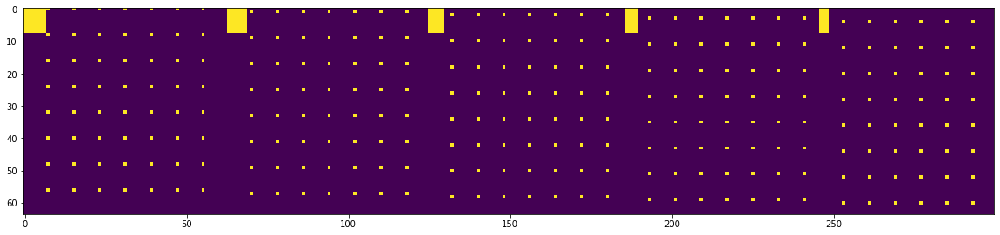

In [8]:
# all
plt.figure(figsize = figsize)
plt.imshow((xy)[figrange[0]:figrange[1], figrange[2]:figrange[3]])

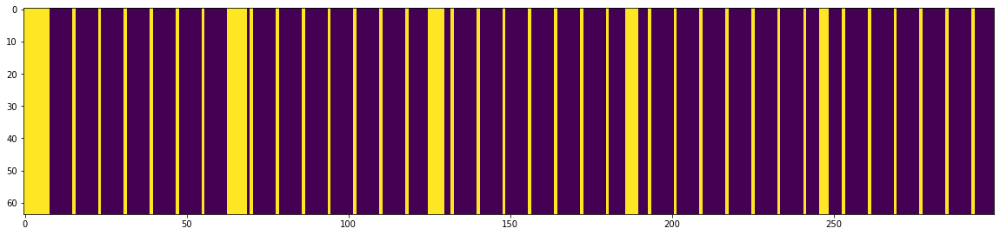

In [9]:
# all
plt.figure(figsize = figsize)
plt.imshow((xyind)[figrange[0]:figrange[1], figrange[2]:figrange[3]])

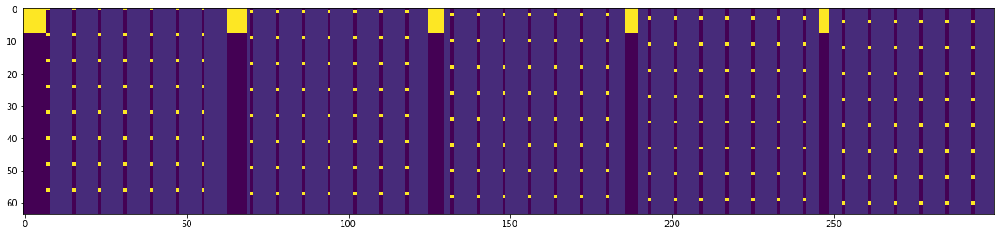

In [10]:
# all
plt.figure(figsize = figsize)
plt.imshow((xy/xyind)[figrange[0]:figrange[1], figrange[2]:figrange[3]])

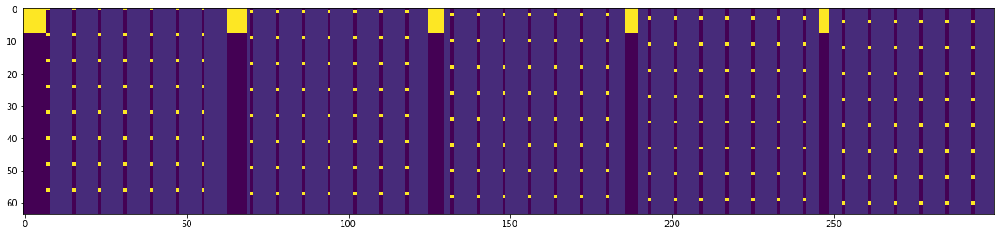

In [11]:
# all
plt.figure(figsize = figsize)
plt.imshow((xy/xyind)[figrange[0]:figrange[1], figrange[2]:figrange[3]])

In [12]:
Counter(list((xy/xyind).reshape(-1))).most_common()

[(0.9999999999999988, 64288),
 (0.9999999999999986, 21952),
 (2.8672000000000013e-96, 19600),
 (0.9999999999999989, 14112),
 (2.867200000000001e-96, 5488),
 (8.000000000000004, 2800),
 (8.000000000000002, 784)]

## Dataset

In [13]:
### One embed per query!

class GameDataset(Dataset):
    
    def __init__(self, raw_data, debug=False):
        '''
        raw_data: object returned by gen_card_data.
        '''
        super().__init__()
        self.raw_data = raw_data
        self.debug = debug
        # y
        self.query_support_size = len(self.raw_data['idx_to_query'])
        # x
        self.key_support_size = len(self.raw_data['idx_to_key'])
        
    def __len__(self):
        return self.query_support_size * self.key_support_size
    
    def __getitem__(self, idx):
        '''
        key_idx: (xy_i) * (xy.shape[1]=self.query_support_size) + (xy_j)
        '''
        x_i, y_j = idx//self.query_support_size, idx%self.query_support_size
        all_matches = list(self.raw_data['query_to_keys'].get(y_j, {}).keys())
        gt = np.zeros(self.key_support_size)
        gt[all_matches] = 1.0
        
        if self.debug:
            yj1, yj2 = self.raw_data['idx_to_query'][y_j]
            print('query\n', y_j,":", yj1, yj2, self.raw_data['idx_to_key'][yj1], self.raw_data['idx_to_key'][yj2])
            print('key\n', x_i, self.raw_data['idx_to_key'][x_i])
            print('all matches \n', [self.raw_data['idx_to_key'][m] for m in all_matches])
        
        return (
            idx, 
            torch.tensor([y_j]).long(), # query
            torch.tensor([x_i]).long(), # gt key
            torch.tensor(gt).long()     # all gt keys
        )    

game_dataset = GameDataset(raw_data=game_data, debug=True)
game_dataset[10] 
print('-----')
game_dataset[7] # 7 has zero prob of being sampled

query
 10 : 0 11 ('red', 'void') ('green', 'checkered')
key
 0 ('red', 'void')
all matches 
 []
-----
query
 7 : 0 8 ('red', 'void') ('green', 'void')
key
 0 ('red', 'void')
all matches 
 [('red', 'void'), ('green', 'void'), ('blue', 'void'), ('orange', 'void'), ('cyan', 'void'), ('magenta', 'void'), ('black', 'void'), ('yellow', 'void')]


(7,
 tensor([7]),
 tensor([0]),
 tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
         1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
         1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]))

In [14]:
class GameTestFullDataset(Dataset):
    
    def __init__(self, raw_data, debug=False):
        '''
        raw_data: object returned by gen_card_data.
        queries_with_shared_attr_only: bool.
        '''
        super().__init__()
        self.raw_data = raw_data
        self.debug = debug
        # y
        self.query_support_size = len(self.raw_data['idx_to_query'])
        # x
        self.key_support_size = len(self.raw_data['idx_to_key'])
        
    def __len__(self):
        return len(self.raw_data['idx_to_query'])
    
    def __getitem__(self, idx):
        '''
        key_idx: int. 0 to query_support_size-1
        '''
        y_j = idx
        x_i = torch.empty(1) # just a meaningless value
        all_matches = list(self.raw_data['query_to_keys'].get(y_j, {}).keys())
        gt = np.zeros(self.key_support_size)
        gt[all_matches] = 1.0

        if self.debug:
            yj1, yj2 = self.raw_data['idx_to_query'][y_j]
            print('query\n', y_j,":", yj1, yj2, self.raw_data['idx_to_key'][yj1], self.raw_data['idx_to_key'][yj2])
            print('all matches \n', [self.raw_data['idx_to_key'][m] for m in all_matches])
            
            
        return (
            idx, 
            torch.tensor([y_j]).long(), # query
            torch.tensor([x_i]).long(), # gt key
            torch.tensor(gt).long()     # all gt keys
        ) 
    
game_testdataset = GameTestFullDataset(raw_data=game_data, debug=True)
game_testdataset[10]
print('-----')
game_testdataset[7] # 7 has zero prob of being sampled

query
 10 : 0 11 ('red', 'void') ('green', 'checkered')
all matches 
 []
-----
query
 7 : 0 8 ('red', 'void') ('green', 'void')
all matches 
 [('red', 'void'), ('green', 'void'), ('blue', 'void'), ('orange', 'void'), ('cyan', 'void'), ('magenta', 'void'), ('black', 'void'), ('yellow', 'void')]


(7,
 tensor([7]),
 tensor([0]),
 tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
         1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
         1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]))

In [15]:
class GameDataModule(pl.LightningDataModule):
    
    def __init__(self, batch_size, raw_data, seen_train_xy, seen_val_xy, debug=False):
        super().__init__()
        self.batch_size = batch_size
        self.dataset = GameDataset(raw_data=raw_data, debug=debug)
#         self.testdataset = GameTestFullDataset(raw_data=raw_data, debug=debug)
        self.seen_train_xy = seen_train_xy
        self.seen_val_xy = seen_val_xy
        self.setup_samplers()
        
    def setup_samplers(self):
        self.train_sampler = WeightedRandomSampler(
            weights=self.seen_train_xy.reshape(-1), num_samples=self.batch_size, replacement=True
        ) 
        self.val_sampler = WeightedRandomSampler(
            weights=self.seen_val_xy.reshape(-1), num_samples=self.batch_size, replacement=True
        )
        
    def setup(self, stage=None):
        if stage == 'fit' or stage is None:
            self.train = self.dataset
            self.val = self.dataset
#         if stage == 'test' or stage is None:
#             self.test = self.testdataset
            
    def train_dataloader(self):
        train_loader = DataLoader(
            self.train, batch_size=self.batch_size, shuffle=False, sampler=self.train_sampler
        )
        return train_loader
    
    def val_dataloader(self):
        val_loader = DataLoader(
            self.val, batch_size=self.batch_size,  shuffle=False, sampler=self.val_sampler
        )
        return val_loader
    
#     def test_dataloader(self):
#         test_loader = DataLoader(
#             self.test, batch_size=self.batch_size, shuffle=False
#         )
#         return test_loader  

## Model Architecture

In [16]:
def construct_full_model(hparams):
    '''
    return: nn.Module.
    '''
    # embeddings
    query_embed_X = ScaledEmbedding(hparams['query_support_size'], hparams['d_model'])
    key_embed_X = ScaledEmbedding(hparams['key_support_size'], hparams['d_model'])
    embed_dropout = nn.Dropout(hparams['embed_dropout'])
    
    # full model
    model = EncoderPredictor(
        inp_query_layer = nn.Sequential(
            OrderedDict([
                ('scaled_embed', query_embed_X),
                ('embed_dropout', embed_dropout)
            ])
        ),
        inp_key_layer = nn.Sequential(
            OrderedDict([
                ('scaled_embed', key_embed_X),
                ('embed_dropout', embed_dropout)
            ])
        ),
        classifier = nn.Sequential(
            OrderedDict([   
                ('linear1', nn.Linear(2*hparams['d_model'], hparams['d_model'])),
                ('nonLinear1', nn.ReLU()),
                ('linear-out', nn.Linear(hparams['d_model'], 1)),
            ])
        ) if not hparams['dotproduct_bottleneck'] else None, 
        
        key_support_size = hparams['key_support_size'],
        d_model = hparams['d_model'],
        debug = hparams['debug'],
    )
    
    return model

In [17]:
class ScaledEmbedding(nn.Module):

    def __init__(self, V, d_model):
        super(ScaledEmbedding, self).__init__()
        self.embedding = nn.Embedding(V, d_model)
        # scale embedding to have variance 0.01
        nn.init.normal_(self.embedding.weight, mean=0., std=(0.01)**(1/2))
        self.d_model = d_model

    def forward(self, tokens):
        '''
        tokens: shape (batch_size=b, len)
        '''
        # shape (b, len, d_model)
        embedded = self.embedding(tokens) * math.sqrt(self.d_model)
        if torch.max(embedded) > 2000.:
            import pdb; pdb.set_trace()
        return embedded

In [18]:
class EncoderPredictor(nn.Module):
    
    def __init__(self, inp_query_layer, inp_key_layer, classifier, key_support_size, d_model, debug=False):
        super().__init__()
        self.inp_query_layer = inp_query_layer
        self.inp_key_layer = inp_key_layer
        self.classifier = classifier
        self.key_support_size = key_support_size
        self.d_model = d_model
        
    def forward(self, X_query, X_key, val_bool, debug=False):
        '''
        X_query: (b, 1)
        X_key: (b, 1) if test bool, else (b, num matched cards) or None.
        '''
        if X_key is not None: assert X_query.shape == X_key.shape
        if val_bool:
            return self.forward_norm_support(X_query, debug=debug)
        else:
            assert X_key is not None, 'X_key should not be None for normalizing over minibatch keys.'
            return self.forward_norm_minibatch(X_query, X_key, debug=debug)

    def forward_norm_minibatch(self, X_query, X_key, debug=False):
        b = X_query.shape[0]
        assert X_query.shape == (b, 1)
        
        # shape(b, d_model)
        query_repr = self.encode_query(X_query).squeeze(1)
        assert query_repr.shape == (b, self.d_model)
        
        # shape(b, d_model)
        key_repr = self.encode_key(X_key).squeeze(1)
        assert key_repr.shape == (b, self.d_model)

        if self.classifier:
            # shape(b, b, d_model)
            query_repr_tiled = query_repr.unsqueeze(1).expand(b, b, self.d_model)
            # shape(b, b, d_model)
            key_repr_tiled = key_repr.unsqueeze(0).expand(b, b, self.d_model)
            # shape(b, b, 2*d_model)
            query_key_concat = torch.cat([query_repr_tiled, key_repr_tiled], dim=2)
            assert query_key_concat.shape == (b, b, 2*self.d_model)
            # shape(b*b, 2*d_model)
            query_key_concat = query_key_concat.reshape(b*b, 2*self.d_model)
            # shape(b*b, 1)
            logits = self.classifier(query_key_concat)
            assert logits.shape == (b*b, 1)
            # shape(b, b)
            logits = logits.squeeze(1).reshape(b, b)
        else:
            # shape(b, b) dotproduct=logit matrix
            logits = torch.matmul(query_repr, key_repr.T)
        assert logits.shape == (b, b)
        
        # shape(b, b)
        return logits

    def forward_norm_support(self, X_query, debug=False):
        b = X_query.shape[0]
        assert X_query.shape == (b, 1)
        
        # shape(b, d_model)
        query_repr = self.encode_query(X_query).squeeze(1)
        assert query_repr.shape == (b, self.d_model)

        # shape(size(support), d_model)
        keys_repr = self.encode_all_keys()
        assert keys_repr.shape == (self.key_support_size, self.d_model)
        
        if self.classifier:
            # shape(b, size(support), d_model)
            query_repr_tiled = query_repr.unsqueeze(1).expand(b, self.key_support_size, self.d_model)
            # shape(b, size(support), d_model)
            key_repr_tiled = keys_repr.unsqueeze(0).expand(b, self.key_support_size, self.d_model)
            # shape(b, size(support), 2*d_model)
            query_key_concat = torch.cat([query_repr_tiled, key_repr_tiled], dim=2)
            # shape(b*size(support), 2*d_model)
            query_key_concat = query_key_concat.reshape(b*self.key_support_size, 2*self.d_model)
            # shape(b*size(support), 1)
            logits = self.classifier(query_key_concat)
            # shape(b, size(support))
            logits = logits.squeeze(1).reshape(b, self.key_support_size)
        else:
            # shape(b, size(support)) dotproduct=logit matrix
            logits = torch.matmul(query_repr, keys_repr.T)
        assert logits.shape == (b, self.key_support_size)
        
        # shape(b, size(support)) 
        return logits

    def encode_query(self, X):
        '''
        X: (batch_size=b,1)
        '''
        b = X.shape[0] 
        # shape(b, 1, embed_dim)
        inp_embed = self.inp_query_layer(X)
        assert inp_embed.shape == (b, 1, self.d_model)
        return inp_embed     
        
    def encode_key(self, X):
        '''
        X: (batch_size=b)
        '''
        b = X.shape[0] 
        # shape(b, 1, embed_dim)
        inp_embed = self.inp_key_layer(X) 
        assert inp_embed.shape == (b, 1, self.d_model)
        return inp_embed  

    def encode_all_keys(self):
        
        # shape(size(support), embed_dim)
        all_embed = self.inp_key_layer.scaled_embed.embedding.weight
        assert all_embed.requires_grad == True
        assert all_embed.shape == (self.key_support_size, self.d_model)
        
        return all_embed

## Loss, Metric

In [19]:
class InfoCELoss(nn.Module):
    '''
    InfoCE Loss on a (b, b) logits matrix with Temperature scaling
    '''

    def __init__(self, temperature_const=1.0):
        super().__init__()
        self.temperature_const = temperature_const
        self.CE_loss = nn.CrossEntropyLoss(reduction='sum')

    def forward(self, logits, debug=False):
        '''
        logits: shape (batch_size=b, b)
        '''
        assert logits.shape[0] == logits.shape[1]
        b = logits.shape[0]
        
        logits /= self.temperature_const
        
        labels = torch.arange(b).type_as(logits).long()
        sum_loss_per_row = self.CE_loss(logits, labels)
        sum_loss_per_col = self.CE_loss(logits.T, labels)
        
        if debug:
            print('sum_loss_per_row=',sum_loss_per_row)
            print('sum_loss_per_col=',sum_loss_per_col)

        loss = (sum_loss_per_row + sum_loss_per_col) * 0.5
        return loss


# ---------------------------    
loss_criterion = InfoCELoss(temperature_const=0.1)

logits = torch.tensor([
    [1.,2.,3.],
    [6.,7.,4.],
    [5.,8.,9.]
])
print('avg loss=',loss_criterion(logits, True))
print('-------------')
logits = torch.tensor([
    [3.,2.,3.],
    [6.,7.,4.],
    [5.,8.,9.]
])
print('avg loss=',loss_criterion(logits, True))


# ref
# sum_loss_per_row= tensor(20.0001)
# sum_loss_per_col= tensor(60.0001)
# avg loss= tensor(40.0001)
# -------------
# sum_loss_per_row= tensor(0.6933)
# sum_loss_per_col= tensor(40.0001)
# avg loss= tensor(20.3467)

sum_loss_per_row= tensor(20.0001)
sum_loss_per_col= tensor(60.0001)
avg loss= tensor(40.0001)
-------------
sum_loss_per_row= tensor(0.6933)
sum_loss_per_col= tensor(40.0001)
avg loss= tensor(20.3467)


In [20]:
class ThresholdedMetrics(nn.Module):
    
    def __init__(self, raw_data):
        '''
        tot_k: total number of candidates. e.g. 81 cards
        '''
        super().__init__()
        self.raw_data = raw_data
        self.key_support_size = len(self.raw_data['idx_to_key'])
        self.threshold = 1.0 / (self.key_support_size)
        self.softmax = nn.Softmax(dim=1)

    def breakdown_errors(self, X_query, corrects):
        '''
        X_query: shape (b,1) (if one embed per query)
        corrects: shape (b, support size)
        '''
        b = X_query.shape[0]
        assert corrects.shape == (b, self.key_support_size)
        
        X_query_list = X_query.squeeze(-1)
        wrongs = (1 - corrects).cpu().numpy()
        
        num_matched_concepts = [
             self.raw_data['query_to_keys'].get(X_query_list[batch_i].item(), {}).get(card_idx, 0)
            for batch_i in range(b) for card_idx in range(self.key_support_size)  
        ]
        
        num_matched_concepts = np.array(num_matched_concepts).reshape(b, self.key_support_size)
        assert num_matched_concepts.shape == wrongs.shape
        
        wrongs_mask = wrongs.reshape(-1).tolist()
        num_matched_concepts = num_matched_concepts.reshape(-1).tolist()

        error_count_by_num_matched_concepts = {k:0 for k in range(num_attributes)}
        total_count_by_num_matched_concepts = {k:0 for k in range(num_attributes)}
        for w,k in zip(wrongs_mask, num_matched_concepts):
            if w == 1:
                error_count_by_num_matched_concepts[k] += 1
            total_count_by_num_matched_concepts[k] += 1    

        error_counts, total_counts = {}, {}
        for k in range(num_attributes):
            err_ct = error_count_by_num_matched_concepts[k]
            tot_ct = total_count_by_num_matched_concepts[k]
            error_counts[f'error_rate_for_{k}_matched_concepts'] = 0 if tot_ct == 0 else (err_ct *1.0 / tot_ct)
            total_counts[f'total_count_for_{k}_matched_concepts'] = tot_ct

        return {**error_counts, **total_counts}    
    
    def forward(self, X_query, logits, X_keys, full_test_bool=False, breakdown_errors_bool=False, debug=False):
        b = X_query.shape[0]
        assert X_query.shape == (b, 1)
        b, key_support_size = logits.shape
        assert key_support_size == self.key_support_size
        assert logits.shape == X_keys.shape
        
        if full_test_bool:
            # filter down to query cards with >0 true matches
            queryIdxs_with_nonzero_matches = list(self.raw_data['query_to_keys'].keys())
            X_query_flat = X_query.squeeze(-1)
            fil = torch.stack([(X_query_flat == qId) for qId in queryIdxs_with_nonzero_matches], dim=1).any(dim=1)
            assert fil.shape == (b, )
            
            # queries with shared attributes
            fil_metrics = self.compute_metrics(X_query[fil], logits[fil], X_keys[fil], breakdown_errors_bool, debug)
            fil_metrics = {'nonNullQueries_'+k:fil_metrics[k] for k in fil_metrics}
            
            # queries without shared attributes
            not_fil = torch.logical_not(fil)
            not_fil_metrics = self.compute_metrics(X_query[not_fil], logits[not_fil], X_keys[not_fil], breakdown_errors_bool, debug)
            not_fil_metrics = {'NullQueries_'+k:not_fil_metrics[k] for k in not_fil_metrics}
            
            # all queries
            all_metrics = self.compute_metrics(X_query, logits, X_keys, breakdown_errors_bool, debug)
            
            return {**fil_metrics, **not_fil_metrics, **all_metrics}
        else:
            return self.compute_metrics(X_query, logits, X_keys, breakdown_errors_bool, debug)
    
    def compute_metrics(self, X_query, logits, X_keys, breakdown_errors_bool=False, debug=False):
        '''
        X_query: shape (b,1) (if one embed per query)
        logits: shape (b, support size)
        X_keys: shape (b, support size). value 1.0 at where card matches. value 0 otherwise.
        '''
        b, key_support_size = logits.shape
        
        # model predictions, shape (b, support size)
        binary_predictions = (self.softmax(logits) >= self.threshold).type(torch.float)
        # ground truth, shape (b, support size)
        gt = X_keys
        # correct predictions, shape (b, support size)
        corrects = (binary_predictions == gt).type(torch.float)
        
        # accuracy, computed per query, average across queries
        # (b,)
        accuracy_row = torch.sum(corrects, dim=1) / key_support_size
        # scalar
        accuracy_meanrows = torch.mean(accuracy_row)
        # accuracy, computed per query-key, average across all
        accuracy_all = torch.sum(corrects) / (b * key_support_size)
        
        # precision, computed per query, average across queries
        # (b,)
        precision_row = torch.sum((corrects * binary_predictions), dim=1) / torch.sum(binary_predictions, dim=1)
        # scalar
        precision_meanrows = torch.mean(precision_row)
        # precision, computed per query-key, average across all
        precision_all = torch.sum((corrects * binary_predictions)) / torch.sum(binary_predictions)

        # recall, computed per query, average across queries
        # (b,)
        recall_row = torch.sum((corrects * gt), dim=1) / torch.sum(gt, dim=1)
        # scalar
        recall_meanrows = torch.mean(recall_row)
        # recall, computed per query-key, average across all
        recall_all = torch.sum((corrects * gt)) / torch.sum(gt)
        
        # f1, computed per query, average across queries
        # (b,)
        f1_row = 2 * (precision_row * recall_row) / (precision_row + recall_row)
        # scalar
        f1_meanrows = torch.mean(f1_row)
        # f1, computed per query-key, average across all
        f1_all = (precision_all * recall_all) / (precision_all + recall_all)
        
        if breakdown_errors_bool:
            error_breakdown_by_num_matched_concepts = self.breakdown_errors(X_query, corrects)
        else:
            error_breakdown_by_num_matched_concepts = {} 
            
        if debug:
            print('####################################################')
            print('Metrics Per Query:')
            print('accuracy_rows', accuracy_row)
            print('precision_row', precision_row)
            print('recall_row', recall_row)
            print('f1_row', f1_row)
            print('####################################################')
            print('Metrics Averaged Across Queries')
            print('accuracy_meanrows', accuracy_meanrows)
            print('precision_meanrows', precision_meanrows)
            print('recall_meanrows', recall_meanrows)
            print('f1_meanrows', f1_meanrows)
            print('####################################################')
            print('Metrics Averaged Across All Query-Key Pairs:')
            print('accuracy_all', accuracy_all)
            print('precision_all', precision_all)
            print('recall_all', recall_all)
            print('f1_all', f1_all)
            print('####################################################')
            print('error_breakdown', error_breakdown_by_num_matched_concepts)
            
        metrics = {
            'accuracy_by_Query': accuracy_meanrows,
            'precision_by_Query': precision_meanrows,
            'recall_by_Query': recall_meanrows,
            'f1_by_Query': f1_meanrows,
            'accuracy_by_QueryKey': accuracy_all,
            'precision_by_QueryKey': precision_all,
            'recall_by_QueryKey': recall_all,
            'f1_by_QueryKey': f1_all
        }
        metrics = {
            **metrics, **error_breakdown_by_num_matched_concepts
        }
        return metrics


def test_metric_module():
    key_support_size=3
    thresh=1./key_support_size

    m_f = ThresholdedMetrics(raw_data=game_data)
    m_f.key_support_size = 3

    logits = torch.tensor(
        [
            [thresh, thresh, thresh],
            [thresh, thresh, thresh],
            [thresh, thresh, thresh]
        ]
    )
    X_keys = torch.tensor(
        [
            [1,0,0],
            [0,1,0],
            [1,1,1]
        ]
    )

    print(m_f(None, logits, X_keys, debug=True))
    print('----------------------------------------------')
    
    logits = torch.tensor(
        [
            [0.4, 0.2, 0.4],
            [thresh, thresh, thresh],
            [thresh, thresh, thresh]
        ]
    )
    X_keys = torch.tensor(
        [
            [1,0,0],
            [0,1,0],
            [1,1,1]
        ]
    )

    print(m_f(None, logits, X_keys, debug=True))
    
    
# test_metric_module()

# reference output
# accuracy_row tensor([0.3333, 0.3333, 1.0000])
# precision_row tensor([0.3333, 0.3333, 1.0000])
# recall_row tensor([1., 1., 1.])
# f1_row tensor([0.5000, 0.5000, 1.0000])
# {'accuracy': tensor(0.5556), 'precision': tensor(0.5556), 'recall': tensor(1.), 'f1': tensor(0.6667)}
# ----------------------------------------------
# accuracy_row tensor([0.6667, 0.3333, 1.0000])
# precision_row tensor([0.5000, 0.3333, 1.0000])
# recall_row tensor([1., 1., 1.])
# f1_row tensor([0.6667, 0.5000, 1.0000])
# {'accuracy': tensor(0.6667), 'precision': tensor(0.6111), 'recall': tensor(1.), 'f1': tensor(0.7222)}

## Training Module

In [21]:
# Build Lightning Module
# https://colab.research.google.com/drive/1F_RNcHzTfFuQf-LeKvSlud6x7jXYkG31#scrollTo=UIXLW8CO-W8w

thresholded_metrics = ThresholdedMetrics(raw_data=game_data)

class TrainModule(pl.LightningModule):
    
    def __init__(self, hparams, gt_distributions):
        '''
        hparams: dictionary of hyperparams
        gt_distributions: dictionary that stores the groundtruth 'xy', 'xyind' distributions.
                         each is a key_support_size by query_support_size matrix that sums up to 1.0
        '''
        super().__init__()
        self.hparams = hparams
        self.debug = hparams['debug']
        self.save_hyperparameters()
        
        self.model = construct_full_model(hparams)
        self.loss_criterion = InfoCELoss(temperature_const=self.hparams['loss_temperature_const'])
        self.metrics = thresholded_metrics

        self.key_support_size = self.hparams['key_support_size']
        self.query_support_size = self.hparams['query_support_size']
        
        # for pulling model p(x,y) and p(x,y)/[pxpy]
        self.populate_logits_matrix = hparams['populate_logits_matrix']
        if self.populate_logits_matrix:
            self.register_buffer(
                name='model_logits_matrix',
                tensor= torch.zeros(hparams['key_support_size'], hparams['query_support_size'])
            )
            self.setup_gt_distributions(gt_distributions)
        
    def log_metrics(self, metrics_dict):
        for k, v in metrics_dict.items():
            self.log(k, v)
            
    def get_max_memory_alloc(self):
        devices_max_memory_alloc = {}
        for i in range(torch.cuda.device_count()):
            device = torch.device(f'cuda:{i}')
            devices_max_memory_alloc[device] = torch.cuda.max_memory_allocated(device) / 1e6
            torch.cuda.reset_max_memory_allocated(device)
        return devices_max_memory_alloc
    
    ###################################################
    
    def forward(self, X_query, X_key, X_keys, val_bool, full_test_bool=False, debug=False):
        '''
        X_query: (b, 1)
        X_key: (b, 1)
        X_keys: (b, key_support_size) 1s and 0s.
        test_bool: boolean.
        '''
        batch_size = X_query.shape[0]
        
        # ToDo batch_size_b
        
        # shape (b,support) if test_bool else (b, b)
        logits = self.model(X_query, X_key, val_bool, debug=debug)
        # scalar
        loss = None if val_bool else self.loss_criterion(logits, debug=debug)
        # scalar
        metrics = self.metrics(
            logits=logits, X_keys=X_keys, X_query=X_query, 
            debug=debug, full_test_bool=full_test_bool, breakdown_errors_bool=True, 
        ) if val_bool else None

        return logits, loss, metrics
    
    ###################################################
    
    def setup_gt_distributions(self, gt_distributions):
        '''called once during init to setup groundtruth distributions'''
        assert gt_distributions['xy'].shape == gt_distributions['xyind'].shape
        
        # (key_support_size, query_support_size)
        self.register_buffer(
            name='gt_xy',
            tensor= torch.tensor(gt_distributions['xy'])
        )        
        # (key_support_size, query_support_size)
        self.register_buffer(
            name='gt_xyind',
            tensor= torch.tensor(gt_distributions['xyind'])
        )        
        # (key_support_size, query_support_size)
        self.register_buffer(
            name='gt_xy_div_xyind',
            tensor= self.gt_xy/self.gt_xyind
        )
        # scalar
        self.register_buffer(
            name='one',
            tensor= torch.tensor([1.0])
        )   
        # scalar
        self.register_buffer(
            name='gt_mi',
            tensor= self.compute_mutual_information(self.gt_xy, self.gt_xy_div_xyind)
        ) 
   
    
    def populate_model_logits_matrix(self, query_idx, logits):
        '''
        query_idx: shape (b,)
        logits: shape(b, key_support_size)
        '''  
        assert query_idx.shape[0] == logits.shape[0]
        b = query_idx.shape[0]
        assert logits.shape[1] == self.key_support_size
        for i in range(b):
            self.model_logits_matrix[:,query_idx[i]] = logits[i]
    
    def compute_mutual_information(self, xy, xy_div_xyind):
        '''
        xy: p(xy). shape(b, key_support_size)
        xy_div_xyind_hat: p(xy)/[p(x)(y)].
                          shape(b, key_support_size)
        '''
        assert torch.isclose(torch.sum(xy), self.one.type_as(xy))
        assert xy.shape == xy_div_xyind.shape == (
            self.key_support_size, self.query_support_size
        )
        pmi = torch.log(xy_div_xyind)
        mi = torch.sum(xy * pmi)
        return mi
    
    def pull_model_distribution(self, debug=True):

        # sanity check
        sum_logits = torch.sum(self.model_logits_matrix)
        assert sum_logits != 0.0
        
        if debug:
            print('Sum of model logits matrix\n', sum_logits)
            print('Number of model logits with zero value\n', torch.sum(self.model_logits_matrix == 0.0)) 
            print('Variance of model logits\n', torch.var(self.model_logits_matrix))
        
        # estimate the full distribution
        # hat( k * pxy/(pxpy)
        f = torch.exp(self.model_logits_matrix)
        # hat( k * pxy)
        xy_hat = f * self.gt_xyind
        # hat( pxy)
        xy_hat = (xy_hat / torch.sum(xy_hat))
        
        # estimate exp(pmi)
        # hat(k)
        k_hat = torch.sum(f) / torch.sum(self.gt_xy_div_xyind)
        # hat(pxy/(pxpy)
        xy_div_xyind_hat = (f / k_hat)
        if torch.any(torch.isnan(xy_div_xyind_hat)):
            import pdb; pdb.set_trace()
        
        # estimate MI
        # scalar
        mi_hat = self.compute_mutual_information(xy_hat, xy_div_xyind_hat)
        # scalar
        mi_gt_minus_hat = self.gt_mi - mi_hat
        
        # estimate KL divergence
        kl_div_val = F.kl_div(torch.log(xy_hat), self.gt_xy)

        # estimate ranks
        xy_hat = xy_hat.detach().cpu().numpy()
        xy_div_xyind_hat = xy_div_xyind_hat.detach().cpu().numpy()
        # hat(pxy rank)
        xy_hat_rank = np.linalg.matrix_rank(xy_hat)
        # hat(pxy/(pxpy rank)
        xy_div_xyind_hat_rank = np.linalg.matrix_rank(xy_div_xyind_hat) 
        
        pulled_distribution_results = {
            'xy_hat':xy_hat,
            'xy_div_xyind_hat':xy_div_xyind_hat,
            'xy_hat_rank':xy_hat_rank,
            'xy_div_xyind_hat_rank':xy_div_xyind_hat_rank,
            'mi_hat':mi_hat,
            'mi_gt_minus_hat':mi_gt_minus_hat,
            'kl_div':kl_div_val
        }
        
        return pulled_distribution_results

    ###################################################
    
    def training_step(self, batch, batch_nb):
        
        # _, (b, 1), (b, 1), (b, support size)
        _, X_query, X_key, X_keys = batch
        # scalar
        _, loss, _ = self(X_query, X_key, None, val_bool=False, debug=self.debug)
        # dict
        _, _, metrics = self(X_query, None, X_keys, val_bool=True, debug=self.debug)
        
        if self.debug:
            print('-----------------------------')
            print('train step')
            print(Counter(torch.sum(X_keys, dim=1).tolist()).most_common())
            print(
                'X_query:',X_query[0], '\nX_key:',
                X_key[0], '\nloss:', loss, '\nmetrics:\n', [(m,metrics[m]) for m in metrics]
            )
        
        # log
        step_metrics = {**{'train_loss': loss}, **{'train_'+m:metrics[m] for m in metrics}}
        self.log_metrics(step_metrics)
        return loss
    
    def validation_step(self, batch, batch_nb):
        
        # _, (b, 1), (b, 1), (b, support size)
        _, X_query, X_key, X_keys = batch
        _, loss, _ = self(X_query, X_key, None, val_bool=False, debug=self.debug)
        _, _, metrics = self(X_query, None, X_keys, val_bool=True, debug=self.debug)
        
        if self.debug:
            print('-----------------------------')
            print('validation step')
            print(Counter(torch.sum(X_keys, dim=1).tolist()).most_common())
            print(
                'X_query:',X_query[0], '\X_key:',
                X_key[0], '\nloss:', loss, '\nmetrics:', [(m,metrics[m]) for m in metrics]
            )
            
        # log 
        step_metrics = {**{'val_loss': loss}, **{'val_'+m:metrics[m] for m in metrics}}
        devices_max_memory_alloc = self.get_max_memory_alloc()
        for device, val in devices_max_memory_alloc.items():
            step_metrics[f'step_max_memory_alloc_cuda:{device}'] = val
        self.log_metrics(step_metrics)
        return step_metrics
    
    def test_step(self, batch, batch_nb):
        
        # (b,1), (b,1), _, (b, support size)
        query_idx, X_query, _, X_keys = batch
        
        # compute scores for all keys
        # shape(b, key_support_size), _, dictionary
        logits, _, metrics = self(X_query, None, X_keys, val_bool=True, full_test_bool=True, debug=self.debug)
        
        if self.populate_logits_matrix:
            self.populate_model_logits_matrix(query_idx, logits)
        
        # log
        step_metrics = {'test_'+m:metrics[m] for m in metrics}
        self.log_metrics(step_metrics)
        return step_metrics 
    
    ###################################################
    
    def aggregate_metrics_at_epoch_end(self, outputs):
        # log metrics
        epoch_metrics = {}
        metric_names = outputs[0].keys()
        for m in metric_names:
            if not ('max_memory_alloc_cuda' in m or 'count' in m or 'rate' in m):
                epoch_metrics['avg_'+m] = torch.stack([x[m] for x in outputs]).mean()
            elif '_matched_concepts' in m:
                epoch_metrics['avg_'+m] = np.mean([x[m] for x in outputs])
        self.log_metrics(epoch_metrics)
        return epoch_metrics         
    
    def validation_epoch_end(self, outputs):
        averaged_metrics = self.aggregate_metrics_at_epoch_end(outputs)
        return averaged_metrics
    
    def test_epoch_end(self, outputs):        
        averaged_metrics = self.aggregate_metrics_at_epoch_end(outputs)
        try:
            assert 'avg_test_error_rate_for_1_matched_concepts' in averaged_metrics
        except:
            import pdb; pdb.set_trace()
            
        return averaged_metrics
    
    ###################################################
    
    def configure_optimizers(self):
        opt = torch.optim.Adam(
            params=self.model.parameters(),
            lr=self.hparams['lr'],
            betas=(
                self.hparams['adam_beta1'], self.hparams['adam_beta2']),
            eps=self.hparams['adam_epsilon'],
            weight_decay=self.hparams['adam_weight_decay']
        )
        return opt

## hparams, init train module

In [22]:
# W&B References
# https://docs.wandb.com/library/integrations/lightning
# colab example
# https://colab.research.google.com/github/wandb/examples/blob/master/colabs/pytorch-lightning/Supercharge_your_Training_with_Pytorch_Lightning_%2B_Weights_%26_Biases.ipynb
# step by step guide
# https://wandb.ai/cayush/pytorchlightning/reports/Use-Pytorch-Lightning-with-Weights-Biases--Vmlldzo2NjQ1Mw


# Distributed Weighted Sampler
# https://discuss.pytorch.org/t/how-to-use-my-own-sampler-when-i-already-use-distributedsampler/62143/8
# https://github.com/PyTorchLightning/pytorch-lightning/discussions/3716#discussioncomment-238296

# torch lightning -- how sampler is added or removed
# https://pytorch-lightning.readthedocs.io/en/stable/multi_gpu.html?highlight=sampler#remove-samplers


hparams = {
    # game difficulty
    'num_attributes': num_attributes,
    'num_attr_vals': num_attr_vals,
    # distribution
    'distribution_epsilon': distribution_epsilon,
    'xy_size': xy.shape,
    # 
    'batch_size': 128,
    # Arch
    'key_support_size': len(game_data['idx_to_key']),
    'query_support_size': len(game_data['idx_to_query']),
    # embedding
    'd_model': 8,
    'embed_dropout': 0.0,
    # final prediction
    'dotproduct_bottleneck':True,
    # loss
    'loss_temperature_const': 1.0,
    # optimizer
    'lr': 0.001,
    'adam_beta1': 0.9,
    'adam_beta2': 0.999,
    'adam_epsilon': 1e-08,
    'warmup_steps': 12000,
    'adam_weight_decay':0,
    'gradient_clip_val': 0,
    # others
    'debug':False,
    'populate_logits_matrix': True
}

pl.seed_everything(42)

# model
trainmodule =  TrainModule(hparams, gt_distributions={'xy':xy, 'xyind':xyind})# , raw_data=game_data)
model_summary = pl.core.memory.ModelSummary(trainmodule, mode='full')
print(model_summary,'\n')

# data
game_datamodule = GameDataModule(
    batch_size = hparams['batch_size'],
    raw_data = game_data,
    seen_train_xy = xy,
    seen_val_xy = xy,
    debug=hparams['debug']
)

# logger
run_name = 'CardGame:OR;attr{}-val{};epsilon{};d_model{};params{}K-dotproduct'.format(num_attributes, num_attr_vals, str(distribution_epsilon), hparams['d_model'], round(max(model_summary.param_nums)/1000,2))
project_name = 'ContrastiveLearning-cardgame-Scaling'
wd_logger = WandbLogger(name=run_name, project=project_name)
print('RUN NAME :\n', run_name)
# check point path
ckpt_dir_PATH = os.path.join('checkpoints', project_name, run_name)

Global seed set to 42


   | Name                                         | Type               | Params
-------------------------------------------------------------------------------------
0  | model                                        | EncoderPredictor   | 16.6 K
1  | model.inp_query_layer                        | Sequential         | 16.1 K
2  | model.inp_query_layer.scaled_embed           | ScaledEmbedding    | 16.1 K
3  | model.inp_query_layer.scaled_embed.embedding | Embedding          | 16.1 K
4  | model.inp_query_layer.embed_dropout          | Dropout            | 0     
5  | model.inp_key_layer                          | Sequential         | 512   
6  | model.inp_key_layer.scaled_embed             | ScaledEmbedding    | 512   
7  | model.inp_key_layer.scaled_embed.embedding   | Embedding          | 512   
8  | loss_criterion                               | InfoCELoss         | 0     
9  | loss_criterion.CE_loss                       | CrossEntropyLoss   | 0     
10 | metrics                      

## Run Training

In [ ]:
# checkpoints
os.makedirs(ckpt_dir_PATH, exist_ok=True)
checkpoint_callback = ModelCheckpoint(
    monitor='avg_val_accuracy_by_Query',
    dirpath=ckpt_dir_PATH,
    filename='{epoch:02d}-{val_loss:.2f}',
    save_top_k=6,
    save_last=True,
    mode='max',
)

# trainer
trainer = pl.Trainer(
    gpus=[1], 
    min_epochs=2, max_epochs=60000, 
    precision=32, 
    logger=wd_logger,
    log_gpu_memory='all',
    weights_summary = 'full',
    gradient_clip_val=hparams['gradient_clip_val'],
    replace_sampler_ddp=False,
    callbacks=[checkpoint_callback]
)

#fit
with torch.autograd.detect_anomaly():
    trainer.fit(trainmodule, game_datamodule)
    
wandb.save(os.path.join(ckpt_dir_PATH, 'last.ckpt'))

GPU available: True, used: True
TPU available: None, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
<ipython-input-23-e10bd6447acb>:26: UserWarning: Anomaly Detection has been enabled. This mode will increase the runtime and should only be enabled for debugging.
  with torch.autograd.detect_anomaly():


wandb: WARNING Serializing object of type ndarray that is 1032304 bytes
wandb: WARNING Serializing object of type ndarray that is 1032304 bytes

   | Name                                         | Type               | Params
-------------------------------------------------------------------------------------
0  | model                                        | EncoderPredictor   | 16.6 K
1  | model.inp_query_layer                        | Sequential         | 16.1 K
2  | model.inp_query_layer.scaled_embed           | ScaledEmbedding    | 16.1 K
3  | model.inp_query_layer.scaled_embed.embedding | Embedding          | 16.1 K
4  | model.inp_query_layer.embed_dropout          | Dropout            | 0     
5  | model.inp_key_layer                          | Sequential         | 512   
6  | model.inp_key_layer.scaled_embed             | ScaledEmbedding    | 512   
7  | model.inp_key_layer.scaled_embed.embedding   | Embedding          | 512   
8  | loss_criterion                              

Validation sanity check:   0%|          | 0/1 [00:00<?, ?it/s]

/home/user/miniconda/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:50: UserWarning: The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  warnings.warn(*args, **kwargs)


Epoch 0:  50%|█████     | 1/2 [00:00<00:00,  5.68it/s, loss=621, v_num=o420]
Validating: 0it [00:00, ?it/s]
Validating:   0%|          | 0/1 [00:00<?, ?it/s]

/home/user/miniconda/lib/python3.8/site-packages/torch/cuda/memory.py:231: FutureWarning: torch.cuda.reset_max_memory_allocated now calls torch.cuda.reset_peak_memory_stats, which resets /all/ peak memory stats.
  warnings.warn(
/home/user/miniconda/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:50: UserWarning: The validation_epoch_end should not return anything as of 9.1. To log, use self.log(...) or self.write(...) directly in the LightningModule
  warnings.warn(*args, **kwargs)
/home/user/miniconda/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:50: UserWarning: The dataloader, train dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  warnings.warn(*args, **kwargs)



Epoch 1:  50%|█████     | 1/2 [00:00<00:00,  7.89it/s, loss=621, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2:  50%|█████     | 1/2 [00:00<00:00,  8.79it/s, loss=623, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3:  50%|█████     | 1/2 [00:00<00:00,  8.71it/s, loss=625, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4:  50%|█████     | 1/2 [00:00<00:00,  8.40it/s, loss=625, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5:  50%|█████     | 1/2 [00:00<00:00,  8.36it/s, loss=624, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6:  50%|█████     | 1/2 [00:00<00:00,  8.11it/s, loss=624, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7:  50%|█████     | 1/2 [00:00<00:00,  6.67it/s, loss=624, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8:  50%|█████     | 1/2 [00:00<00:00,  6.67it/s, loss=624, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9:  50%|█████     | 1/2 [00:00<00:00,  7.33it/s, loss=624, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10:  50%|█████     | 

Epoch 37:  50%|█████     | 1/2 [00:00<00:00,  7.20it/s, loss=623, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 38:  50%|█████     | 1/2 [00:00<00:00,  7.46it/s, loss=623, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 39:  50%|█████     | 1/2 [00:00<00:00,  8.17it/s, loss=623, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 40:  50%|█████     | 1/2 [00:00<00:00,  7.69it/s, loss=623, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 41:  50%|█████     | 1/2 [00:00<00:00,  9.05it/s, loss=623, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 42:  50%|█████     | 1/2 [00:00<00:00,  8.88it/s, loss=622, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 43:  50%|█████     | 1/2 [00:00<00:00,  7.60it/s, loss=622, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 44:  50%|█████     | 1/2 [00:00<00:00,  7.10it/s, loss=622, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 45:  50%|█████     | 1/2 [00:00<00:00,  8.70it/s, loss=622, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 46:  50%|████

Epoch 72:  50%|█████     | 1/2 [00:00<00:00,  7.86it/s, loss=621, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 73:  50%|█████     | 1/2 [00:00<00:00,  8.71it/s, loss=621, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 74:  50%|█████     | 1/2 [00:00<00:00,  8.35it/s, loss=621, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 75:  50%|█████     | 1/2 [00:00<00:00,  8.65it/s, loss=620, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 76:  50%|█████     | 1/2 [00:00<00:00,  7.66it/s, loss=620, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 77:  50%|█████     | 1/2 [00:00<00:00,  7.26it/s, loss=620, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 78:  50%|█████     | 1/2 [00:00<00:00,  8.12it/s, loss=620, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 79:  50%|█████     | 1/2 [00:00<00:00,  7.72it/s, loss=619, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 80:  50%|█████     | 1/2 [00:00<00:00,  8.51it/s, loss=619, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 81:  50%|████

Epoch 107:  50%|█████     | 1/2 [00:00<00:00,  8.46it/s, loss=617, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 108:  50%|█████     | 1/2 [00:00<00:00,  7.69it/s, loss=617, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 109:  50%|█████     | 1/2 [00:00<00:00,  8.80it/s, loss=617, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 110:  50%|█████     | 1/2 [00:00<00:00,  7.16it/s, loss=617, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 111:  50%|█████     | 1/2 [00:00<00:00,  7.53it/s, loss=617, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 112:  50%|█████     | 1/2 [00:00<00:00,  7.86it/s, loss=617, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 113:  50%|█████     | 1/2 [00:00<00:00,  8.45it/s, loss=616, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 114:  50%|█████     | 1/2 [00:00<00:00,  8.70it/s, loss=616, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 115:  50%|█████     | 1/2 [00:00<00:00,  7.72it/s, loss=616, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 116:

Epoch 143:  50%|█████     | 1/2 [00:00<00:00,  8.34it/s, loss=615, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 144:  50%|█████     | 1/2 [00:00<00:00,  7.38it/s, loss=614, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 145:  50%|█████     | 1/2 [00:00<00:00,  7.61it/s, loss=614, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 146:  50%|█████     | 1/2 [00:00<00:00,  8.70it/s, loss=614, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 147:  50%|█████     | 1/2 [00:00<00:00,  8.67it/s, loss=614, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 148:  50%|█████     | 1/2 [00:00<00:00,  7.76it/s, loss=614, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 149: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, loss=614, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 150:  50%|█████     | 1/2 [00:00<00:00,  7.67it/s, loss=614, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 151:  50%|█████     | 1/2 [00:00<00:00,  7.66it/s, loss=614, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 152:

Epoch 177:  50%|█████     | 1/2 [00:00<00:00,  7.31it/s, loss=612, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 178:  50%|█████     | 1/2 [00:00<00:00,  8.70it/s, loss=611, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 179:  50%|█████     | 1/2 [00:00<00:00,  7.24it/s, loss=611, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 180:  50%|█████     | 1/2 [00:00<00:00,  7.63it/s, loss=611, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 181:  50%|█████     | 1/2 [00:00<00:00,  8.66it/s, loss=610, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 182:  50%|█████     | 1/2 [00:00<00:00,  7.56it/s, loss=610, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 183:  50%|█████     | 1/2 [00:00<00:00,  8.63it/s, loss=610, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 184:  50%|█████     | 1/2 [00:00<00:00,  8.56it/s, loss=610, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 185:  50%|█████     | 1/2 [00:00<00:00,  8.13it/s, loss=609, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 186:

Epoch 213:  50%|█████     | 1/2 [00:00<00:00,  8.68it/s, loss=605, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 214:  50%|█████     | 1/2 [00:00<00:00,  8.28it/s, loss=604, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 215:  50%|█████     | 1/2 [00:00<00:00,  6.43it/s, loss=604, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 216:  50%|█████     | 1/2 [00:00<00:00,  8.67it/s, loss=604, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 217:  50%|█████     | 1/2 [00:00<00:00,  8.35it/s, loss=604, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 218:  50%|█████     | 1/2 [00:00<00:00,  8.35it/s, loss=604, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 219:  50%|█████     | 1/2 [00:00<00:00,  6.70it/s, loss=604, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 220:  50%|█████     | 1/2 [00:00<00:00,  8.30it/s, loss=604, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 221:  50%|█████     | 1/2 [00:00<00:00,  6.73it/s, loss=604, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 222:

Epoch 247:  50%|█████     | 1/2 [00:00<00:00,  7.55it/s, loss=599, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 248:  50%|█████     | 1/2 [00:00<00:00,  6.77it/s, loss=599, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 249: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, loss=599, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 250:  50%|█████     | 1/2 [00:00<00:00,  7.24it/s, loss=599, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 251:  50%|█████     | 1/2 [00:00<00:00,  7.50it/s, loss=598, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 252:  50%|█████     | 1/2 [00:00<00:00,  7.52it/s, loss=598, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 253:  50%|█████     | 1/2 [00:00<00:00,  7.03it/s, loss=598, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 254:  50%|█████     | 1/2 [00:00<00:00,  7.28it/s, loss=598, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 255:  50%|█████     | 1/2 [00:00<00:00,  8.10it/s, loss=597, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 256:

Epoch 281:  50%|█████     | 1/2 [00:00<00:00,  8.06it/s, loss=591, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 282:  50%|█████     | 1/2 [00:00<00:00,  8.08it/s, loss=590, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 283:  50%|█████     | 1/2 [00:00<00:00,  8.77it/s, loss=591, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 284:  50%|█████     | 1/2 [00:00<00:00,  6.97it/s, loss=590, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 285:  50%|█████     | 1/2 [00:00<00:00,  7.54it/s, loss=590, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 286:  50%|█████     | 1/2 [00:00<00:00,  8.42it/s, loss=589, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 287:  50%|█████     | 1/2 [00:00<00:00,  8.62it/s, loss=588, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 288:  50%|█████     | 1/2 [00:00<00:00,  7.42it/s, loss=588, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 289:  50%|█████     | 1/2 [00:00<00:00,  7.20it/s, loss=588, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 290:

Epoch 315:  50%|█████     | 1/2 [00:00<00:00,  7.13it/s, loss=581, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 316:  50%|█████     | 1/2 [00:00<00:00,  8.75it/s, loss=582, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 317:  50%|█████     | 1/2 [00:00<00:00,  6.78it/s, loss=581, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 318:  50%|█████     | 1/2 [00:00<00:00,  7.63it/s, loss=581, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 319:  50%|█████     | 1/2 [00:00<00:00,  7.28it/s, loss=581, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 320:  50%|█████     | 1/2 [00:00<00:00,  8.42it/s, loss=580, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 321:  50%|█████     | 1/2 [00:00<00:00,  7.78it/s, loss=580, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 322:  50%|█████     | 1/2 [00:00<00:00,  6.76it/s, loss=579, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 323:  50%|█████     | 1/2 [00:00<00:00,  7.54it/s, loss=579, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 324:

Epoch 350:  50%|█████     | 1/2 [00:00<00:00,  7.86it/s, loss=571, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 351:  50%|█████     | 1/2 [00:00<00:00,  8.21it/s, loss=570, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 352:  50%|█████     | 1/2 [00:00<00:00,  7.77it/s, loss=569, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 353:  50%|█████     | 1/2 [00:00<00:00,  8.24it/s, loss=569, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 354:  50%|█████     | 1/2 [00:00<00:00,  7.20it/s, loss=569, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 355:  50%|█████     | 1/2 [00:00<00:00,  7.66it/s, loss=568, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 356:  50%|█████     | 1/2 [00:00<00:00,  7.29it/s, loss=567, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 357:  50%|█████     | 1/2 [00:00<00:00,  8.35it/s, loss=567, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 358:  50%|█████     | 1/2 [00:00<00:00,  8.25it/s, loss=567, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 359:

Epoch 384:  50%|█████     | 1/2 [00:00<00:00,  6.80it/s, loss=557, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 385:  50%|█████     | 1/2 [00:00<00:00,  7.64it/s, loss=557, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 386:  50%|█████     | 1/2 [00:00<00:00,  7.56it/s, loss=557, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 387:  50%|█████     | 1/2 [00:00<00:00,  7.23it/s, loss=556, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 388:  50%|█████     | 1/2 [00:00<00:00,  7.90it/s, loss=556, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 389:  50%|█████     | 1/2 [00:00<00:00,  7.21it/s, loss=555, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 390:  50%|█████     | 1/2 [00:00<00:00,  8.52it/s, loss=555, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 391:  50%|█████     | 1/2 [00:00<00:00,  7.92it/s, loss=555, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 392:  50%|█████     | 1/2 [00:00<00:00,  6.92it/s, loss=554, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 393:

Epoch 418:  50%|█████     | 1/2 [00:00<00:00,  7.67it/s, loss=540, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 419:  50%|█████     | 1/2 [00:00<00:00,  8.09it/s, loss=540, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 420:  50%|█████     | 1/2 [00:00<00:00,  7.77it/s, loss=539, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 421:  50%|█████     | 1/2 [00:00<00:00,  8.07it/s, loss=539, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 422:  50%|█████     | 1/2 [00:00<00:00,  8.28it/s, loss=539, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 423:  50%|█████     | 1/2 [00:00<00:00,  8.24it/s, loss=539, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 424:  50%|█████     | 1/2 [00:00<00:00,  7.23it/s, loss=539, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 425:  50%|█████     | 1/2 [00:00<00:00,  7.03it/s, loss=539, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 426:  50%|█████     | 1/2 [00:00<00:00,  8.22it/s, loss=538, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 427:

Validating: 0it [00:00, ?it/s]
Epoch 452:  50%|█████     | 1/2 [00:00<00:00,  7.60it/s, loss=526, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 453:  50%|█████     | 1/2 [00:00<00:00,  7.73it/s, loss=526, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 454:  50%|█████     | 1/2 [00:00<00:00,  7.55it/s, loss=526, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 455:  50%|█████     | 1/2 [00:00<00:00,  7.18it/s, loss=526, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 456:  50%|█████     | 1/2 [00:00<00:00,  6.24it/s, loss=525, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 457:  50%|█████     | 1/2 [00:00<00:00,  7.25it/s, loss=525, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 458:  50%|█████     | 1/2 [00:00<00:00,  7.94it/s, loss=524, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 459:  50%|█████     | 1/2 [00:00<00:00,  6.94it/s, loss=524, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 460:  50%|█████     | 1/2 [00:00<00:00,  6.67it/s, loss=523, v_num=o420]
Validating

Epoch 485:  50%|█████     | 1/2 [00:00<00:00,  6.99it/s, loss=515, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 486:  50%|█████     | 1/2 [00:00<00:00,  8.14it/s, loss=514, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 487:  50%|█████     | 1/2 [00:00<00:00,  6.77it/s, loss=513, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 488:  50%|█████     | 1/2 [00:00<00:00,  8.04it/s, loss=513, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 489:  50%|█████     | 1/2 [00:00<00:00,  7.00it/s, loss=512, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 490:  50%|█████     | 1/2 [00:00<00:00,  6.82it/s, loss=511, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 491:  50%|█████     | 1/2 [00:00<00:00,  6.61it/s, loss=511, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 492:  50%|█████     | 1/2 [00:00<00:00,  6.62it/s, loss=511, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 493:  50%|█████     | 1/2 [00:00<00:00,  6.57it/s, loss=510, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 494:

Validating: 0it [00:00, ?it/s]
Epoch 519:  50%|█████     | 1/2 [00:00<00:00,  6.74it/s, loss=501, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 520:  50%|█████     | 1/2 [00:00<00:00,  7.19it/s, loss=500, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 521:  50%|█████     | 1/2 [00:00<00:00,  7.48it/s, loss=500, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 522:  50%|█████     | 1/2 [00:00<00:00,  7.76it/s, loss=499, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 523:  50%|█████     | 1/2 [00:00<00:00,  6.81it/s, loss=498, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 524:  50%|█████     | 1/2 [00:00<00:00,  7.50it/s, loss=497, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 525:  50%|█████     | 1/2 [00:00<00:00,  6.82it/s, loss=497, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 526:  50%|█████     | 1/2 [00:00<00:00,  6.98it/s, loss=497, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 527:  50%|█████     | 1/2 [00:00<00:00,  7.51it/s, loss=496, v_num=o420]
Validating

Epoch 552:  50%|█████     | 1/2 [00:00<00:00,  7.92it/s, loss=490, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 553:  50%|█████     | 1/2 [00:00<00:00,  6.98it/s, loss=490, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 554:  50%|█████     | 1/2 [00:00<00:00,  6.81it/s, loss=489, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 555:  50%|█████     | 1/2 [00:00<00:00,  7.58it/s, loss=489, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 556:  50%|█████     | 1/2 [00:00<00:00,  6.61it/s, loss=488, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 557:  50%|█████     | 1/2 [00:00<00:00,  6.99it/s, loss=488, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 558:  50%|█████     | 1/2 [00:00<00:00,  8.69it/s, loss=487, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 559:  50%|█████     | 1/2 [00:00<00:00,  7.01it/s, loss=486, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 560:  50%|█████     | 1/2 [00:00<00:00,  6.91it/s, loss=487, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 561:

Validating: 0it [00:00, ?it/s]
Epoch 586:  50%|█████     | 1/2 [00:00<00:00,  6.46it/s, loss=478, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 587:  50%|█████     | 1/2 [00:00<00:00,  6.63it/s, loss=478, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 588:  50%|█████     | 1/2 [00:00<00:00,  7.28it/s, loss=478, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 589:  50%|█████     | 1/2 [00:00<00:00,  7.33it/s, loss=478, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 590:  50%|█████     | 1/2 [00:00<00:00,  8.76it/s, loss=478, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 591:  50%|█████     | 1/2 [00:00<00:00,  7.59it/s, loss=478, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 592:  50%|█████     | 1/2 [00:00<00:00,  7.73it/s, loss=477, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 593:  50%|█████     | 1/2 [00:00<00:00,  7.37it/s, loss=476, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 594:  50%|█████     | 1/2 [00:00<00:00,  7.54it/s, loss=476, v_num=o420]
Validating

Epoch 619:  50%|█████     | 1/2 [00:00<00:00,  6.87it/s, loss=471, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 620:  50%|█████     | 1/2 [00:00<00:00,  8.09it/s, loss=470, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 621:  50%|█████     | 1/2 [00:00<00:00,  6.51it/s, loss=469, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 622:  50%|█████     | 1/2 [00:00<00:00,  7.55it/s, loss=468, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 623:  50%|█████     | 1/2 [00:00<00:00,  6.59it/s, loss=468, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 624:  50%|█████     | 1/2 [00:00<00:00,  6.75it/s, loss=468, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 625:  50%|█████     | 1/2 [00:00<00:00,  6.59it/s, loss=468, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 626:  50%|█████     | 1/2 [00:00<00:00,  6.91it/s, loss=468, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 627:  50%|█████     | 1/2 [00:00<00:00,  7.09it/s, loss=468, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 628:

Epoch 652:  50%|█████     | 1/2 [00:00<00:00,  6.68it/s, loss=463, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 653:  50%|█████     | 1/2 [00:00<00:00,  6.67it/s, loss=463, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 654:  50%|█████     | 1/2 [00:00<00:00,  6.81it/s, loss=462, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 655:  50%|█████     | 1/2 [00:00<00:00,  7.09it/s, loss=462, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 656:  50%|█████     | 1/2 [00:00<00:00,  7.13it/s, loss=461, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 657:  50%|█████     | 1/2 [00:00<00:00,  8.48it/s, loss=461, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 658:  50%|█████     | 1/2 [00:00<00:00,  6.75it/s, loss=460, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 659:  50%|█████     | 1/2 [00:00<00:00,  7.07it/s, loss=460, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 660:  50%|█████     | 1/2 [00:00<00:00,  6.35it/s, loss=460, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 661:

Validating: 0it [00:00, ?it/s]
Epoch 686:  50%|█████     | 1/2 [00:00<00:00,  7.32it/s, loss=453, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 687:  50%|█████     | 1/2 [00:00<00:00,  6.87it/s, loss=453, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 688:  50%|█████     | 1/2 [00:00<00:00,  7.06it/s, loss=452, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 689:  50%|█████     | 1/2 [00:00<00:00,  6.55it/s, loss=452, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 690:  50%|█████     | 1/2 [00:00<00:00,  6.29it/s, loss=452, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 691:  50%|█████     | 1/2 [00:00<00:00,  6.81it/s, loss=451, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 692:  50%|█████     | 1/2 [00:00<00:00,  7.37it/s, loss=451, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 693:  50%|█████     | 1/2 [00:00<00:00,  7.06it/s, loss=450, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 694:  50%|█████     | 1/2 [00:00<00:00,  6.72it/s, loss=450, v_num=o420]
Validating

Epoch 719:  50%|█████     | 1/2 [00:00<00:00,  7.17it/s, loss=447, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 720:  50%|█████     | 1/2 [00:00<00:00,  7.12it/s, loss=447, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 721:  50%|█████     | 1/2 [00:00<00:00,  6.31it/s, loss=447, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 722:  50%|█████     | 1/2 [00:00<00:00,  7.43it/s, loss=447, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 723:  50%|█████     | 1/2 [00:00<00:00,  7.37it/s, loss=447, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 724:  50%|█████     | 1/2 [00:00<00:00,  7.66it/s, loss=446, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 725:  50%|█████     | 1/2 [00:00<00:00,  5.91it/s, loss=445, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 726:  50%|█████     | 1/2 [00:00<00:00,  6.16it/s, loss=445, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 727:  50%|█████     | 1/2 [00:00<00:00,  6.84it/s, loss=445, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 728:

Validating: 0it [00:00, ?it/s]
Epoch 753:  50%|█████     | 1/2 [00:00<00:00,  7.84it/s, loss=438, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 754:  50%|█████     | 1/2 [00:00<00:00,  7.57it/s, loss=438, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 755:  50%|█████     | 1/2 [00:00<00:00,  7.41it/s, loss=438, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 756:  50%|█████     | 1/2 [00:00<00:00,  6.79it/s, loss=438, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 757:  50%|█████     | 1/2 [00:00<00:00,  6.81it/s, loss=438, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 758:  50%|█████     | 1/2 [00:00<00:00,  6.49it/s, loss=438, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 759:  50%|█████     | 1/2 [00:00<00:00,  7.32it/s, loss=437, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 760:  50%|█████     | 1/2 [00:00<00:00,  7.24it/s, loss=438, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 761:  50%|█████     | 1/2 [00:00<00:00,  7.49it/s, loss=438, v_num=o420]
Validating

Epoch 786:  50%|█████     | 1/2 [00:00<00:00,  7.41it/s, loss=435, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 787:  50%|█████     | 1/2 [00:00<00:00,  7.59it/s, loss=435, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 788:  50%|█████     | 1/2 [00:00<00:00,  6.44it/s, loss=435, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 789:  50%|█████     | 1/2 [00:00<00:00,  7.26it/s, loss=435, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 790:  50%|█████     | 1/2 [00:00<00:00,  8.04it/s, loss=435, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 791:  50%|█████     | 1/2 [00:00<00:00,  6.54it/s, loss=435, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 792:  50%|█████     | 1/2 [00:00<00:00,  6.57it/s, loss=435, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 793:  50%|█████     | 1/2 [00:00<00:00,  7.95it/s, loss=434, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 794:  50%|█████     | 1/2 [00:00<00:00,  6.83it/s, loss=434, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 795:

Epoch 820:  50%|█████     | 1/2 [00:00<00:00,  7.96it/s, loss=430, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 821:  50%|█████     | 1/2 [00:00<00:00,  6.59it/s, loss=429, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 822:  50%|█████     | 1/2 [00:00<00:00,  6.52it/s, loss=429, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 823:  50%|█████     | 1/2 [00:00<00:00,  6.66it/s, loss=428, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 824:  50%|█████     | 1/2 [00:00<00:00,  7.35it/s, loss=428, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 825:  50%|█████     | 1/2 [00:00<00:00,  6.69it/s, loss=427, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 826:  50%|█████     | 1/2 [00:00<00:00,  7.15it/s, loss=427, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 827:  50%|█████     | 1/2 [00:00<00:00,  7.46it/s, loss=427, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 828:  50%|█████     | 1/2 [00:00<00:00,  7.23it/s, loss=427, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 829:

Epoch 853:  50%|█████     | 1/2 [00:00<00:00,  6.65it/s, loss=425, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 854:  50%|█████     | 1/2 [00:00<00:00,  7.61it/s, loss=425, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 855:  50%|█████     | 1/2 [00:00<00:00,  7.51it/s, loss=425, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 856:  50%|█████     | 1/2 [00:00<00:00,  6.74it/s, loss=425, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 857:  50%|█████     | 1/2 [00:00<00:00,  6.15it/s, loss=425, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 858:  50%|█████     | 1/2 [00:00<00:00,  6.64it/s, loss=425, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 859:  50%|█████     | 1/2 [00:00<00:00,  6.28it/s, loss=424, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 860:  50%|█████     | 1/2 [00:00<00:00,  6.73it/s, loss=424, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 861:  50%|█████     | 1/2 [00:00<00:00,  6.31it/s, loss=424, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 862:

Validating: 0it [00:00, ?it/s]
Epoch 887:  50%|█████     | 1/2 [00:00<00:00,  7.81it/s, loss=420, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 888:  50%|█████     | 1/2 [00:00<00:00,  7.34it/s, loss=420, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 889:  50%|█████     | 1/2 [00:00<00:00,  6.24it/s, loss=421, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 890:  50%|█████     | 1/2 [00:00<00:00,  7.46it/s, loss=421, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 891:  50%|█████     | 1/2 [00:00<00:00,  7.68it/s, loss=421, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 892:  50%|█████     | 1/2 [00:00<00:00,  7.19it/s, loss=422, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 893:  50%|█████     | 1/2 [00:00<00:00,  7.01it/s, loss=422, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 894:  50%|█████     | 1/2 [00:00<00:00,  6.18it/s, loss=421, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 895:  50%|█████     | 1/2 [00:00<00:00,  7.19it/s, loss=421, v_num=o420]
Validating

Epoch 921:  50%|█████     | 1/2 [00:00<00:00,  7.04it/s, loss=415, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 922:  50%|█████     | 1/2 [00:00<00:00,  6.58it/s, loss=415, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 923:  50%|█████     | 1/2 [00:00<00:00,  6.25it/s, loss=416, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 924:  50%|█████     | 1/2 [00:00<00:00,  7.07it/s, loss=415, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 925:  50%|█████     | 1/2 [00:00<00:00,  4.55it/s, loss=416, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 926:  50%|█████     | 1/2 [00:00<00:00,  6.74it/s, loss=416, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 927:  50%|█████     | 1/2 [00:00<00:00,  6.58it/s, loss=415, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 928:  50%|█████     | 1/2 [00:00<00:00,  7.70it/s, loss=415, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 929:  50%|█████     | 1/2 [00:00<00:00,  7.04it/s, loss=415, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 930:

Validating: 0it [00:00, ?it/s]
Epoch 955:  50%|█████     | 1/2 [00:00<00:00,  5.88it/s, loss=415, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 956:  50%|█████     | 1/2 [00:00<00:00,  7.79it/s, loss=414, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 957:  50%|█████     | 1/2 [00:00<00:00,  7.21it/s, loss=414, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 958:  50%|█████     | 1/2 [00:00<00:00,  6.63it/s, loss=414, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 959:  50%|█████     | 1/2 [00:00<00:00,  6.72it/s, loss=414, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 960:  50%|█████     | 1/2 [00:00<00:00,  6.58it/s, loss=414, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 961:  50%|█████     | 1/2 [00:00<00:00,  6.88it/s, loss=414, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 962:  50%|█████     | 1/2 [00:00<00:00,  6.98it/s, loss=414, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 963:  50%|█████     | 1/2 [00:00<00:00,  7.04it/s, loss=414, v_num=o420]
Validating

Epoch 988:  50%|█████     | 1/2 [00:00<00:00,  7.38it/s, loss=410, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 989:  50%|█████     | 1/2 [00:00<00:00,  7.40it/s, loss=409, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 990:  50%|█████     | 1/2 [00:00<00:00,  6.80it/s, loss=410, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 991:  50%|█████     | 1/2 [00:00<00:00,  6.85it/s, loss=410, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 992:  50%|█████     | 1/2 [00:00<00:00,  6.95it/s, loss=410, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 993:  50%|█████     | 1/2 [00:00<00:00,  7.00it/s, loss=410, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 994:  50%|█████     | 1/2 [00:00<00:00,  6.79it/s, loss=410, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 995:  50%|█████     | 1/2 [00:00<00:00,  8.08it/s, loss=409, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 996:  50%|█████     | 1/2 [00:00<00:00,  6.60it/s, loss=408, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 997:

Epoch 1022:  50%|█████     | 1/2 [00:00<00:00,  7.58it/s, loss=406, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1023:  50%|█████     | 1/2 [00:00<00:00,  6.75it/s, loss=405, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1024:  50%|█████     | 1/2 [00:00<00:00,  6.75it/s, loss=405, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1025:  50%|█████     | 1/2 [00:00<00:00,  7.53it/s, loss=406, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1026:  50%|█████     | 1/2 [00:00<00:00,  7.39it/s, loss=405, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1027:  50%|█████     | 1/2 [00:00<00:00,  7.35it/s, loss=405, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1028:  50%|█████     | 1/2 [00:00<00:00,  6.86it/s, loss=405, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1029:  50%|█████     | 1/2 [00:00<00:00,  8.00it/s, loss=405, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1030:  50%|█████     | 1/2 [00:00<00:00,  7.37it/s, loss=405, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 1056:  50%|█████     | 1/2 [00:00<00:00,  6.49it/s, loss=403, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1057:  50%|█████     | 1/2 [00:00<00:00,  7.92it/s, loss=402, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1058:  50%|█████     | 1/2 [00:00<00:00,  6.94it/s, loss=402, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1059:  50%|█████     | 1/2 [00:00<00:00,  7.62it/s, loss=402, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1060:  50%|█████     | 1/2 [00:00<00:00,  6.75it/s, loss=402, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1061:  50%|█████     | 1/2 [00:00<00:00,  7.72it/s, loss=402, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1062:  50%|█████     | 1/2 [00:00<00:00,  6.37it/s, loss=401, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1063:  50%|█████     | 1/2 [00:00<00:00,  7.12it/s, loss=401, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1064:  50%|█████     | 1/2 [00:00<00:00,  7.02it/s, loss=401, v_num=o420]
V

Epoch 1090:  50%|█████     | 1/2 [00:00<00:00,  7.89it/s, loss=403, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1091:  50%|█████     | 1/2 [00:00<00:00,  8.32it/s, loss=403, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1092:  50%|█████     | 1/2 [00:00<00:00,  6.82it/s, loss=403, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1093:  50%|█████     | 1/2 [00:00<00:00,  6.90it/s, loss=403, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1094:  50%|█████     | 1/2 [00:00<00:00,  6.39it/s, loss=403, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1095:  50%|█████     | 1/2 [00:00<00:00,  7.92it/s, loss=403, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1096:  50%|█████     | 1/2 [00:00<00:00,  6.52it/s, loss=403, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1097:  50%|█████     | 1/2 [00:00<00:00,  6.56it/s, loss=402, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1098:  50%|█████     | 1/2 [00:00<00:00,  7.67it/s, loss=401, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 1123:  50%|█████     | 1/2 [00:00<00:00,  7.37it/s, loss=398, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1124:  50%|█████     | 1/2 [00:00<00:00,  7.12it/s, loss=398, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1125:  50%|█████     | 1/2 [00:00<00:00,  7.22it/s, loss=399, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1126:  50%|█████     | 1/2 [00:00<00:00,  6.76it/s, loss=399, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1127:  50%|█████     | 1/2 [00:00<00:00,  8.14it/s, loss=399, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1128:  50%|█████     | 1/2 [00:00<00:00,  7.38it/s, loss=399, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1129:  50%|█████     | 1/2 [00:00<00:00,  7.27it/s, loss=399, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1130:  50%|█████     | 1/2 [00:00<00:00,  8.05it/s, loss=399, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1131:  50%|█████     | 1/2 [00:00<00:00,  8.22it/s, loss=399, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 1157:  50%|█████     | 1/2 [00:00<00:00,  7.77it/s, loss=398, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1158:  50%|█████     | 1/2 [00:00<00:00,  7.29it/s, loss=398, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1159:  50%|█████     | 1/2 [00:00<00:00,  8.04it/s, loss=398, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1160:  50%|█████     | 1/2 [00:00<00:00,  8.41it/s, loss=398, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1161:  50%|█████     | 1/2 [00:00<00:00,  7.69it/s, loss=398, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1162:  50%|█████     | 1/2 [00:00<00:00,  7.61it/s, loss=398, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1163:  50%|█████     | 1/2 [00:00<00:00,  7.28it/s, loss=398, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1164:  50%|█████     | 1/2 [00:00<00:00,  8.13it/s, loss=398, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1165:  50%|█████     | 1/2 [00:00<00:00,  7.35it/s, loss=397, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 1190:  50%|█████     | 1/2 [00:00<00:00,  8.08it/s, loss=394, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1191:  50%|█████     | 1/2 [00:00<00:00,  6.63it/s, loss=394, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1192:  50%|█████     | 1/2 [00:00<00:00,  6.99it/s, loss=394, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1193:  50%|█████     | 1/2 [00:00<00:00,  6.60it/s, loss=394, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1194:  50%|█████     | 1/2 [00:00<00:00,  7.75it/s, loss=395, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1195:  50%|█████     | 1/2 [00:00<00:00,  6.54it/s, loss=394, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1196:  50%|█████     | 1/2 [00:00<00:00,  7.21it/s, loss=395, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1197:  50%|█████     | 1/2 [00:00<00:00,  7.35it/s, loss=395, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1198:  50%|█████     | 1/2 [00:00<00:00,  7.29it/s, loss=395, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 1224:  50%|█████     | 1/2 [00:00<00:00,  8.34it/s, loss=390, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1225:  50%|█████     | 1/2 [00:00<00:00,  7.85it/s, loss=391, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1226:  50%|█████     | 1/2 [00:00<00:00,  6.98it/s, loss=391, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1227:  50%|█████     | 1/2 [00:00<00:00,  7.65it/s, loss=391, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1228:  50%|█████     | 1/2 [00:00<00:00,  8.40it/s, loss=390, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1229:  50%|█████     | 1/2 [00:00<00:00,  7.87it/s, loss=390, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1230:  50%|█████     | 1/2 [00:00<00:00,  7.03it/s, loss=390, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1231:  50%|█████     | 1/2 [00:00<00:00,  7.77it/s, loss=391, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1232:  50%|█████     | 1/2 [00:00<00:00,  7.57it/s, loss=391, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 1257:  50%|█████     | 1/2 [00:00<00:00,  6.53it/s, loss=391, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1258:  50%|█████     | 1/2 [00:00<00:00,  6.95it/s, loss=391, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1259:  50%|█████     | 1/2 [00:00<00:00,  6.95it/s, loss=390, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1260:  50%|█████     | 1/2 [00:00<00:00,  7.37it/s, loss=391, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1261:  50%|█████     | 1/2 [00:00<00:00,  7.19it/s, loss=390, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1262:  50%|█████     | 1/2 [00:00<00:00,  7.51it/s, loss=390, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1263:  50%|█████     | 1/2 [00:00<00:00,  7.15it/s, loss=391, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1264:  50%|█████     | 1/2 [00:00<00:00,  7.13it/s, loss=390, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1265:  50%|█████     | 1/2 [00:00<00:00,  8.37it/s, loss=390, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 1290:  50%|█████     | 1/2 [00:00<00:00,  6.69it/s, loss=389, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1291:  50%|█████     | 1/2 [00:00<00:00,  8.07it/s, loss=389, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1292:  50%|█████     | 1/2 [00:00<00:00,  7.49it/s, loss=390, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1293:  50%|█████     | 1/2 [00:00<00:00,  8.22it/s, loss=389, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1294:  50%|█████     | 1/2 [00:00<00:00,  7.09it/s, loss=389, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1295:  50%|█████     | 1/2 [00:00<00:00,  8.06it/s, loss=389, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1296:  50%|█████     | 1/2 [00:00<00:00,  7.86it/s, loss=388, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1297:  50%|█████     | 1/2 [00:00<00:00,  7.22it/s, loss=388, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1298:  50%|█████     | 1/2 [00:00<00:00,  7.47it/s, loss=387, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 1324:  50%|█████     | 1/2 [00:00<00:00,  7.76it/s, loss=389, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1325:  50%|█████     | 1/2 [00:00<00:00,  7.62it/s, loss=388, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1326:  50%|█████     | 1/2 [00:00<00:00,  7.19it/s, loss=388, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1327:  50%|█████     | 1/2 [00:00<00:00,  6.82it/s, loss=388, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1328:  50%|█████     | 1/2 [00:00<00:00,  6.48it/s, loss=388, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1329:  50%|█████     | 1/2 [00:00<00:00,  7.54it/s, loss=388, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1330:  50%|█████     | 1/2 [00:00<00:00,  6.47it/s, loss=388, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1331:  50%|█████     | 1/2 [00:00<00:00,  6.64it/s, loss=388, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1332:  50%|█████     | 1/2 [00:00<00:00,  7.47it/s, loss=387, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 1357:  50%|█████     | 1/2 [00:00<00:00,  7.06it/s, loss=386, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1358:  50%|█████     | 1/2 [00:00<00:00,  7.49it/s, loss=386, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1359:  50%|█████     | 1/2 [00:00<00:00,  8.15it/s, loss=386, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1360:  50%|█████     | 1/2 [00:00<00:00,  7.26it/s, loss=386, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1361:  50%|█████     | 1/2 [00:00<00:00,  7.28it/s, loss=385, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1362:  50%|█████     | 1/2 [00:00<00:00,  7.86it/s, loss=385, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1363:  50%|█████     | 1/2 [00:00<00:00,  6.96it/s, loss=386, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1364:  50%|█████     | 1/2 [00:00<00:00,  7.18it/s, loss=386, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1365:  50%|█████     | 1/2 [00:00<00:00,  7.63it/s, loss=385, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 1391:  50%|█████     | 1/2 [00:00<00:00,  7.06it/s, loss=386, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1392:  50%|█████     | 1/2 [00:00<00:00,  7.27it/s, loss=386, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1393:  50%|█████     | 1/2 [00:00<00:00,  6.91it/s, loss=386, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1394:  50%|█████     | 1/2 [00:00<00:00,  7.28it/s, loss=387, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1395:  50%|█████     | 1/2 [00:00<00:00,  6.45it/s, loss=386, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1396:  50%|█████     | 1/2 [00:00<00:00,  6.94it/s, loss=386, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1397:  50%|█████     | 1/2 [00:00<00:00,  6.83it/s, loss=386, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1398:  50%|█████     | 1/2 [00:00<00:00,  6.61it/s, loss=385, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1399: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, loss=385, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 1425:  50%|█████     | 1/2 [00:00<00:00,  6.65it/s, loss=386, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1426:  50%|█████     | 1/2 [00:00<00:00,  6.89it/s, loss=386, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1427:  50%|█████     | 1/2 [00:00<00:00,  8.25it/s, loss=386, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1428:  50%|█████     | 1/2 [00:00<00:00,  6.81it/s, loss=386, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1429:  50%|█████     | 1/2 [00:00<00:00,  6.91it/s, loss=385, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1430:  50%|█████     | 1/2 [00:00<00:00,  6.59it/s, loss=385, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1431:  50%|█████     | 1/2 [00:00<00:00,  8.16it/s, loss=385, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1432:  50%|█████     | 1/2 [00:00<00:00,  7.01it/s, loss=385, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1433:  50%|█████     | 1/2 [00:00<00:00,  6.87it/s, loss=385, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 1458:  50%|█████     | 1/2 [00:00<00:00,  6.88it/s, loss=381, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1459:  50%|█████     | 1/2 [00:00<00:00,  6.96it/s, loss=381, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1460:  50%|█████     | 1/2 [00:00<00:00,  6.79it/s, loss=380, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1461:  50%|█████     | 1/2 [00:00<00:00,  7.86it/s, loss=381, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1462:  50%|█████     | 1/2 [00:00<00:00,  7.72it/s, loss=381, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1463:  50%|█████     | 1/2 [00:00<00:00,  6.55it/s, loss=381, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1464:  50%|█████     | 1/2 [00:00<00:00,  8.71it/s, loss=382, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1465:  50%|█████     | 1/2 [00:00<00:00,  6.93it/s, loss=382, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1466:  50%|█████     | 1/2 [00:00<00:00,  6.75it/s, loss=382, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 1492:  50%|█████     | 1/2 [00:00<00:00,  8.39it/s, loss=382, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1493:  50%|█████     | 1/2 [00:00<00:00,  7.58it/s, loss=382, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1494:  50%|█████     | 1/2 [00:00<00:00,  7.70it/s, loss=383, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1495:  50%|█████     | 1/2 [00:00<00:00,  6.62it/s, loss=383, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1496:  50%|█████     | 1/2 [00:00<00:00,  7.16it/s, loss=382, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1497:  50%|█████     | 1/2 [00:00<00:00,  7.73it/s, loss=383, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1498:  50%|█████     | 1/2 [00:00<00:00,  6.99it/s, loss=383, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1499: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, loss=383, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1500:  50%|█████     | 1/2 [00:00<00:00,  6.48it/s, loss=383, v_num=o420]
V

Epoch 1525:  50%|█████     | 1/2 [00:00<00:00,  7.96it/s, loss=381, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1526:  50%|█████     | 1/2 [00:00<00:00,  7.53it/s, loss=382, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1527:  50%|█████     | 1/2 [00:00<00:00,  6.98it/s, loss=381, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1528:  50%|█████     | 1/2 [00:00<00:00,  7.53it/s, loss=381, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1529:  50%|█████     | 1/2 [00:00<00:00,  8.26it/s, loss=381, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1530:  50%|█████     | 1/2 [00:00<00:00,  8.05it/s, loss=380, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1531:  50%|█████     | 1/2 [00:00<00:00,  7.47it/s, loss=381, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1532:  50%|█████     | 1/2 [00:00<00:00,  8.66it/s, loss=381, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1533:  50%|█████     | 1/2 [00:00<00:00,  7.57it/s, loss=381, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 1558:  50%|█████     | 1/2 [00:00<00:00,  8.26it/s, loss=380, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1559:  50%|█████     | 1/2 [00:00<00:00,  6.63it/s, loss=380, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1560:  50%|█████     | 1/2 [00:00<00:00,  7.42it/s, loss=380, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1561:  50%|█████     | 1/2 [00:00<00:00,  6.94it/s, loss=380, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1562:  50%|█████     | 1/2 [00:00<00:00,  7.09it/s, loss=380, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1563:  50%|█████     | 1/2 [00:00<00:00,  8.22it/s, loss=380, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1564:  50%|█████     | 1/2 [00:00<00:00,  6.83it/s, loss=380, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1565:  50%|█████     | 1/2 [00:00<00:00,  7.82it/s, loss=380, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1566:  50%|█████     | 1/2 [00:00<00:00,  6.82it/s, loss=381, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 1591:  50%|█████     | 1/2 [00:00<00:00,  6.55it/s, loss=379, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1592:  50%|█████     | 1/2 [00:00<00:00,  6.83it/s, loss=379, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1593:  50%|█████     | 1/2 [00:00<00:00,  6.76it/s, loss=379, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1594:  50%|█████     | 1/2 [00:00<00:00,  6.76it/s, loss=379, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1595:  50%|█████     | 1/2 [00:00<00:00,  7.24it/s, loss=379, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1596:  50%|█████     | 1/2 [00:00<00:00,  6.92it/s, loss=379, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1597:  50%|█████     | 1/2 [00:00<00:00,  6.89it/s, loss=379, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1598:  50%|█████     | 1/2 [00:00<00:00,  8.12it/s, loss=379, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1599: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, loss=379, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 1624:  50%|█████     | 1/2 [00:00<00:00,  7.08it/s, loss=377, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1625:  50%|█████     | 1/2 [00:00<00:00,  6.72it/s, loss=377, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1626:  50%|█████     | 1/2 [00:00<00:00,  7.04it/s, loss=377, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1627:  50%|█████     | 1/2 [00:00<00:00,  6.97it/s, loss=377, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1628:  50%|█████     | 1/2 [00:00<00:00,  7.56it/s, loss=377, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1629:  50%|█████     | 1/2 [00:00<00:00,  7.29it/s, loss=377, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1630:  50%|█████     | 1/2 [00:00<00:00,  7.42it/s, loss=377, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1631:  50%|█████     | 1/2 [00:00<00:00,  7.77it/s, loss=377, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1632:  50%|█████     | 1/2 [00:00<00:00,  8.41it/s, loss=377, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 1657:  50%|█████     | 1/2 [00:00<00:00,  6.79it/s, loss=378, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1658:  50%|█████     | 1/2 [00:00<00:00,  7.96it/s, loss=378, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1659:  50%|█████     | 1/2 [00:00<00:00,  6.73it/s, loss=378, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1660:  50%|█████     | 1/2 [00:00<00:00,  7.56it/s, loss=378, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1661:  50%|█████     | 1/2 [00:00<00:00,  7.95it/s, loss=378, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1662:  50%|█████     | 1/2 [00:00<00:00,  6.44it/s, loss=378, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1663:  50%|█████     | 1/2 [00:00<00:00,  7.16it/s, loss=378, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1664:  50%|█████     | 1/2 [00:00<00:00,  6.71it/s, loss=377, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1665:  50%|█████     | 1/2 [00:00<00:00,  7.11it/s, loss=377, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 1691:  50%|█████     | 1/2 [00:00<00:00,  7.25it/s, loss=379, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1692:  50%|█████     | 1/2 [00:00<00:00,  7.08it/s, loss=379, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1693:  50%|█████     | 1/2 [00:00<00:00,  6.78it/s, loss=379, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1694:  50%|█████     | 1/2 [00:00<00:00,  8.60it/s, loss=379, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1695:  50%|█████     | 1/2 [00:00<00:00,  7.10it/s, loss=379, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1696:  50%|█████     | 1/2 [00:00<00:00,  7.58it/s, loss=379, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1697:  50%|█████     | 1/2 [00:00<00:00,  6.45it/s, loss=378, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1698:  50%|█████     | 1/2 [00:00<00:00,  6.86it/s, loss=378, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1699: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, loss=378, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 1724:  50%|█████     | 1/2 [00:00<00:00,  7.61it/s, loss=375, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1725:  50%|█████     | 1/2 [00:00<00:00,  6.76it/s, loss=375, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1726:  50%|█████     | 1/2 [00:00<00:00,  7.05it/s, loss=375, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1727:  50%|█████     | 1/2 [00:00<00:00,  6.64it/s, loss=375, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1728:  50%|█████     | 1/2 [00:00<00:00,  6.71it/s, loss=375, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1729:  50%|█████     | 1/2 [00:00<00:00,  6.77it/s, loss=375, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1730:  50%|█████     | 1/2 [00:00<00:00,  7.28it/s, loss=375, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1731:  50%|█████     | 1/2 [00:00<00:00,  7.04it/s, loss=374, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1732:  50%|█████     | 1/2 [00:00<00:00,  7.14it/s, loss=374, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 1757:  50%|█████     | 1/2 [00:00<00:00,  7.18it/s, loss=376, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1758:  50%|█████     | 1/2 [00:00<00:00,  7.84it/s, loss=376, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1759:  50%|█████     | 1/2 [00:00<00:00,  6.77it/s, loss=376, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1760:  50%|█████     | 1/2 [00:00<00:00,  7.17it/s, loss=376, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1761:  50%|█████     | 1/2 [00:00<00:00,  6.95it/s, loss=376, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1762:  50%|█████     | 1/2 [00:00<00:00,  7.33it/s, loss=376, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1763:  50%|█████     | 1/2 [00:00<00:00,  7.94it/s, loss=376, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1764:  50%|█████     | 1/2 [00:00<00:00,  6.51it/s, loss=375, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1765:  50%|█████     | 1/2 [00:00<00:00,  7.25it/s, loss=376, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 1790:  50%|█████     | 1/2 [00:00<00:00,  6.58it/s, loss=375, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1791:  50%|█████     | 1/2 [00:00<00:00,  7.43it/s, loss=376, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1792:  50%|█████     | 1/2 [00:00<00:00,  7.74it/s, loss=376, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1793:  50%|█████     | 1/2 [00:00<00:00,  7.90it/s, loss=376, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1794:  50%|█████     | 1/2 [00:00<00:00,  6.63it/s, loss=376, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1795:  50%|█████     | 1/2 [00:00<00:00,  6.64it/s, loss=375, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1796:  50%|█████     | 1/2 [00:00<00:00,  6.66it/s, loss=375, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1797:  50%|█████     | 1/2 [00:00<00:00,  7.00it/s, loss=376, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1798:  50%|█████     | 1/2 [00:00<00:00,  6.91it/s, loss=376, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 1824:  50%|█████     | 1/2 [00:00<00:00,  7.08it/s, loss=375, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1825:  50%|█████     | 1/2 [00:00<00:00,  7.17it/s, loss=375, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1826:  50%|█████     | 1/2 [00:00<00:00,  7.95it/s, loss=375, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1827:  50%|█████     | 1/2 [00:00<00:00,  7.29it/s, loss=375, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1828:  50%|█████     | 1/2 [00:00<00:00,  7.46it/s, loss=375, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1829:  50%|█████     | 1/2 [00:00<00:00,  6.93it/s, loss=375, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1830:  50%|█████     | 1/2 [00:00<00:00,  7.12it/s, loss=375, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1831:  50%|█████     | 1/2 [00:00<00:00,  7.29it/s, loss=375, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1832:  50%|█████     | 1/2 [00:00<00:00,  7.08it/s, loss=375, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 1857:  50%|█████     | 1/2 [00:00<00:00,  6.01it/s, loss=373, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1858:  50%|█████     | 1/2 [00:00<00:00,  7.67it/s, loss=373, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1859:  50%|█████     | 1/2 [00:00<00:00,  6.68it/s, loss=373, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1860:  50%|█████     | 1/2 [00:00<00:00,  7.61it/s, loss=373, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1861:  50%|█████     | 1/2 [00:00<00:00,  6.51it/s, loss=373, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1862:  50%|█████     | 1/2 [00:00<00:00,  7.13it/s, loss=373, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1863:  50%|█████     | 1/2 [00:00<00:00,  6.66it/s, loss=373, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1864:  50%|█████     | 1/2 [00:00<00:00,  7.75it/s, loss=373, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1865:  50%|█████     | 1/2 [00:00<00:00,  6.64it/s, loss=373, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 1890:  50%|█████     | 1/2 [00:00<00:00,  6.44it/s, loss=374, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1891:  50%|█████     | 1/2 [00:00<00:00,  6.94it/s, loss=374, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1892:  50%|█████     | 1/2 [00:00<00:00,  6.50it/s, loss=374, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1893:  50%|█████     | 1/2 [00:00<00:00,  7.85it/s, loss=374, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1894:  50%|█████     | 1/2 [00:00<00:00,  7.17it/s, loss=374, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1895:  50%|█████     | 1/2 [00:00<00:00,  7.05it/s, loss=374, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1896:  50%|█████     | 1/2 [00:00<00:00,  7.02it/s, loss=374, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1897:  50%|█████     | 1/2 [00:00<00:00,  6.95it/s, loss=375, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1898:  50%|█████     | 1/2 [00:00<00:00,  6.65it/s, loss=375, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 1923:  50%|█████     | 1/2 [00:00<00:00,  6.44it/s, loss=372, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1924:  50%|█████     | 1/2 [00:00<00:00,  8.10it/s, loss=372, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1925:  50%|█████     | 1/2 [00:00<00:00,  7.92it/s, loss=372, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1926:  50%|█████     | 1/2 [00:00<00:00,  7.94it/s, loss=372, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1927:  50%|█████     | 1/2 [00:00<00:00,  7.81it/s, loss=373, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1928:  50%|█████     | 1/2 [00:00<00:00,  6.93it/s, loss=373, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1929:  50%|█████     | 1/2 [00:00<00:00,  7.25it/s, loss=373, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1930:  50%|█████     | 1/2 [00:00<00:00,  7.85it/s, loss=373, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1931:  50%|█████     | 1/2 [00:00<00:00,  8.15it/s, loss=373, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 1957:  50%|█████     | 1/2 [00:00<00:00,  7.86it/s, loss=372, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1958:  50%|█████     | 1/2 [00:00<00:00,  7.88it/s, loss=372, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1959:  50%|█████     | 1/2 [00:00<00:00,  7.30it/s, loss=371, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1960:  50%|█████     | 1/2 [00:00<00:00,  6.83it/s, loss=371, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1961:  50%|█████     | 1/2 [00:00<00:00,  6.79it/s, loss=371, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1962:  50%|█████     | 1/2 [00:00<00:00,  6.48it/s, loss=371, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1963:  50%|█████     | 1/2 [00:00<00:00,  7.25it/s, loss=371, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1964:  50%|█████     | 1/2 [00:00<00:00,  7.26it/s, loss=371, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1965:  50%|█████     | 1/2 [00:00<00:00,  7.37it/s, loss=371, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 1990:  50%|█████     | 1/2 [00:00<00:00,  7.85it/s, loss=371, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1991:  50%|█████     | 1/2 [00:00<00:00,  6.60it/s, loss=371, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1992:  50%|█████     | 1/2 [00:00<00:00,  6.58it/s, loss=371, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1993:  50%|█████     | 1/2 [00:00<00:00,  7.13it/s, loss=371, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1994:  50%|█████     | 1/2 [00:00<00:00,  6.83it/s, loss=371, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1995:  50%|█████     | 1/2 [00:00<00:00,  8.07it/s, loss=371, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1996:  50%|█████     | 1/2 [00:00<00:00,  6.79it/s, loss=372, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1997:  50%|█████     | 1/2 [00:00<00:00,  7.61it/s, loss=372, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 1998:  50%|█████     | 1/2 [00:00<00:00,  7.19it/s, loss=372, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 2024:  50%|█████     | 1/2 [00:00<00:00,  7.09it/s, loss=371, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2025:  50%|█████     | 1/2 [00:00<00:00,  6.77it/s, loss=371, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2026:  50%|█████     | 1/2 [00:00<00:00,  8.25it/s, loss=371, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2027:  50%|█████     | 1/2 [00:00<00:00,  7.34it/s, loss=371, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2028:  50%|█████     | 1/2 [00:00<00:00,  7.26it/s, loss=371, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2029:  50%|█████     | 1/2 [00:00<00:00,  8.38it/s, loss=371, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2030:  50%|█████     | 1/2 [00:00<00:00,  6.71it/s, loss=371, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2031:  50%|█████     | 1/2 [00:00<00:00,  7.07it/s, loss=371, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2032:  50%|█████     | 1/2 [00:00<00:00,  7.38it/s, loss=371, v_num=o420]
V

Epoch 2057:  50%|█████     | 1/2 [00:00<00:00,  7.30it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2058:  50%|█████     | 1/2 [00:00<00:00,  9.06it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2059:  50%|█████     | 1/2 [00:00<00:00,  8.45it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2060:  50%|█████     | 1/2 [00:00<00:00,  7.69it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2061:  50%|█████     | 1/2 [00:00<00:00,  8.46it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2062:  50%|█████     | 1/2 [00:00<00:00,  7.08it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2063:  50%|█████     | 1/2 [00:00<00:00,  7.15it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2064:  50%|█████     | 1/2 [00:00<00:00,  7.53it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2065:  50%|█████     | 1/2 [00:00<00:00,  6.72it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 2091:  50%|█████     | 1/2 [00:00<00:00,  7.73it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2092:  50%|█████     | 1/2 [00:00<00:00,  7.07it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2093:  50%|█████     | 1/2 [00:00<00:00,  6.92it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2094:  50%|█████     | 1/2 [00:00<00:00,  8.65it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2095:  50%|█████     | 1/2 [00:00<00:00,  7.70it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2096:  50%|█████     | 1/2 [00:00<00:00,  7.95it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2097:  50%|█████     | 1/2 [00:00<00:00,  6.92it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2098:  50%|█████     | 1/2 [00:00<00:00,  7.18it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2099: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 2125:  50%|█████     | 1/2 [00:00<00:00,  7.65it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2126:  50%|█████     | 1/2 [00:00<00:00,  8.38it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2127:  50%|█████     | 1/2 [00:00<00:00,  7.40it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2128:  50%|█████     | 1/2 [00:00<00:00,  8.07it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2129:  50%|█████     | 1/2 [00:00<00:00,  7.02it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2130:  50%|█████     | 1/2 [00:00<00:00,  7.76it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2131:  50%|█████     | 1/2 [00:00<00:00,  7.29it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2132:  50%|█████     | 1/2 [00:00<00:00,  6.89it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2133:  50%|█████     | 1/2 [00:00<00:00,  6.90it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 2158:  50%|█████     | 1/2 [00:00<00:00,  7.54it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2159:  50%|█████     | 1/2 [00:00<00:00,  7.45it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2160:  50%|█████     | 1/2 [00:00<00:00,  7.89it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2161:  50%|█████     | 1/2 [00:00<00:00,  7.45it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2162:  50%|█████     | 1/2 [00:00<00:00,  7.48it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2163:  50%|█████     | 1/2 [00:00<00:00,  7.63it/s, loss=368, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2164:  50%|█████     | 1/2 [00:00<00:00,  7.48it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2165:  50%|█████     | 1/2 [00:00<00:00,  6.77it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2166:  50%|█████     | 1/2 [00:00<00:00,  7.48it/s, loss=368, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 2192:  50%|█████     | 1/2 [00:00<00:00,  7.84it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2193:  50%|█████     | 1/2 [00:00<00:00,  7.57it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2194:  50%|█████     | 1/2 [00:00<00:00,  6.54it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2195:  50%|█████     | 1/2 [00:00<00:00,  7.34it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2196:  50%|█████     | 1/2 [00:00<00:00,  8.04it/s, loss=371, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2197:  50%|█████     | 1/2 [00:00<00:00,  8.43it/s, loss=371, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2198:  50%|█████     | 1/2 [00:00<00:00,  8.10it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2199: 100%|██████████| 2/2 [00:00<00:00,  7.07it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2200:  50%|█████     | 1/2 [00:00<00:00,  6.82it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 2225:  50%|█████     | 1/2 [00:00<00:00,  8.01it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2226:  50%|█████     | 1/2 [00:00<00:00,  6.98it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2227:  50%|█████     | 1/2 [00:00<00:00,  6.78it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2228:  50%|█████     | 1/2 [00:00<00:00,  7.26it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2229:  50%|█████     | 1/2 [00:00<00:00,  7.43it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2230:  50%|█████     | 1/2 [00:00<00:00,  6.91it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2231:  50%|█████     | 1/2 [00:00<00:00,  7.33it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2232:  50%|█████     | 1/2 [00:00<00:00,  6.92it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2233:  50%|█████     | 1/2 [00:00<00:00,  8.48it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 2259:  50%|█████     | 1/2 [00:00<00:00,  7.87it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2260:  50%|█████     | 1/2 [00:00<00:00,  6.48it/s, loss=368, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2261:  50%|█████     | 1/2 [00:00<00:00,  7.85it/s, loss=368, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2262:  50%|█████     | 1/2 [00:00<00:00,  7.27it/s, loss=368, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2263:  50%|█████     | 1/2 [00:00<00:00,  6.87it/s, loss=368, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2264:  50%|█████     | 1/2 [00:00<00:00,  6.67it/s, loss=368, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2265:  50%|█████     | 1/2 [00:00<00:00,  7.20it/s, loss=368, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2266:  50%|█████     | 1/2 [00:00<00:00,  6.67it/s, loss=368, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2267:  50%|█████     | 1/2 [00:00<00:00,  6.65it/s, loss=368, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 2292:  50%|█████     | 1/2 [00:00<00:00,  7.52it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2293:  50%|█████     | 1/2 [00:00<00:00,  7.14it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2294:  50%|█████     | 1/2 [00:00<00:00,  6.75it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2295:  50%|█████     | 1/2 [00:00<00:00,  6.97it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2296:  50%|█████     | 1/2 [00:00<00:00,  6.70it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2297:  50%|█████     | 1/2 [00:00<00:00,  7.64it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2298:  50%|█████     | 1/2 [00:00<00:00,  7.71it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2299: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, loss=370, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2300:  50%|█████     | 1/2 [00:00<00:00,  8.00it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 2325:  50%|█████     | 1/2 [00:00<00:00,  6.57it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2326:  50%|█████     | 1/2 [00:00<00:00,  7.05it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2327:  50%|█████     | 1/2 [00:00<00:00,  7.57it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2328:  50%|█████     | 1/2 [00:00<00:00,  6.75it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2329:  50%|█████     | 1/2 [00:00<00:00,  6.45it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2330:  50%|█████     | 1/2 [00:00<00:00,  7.49it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2331:  50%|█████     | 1/2 [00:00<00:00,  7.08it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2332:  50%|█████     | 1/2 [00:00<00:00,  7.08it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2333:  50%|█████     | 1/2 [00:00<00:00,  6.78it/s, loss=368, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 2358:  50%|█████     | 1/2 [00:00<00:00,  6.81it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2359:  50%|█████     | 1/2 [00:00<00:00,  6.63it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2360:  50%|█████     | 1/2 [00:00<00:00,  7.67it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2361:  50%|█████     | 1/2 [00:00<00:00,  8.30it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2362:  50%|█████     | 1/2 [00:00<00:00,  8.09it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2363:  50%|█████     | 1/2 [00:00<00:00,  7.69it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2364:  50%|█████     | 1/2 [00:00<00:00,  7.52it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2365:  50%|█████     | 1/2 [00:00<00:00,  7.87it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2366:  50%|█████     | 1/2 [00:00<00:00,  7.37it/s, loss=368, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 2391:  50%|█████     | 1/2 [00:00<00:00,  6.86it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2392:  50%|█████     | 1/2 [00:00<00:00,  6.85it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2393:  50%|█████     | 1/2 [00:00<00:00,  7.01it/s, loss=368, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2394:  50%|█████     | 1/2 [00:00<00:00,  6.58it/s, loss=368, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2395:  50%|█████     | 1/2 [00:00<00:00,  6.74it/s, loss=368, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2396:  50%|█████     | 1/2 [00:00<00:00,  7.24it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2397:  50%|█████     | 1/2 [00:00<00:00,  7.80it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2398:  50%|█████     | 1/2 [00:00<00:00,  7.82it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2399: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, loss=368, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 2424:  50%|█████     | 1/2 [00:00<00:00,  7.32it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2425:  50%|█████     | 1/2 [00:00<00:00,  7.31it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2426:  50%|█████     | 1/2 [00:00<00:00,  7.00it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2427:  50%|█████     | 1/2 [00:00<00:00,  8.14it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2428:  50%|█████     | 1/2 [00:00<00:00,  7.15it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2429:  50%|█████     | 1/2 [00:00<00:00,  7.01it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2430:  50%|█████     | 1/2 [00:00<00:00,  6.32it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2431:  50%|█████     | 1/2 [00:00<00:00,  6.91it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2432:  50%|█████     | 1/2 [00:00<00:00,  7.12it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 2457:  50%|█████     | 1/2 [00:00<00:00,  7.51it/s, loss=368, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2458:  50%|█████     | 1/2 [00:00<00:00,  7.31it/s, loss=368, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2459:  50%|█████     | 1/2 [00:00<00:00,  7.36it/s, loss=368, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2460:  50%|█████     | 1/2 [00:00<00:00,  6.63it/s, loss=368, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2461:  50%|█████     | 1/2 [00:00<00:00,  7.48it/s, loss=368, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2462:  50%|█████     | 1/2 [00:00<00:00,  7.53it/s, loss=369, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2463:  50%|█████     | 1/2 [00:00<00:00,  7.03it/s, loss=368, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2464:  50%|█████     | 1/2 [00:00<00:00,  6.68it/s, loss=368, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2465:  50%|█████     | 1/2 [00:00<00:00,  6.44it/s, loss=368, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 2491:  50%|█████     | 1/2 [00:00<00:00,  6.86it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2492:  50%|█████     | 1/2 [00:00<00:00,  7.49it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2493:  50%|█████     | 1/2 [00:00<00:00,  6.95it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2494:  50%|█████     | 1/2 [00:00<00:00,  6.62it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2495:  50%|█████     | 1/2 [00:00<00:00,  6.76it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2496:  50%|█████     | 1/2 [00:00<00:00,  7.51it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2497:  50%|█████     | 1/2 [00:00<00:00,  7.17it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2498:  50%|█████     | 1/2 [00:00<00:00,  7.62it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2499: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 2524:  50%|█████     | 1/2 [00:00<00:00,  6.90it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2525:  50%|█████     | 1/2 [00:00<00:00,  6.58it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2526:  50%|█████     | 1/2 [00:00<00:00,  6.85it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2527:  50%|█████     | 1/2 [00:00<00:00,  7.43it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2528:  50%|█████     | 1/2 [00:00<00:00,  6.97it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2529:  50%|█████     | 1/2 [00:00<00:00,  6.63it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2530:  50%|█████     | 1/2 [00:00<00:00,  6.42it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2531:  50%|█████     | 1/2 [00:00<00:00,  7.23it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2532:  50%|█████     | 1/2 [00:00<00:00,  8.08it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 2558:  50%|█████     | 1/2 [00:00<00:00,  6.60it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2559:  50%|█████     | 1/2 [00:00<00:00,  7.13it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2560:  50%|█████     | 1/2 [00:00<00:00,  6.53it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2561:  50%|█████     | 1/2 [00:00<00:00,  6.23it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2562:  50%|█████     | 1/2 [00:00<00:00,  7.05it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2563:  50%|█████     | 1/2 [00:00<00:00,  7.53it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2564:  50%|█████     | 1/2 [00:00<00:00,  7.34it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2565:  50%|█████     | 1/2 [00:00<00:00,  7.07it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2566:  50%|█████     | 1/2 [00:00<00:00,  7.02it/s, loss=367, v_num=o420]
V

Epoch 2591:  50%|█████     | 1/2 [00:00<00:00,  6.78it/s, loss=368, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2592:  50%|█████     | 1/2 [00:00<00:00,  6.57it/s, loss=368, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2593:  50%|█████     | 1/2 [00:00<00:00,  6.69it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2594:  50%|█████     | 1/2 [00:00<00:00,  7.97it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2595:  50%|█████     | 1/2 [00:00<00:00,  6.98it/s, loss=368, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2596:  50%|█████     | 1/2 [00:00<00:00,  6.89it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2597:  50%|█████     | 1/2 [00:00<00:00,  8.34it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2598:  50%|█████     | 1/2 [00:00<00:00,  7.69it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2599: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 2624:  50%|█████     | 1/2 [00:00<00:00,  7.85it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2625:  50%|█████     | 1/2 [00:00<00:00,  7.34it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2626:  50%|█████     | 1/2 [00:00<00:00,  7.05it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2627:  50%|█████     | 1/2 [00:00<00:00,  8.02it/s, loss=368, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2628:  50%|█████     | 1/2 [00:00<00:00,  7.24it/s, loss=368, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2629:  50%|█████     | 1/2 [00:00<00:00,  6.62it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2630:  50%|█████     | 1/2 [00:00<00:00,  6.81it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2631:  50%|█████     | 1/2 [00:00<00:00,  6.61it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2632:  50%|█████     | 1/2 [00:00<00:00,  7.34it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 2657:  50%|█████     | 1/2 [00:00<00:00,  8.03it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2658:  50%|█████     | 1/2 [00:00<00:00,  6.87it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2659:  50%|█████     | 1/2 [00:00<00:00,  7.49it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2660:  50%|█████     | 1/2 [00:00<00:00,  6.74it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2661:  50%|█████     | 1/2 [00:00<00:00,  7.98it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2662:  50%|█████     | 1/2 [00:00<00:00,  7.12it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2663:  50%|█████     | 1/2 [00:00<00:00,  7.27it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2664:  50%|█████     | 1/2 [00:00<00:00,  7.04it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2665:  50%|█████     | 1/2 [00:00<00:00,  7.52it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 2691:  50%|█████     | 1/2 [00:00<00:00,  8.41it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2692:  50%|█████     | 1/2 [00:00<00:00,  8.21it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2693:  50%|█████     | 1/2 [00:00<00:00,  7.97it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2694:  50%|█████     | 1/2 [00:00<00:00,  7.49it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2695:  50%|█████     | 1/2 [00:00<00:00,  8.23it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2696:  50%|█████     | 1/2 [00:00<00:00,  7.58it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2697:  50%|█████     | 1/2 [00:00<00:00,  8.14it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2698:  50%|█████     | 1/2 [00:00<00:00,  8.42it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2699: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 2724:  50%|█████     | 1/2 [00:00<00:00,  8.05it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2725:  50%|█████     | 1/2 [00:00<00:00,  7.41it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2726:  50%|█████     | 1/2 [00:00<00:00,  8.15it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2727:  50%|█████     | 1/2 [00:00<00:00,  8.20it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2728:  50%|█████     | 1/2 [00:00<00:00,  6.63it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2729:  50%|█████     | 1/2 [00:00<00:00,  9.46it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2730:  50%|█████     | 1/2 [00:00<00:00,  8.85it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2731:  50%|█████     | 1/2 [00:00<00:00,  7.24it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2732:  50%|█████     | 1/2 [00:00<00:00,  7.26it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 2758:  50%|█████     | 1/2 [00:00<00:00,  7.37it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2759:  50%|█████     | 1/2 [00:00<00:00,  6.88it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2760:  50%|█████     | 1/2 [00:00<00:00,  7.18it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2761:  50%|█████     | 1/2 [00:00<00:00,  7.58it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2762:  50%|█████     | 1/2 [00:00<00:00,  7.37it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2763:  50%|█████     | 1/2 [00:00<00:00,  7.33it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2764:  50%|█████     | 1/2 [00:00<00:00,  7.33it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2765:  50%|█████     | 1/2 [00:00<00:00,  7.32it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2766:  50%|█████     | 1/2 [00:00<00:00,  8.46it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 2791:  50%|█████     | 1/2 [00:00<00:00,  7.10it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2792:  50%|█████     | 1/2 [00:00<00:00,  8.62it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2793:  50%|█████     | 1/2 [00:00<00:00,  7.09it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2794:  50%|█████     | 1/2 [00:00<00:00,  7.57it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2795:  50%|█████     | 1/2 [00:00<00:00,  7.70it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2796:  50%|█████     | 1/2 [00:00<00:00,  6.75it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2797:  50%|█████     | 1/2 [00:00<00:00,  7.80it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2798:  50%|█████     | 1/2 [00:00<00:00,  6.79it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2799: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 2825:  50%|█████     | 1/2 [00:00<00:00,  7.70it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2826:  50%|█████     | 1/2 [00:00<00:00,  7.92it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2827:  50%|█████     | 1/2 [00:00<00:00,  7.34it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2828:  50%|█████     | 1/2 [00:00<00:00,  7.90it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2829:  50%|█████     | 1/2 [00:00<00:00,  8.04it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2830:  50%|█████     | 1/2 [00:00<00:00,  7.29it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2831:  50%|█████     | 1/2 [00:00<00:00,  7.83it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2832:  50%|█████     | 1/2 [00:00<00:00,  8.00it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2833:  50%|█████     | 1/2 [00:00<00:00,  8.65it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 2858:  50%|█████     | 1/2 [00:00<00:00,  7.68it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2859:  50%|█████     | 1/2 [00:00<00:00,  7.60it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2860:  50%|█████     | 1/2 [00:00<00:00,  7.70it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2861:  50%|█████     | 1/2 [00:00<00:00,  7.42it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2862:  50%|█████     | 1/2 [00:00<00:00,  6.80it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2863:  50%|█████     | 1/2 [00:00<00:00,  6.70it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2864:  50%|█████     | 1/2 [00:00<00:00,  7.56it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2865:  50%|█████     | 1/2 [00:00<00:00,  6.41it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2866:  50%|█████     | 1/2 [00:00<00:00,  8.22it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 2892:  50%|█████     | 1/2 [00:00<00:00,  7.78it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2893:  50%|█████     | 1/2 [00:00<00:00,  8.42it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2894:  50%|█████     | 1/2 [00:00<00:00,  8.03it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2895:  50%|█████     | 1/2 [00:00<00:00,  7.67it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2896:  50%|█████     | 1/2 [00:00<00:00,  7.66it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2897:  50%|█████     | 1/2 [00:00<00:00,  7.99it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2898:  50%|█████     | 1/2 [00:00<00:00,  8.36it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2899: 100%|██████████| 2/2 [00:00<00:00,  7.40it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2900:  50%|█████     | 1/2 [00:00<00:00,  7.82it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 2925:  50%|█████     | 1/2 [00:00<00:00,  6.10it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2926:  50%|█████     | 1/2 [00:00<00:00,  8.25it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2927:  50%|█████     | 1/2 [00:00<00:00,  7.80it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2928:  50%|█████     | 1/2 [00:00<00:00,  8.16it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2929:  50%|█████     | 1/2 [00:00<00:00,  6.48it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2930:  50%|█████     | 1/2 [00:00<00:00,  6.96it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2931:  50%|█████     | 1/2 [00:00<00:00,  6.71it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2932:  50%|█████     | 1/2 [00:00<00:00,  8.37it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2933:  50%|█████     | 1/2 [00:00<00:00,  6.95it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 2958:  50%|█████     | 1/2 [00:00<00:00,  7.12it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2959:  50%|█████     | 1/2 [00:00<00:00,  6.77it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2960:  50%|█████     | 1/2 [00:00<00:00,  6.85it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2961:  50%|█████     | 1/2 [00:00<00:00,  6.80it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2962:  50%|█████     | 1/2 [00:00<00:00,  6.18it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2963:  50%|█████     | 1/2 [00:00<00:00,  7.13it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2964:  50%|█████     | 1/2 [00:00<00:00,  7.21it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2965:  50%|█████     | 1/2 [00:00<00:00,  7.54it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2966:  50%|█████     | 1/2 [00:00<00:00,  8.51it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 2992:  50%|█████     | 1/2 [00:00<00:00,  7.26it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2993:  50%|█████     | 1/2 [00:00<00:00,  7.43it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2994:  50%|█████     | 1/2 [00:00<00:00,  7.09it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2995:  50%|█████     | 1/2 [00:00<00:00,  7.59it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2996:  50%|█████     | 1/2 [00:00<00:00,  7.11it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2997:  50%|█████     | 1/2 [00:00<00:00,  7.58it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2998:  50%|█████     | 1/2 [00:00<00:00,  7.75it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 2999: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3000:  50%|█████     | 1/2 [00:00<00:00,  8.66it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 3025:  50%|█████     | 1/2 [00:00<00:00,  6.88it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3026:  50%|█████     | 1/2 [00:00<00:00,  7.72it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3027:  50%|█████     | 1/2 [00:00<00:00,  6.67it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3028:  50%|█████     | 1/2 [00:00<00:00,  7.58it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3029:  50%|█████     | 1/2 [00:00<00:00,  7.52it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3030:  50%|█████     | 1/2 [00:00<00:00,  7.24it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3031:  50%|█████     | 1/2 [00:00<00:00,  7.45it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3032:  50%|█████     | 1/2 [00:00<00:00,  6.67it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3033:  50%|█████     | 1/2 [00:00<00:00,  6.83it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 3058:  50%|█████     | 1/2 [00:00<00:00,  6.96it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3059:  50%|█████     | 1/2 [00:00<00:00,  7.66it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3060:  50%|█████     | 1/2 [00:00<00:00,  7.67it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3061:  50%|█████     | 1/2 [00:00<00:00,  7.35it/s, loss=367, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3062:  50%|█████     | 1/2 [00:00<00:00,  8.27it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3063:  50%|█████     | 1/2 [00:00<00:00,  7.07it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3064:  50%|█████     | 1/2 [00:00<00:00,  7.82it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3065:  50%|█████     | 1/2 [00:00<00:00,  8.39it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3066:  50%|█████     | 1/2 [00:00<00:00,  6.91it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 3092:  50%|█████     | 1/2 [00:00<00:00,  7.14it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3093:  50%|█████     | 1/2 [00:00<00:00,  7.51it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3094:  50%|█████     | 1/2 [00:00<00:00,  6.86it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3095:  50%|█████     | 1/2 [00:00<00:00,  8.00it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3096:  50%|█████     | 1/2 [00:00<00:00,  6.70it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3097:  50%|█████     | 1/2 [00:00<00:00,  6.58it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3098:  50%|█████     | 1/2 [00:00<00:00,  8.01it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3099: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3100:  50%|█████     | 1/2 [00:00<00:00,  6.66it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 3126:  50%|█████     | 1/2 [00:00<00:00,  7.05it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3127:  50%|█████     | 1/2 [00:00<00:00,  7.90it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3128:  50%|█████     | 1/2 [00:00<00:00,  6.86it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3129:  50%|█████     | 1/2 [00:00<00:00,  6.56it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3130:  50%|█████     | 1/2 [00:00<00:00,  7.29it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3131:  50%|█████     | 1/2 [00:00<00:00,  6.66it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3132:  50%|█████     | 1/2 [00:00<00:00,  8.08it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3133:  50%|█████     | 1/2 [00:00<00:00,  6.94it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3134:  50%|█████     | 1/2 [00:00<00:00,  7.91it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 3159:  50%|█████     | 1/2 [00:00<00:00,  7.40it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3160:  50%|█████     | 1/2 [00:00<00:00,  7.07it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3161:  50%|█████     | 1/2 [00:00<00:00,  8.03it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3162:  50%|█████     | 1/2 [00:00<00:00,  7.99it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3163:  50%|█████     | 1/2 [00:00<00:00,  8.30it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3164:  50%|█████     | 1/2 [00:00<00:00,  7.11it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3165:  50%|█████     | 1/2 [00:00<00:00,  8.07it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3166:  50%|█████     | 1/2 [00:00<00:00,  7.20it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3167:  50%|█████     | 1/2 [00:00<00:00,  7.39it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 3192:  50%|█████     | 1/2 [00:00<00:00,  7.98it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3193:  50%|█████     | 1/2 [00:00<00:00,  8.03it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3194:  50%|█████     | 1/2 [00:00<00:00,  6.76it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3195:  50%|█████     | 1/2 [00:00<00:00,  7.53it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3196:  50%|█████     | 1/2 [00:00<00:00,  7.32it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3197:  50%|█████     | 1/2 [00:00<00:00,  7.75it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3198:  50%|█████     | 1/2 [00:00<00:00,  7.47it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3199: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3200:  50%|█████     | 1/2 [00:00<00:00,  7.33it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 3225:  50%|█████     | 1/2 [00:00<00:00,  7.49it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3226:  50%|█████     | 1/2 [00:00<00:00,  6.94it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3227:  50%|█████     | 1/2 [00:00<00:00,  6.96it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3228:  50%|█████     | 1/2 [00:00<00:00,  6.73it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3229:  50%|█████     | 1/2 [00:00<00:00,  6.71it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3230:  50%|█████     | 1/2 [00:00<00:00,  6.92it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3231:  50%|█████     | 1/2 [00:00<00:00,  6.97it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3232:  50%|█████     | 1/2 [00:00<00:00,  7.77it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3233:  50%|█████     | 1/2 [00:00<00:00,  6.46it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 3258:  50%|█████     | 1/2 [00:00<00:00,  7.44it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3259:  50%|█████     | 1/2 [00:00<00:00,  8.28it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3260:  50%|█████     | 1/2 [00:00<00:00,  7.51it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3261:  50%|█████     | 1/2 [00:00<00:00,  7.25it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3262:  50%|█████     | 1/2 [00:00<00:00,  8.14it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3263:  50%|█████     | 1/2 [00:00<00:00,  7.76it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3264:  50%|█████     | 1/2 [00:00<00:00,  7.56it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3265:  50%|█████     | 1/2 [00:00<00:00,  7.95it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3266:  50%|█████     | 1/2 [00:00<00:00,  7.06it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 3291:  50%|█████     | 1/2 [00:00<00:00,  7.10it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3292:  50%|█████     | 1/2 [00:00<00:00,  7.48it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3293:  50%|█████     | 1/2 [00:00<00:00,  6.75it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3294:  50%|█████     | 1/2 [00:00<00:00,  7.65it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3295:  50%|█████     | 1/2 [00:00<00:00,  7.12it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3296:  50%|█████     | 1/2 [00:00<00:00,  6.88it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3297:  50%|█████     | 1/2 [00:00<00:00,  6.99it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3298:  50%|█████     | 1/2 [00:00<00:00,  7.25it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3299: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 3324:  50%|█████     | 1/2 [00:00<00:00,  6.64it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3325:  50%|█████     | 1/2 [00:00<00:00,  6.62it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3326:  50%|█████     | 1/2 [00:00<00:00,  7.62it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3327:  50%|█████     | 1/2 [00:00<00:00,  7.26it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3328:  50%|█████     | 1/2 [00:00<00:00,  7.48it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3329:  50%|█████     | 1/2 [00:00<00:00,  7.39it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3330:  50%|█████     | 1/2 [00:00<00:00,  7.20it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3331:  50%|█████     | 1/2 [00:00<00:00,  7.07it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3332:  50%|█████     | 1/2 [00:00<00:00,  8.23it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 3358:  50%|█████     | 1/2 [00:00<00:00,  6.84it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3359:  50%|█████     | 1/2 [00:00<00:00,  8.17it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3360:  50%|█████     | 1/2 [00:00<00:00,  8.54it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3361:  50%|█████     | 1/2 [00:00<00:00,  7.18it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3362:  50%|█████     | 1/2 [00:00<00:00,  7.12it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3363:  50%|█████     | 1/2 [00:00<00:00,  7.49it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3364:  50%|█████     | 1/2 [00:00<00:00,  7.86it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3365:  50%|█████     | 1/2 [00:00<00:00,  7.05it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3366:  50%|█████     | 1/2 [00:00<00:00,  7.35it/s, loss=363, v_num=o420]
V

Epoch 3391:  50%|█████     | 1/2 [00:00<00:00,  6.63it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3392:  50%|█████     | 1/2 [00:00<00:00,  7.37it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3393:  50%|█████     | 1/2 [00:00<00:00,  7.15it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3394:  50%|█████     | 1/2 [00:00<00:00,  7.64it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3395:  50%|█████     | 1/2 [00:00<00:00,  7.42it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3396:  50%|█████     | 1/2 [00:00<00:00,  7.68it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3397:  50%|█████     | 1/2 [00:00<00:00,  7.77it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3398:  50%|█████     | 1/2 [00:00<00:00,  7.66it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3399: 100%|██████████| 2/2 [00:00<00:00,  4.97it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 3425:  50%|█████     | 1/2 [00:00<00:00,  6.84it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3426:  50%|█████     | 1/2 [00:00<00:00,  7.99it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3427:  50%|█████     | 1/2 [00:00<00:00,  7.58it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3428:  50%|█████     | 1/2 [00:00<00:00,  7.64it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3429:  50%|█████     | 1/2 [00:00<00:00,  6.53it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3430:  50%|█████     | 1/2 [00:00<00:00,  7.09it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3431:  50%|█████     | 1/2 [00:00<00:00,  7.08it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3432:  50%|█████     | 1/2 [00:00<00:00,  6.87it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3433:  50%|█████     | 1/2 [00:00<00:00,  7.24it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 3458:  50%|█████     | 1/2 [00:00<00:00,  7.20it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3459:  50%|█████     | 1/2 [00:00<00:00,  6.59it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3460:  50%|█████     | 1/2 [00:00<00:00,  6.62it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3461:  50%|█████     | 1/2 [00:00<00:00,  7.90it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3462:  50%|█████     | 1/2 [00:00<00:00,  6.59it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3463:  50%|█████     | 1/2 [00:00<00:00,  7.82it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3464:  50%|█████     | 1/2 [00:00<00:00,  6.70it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3465:  50%|█████     | 1/2 [00:00<00:00,  7.81it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3466:  50%|█████     | 1/2 [00:00<00:00,  6.71it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 3491:  50%|█████     | 1/2 [00:00<00:00,  6.71it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3492:  50%|█████     | 1/2 [00:00<00:00,  6.72it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3493:  50%|█████     | 1/2 [00:00<00:00,  6.49it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3494:  50%|█████     | 1/2 [00:00<00:00,  6.54it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3495:  50%|█████     | 1/2 [00:00<00:00,  8.78it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3496:  50%|█████     | 1/2 [00:00<00:00,  7.33it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3497:  50%|█████     | 1/2 [00:00<00:00,  8.40it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3498:  50%|█████     | 1/2 [00:00<00:00,  6.59it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3499: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 3524:  50%|█████     | 1/2 [00:00<00:00,  7.23it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3525:  50%|█████     | 1/2 [00:00<00:00,  7.67it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3526:  50%|█████     | 1/2 [00:00<00:00,  7.14it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3527:  50%|█████     | 1/2 [00:00<00:00,  6.68it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3528:  50%|█████     | 1/2 [00:00<00:00,  7.10it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3529:  50%|█████     | 1/2 [00:00<00:00,  7.39it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3530:  50%|█████     | 1/2 [00:00<00:00,  6.97it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3531:  50%|█████     | 1/2 [00:00<00:00,  7.35it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3532:  50%|█████     | 1/2 [00:00<00:00,  6.74it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 3558:  50%|█████     | 1/2 [00:00<00:00,  6.77it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3559:  50%|█████     | 1/2 [00:00<00:00,  8.13it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3560:  50%|█████     | 1/2 [00:00<00:00,  6.76it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3561:  50%|█████     | 1/2 [00:00<00:00,  6.90it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3562:  50%|█████     | 1/2 [00:00<00:00,  6.65it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3563:  50%|█████     | 1/2 [00:00<00:00,  7.12it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3564:  50%|█████     | 1/2 [00:00<00:00,  8.08it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3565:  50%|█████     | 1/2 [00:00<00:00,  7.35it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3566:  50%|█████     | 1/2 [00:00<00:00,  6.95it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 3591:  50%|█████     | 1/2 [00:00<00:00,  6.45it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3592:  50%|█████     | 1/2 [00:00<00:00,  7.07it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3593:  50%|█████     | 1/2 [00:00<00:00,  7.23it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3594:  50%|█████     | 1/2 [00:00<00:00,  7.03it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3595:  50%|█████     | 1/2 [00:00<00:00,  6.81it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3596:  50%|█████     | 1/2 [00:00<00:00,  7.44it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3597:  50%|█████     | 1/2 [00:00<00:00,  7.65it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3598:  50%|█████     | 1/2 [00:00<00:00,  6.00it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3599: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 3625:  50%|█████     | 1/2 [00:00<00:00,  6.44it/s, loss=366, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3626:  50%|█████     | 1/2 [00:00<00:00,  6.43it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3627:  50%|█████     | 1/2 [00:00<00:00,  7.07it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3628:  50%|█████     | 1/2 [00:00<00:00,  5.98it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3629:  50%|█████     | 1/2 [00:00<00:00,  7.63it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3630:  50%|█████     | 1/2 [00:00<00:00,  6.98it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3631:  50%|█████     | 1/2 [00:00<00:00,  6.89it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3632:  50%|█████     | 1/2 [00:00<00:00,  7.51it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3633:  50%|█████     | 1/2 [00:00<00:00,  6.70it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 3658:  50%|█████     | 1/2 [00:00<00:00,  7.08it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3659:  50%|█████     | 1/2 [00:00<00:00,  7.61it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3660:  50%|█████     | 1/2 [00:00<00:00,  7.30it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3661:  50%|█████     | 1/2 [00:00<00:00,  7.53it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3662:  50%|█████     | 1/2 [00:00<00:00,  6.52it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3663:  50%|█████     | 1/2 [00:00<00:00,  6.75it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3664:  50%|█████     | 1/2 [00:00<00:00,  8.02it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3665:  50%|█████     | 1/2 [00:00<00:00,  6.56it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3666:  50%|█████     | 1/2 [00:00<00:00,  7.15it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 3692:  50%|█████     | 1/2 [00:00<00:00,  7.10it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3693:  50%|█████     | 1/2 [00:00<00:00,  6.75it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3694:  50%|█████     | 1/2 [00:00<00:00,  6.92it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3695:  50%|█████     | 1/2 [00:00<00:00,  7.63it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3696:  50%|█████     | 1/2 [00:00<00:00,  7.52it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3697:  50%|█████     | 1/2 [00:00<00:00,  6.60it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3698:  50%|█████     | 1/2 [00:00<00:00,  6.99it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3699: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3700:  50%|█████     | 1/2 [00:00<00:00,  6.79it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 3725:  50%|█████     | 1/2 [00:00<00:00,  7.38it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3726:  50%|█████     | 1/2 [00:00<00:00,  6.80it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3727:  50%|█████     | 1/2 [00:00<00:00,  6.43it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3728:  50%|█████     | 1/2 [00:00<00:00,  6.52it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3729:  50%|█████     | 1/2 [00:00<00:00,  6.97it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3730:  50%|█████     | 1/2 [00:00<00:00,  5.89it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3731:  50%|█████     | 1/2 [00:00<00:00,  6.98it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3732:  50%|█████     | 1/2 [00:00<00:00,  7.14it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3733:  50%|█████     | 1/2 [00:00<00:00,  6.91it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 3758:  50%|█████     | 1/2 [00:00<00:00,  7.54it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3759:  50%|█████     | 1/2 [00:00<00:00,  6.98it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3760:  50%|█████     | 1/2 [00:00<00:00,  8.14it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3761:  50%|█████     | 1/2 [00:00<00:00,  7.70it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3762:  50%|█████     | 1/2 [00:00<00:00,  7.16it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3763:  50%|█████     | 1/2 [00:00<00:00,  7.48it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3764:  50%|█████     | 1/2 [00:00<00:00,  7.15it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3765:  50%|█████     | 1/2 [00:00<00:00,  6.22it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3766:  50%|█████     | 1/2 [00:00<00:00,  6.71it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 3791:  50%|█████     | 1/2 [00:00<00:00,  6.63it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3792:  50%|█████     | 1/2 [00:00<00:00,  7.03it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3793:  50%|█████     | 1/2 [00:00<00:00,  6.92it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3794:  50%|█████     | 1/2 [00:00<00:00,  7.12it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3795:  50%|█████     | 1/2 [00:00<00:00,  7.59it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3796:  50%|█████     | 1/2 [00:00<00:00,  6.66it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3797:  50%|█████     | 1/2 [00:00<00:00,  6.62it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3798:  50%|█████     | 1/2 [00:00<00:00,  7.85it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3799: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 3824:  50%|█████     | 1/2 [00:00<00:00,  6.74it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3825:  50%|█████     | 1/2 [00:00<00:00,  8.04it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3826:  50%|█████     | 1/2 [00:00<00:00,  8.32it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3827:  50%|█████     | 1/2 [00:00<00:00,  6.82it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3828:  50%|█████     | 1/2 [00:00<00:00,  6.94it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3829:  50%|█████     | 1/2 [00:00<00:00,  6.80it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3830:  50%|█████     | 1/2 [00:00<00:00,  7.78it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3831:  50%|█████     | 1/2 [00:00<00:00,  6.69it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3832:  50%|█████     | 1/2 [00:00<00:00,  6.99it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 3857:  50%|█████     | 1/2 [00:00<00:00,  8.12it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3858:  50%|█████     | 1/2 [00:00<00:00,  6.76it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3859:  50%|█████     | 1/2 [00:00<00:00,  6.34it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3860:  50%|█████     | 1/2 [00:00<00:00,  7.06it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3861:  50%|█████     | 1/2 [00:00<00:00,  6.68it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3862:  50%|█████     | 1/2 [00:00<00:00,  7.30it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3863:  50%|█████     | 1/2 [00:00<00:00,  7.22it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3864:  50%|█████     | 1/2 [00:00<00:00,  6.38it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3865:  50%|█████     | 1/2 [00:00<00:00,  6.34it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 3890:  50%|█████     | 1/2 [00:00<00:00,  7.59it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3891:  50%|█████     | 1/2 [00:00<00:00,  7.17it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3892:  50%|█████     | 1/2 [00:00<00:00,  7.30it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3893:  50%|█████     | 1/2 [00:00<00:00,  7.26it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3894:  50%|█████     | 1/2 [00:00<00:00,  6.65it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3895:  50%|█████     | 1/2 [00:00<00:00,  6.55it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3896:  50%|█████     | 1/2 [00:00<00:00,  7.25it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3897:  50%|█████     | 1/2 [00:00<00:00,  7.65it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3898:  50%|█████     | 1/2 [00:00<00:00,  6.96it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 3923:  50%|█████     | 1/2 [00:00<00:00,  7.83it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3924:  50%|█████     | 1/2 [00:00<00:00,  7.58it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3925:  50%|█████     | 1/2 [00:00<00:00,  7.23it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3926:  50%|█████     | 1/2 [00:00<00:00,  6.91it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3927:  50%|█████     | 1/2 [00:00<00:00,  7.90it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3928:  50%|█████     | 1/2 [00:00<00:00,  8.12it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3929:  50%|█████     | 1/2 [00:00<00:00,  7.01it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3930:  50%|█████     | 1/2 [00:00<00:00,  7.04it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3931:  50%|█████     | 1/2 [00:00<00:00,  6.66it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 3957:  50%|█████     | 1/2 [00:00<00:00,  7.61it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3958:  50%|█████     | 1/2 [00:00<00:00,  7.73it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3959:  50%|█████     | 1/2 [00:00<00:00,  7.74it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3960:  50%|█████     | 1/2 [00:00<00:00,  7.08it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3961:  50%|█████     | 1/2 [00:00<00:00,  7.16it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3962:  50%|█████     | 1/2 [00:00<00:00,  7.62it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3963:  50%|█████     | 1/2 [00:00<00:00,  8.12it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3964:  50%|█████     | 1/2 [00:00<00:00,  7.65it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3965:  50%|█████     | 1/2 [00:00<00:00,  7.36it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 3990:  50%|█████     | 1/2 [00:00<00:00,  6.99it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3991:  50%|█████     | 1/2 [00:00<00:00,  7.26it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3992:  50%|█████     | 1/2 [00:00<00:00,  6.74it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3993:  50%|█████     | 1/2 [00:00<00:00,  6.86it/s, loss=365, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3994:  50%|█████     | 1/2 [00:00<00:00,  7.05it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3995:  50%|█████     | 1/2 [00:00<00:00,  6.59it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3996:  50%|█████     | 1/2 [00:00<00:00,  7.54it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3997:  50%|█████     | 1/2 [00:00<00:00,  7.70it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 3998:  50%|█████     | 1/2 [00:00<00:00,  8.41it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 4024:  50%|█████     | 1/2 [00:00<00:00,  8.29it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4025:  50%|█████     | 1/2 [00:00<00:00,  8.28it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4026:  50%|█████     | 1/2 [00:00<00:00,  6.96it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4027:  50%|█████     | 1/2 [00:00<00:00,  6.60it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4028:  50%|█████     | 1/2 [00:00<00:00,  7.43it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4029:  50%|█████     | 1/2 [00:00<00:00,  6.71it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4030:  50%|█████     | 1/2 [00:00<00:00,  7.07it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4031:  50%|█████     | 1/2 [00:00<00:00,  6.87it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4032:  50%|█████     | 1/2 [00:00<00:00,  6.77it/s, loss=362, v_num=o420]
V

Epoch 4057:  50%|█████     | 1/2 [00:00<00:00,  7.88it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4058:  50%|█████     | 1/2 [00:00<00:00,  7.14it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4059:  50%|█████     | 1/2 [00:00<00:00,  7.22it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4060:  50%|█████     | 1/2 [00:00<00:00,  7.98it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4061:  50%|█████     | 1/2 [00:00<00:00,  7.08it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4062:  50%|█████     | 1/2 [00:00<00:00,  6.76it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4063:  50%|█████     | 1/2 [00:00<00:00,  6.63it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4064:  50%|█████     | 1/2 [00:00<00:00,  7.70it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4065:  50%|█████     | 1/2 [00:00<00:00,  6.79it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 4090:  50%|█████     | 1/2 [00:00<00:00,  7.81it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4091:  50%|█████     | 1/2 [00:00<00:00,  6.85it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4092:  50%|█████     | 1/2 [00:00<00:00,  7.16it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4093:  50%|█████     | 1/2 [00:00<00:00,  6.66it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4094:  50%|█████     | 1/2 [00:00<00:00,  6.52it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4095:  50%|█████     | 1/2 [00:00<00:00,  6.69it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4096:  50%|█████     | 1/2 [00:00<00:00,  7.16it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4097:  50%|█████     | 1/2 [00:00<00:00,  6.99it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4098:  50%|█████     | 1/2 [00:00<00:00,  6.48it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 4123:  50%|█████     | 1/2 [00:00<00:00,  7.02it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4124:  50%|█████     | 1/2 [00:00<00:00,  7.36it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4125:  50%|█████     | 1/2 [00:00<00:00,  7.48it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4126:  50%|█████     | 1/2 [00:00<00:00,  6.33it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4127:  50%|█████     | 1/2 [00:00<00:00,  7.34it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4128:  50%|█████     | 1/2 [00:00<00:00,  6.86it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4129:  50%|█████     | 1/2 [00:00<00:00,  7.81it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4130:  50%|█████     | 1/2 [00:00<00:00,  7.07it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4131:  50%|█████     | 1/2 [00:00<00:00,  7.06it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 4156:  50%|█████     | 1/2 [00:00<00:00,  7.03it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4157:  50%|█████     | 1/2 [00:00<00:00,  6.92it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4158:  50%|█████     | 1/2 [00:00<00:00,  6.45it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4159:  50%|█████     | 1/2 [00:00<00:00,  7.86it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4160:  50%|█████     | 1/2 [00:00<00:00,  7.75it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4161:  50%|█████     | 1/2 [00:00<00:00,  6.88it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4162:  50%|█████     | 1/2 [00:00<00:00,  7.63it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4163:  50%|█████     | 1/2 [00:00<00:00,  7.53it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4164:  50%|█████     | 1/2 [00:00<00:00,  6.08it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 4190:  50%|█████     | 1/2 [00:00<00:00,  7.95it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4191:  50%|█████     | 1/2 [00:00<00:00,  7.17it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4192:  50%|█████     | 1/2 [00:00<00:00,  7.23it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4193:  50%|█████     | 1/2 [00:00<00:00,  7.00it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4194:  50%|█████     | 1/2 [00:00<00:00,  7.50it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4195:  50%|█████     | 1/2 [00:00<00:00,  6.34it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4196:  50%|█████     | 1/2 [00:00<00:00,  6.82it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4197:  50%|█████     | 1/2 [00:00<00:00,  7.38it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4198:  50%|█████     | 1/2 [00:00<00:00,  6.72it/s, loss=363, v_num=o420]
V

Epoch 4223:  50%|█████     | 1/2 [00:00<00:00,  7.65it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4224:  50%|█████     | 1/2 [00:00<00:00,  7.53it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4225:  50%|█████     | 1/2 [00:00<00:00,  7.80it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4226:  50%|█████     | 1/2 [00:00<00:00,  6.55it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4227:  50%|█████     | 1/2 [00:00<00:00,  7.02it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4228:  50%|█████     | 1/2 [00:00<00:00,  6.64it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4229:  50%|█████     | 1/2 [00:00<00:00,  8.13it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4230:  50%|█████     | 1/2 [00:00<00:00,  6.59it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4231:  50%|█████     | 1/2 [00:00<00:00,  7.07it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 4256:  50%|█████     | 1/2 [00:00<00:00,  7.25it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4257:  50%|█████     | 1/2 [00:00<00:00,  6.87it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4258:  50%|█████     | 1/2 [00:00<00:00,  6.90it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4259:  50%|█████     | 1/2 [00:00<00:00,  8.13it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4260:  50%|█████     | 1/2 [00:00<00:00,  8.31it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4261:  50%|█████     | 1/2 [00:00<00:00,  7.86it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4262:  50%|█████     | 1/2 [00:00<00:00,  7.16it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4263:  50%|█████     | 1/2 [00:00<00:00,  7.92it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4264:  50%|█████     | 1/2 [00:00<00:00,  8.54it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 4289:  50%|█████     | 1/2 [00:00<00:00,  6.82it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4290:  50%|█████     | 1/2 [00:00<00:00,  7.27it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4291:  50%|█████     | 1/2 [00:00<00:00,  7.46it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4292:  50%|█████     | 1/2 [00:00<00:00,  6.25it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4293:  50%|█████     | 1/2 [00:00<00:00,  7.44it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4294:  50%|█████     | 1/2 [00:00<00:00,  6.38it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4295:  50%|█████     | 1/2 [00:00<00:00,  6.98it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4296:  50%|█████     | 1/2 [00:00<00:00,  6.73it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4297:  50%|█████     | 1/2 [00:00<00:00,  6.69it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 4322:  50%|█████     | 1/2 [00:00<00:00,  7.05it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4323:  50%|█████     | 1/2 [00:00<00:00,  6.91it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4324:  50%|█████     | 1/2 [00:00<00:00,  7.25it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4325:  50%|█████     | 1/2 [00:00<00:00,  6.70it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4326:  50%|█████     | 1/2 [00:00<00:00,  8.15it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4327:  50%|█████     | 1/2 [00:00<00:00,  7.96it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4328:  50%|█████     | 1/2 [00:00<00:00,  7.89it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4329:  50%|█████     | 1/2 [00:00<00:00,  6.58it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4330:  50%|█████     | 1/2 [00:00<00:00,  7.30it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 4356:  50%|█████     | 1/2 [00:00<00:00,  7.75it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4357:  50%|█████     | 1/2 [00:00<00:00,  7.79it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4358:  50%|█████     | 1/2 [00:00<00:00,  7.43it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4359:  50%|█████     | 1/2 [00:00<00:00,  6.67it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4360:  50%|█████     | 1/2 [00:00<00:00,  7.32it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4361:  50%|█████     | 1/2 [00:00<00:00,  7.68it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4362:  50%|█████     | 1/2 [00:00<00:00,  7.95it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4363:  50%|█████     | 1/2 [00:00<00:00,  7.45it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4364:  50%|█████     | 1/2 [00:00<00:00,  7.75it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 4390:  50%|█████     | 1/2 [00:00<00:00,  7.70it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4391:  50%|█████     | 1/2 [00:00<00:00,  8.02it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4392:  50%|█████     | 1/2 [00:00<00:00,  7.03it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4393:  50%|█████     | 1/2 [00:00<00:00,  7.97it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4394:  50%|█████     | 1/2 [00:00<00:00,  6.50it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4395:  50%|█████     | 1/2 [00:00<00:00,  7.54it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4396:  50%|█████     | 1/2 [00:00<00:00,  8.84it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4397:  50%|█████     | 1/2 [00:00<00:00,  5.78it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4398:  50%|█████     | 1/2 [00:00<00:00,  6.86it/s, loss=363, v_num=o420]
V

Epoch 4423:  50%|█████     | 1/2 [00:00<00:00,  6.93it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4424:  50%|█████     | 1/2 [00:00<00:00,  7.74it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4425:  50%|█████     | 1/2 [00:00<00:00,  7.63it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4426:  50%|█████     | 1/2 [00:00<00:00,  6.93it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4427:  50%|█████     | 1/2 [00:00<00:00,  7.52it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4428:  50%|█████     | 1/2 [00:00<00:00,  6.67it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4429:  50%|█████     | 1/2 [00:00<00:00,  6.82it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4430:  50%|█████     | 1/2 [00:00<00:00,  7.42it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4431:  50%|█████     | 1/2 [00:00<00:00,  7.42it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 4456:  50%|█████     | 1/2 [00:00<00:00,  7.60it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4457:  50%|█████     | 1/2 [00:00<00:00,  7.32it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4458:  50%|█████     | 1/2 [00:00<00:00,  6.61it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4459:  50%|█████     | 1/2 [00:00<00:00,  7.89it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4460:  50%|█████     | 1/2 [00:00<00:00,  8.57it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4461:  50%|█████     | 1/2 [00:00<00:00,  7.89it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4462:  50%|█████     | 1/2 [00:00<00:00,  8.21it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4463:  50%|█████     | 1/2 [00:00<00:00,  7.50it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4464:  50%|█████     | 1/2 [00:00<00:00,  6.72it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 4490:  50%|█████     | 1/2 [00:00<00:00,  7.22it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4491:  50%|█████     | 1/2 [00:00<00:00,  6.34it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4492:  50%|█████     | 1/2 [00:00<00:00,  7.70it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4493:  50%|█████     | 1/2 [00:00<00:00,  7.35it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4494:  50%|█████     | 1/2 [00:00<00:00,  7.40it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4495:  50%|█████     | 1/2 [00:00<00:00,  7.04it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4496:  50%|█████     | 1/2 [00:00<00:00,  7.10it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4497:  50%|█████     | 1/2 [00:00<00:00,  7.46it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4498:  50%|█████     | 1/2 [00:00<00:00,  6.85it/s, loss=364, v_num=o420]
V

Epoch 4523:  50%|█████     | 1/2 [00:00<00:00,  7.83it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4524:  50%|█████     | 1/2 [00:00<00:00,  7.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4525:  50%|█████     | 1/2 [00:00<00:00,  6.88it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4526:  50%|█████     | 1/2 [00:00<00:00,  7.02it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4527:  50%|█████     | 1/2 [00:00<00:00,  6.42it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4528:  50%|█████     | 1/2 [00:00<00:00,  6.80it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4529:  50%|█████     | 1/2 [00:00<00:00,  6.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4530:  50%|█████     | 1/2 [00:00<00:00,  6.26it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4531:  50%|█████     | 1/2 [00:00<00:00,  7.53it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 4556:  50%|█████     | 1/2 [00:00<00:00,  7.00it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4557:  50%|█████     | 1/2 [00:00<00:00,  8.64it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4558:  50%|█████     | 1/2 [00:00<00:00,  8.24it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4559:  50%|█████     | 1/2 [00:00<00:00,  6.84it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4560:  50%|█████     | 1/2 [00:00<00:00,  6.76it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4561:  50%|█████     | 1/2 [00:00<00:00,  7.62it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4562:  50%|█████     | 1/2 [00:00<00:00,  8.28it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4563:  50%|█████     | 1/2 [00:00<00:00,  6.17it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4564:  50%|█████     | 1/2 [00:00<00:00,  7.68it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 4590:  50%|█████     | 1/2 [00:00<00:00,  8.13it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4591:  50%|█████     | 1/2 [00:00<00:00,  7.30it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4592:  50%|█████     | 1/2 [00:00<00:00,  6.43it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4593:  50%|█████     | 1/2 [00:00<00:00,  6.91it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4594:  50%|█████     | 1/2 [00:00<00:00,  7.60it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4595:  50%|█████     | 1/2 [00:00<00:00,  8.38it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4596:  50%|█████     | 1/2 [00:00<00:00,  8.64it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4597:  50%|█████     | 1/2 [00:00<00:00,  8.77it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4598:  50%|█████     | 1/2 [00:00<00:00,  9.12it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 4624:  50%|█████     | 1/2 [00:00<00:00,  8.49it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4625:  50%|█████     | 1/2 [00:00<00:00,  8.13it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4626:  50%|█████     | 1/2 [00:00<00:00,  7.12it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4627:  50%|█████     | 1/2 [00:00<00:00,  7.51it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4628:  50%|█████     | 1/2 [00:00<00:00,  8.29it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4629:  50%|█████     | 1/2 [00:00<00:00,  8.24it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4630:  50%|█████     | 1/2 [00:00<00:00,  7.61it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4631:  50%|█████     | 1/2 [00:00<00:00,  7.12it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4632:  50%|█████     | 1/2 [00:00<00:00,  7.66it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 4659:  50%|█████     | 1/2 [00:00<00:00,  7.75it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4660:  50%|█████     | 1/2 [00:00<00:00,  9.42it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4661:  50%|█████     | 1/2 [00:00<00:00,  8.45it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4662:  50%|█████     | 1/2 [00:00<00:00,  9.13it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4663:  50%|█████     | 1/2 [00:00<00:00,  8.81it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4664:  50%|█████     | 1/2 [00:00<00:00,  8.97it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4665:  50%|█████     | 1/2 [00:00<00:00,  7.81it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4666:  50%|█████     | 1/2 [00:00<00:00,  8.64it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4667:  50%|█████     | 1/2 [00:00<00:00,  7.92it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 4696:  50%|█████     | 1/2 [00:00<00:00,  8.71it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4697:  50%|█████     | 1/2 [00:00<00:00,  8.88it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4698:  50%|█████     | 1/2 [00:00<00:00,  7.82it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4699: 100%|██████████| 2/2 [00:00<00:00,  7.59it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4700:  50%|█████     | 1/2 [00:00<00:00,  8.96it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4701:  50%|█████     | 1/2 [00:00<00:00,  8.46it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4702:  50%|█████     | 1/2 [00:00<00:00,  7.27it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4703:  50%|█████     | 1/2 [00:00<00:00,  8.09it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4704:  50%|█████     | 1/2 [00:00<00:00,  7.44it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 4735:  50%|█████     | 1/2 [00:00<00:00,  7.64it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4736:  50%|█████     | 1/2 [00:00<00:00,  9.60it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4737:  50%|█████     | 1/2 [00:00<00:00,  8.44it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4738:  50%|█████     | 1/2 [00:00<00:00,  8.67it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4739:  50%|█████     | 1/2 [00:00<00:00,  7.79it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4740:  50%|█████     | 1/2 [00:00<00:00,  7.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4741:  50%|█████     | 1/2 [00:00<00:00,  6.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4742:  50%|█████     | 1/2 [00:00<00:00,  8.83it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4743: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=361, v_num=o420]
V

Epoch 4771: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4772: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4773: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4774: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4775: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4776: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4777: 100%|██████████| 2/2 [00:00<00:00, 15.00it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4778: 100%|██████████| 2/2 [00:00<00:00, 14.49it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4779: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 4809: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4810: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4811: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4812: 100%|██████████| 2/2 [00:00<00:00, 14.57it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4813: 100%|██████████| 2/2 [00:00<00:00, 13.84it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4814: 100%|██████████| 2/2 [00:00<00:00, 13.46it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4815: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4816: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4817: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 4845: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4846: 100%|██████████| 2/2 [00:00<00:00, 13.50it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4847: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4848: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4849: 100%|██████████| 2/2 [00:00<00:00,  7.37it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4850: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4851: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4852: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4853: 100%|██████████| 2/2 [00:00<00:00, 13.65it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 4880: 100%|██████████| 2/2 [00:00<00:00, 14.04it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4881: 100%|██████████| 2/2 [00:00<00:00, 14.83it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4882: 100%|██████████| 2/2 [00:00<00:00, 13.59it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4883: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4884: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4885: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4886: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4887: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4888: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 4918: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4919: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4920: 100%|██████████| 2/2 [00:00<00:00, 13.22it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4921: 100%|██████████| 2/2 [00:00<00:00, 13.82it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4922: 100%|██████████| 2/2 [00:00<00:00, 13.41it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4923: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4924: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4925: 100%|██████████| 2/2 [00:00<00:00, 13.51it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4926: 100%|██████████| 2/2 [00:00<00:00, 13.75it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 4956: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4957: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4958: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4959: 100%|██████████| 2/2 [00:00<00:00, 13.47it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4960: 100%|██████████| 2/2 [00:00<00:00, 13.49it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4961: 100%|██████████| 2/2 [00:00<00:00, 14.85it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4962: 100%|██████████| 2/2 [00:00<00:00, 14.30it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4963: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4964: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 4994: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4995: 100%|██████████| 2/2 [00:00<00:00, 14.30it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4996: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4997: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4998: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 4999: 100%|██████████| 2/2 [00:00<00:00,  7.40it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5000: 100%|██████████| 2/2 [00:00<00:00, 14.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5001: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5002: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 5030: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5031: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5032: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5033: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5034: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5035: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5036: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5037: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5038: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 5066: 100%|██████████| 2/2 [00:00<00:00, 14.05it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5067: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5068: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5069: 100%|██████████| 2/2 [00:00<00:00, 14.68it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5070: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5071: 100%|██████████| 2/2 [00:00<00:00, 13.75it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5072: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5073: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5074: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 5104: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5105: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5106: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5107: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5108: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5109: 100%|██████████| 2/2 [00:00<00:00, 16.06it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5110: 100%|██████████| 2/2 [00:00<00:00, 14.04it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5111: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5112: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 5141: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5142: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5143: 100%|██████████| 2/2 [00:00<00:00, 14.58it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5144: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5145: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5146: 100%|██████████| 2/2 [00:00<00:00, 14.29it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5147: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5148: 100%|██████████| 2/2 [00:00<00:00, 14.94it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5149: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 5177: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5178: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5179: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5180: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5181: 100%|██████████| 2/2 [00:00<00:00, 13.08it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5182: 100%|██████████| 2/2 [00:00<00:00, 14.26it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5183: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5184: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5185: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 5214: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5215: 100%|██████████| 2/2 [00:00<00:00, 13.79it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5216: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5217: 100%|██████████| 2/2 [00:00<00:00, 13.68it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5218: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5219: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5220: 100%|██████████| 2/2 [00:00<00:00, 13.45it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5221: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5222: 100%|██████████| 2/2 [00:00<00:00, 13.49it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 5251: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5252: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5253: 100%|██████████| 2/2 [00:00<00:00, 13.41it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5254: 100%|██████████| 2/2 [00:00<00:00, 15.34it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5255: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5256: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5257: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5258: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5259: 100%|██████████| 2/2 [00:00<00:00, 13.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 5288: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5289: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5290: 100%|██████████| 2/2 [00:00<00:00, 13.03it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5291: 100%|██████████| 2/2 [00:00<00:00, 14.81it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5292: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5293: 100%|██████████| 2/2 [00:00<00:00, 14.66it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5294: 100%|██████████| 2/2 [00:00<00:00, 13.77it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5295: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5296: 100%|██████████| 2/2 [00:00<00:00, 15.28it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 5325: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5326: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5327: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5328: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5329: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5330: 100%|██████████| 2/2 [00:00<00:00, 14.12it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5331: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5332: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5333: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 5361: 100%|██████████| 2/2 [00:00<00:00, 14.10it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5362: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5363: 100%|██████████| 2/2 [00:00<00:00, 14.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5364: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5365: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5366: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5367: 100%|██████████| 2/2 [00:00<00:00, 13.08it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5368: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5369: 100%|██████████| 2/2 [00:00<00:00, 14.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 5396: 100%|██████████| 2/2 [00:00<00:00, 13.52it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5397: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5398: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5399: 100%|██████████| 2/2 [00:00<00:00,  7.55it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5400: 100%|██████████| 2/2 [00:00<00:00, 13.70it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5401: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5402: 100%|██████████| 2/2 [00:00<00:00, 10.12it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5403: 100%|██████████| 2/2 [00:00<00:00, 13.23it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5404: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 5434: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5435: 100%|██████████| 2/2 [00:00<00:00, 14.95it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5436: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5437: 100%|██████████| 2/2 [00:00<00:00, 14.52it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5438: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5439: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5440: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5441: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5442: 100%|██████████| 2/2 [00:00<00:00, 14.95it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 5470: 100%|██████████| 2/2 [00:00<00:00, 13.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5471: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5472: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5473: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5474: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5475: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5476: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5477: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5478: 100%|██████████| 2/2 [00:00<00:00, 13.98it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 5507: 100%|██████████| 2/2 [00:00<00:00, 15.21it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5508: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5509: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5510: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5511: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5512: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5513: 100%|██████████| 2/2 [00:00<00:00, 13.85it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5514: 100%|██████████| 2/2 [00:00<00:00, 14.85it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5515: 100%|██████████| 2/2 [00:00<00:00, 14.75it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 5544: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5545: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5546: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5547: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5548: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5549: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5550: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5551: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5552: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 5580: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5581: 100%|██████████| 2/2 [00:00<00:00, 14.58it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5582: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5583: 100%|██████████| 2/2 [00:00<00:00, 13.51it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5584: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5585: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5586: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5587: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5588: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 5615: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5616: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5617: 100%|██████████| 2/2 [00:00<00:00, 15.34it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5618: 100%|██████████| 2/2 [00:00<00:00, 13.06it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5619: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5620: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5621: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5622: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5623: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 5652: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5653: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5654: 100%|██████████| 2/2 [00:00<00:00, 14.52it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5655: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5656: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5657: 100%|██████████| 2/2 [00:00<00:00, 14.71it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5658: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5659: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5660: 100%|██████████| 2/2 [00:00<00:00, 14.35it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 5688: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5689: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5690: 100%|██████████| 2/2 [00:00<00:00, 14.58it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5691: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5692: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5693: 100%|██████████| 2/2 [00:00<00:00, 14.60it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5694: 100%|██████████| 2/2 [00:00<00:00, 14.33it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5695: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5696: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=363, v_num=o420]
V

Epoch 5723: 100%|██████████| 2/2 [00:00<00:00, 13.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5724: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5725: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5726: 100%|██████████| 2/2 [00:00<00:00, 14.81it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5727: 100%|██████████| 2/2 [00:00<00:00, 14.10it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5728: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5729: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5730: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5731: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 5761: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5762: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5763: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5764: 100%|██████████| 2/2 [00:00<00:00, 15.14it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5765: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5766: 100%|██████████| 2/2 [00:00<00:00, 13.74it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5767: 100%|██████████| 2/2 [00:00<00:00, 13.84it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5768: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5769: 100%|██████████| 2/2 [00:00<00:00, 14.02it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 5796: 100%|██████████| 2/2 [00:00<00:00, 14.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5797: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5798: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5799: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5800: 100%|██████████| 2/2 [00:00<00:00, 14.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5801: 100%|██████████| 2/2 [00:00<00:00, 15.59it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5802: 100%|██████████| 2/2 [00:00<00:00, 13.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5803: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5804: 100%|██████████| 2/2 [00:00<00:00, 15.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 5833: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5834: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5835: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5836: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5837: 100%|██████████| 2/2 [00:00<00:00, 13.44it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5838: 100%|██████████| 2/2 [00:00<00:00, 15.61it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5839: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5840: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5841: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 5870: 100%|██████████| 2/2 [00:00<00:00, 16.06it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5871: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5872: 100%|██████████| 2/2 [00:00<00:00, 13.79it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5873: 100%|██████████| 2/2 [00:00<00:00, 13.48it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5874: 100%|██████████| 2/2 [00:00<00:00, 14.51it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5875: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5876: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5877: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5878: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 5908: 100%|██████████| 2/2 [00:00<00:00, 13.76it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5909: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5910: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5911: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5912: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5913: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5914: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5915: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5916: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 5944: 100%|██████████| 2/2 [00:00<00:00, 15.13it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5945: 100%|██████████| 2/2 [00:00<00:00, 15.11it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5946: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5947: 100%|██████████| 2/2 [00:00<00:00, 13.27it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5948: 100%|██████████| 2/2 [00:00<00:00, 14.06it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5949: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5950: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5951: 100%|██████████| 2/2 [00:00<00:00, 13.75it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5952: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=362, v_num=o420]
V

Epoch 5980: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5981: 100%|██████████| 2/2 [00:00<00:00, 15.28it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5982: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5983: 100%|██████████| 2/2 [00:00<00:00, 13.81it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5984: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5985: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5986: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5987: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 5988: 100%|██████████| 2/2 [00:00<00:00, 13.72it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 6016: 100%|██████████| 2/2 [00:00<00:00, 13.46it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6017: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6018: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6019: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=364, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6020: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6021: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6022: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6023: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6024: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 6054: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6055: 100%|██████████| 2/2 [00:00<00:00, 14.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6056: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6057: 100%|██████████| 2/2 [00:00<00:00, 14.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6058: 100%|██████████| 2/2 [00:00<00:00, 14.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6059: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6060: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6061: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6062: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 6091: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6092: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6093: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6094: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6095: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6096: 100%|██████████| 2/2 [00:00<00:00, 13.46it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6097: 100%|██████████| 2/2 [00:00<00:00, 13.47it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6098: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6099: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 6127: 100%|██████████| 2/2 [00:00<00:00, 15.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6128: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6129: 100%|██████████| 2/2 [00:00<00:00, 14.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6130: 100%|██████████| 2/2 [00:00<00:00, 13.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6131: 100%|██████████| 2/2 [00:00<00:00, 14.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6132: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6133: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6134: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6135: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 6162: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6163: 100%|██████████| 2/2 [00:00<00:00, 14.95it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6164: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6165: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6166: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6167: 100%|██████████| 2/2 [00:00<00:00, 14.12it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6168: 100%|██████████| 2/2 [00:00<00:00, 14.12it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6169: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6170: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=363, v_num=o420]
V

Epoch 6199: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6200: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6201: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6202: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6203: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6204: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6205: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6206: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6207: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 6238: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6239: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6240: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6241: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6242: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6243: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6244: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6245: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6246: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 6275: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6276: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6277: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6278: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6279: 100%|██████████| 2/2 [00:00<00:00, 13.59it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6280: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6281: 100%|██████████| 2/2 [00:00<00:00, 14.63it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6282: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6283: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 6311: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6312: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6313: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6314: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6315: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6316: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6317: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6318: 100%|██████████| 2/2 [00:00<00:00, 13.73it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6319: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=363, v_num=o420]
V

Epoch 6346: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6347: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6348: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6349: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6350: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6351: 100%|██████████| 2/2 [00:00<00:00, 15.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6352: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6353: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6354: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 6381: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6382: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6383: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6384: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6385: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6386: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6387: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6388: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6389: 100%|██████████| 2/2 [00:00<00:00, 14.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 6418: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6419: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6420: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6421: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6422: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6423: 100%|██████████| 2/2 [00:00<00:00, 14.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6424: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6425: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6426: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 6454: 100%|██████████| 2/2 [00:00<00:00, 13.50it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6455: 100%|██████████| 2/2 [00:00<00:00, 13.55it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6456: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6457: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6458: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6459: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6460: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6461: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6462: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 6491: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6492: 100%|██████████| 2/2 [00:00<00:00, 13.95it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6493: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6494: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6495: 100%|██████████| 2/2 [00:00<00:00, 14.99it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6496: 100%|██████████| 2/2 [00:00<00:00, 13.41it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6497: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6498: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6499: 100%|██████████| 2/2 [00:00<00:00,  7.70it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 6527: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6528: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6529: 100%|██████████| 2/2 [00:00<00:00, 13.43it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6530: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6531: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6532: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6533: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6534: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6535: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 6564: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6565: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6566: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6567: 100%|██████████| 2/2 [00:00<00:00, 13.73it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6568: 100%|██████████| 2/2 [00:00<00:00, 13.82it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6569: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6570: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6571: 100%|██████████| 2/2 [00:00<00:00, 13.63it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6572: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 6601: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6602: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6603: 100%|██████████| 2/2 [00:00<00:00, 14.09it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6604: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6605: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6606: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6607: 100%|██████████| 2/2 [00:00<00:00, 14.56it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6608: 100%|██████████| 2/2 [00:00<00:00, 14.49it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6609: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 6636: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6637: 100%|██████████| 2/2 [00:00<00:00, 13.84it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6638: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6639: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6640: 100%|██████████| 2/2 [00:00<00:00, 13.75it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6641: 100%|██████████| 2/2 [00:00<00:00, 13.49it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6642: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6643: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6644: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 6673: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6674: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6675: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6676: 100%|██████████| 2/2 [00:00<00:00, 14.59it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6677: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6678: 100%|██████████| 2/2 [00:00<00:00, 14.01it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6679: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6680: 100%|██████████| 2/2 [00:00<00:00, 14.01it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6681: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=362, v_num=o420]
V

Epoch 6709: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6710: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6711: 100%|██████████| 2/2 [00:00<00:00, 14.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6712: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6713: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6714: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6715: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6716: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6717: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 6745: 100%|██████████| 2/2 [00:00<00:00, 14.64it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6746: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6747: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6748: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6749: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6750: 100%|██████████| 2/2 [00:00<00:00, 14.75it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6751: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6752: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6753: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 6781: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6782: 100%|██████████| 2/2 [00:00<00:00, 14.15it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6783: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6784: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6785: 100%|██████████| 2/2 [00:00<00:00, 14.59it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6786: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6787: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6788: 100%|██████████| 2/2 [00:00<00:00, 13.75it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6789: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 6818: 100%|██████████| 2/2 [00:00<00:00, 14.35it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6819: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6820: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6821: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6822: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6823: 100%|██████████| 2/2 [00:00<00:00, 13.41it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6824: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6825: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6826: 100%|██████████| 2/2 [00:00<00:00, 13.75it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 6854: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6855: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6856: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6857: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6858: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6859: 100%|██████████| 2/2 [00:00<00:00, 14.57it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6860: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6861: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6862: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 6889: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6890: 100%|██████████| 2/2 [00:00<00:00, 14.59it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6891: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6892: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6893: 100%|██████████| 2/2 [00:00<00:00, 14.75it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6894: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6895: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6896: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6897: 100%|██████████| 2/2 [00:00<00:00, 14.69it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 6927: 100%|██████████| 2/2 [00:00<00:00, 13.40it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6928: 100%|██████████| 2/2 [00:00<00:00, 15.05it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6929: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6930: 100%|██████████| 2/2 [00:00<00:00, 13.76it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6931: 100%|██████████| 2/2 [00:00<00:00, 14.43it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6932: 100%|██████████| 2/2 [00:00<00:00, 14.68it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6933: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6934: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6935: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 6963: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6964: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6965: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6966: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6967: 100%|██████████| 2/2 [00:00<00:00, 14.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6968: 100%|██████████| 2/2 [00:00<00:00, 13.86it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6969: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6970: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 6971: 100%|██████████| 2/2 [00:00<00:00, 13.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 6999: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7000: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7001: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7002: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7003: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7004: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7005: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7006: 100%|██████████| 2/2 [00:00<00:00, 13.70it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7007: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 7034: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7035: 100%|██████████| 2/2 [00:00<00:00, 14.15it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7036: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7037: 100%|██████████| 2/2 [00:00<00:00, 13.86it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7038: 100%|██████████| 2/2 [00:00<00:00, 14.05it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7039: 100%|██████████| 2/2 [00:00<00:00, 14.76it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7040: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7041: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7042: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 7072: 100%|██████████| 2/2 [00:00<00:00, 13.35it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7073: 100%|██████████| 2/2 [00:00<00:00, 15.11it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7074: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7075: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7076: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7077: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7078: 100%|██████████| 2/2 [00:00<00:00, 13.72it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7079: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7080: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 7110: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7111: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7112: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7113: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7114: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7115: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7116: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7117: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7118: 100%|██████████| 2/2 [00:00<00:00, 14.22it/s, loss=362, v_num=o420]
V

Epoch 7146: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7147: 100%|██████████| 2/2 [00:00<00:00, 15.13it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7148: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7149: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7150: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7151: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7152: 100%|██████████| 2/2 [00:00<00:00, 13.75it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7153: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7154: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 7183: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7184: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7185: 100%|██████████| 2/2 [00:00<00:00, 14.38it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7186: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7187: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7188: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7189: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7190: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7191: 100%|██████████| 2/2 [00:00<00:00, 13.59it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 7220: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7221: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7222: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7223: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7224: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7225: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7226: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7227: 100%|██████████| 2/2 [00:00<00:00, 14.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7228: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 7256: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7257: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7258: 100%|██████████| 2/2 [00:00<00:00, 14.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7259: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7260: 100%|██████████| 2/2 [00:00<00:00, 14.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7261: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7262: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7263: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7264: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=361, v_num=o420]
V

Epoch 7292: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7293: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7294: 100%|██████████| 2/2 [00:00<00:00, 13.55it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7295: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7296: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7297: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7298: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7299: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7300: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 7328: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7329: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7330: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7331: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7332: 100%|██████████| 2/2 [00:00<00:00, 12.89it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7333: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7334: 100%|██████████| 2/2 [00:00<00:00, 13.72it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7335: 100%|██████████| 2/2 [00:00<00:00, 14.15it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7336: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 7364: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7365: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7366: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7367: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7368: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7369: 100%|██████████| 2/2 [00:00<00:00, 14.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7370: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7371: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7372: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 7401: 100%|██████████| 2/2 [00:00<00:00, 14.33it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7402: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7403: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7404: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7405: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7406: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7407: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7408: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7409: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=363, v_num=o420]
V

Epoch 7437: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7438: 100%|██████████| 2/2 [00:00<00:00, 13.66it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7439: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7440: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7441: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7442: 100%|██████████| 2/2 [00:00<00:00, 14.56it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7443: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7444: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7445: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 7474: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7475: 100%|██████████| 2/2 [00:00<00:00, 14.97it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7476: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7477: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7478: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7479: 100%|██████████| 2/2 [00:00<00:00, 15.61it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7480: 100%|██████████| 2/2 [00:00<00:00, 14.22it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7481: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7482: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 7511: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7512: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7513: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7514: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7515: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7516: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7517: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7518: 100%|██████████| 2/2 [00:00<00:00, 14.97it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7519: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 7548: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7549: 100%|██████████| 2/2 [00:00<00:00,  7.56it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7550: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7551: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7552: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7553: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7554: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7555: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7556: 100%|██████████| 2/2 [00:00<00:00, 14.25it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 7585: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7586: 100%|██████████| 2/2 [00:00<00:00, 14.91it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7587: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7588: 100%|██████████| 2/2 [00:00<00:00, 15.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7589: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7590: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7591: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7592: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7593: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 7621: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7622: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7623: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7624: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7625: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7626: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7627: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7628: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7629: 100%|██████████| 2/2 [00:00<00:00, 13.61it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 7660: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7661: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7662: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7663: 100%|██████████| 2/2 [00:00<00:00, 13.95it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7664: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7665: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7666: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7667: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7668: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 7697: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7698: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7699: 100%|██████████| 2/2 [00:00<00:00,  7.80it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7700: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7701: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7702: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7703: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7704: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7705: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 7735: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7736: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7737: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7738: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7739: 100%|██████████| 2/2 [00:00<00:00, 14.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7740: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7741: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7742: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7743: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=361, v_num=o420]
V

Epoch 7773: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7774: 100%|██████████| 2/2 [00:00<00:00, 14.37it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7775: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7776: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7777: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7778: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7779: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7780: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7781: 100%|██████████| 2/2 [00:00<00:00, 13.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 7811: 100%|██████████| 2/2 [00:00<00:00, 13.71it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7812: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7813: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7814: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7815: 100%|██████████| 2/2 [00:00<00:00, 13.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7816: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7817: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7818: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7819: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 7848: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7849: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7850: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7851: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7852: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7853: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7854: 100%|██████████| 2/2 [00:00<00:00, 13.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7855: 100%|██████████| 2/2 [00:00<00:00, 14.60it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7856: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 7885: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7886: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7887: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7888: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7889: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7890: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7891: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7892: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7893: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 7922: 100%|██████████| 2/2 [00:00<00:00, 14.70it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7923: 100%|██████████| 2/2 [00:00<00:00, 14.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7924: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7925: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7926: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7927: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7928: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7929: 100%|██████████| 2/2 [00:00<00:00, 14.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7930: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 7960: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7961: 100%|██████████| 2/2 [00:00<00:00, 14.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7962: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7963: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7964: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7965: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7966: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7967: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7968: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=362, v_num=o420]
V

Validating: 0it [00:00, ?it/s]
Epoch 7998: 100%|██████████| 2/2 [00:00<00:00, 14.14it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 7999: 100%|██████████| 2/2 [00:00<00:00,  7.40it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8000: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8001: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8002: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8003: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8004: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8005: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8006: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=362, v_num=o420]
V

Epoch 8036: 100%|██████████| 2/2 [00:00<00:00, 14.49it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8037: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8038: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8039: 100%|██████████| 2/2 [00:00<00:00, 13.87it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8040: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8041: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8042: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8043: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8044: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 8073: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8074: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8075: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8076: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8077: 100%|██████████| 2/2 [00:00<00:00, 14.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8078: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8079: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8080: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8081: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 8111: 100%|██████████| 2/2 [00:00<00:00, 14.60it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8112: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8113: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8114: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8115: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8116: 100%|██████████| 2/2 [00:00<00:00, 14.09it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8117: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8118: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8119: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 8147: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8148: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8149: 100%|██████████| 2/2 [00:00<00:00,  7.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8150: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8151: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8152: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8153: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8154: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8155: 100%|██████████| 2/2 [00:00<00:00, 13.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 8185: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8186: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8187: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8188: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8189: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8190: 100%|██████████| 2/2 [00:00<00:00, 14.77it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8191: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8192: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8193: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 8222: 100%|██████████| 2/2 [00:00<00:00, 15.59it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8223: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8224: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8225: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8226: 100%|██████████| 2/2 [00:00<00:00, 14.77it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8227: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8228: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8229: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8230: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 8260: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8261: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8262: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8263: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8264: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8265: 100%|██████████| 2/2 [00:00<00:00, 13.56it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8266: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8267: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8268: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 8298: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8299: 100%|██████████| 2/2 [00:00<00:00,  7.42it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8300: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8301: 100%|██████████| 2/2 [00:00<00:00, 13.87it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8302: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8303: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8304: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8305: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8306: 100%|██████████| 2/2 [00:00<00:00, 14.79it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 8338: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8339: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8340: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8341: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8342: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8343: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8344: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8345: 100%|██████████| 2/2 [00:00<00:00, 14.05it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8346: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=362, v_num=o420]
V

Validating: 0it [00:00, ?it/s]
Epoch 8375: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8376: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8377: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8378: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8379: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8380: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8381: 100%|██████████| 2/2 [00:00<00:00, 13.64it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8382: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8383: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=361, v_num=o420]
V

Epoch 8412: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8413: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8414: 100%|██████████| 2/2 [00:00<00:00, 13.65it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8415: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8416: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8417: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8418: 100%|██████████| 2/2 [00:00<00:00, 14.44it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8419: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8420: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 8450: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8451: 100%|██████████| 2/2 [00:00<00:00, 13.01it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8452: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8453: 100%|██████████| 2/2 [00:00<00:00, 13.96it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8454: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8455: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8456: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8457: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8458: 100%|██████████| 2/2 [00:00<00:00, 13.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 8489: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8490: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8491: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8492: 100%|██████████| 2/2 [00:00<00:00, 15.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8493: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8494: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8495: 100%|██████████| 2/2 [00:00<00:00, 15.00it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8496: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8497: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 8527: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8528: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8529: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8530: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8531: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8532: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8533: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8534: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8535: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 8566: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8567: 100%|██████████| 2/2 [00:00<00:00, 14.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8568: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8569: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8570: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8571: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8572: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8573: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8574: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 8604: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8605: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8606: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8607: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8608: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8609: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8610: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8611: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8612: 100%|██████████| 2/2 [00:00<00:00, 15.13it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 8642: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8643: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8644: 100%|██████████| 2/2 [00:00<00:00, 14.11it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8645: 100%|██████████| 2/2 [00:00<00:00, 15.17it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8646: 100%|██████████| 2/2 [00:00<00:00, 14.68it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8647: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8648: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8649: 100%|██████████| 2/2 [00:00<00:00,  7.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8650: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=361, v_num=o420]
V

Epoch 8679: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8680: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8681: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8682: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8683: 100%|██████████| 2/2 [00:00<00:00, 14.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8684: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8685: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8686: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8687: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 8715: 100%|██████████| 2/2 [00:00<00:00, 13.45it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8716: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8717: 100%|██████████| 2/2 [00:00<00:00, 13.65it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8718: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8719: 100%|██████████| 2/2 [00:00<00:00, 14.43it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8720: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8721: 100%|██████████| 2/2 [00:00<00:00, 13.46it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8722: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8723: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 8754: 100%|██████████| 2/2 [00:00<00:00, 15.05it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8755: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8756: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8757: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8758: 100%|██████████| 2/2 [00:00<00:00, 13.76it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8759: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8760: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8761: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8762: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 8791:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8792: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8793: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8794: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8795: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8796: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8797: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8798: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8799: 100%|██████████| 2/2 [00:00<00:00,  7.48it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 8829: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8830: 100%|██████████| 2/2 [00:00<00:00, 14.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8831: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8832: 100%|██████████| 2/2 [00:00<00:00, 14.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8833: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8834: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8835: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8836: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8837: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 8866: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8867: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8868: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8869: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8870: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8871: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8872: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8873: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8874: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 8903: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8904: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8905: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8906: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8907: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8908: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8909: 100%|██████████| 2/2 [00:00<00:00, 14.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8910: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8911: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 8940: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8941: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8942: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8943: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8944: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8945: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8946: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8947: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8948: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 8979: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8980: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8981: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8982: 100%|██████████| 2/2 [00:00<00:00, 13.15it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8983: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8984: 100%|██████████| 2/2 [00:00<00:00, 14.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8985: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8986:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 8987: 100%|██████████| 2/2 [00:00<00:00, 13.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 9017: 100%|██████████| 2/2 [00:00<00:00, 15.39it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9018: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9019: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9020: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9021: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9022: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9023: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9024: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9025: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=362, v_num=o420]
V

Epoch 9055: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9056: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9057: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9058: 100%|██████████| 2/2 [00:00<00:00, 13.35it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9059: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9060: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9061: 100%|██████████| 2/2 [00:00<00:00, 13.48it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9062: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9063: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 9093: 100%|██████████| 2/2 [00:00<00:00, 15.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9094: 100%|██████████| 2/2 [00:00<00:00, 13.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9095: 100%|██████████| 2/2 [00:00<00:00, 13.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9096: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9097: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9098: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9099: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9100: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9101: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 9130: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9131: 100%|██████████| 2/2 [00:00<00:00, 14.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9132: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9133: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9134: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9135: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9136: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9137: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9138: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 9166: 100%|██████████| 2/2 [00:00<00:00, 13.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9167: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9168: 100%|██████████| 2/2 [00:00<00:00, 13.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9169: 100%|██████████| 2/2 [00:00<00:00, 14.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9170: 100%|██████████| 2/2 [00:00<00:00, 14.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9171: 100%|██████████| 2/2 [00:00<00:00, 13.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9172: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9173: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9174: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 9205: 100%|██████████| 2/2 [00:00<00:00, 14.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9206: 100%|██████████| 2/2 [00:00<00:00, 14.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9207: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9208: 100%|██████████| 2/2 [00:00<00:00, 15.03it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9209: 100%|██████████| 2/2 [00:00<00:00, 15.39it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9210: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9211: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9212: 100%|██████████| 2/2 [00:00<00:00, 13.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9213: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 9242: 100%|██████████| 2/2 [00:00<00:00, 13.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9243: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9244: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9245: 100%|██████████| 2/2 [00:00<00:00, 13.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9246: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9247: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9248: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9249: 100%|██████████| 2/2 [00:00<00:00,  7.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9250: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 9280: 100%|██████████| 2/2 [00:00<00:00, 14.03it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9281: 100%|██████████| 2/2 [00:00<00:00, 13.63it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9282: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9283: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9284: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9285: 100%|██████████| 2/2 [00:00<00:00, 15.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9286: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9287: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9288: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=362, v_num=o420]
V

Epoch 9316: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9317: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9318: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9319: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9320: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9321: 100%|██████████| 2/2 [00:00<00:00, 13.54it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9322: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9323: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9324: 100%|██████████| 2/2 [00:00<00:00, 13.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 9354: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9355: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9356: 100%|██████████| 2/2 [00:00<00:00, 14.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9357: 100%|██████████| 2/2 [00:00<00:00, 14.19it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9358: 100%|██████████| 2/2 [00:00<00:00, 14.69it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9359: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9360: 100%|██████████| 2/2 [00:00<00:00, 14.40it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9361: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9362: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 9392: 100%|██████████| 2/2 [00:00<00:00, 15.39it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9393: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9394: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9395: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9396: 100%|██████████| 2/2 [00:00<00:00, 13.13it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9397: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9398: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9399: 100%|██████████| 2/2 [00:00<00:00,  7.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9400: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 9430: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9431: 100%|██████████| 2/2 [00:00<00:00, 13.67it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9432: 100%|██████████| 2/2 [00:00<00:00, 13.53it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9433: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9434: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9435: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9436: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9437: 100%|██████████| 2/2 [00:00<00:00, 14.94it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9438: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 9466: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9467: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9468: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9469: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9470: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9471: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9472: 100%|██████████| 2/2 [00:00<00:00, 14.67it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9473: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9474: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 9504: 100%|██████████| 2/2 [00:00<00:00, 14.23it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9505: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9506: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9507: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9508: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9509: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9510: 100%|██████████| 2/2 [00:00<00:00, 15.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9511: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9512: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=361, v_num=o420]
V

Epoch 9540: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9541: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9542: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9543: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9544: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9545: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9546: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9547: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9548: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 9577: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9578: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9579: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9580: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9581: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9582: 100%|██████████| 2/2 [00:00<00:00, 15.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9583: 100%|██████████| 2/2 [00:00<00:00, 13.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9584: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9585: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 9615: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9616: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9617: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9618: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9619: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9620: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9621: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9622: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9623: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 9651: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9652: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9653: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9654: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9655: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9656: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9657: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9658: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9659: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 9689: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9690: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9691: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9692: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9693: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9694: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9695: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9696: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9697: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 9727: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9728: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9729: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9730: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9731: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9732: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9733: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9734: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9735: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 9765: 100%|██████████| 2/2 [00:00<00:00, 13.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9766: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9767: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9768: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9769: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9770: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9771: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9772: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9773: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 9803: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9804: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9805: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9806: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9807: 100%|██████████| 2/2 [00:00<00:00, 13.91it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9808: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9809: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9810: 100%|██████████| 2/2 [00:00<00:00, 14.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9811: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 9840: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9841: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9842: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9843: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9844: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9845: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9846: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9847: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9848: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 9879: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9880: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9881: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9882: 100%|██████████| 2/2 [00:00<00:00, 13.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9883: 100%|██████████| 2/2 [00:00<00:00, 14.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9884: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9885: 100%|██████████| 2/2 [00:00<00:00, 14.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9886: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9887: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Epoch 9917: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9918: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9919: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9920: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9921: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9922: 100%|██████████| 2/2 [00:00<00:00, 13.51it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9923: 100%|██████████| 2/2 [00:00<00:00, 14.33it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9924: 100%|██████████| 2/2 [00:00<00:00, 14.32it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9925: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 9955: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9956: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9957: 100%|██████████| 2/2 [00:00<00:00, 15.41it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9958: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9959: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9960: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9961: 100%|██████████| 2/2 [00:00<00:00, 14.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9962: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9963: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=361, v_num=o420]
V

Epoch 9992: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9993: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9994: 100%|██████████| 2/2 [00:00<00:00, 14.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9995: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9996: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9997: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9998: 100%|██████████| 2/2 [00:00<00:00, 14.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 9999: 100%|██████████| 2/2 [00:00<00:00,  7.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10000: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]


Epoch 10029: 100%|██████████| 2/2 [00:00<00:00, 14.40it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10030: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10031: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10032: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10033: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10034: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10035: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10036: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10037: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 10068: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10069: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10070: 100%|██████████| 2/2 [00:00<00:00, 13.44it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10071: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10072: 100%|██████████| 2/2 [00:00<00:00, 14.11it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10073: 100%|██████████| 2/2 [00:00<00:00, 13.59it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10074: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10075: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10076: 100%|██████████| 2/2 [00:00<00:00, 13.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 10106: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10107: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10108: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10109: 100%|██████████| 2/2 [00:00<00:00, 14.06it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10110: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10111: 100%|██████████| 2/2 [00:00<00:00, 14.50it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10112: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10113: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10114: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 10142: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10143: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10144: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10145: 100%|██████████| 2/2 [00:00<00:00, 14.36it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10146: 100%|██████████| 2/2 [00:00<00:00, 14.76it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10147: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10148: 100%|██████████| 2/2 [00:00<00:00, 15.98it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10149: 100%|██████████| 2/2 [00:00<00:00,  7.41it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10150: 100%|██████████| 2/2 [00:00<00:00, 15.02it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 10180: 100%|██████████| 2/2 [00:00<00:00, 14.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10181: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10182: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10183: 100%|██████████| 2/2 [00:00<00:00, 14.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10184: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10185: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10186: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10187: 100%|██████████| 2/2 [00:00<00:00, 14.85it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10188: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 10218: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10219: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10220: 100%|██████████| 2/2 [00:00<00:00, 14.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10221: 100%|██████████| 2/2 [00:00<00:00, 13.28it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10222:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10223: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10224: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10225: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10226: 100%|██████████| 2/2 [00:00<00:00, 14.19it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 10255: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10256: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10257: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10258: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10259: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10260: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10261: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10262: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10263: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 10292: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10293: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10294: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10295: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10296: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10297: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10298: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10299: 100%|██████████| 2/2 [00:00<00:00,  7.60it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10300: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 10328: 100%|██████████| 2/2 [00:00<00:00, 14.04it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10329: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10330: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10331: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10332: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10333: 100%|██████████| 2/2 [00:00<00:00, 14.63it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10334: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10335: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10336: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 10366: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10367: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10368: 100%|██████████| 2/2 [00:00<00:00, 13.17it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10369: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10370: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10371: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10372: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10373: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10374: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 10403: 100%|██████████| 2/2 [00:00<00:00, 13.74it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10404: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10405: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10406: 100%|██████████| 2/2 [00:00<00:00, 14.54it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10407: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10408: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10409: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10410: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10411: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 10441: 100%|██████████| 2/2 [00:00<00:00, 13.59it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10442: 100%|██████████| 2/2 [00:00<00:00, 14.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10443: 100%|██████████| 2/2 [00:00<00:00, 15.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10444: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10445: 100%|██████████| 2/2 [00:00<00:00, 13.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10446: 100%|██████████| 2/2 [00:00<00:00, 14.32it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10447: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10448: 100%|██████████| 2/2 [00:00<00:00, 13.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10449: 100%|██████████| 2/2 [00:00<00:00,  7.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 10478: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10479: 100%|██████████| 2/2 [00:00<00:00, 14.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10480: 100%|██████████| 2/2 [00:00<00:00, 14.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10481: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10482: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10483: 100%|██████████| 2/2 [00:00<00:00, 14.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10484: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10485: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10486: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=361, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 10514: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10515: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10516: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10517: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10518: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10519: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10520: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10521: 100%|██████████| 2/2 [00:00<00:00, 14.06it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10522: 100%|██████████| 2/2 [00:00<00:00, 15.05it/s, loss=361, v_nu

Epoch 10551: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10552: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10553: 100%|██████████| 2/2 [00:00<00:00, 14.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10554: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10555: 100%|██████████| 2/2 [00:00<00:00, 14.10it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10556: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10557: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10558: 100%|██████████| 2/2 [00:00<00:00, 13.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10559: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 10589: 100%|██████████| 2/2 [00:00<00:00, 15.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10590: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10591: 100%|██████████| 2/2 [00:00<00:00, 15.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10592: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10593: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10594: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10595: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10596: 100%|██████████| 2/2 [00:00<00:00, 14.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10597: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 10626: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10627: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10628: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10629: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10630: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10631: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10632: 100%|██████████| 2/2 [00:00<00:00, 14.71it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10633: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10634: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 10664: 100%|██████████| 2/2 [00:00<00:00, 15.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10665: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10666: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10667: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10668: 100%|██████████| 2/2 [00:00<00:00, 15.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10669: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10670: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10671: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10672: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 10701: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10702: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10703: 100%|██████████| 2/2 [00:00<00:00, 13.78it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10704: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10705: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10706: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10707: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10708: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10709: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 10739: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10740: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10741: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10742: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10743: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10744: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10745: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10746: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10747: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 10776: 100%|██████████| 2/2 [00:00<00:00, 14.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10777: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10778: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10779: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10780: 100%|██████████| 2/2 [00:00<00:00, 15.14it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10781: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10782: 100%|██████████| 2/2 [00:00<00:00, 16.00it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10783: 100%|██████████| 2/2 [00:00<00:00, 14.33it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10784: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 10814: 100%|██████████| 2/2 [00:00<00:00, 14.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10815: 100%|██████████| 2/2 [00:00<00:00, 13.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10816: 100%|██████████| 2/2 [00:00<00:00, 13.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10817: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10818: 100%|██████████| 2/2 [00:00<00:00, 12.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10819: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10820: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10821: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10822: 100%|██████████| 2/2 [00:00<00:00, 14.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 10851: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10852: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10853: 100%|██████████| 2/2 [00:00<00:00, 14.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10854: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10855: 100%|██████████| 2/2 [00:00<00:00, 13.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10856: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10857: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10858: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10859: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 10888: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10889: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10890: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10891: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10892: 100%|██████████| 2/2 [00:00<00:00, 14.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10893: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10894: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10895: 100%|██████████| 2/2 [00:00<00:00, 14.69it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10896: 100%|██████████| 2/2 [00:00<00:00, 15.36it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 10925: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10926: 100%|██████████| 2/2 [00:00<00:00, 13.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10927: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10928: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10929: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10930: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10931: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10932: 100%|██████████| 2/2 [00:00<00:00, 13.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10933: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 10962: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10963: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10964: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10965: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10966: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10967: 100%|██████████| 2/2 [00:00<00:00, 14.59it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10968: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10969: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 10970: 100%|██████████| 2/2 [00:00<00:00, 15.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 11001: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11002: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11003: 100%|██████████| 2/2 [00:00<00:00, 14.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11004: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11005: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11006: 100%|██████████| 2/2 [00:00<00:00, 14.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11007: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11008: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11009: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=361, v_nu

Epoch 11038: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11039: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11040: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11041: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11042: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11043: 100%|██████████| 2/2 [00:00<00:00, 16.86it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11044: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11045: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11046: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 11076: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11077: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11078: 100%|██████████| 2/2 [00:00<00:00, 13.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11079: 100%|██████████| 2/2 [00:00<00:00, 13.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11080: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11081: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11082: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11083: 100%|██████████| 2/2 [00:00<00:00, 15.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11084: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 11113: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11114: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11115: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11116: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11117: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11118: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11119: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11120: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11121: 100%|██████████| 2/2 [00:00<00:00, 14.52it/s, loss=361, v_nu

Epoch 11150: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11151: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11152: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11153: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11154: 100%|██████████| 2/2 [00:00<00:00, 13.83it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11155: 100%|██████████| 2/2 [00:00<00:00, 14.01it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11156: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11157: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11158: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 11187: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11188: 100%|██████████| 2/2 [00:00<00:00, 14.60it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11189: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11190: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11191: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11192: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11193: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11194: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11195: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 11223: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11224: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11225: 100%|██████████| 2/2 [00:00<00:00, 14.76it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11226: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11227: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11228: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11229: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11230: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11231: 100%|██████████| 2/2 [00:00<00:00, 13.41it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 11260: 100%|██████████| 2/2 [00:00<00:00, 13.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11261: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11262: 100%|██████████| 2/2 [00:00<00:00, 13.85it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11263: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11264: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11265: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11266: 100%|██████████| 2/2 [00:00<00:00, 15.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11267: 100%|██████████| 2/2 [00:00<00:00, 14.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11268: 100%|██████████| 2/2 [00:00<00:00, 13.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 11296: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11297: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11298: 100%|██████████| 2/2 [00:00<00:00, 13.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11299: 100%|██████████| 2/2 [00:00<00:00,  7.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11300: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11301: 100%|██████████| 2/2 [00:00<00:00, 14.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11302: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11303: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11304: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 11331: 100%|██████████| 2/2 [00:00<00:00, 14.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11332: 100%|██████████| 2/2 [00:00<00:00, 13.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11333: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11334: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11335: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11336: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11337: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11338: 100%|██████████| 2/2 [00:00<00:00, 14.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11339: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 11369: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11370: 100%|██████████| 2/2 [00:00<00:00, 14.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11371: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11372: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11373: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11374: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11375: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11376: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11377: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 11405: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11406: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11407: 100%|██████████| 2/2 [00:00<00:00, 14.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11408: 100%|██████████| 2/2 [00:00<00:00, 14.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11409: 100%|██████████| 2/2 [00:00<00:00, 13.27it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11410: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11411: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11412: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11413: 100%|██████████| 2/2 [00:00<00:00, 13.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 11441: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11442: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11443: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11444: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11445: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11446: 100%|██████████| 2/2 [00:00<00:00, 13.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11447: 100%|██████████| 2/2 [00:00<00:00, 15.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11448: 100%|██████████| 2/2 [00:00<00:00, 15.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11449: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 11475: 100%|██████████| 2/2 [00:00<00:00, 13.48it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11476: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11477: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11478: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11479: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11480: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11481: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11482: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11483: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 11510: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11511: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11512: 100%|██████████| 2/2 [00:00<00:00, 13.60it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11513: 100%|██████████| 2/2 [00:00<00:00, 10.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11514: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11515: 100%|██████████| 2/2 [00:00<00:00, 13.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11516: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11517: 100%|██████████| 2/2 [00:00<00:00, 13.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11518: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 11544: 100%|██████████| 2/2 [00:00<00:00, 14.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11545: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11546: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11547: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11548: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11549: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11550: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11551: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11552: 100%|██████████| 2/2 [00:00<00:00, 13.78it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 11578: 100%|██████████| 2/2 [00:00<00:00, 13.86it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11579: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11580: 100%|██████████| 2/2 [00:00<00:00, 14.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11581: 100%|██████████| 2/2 [00:00<00:00, 14.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11582: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11583: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11584: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11585: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11586: 100%|██████████| 2/2 [00:00<00:00, 15.20it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 11612: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11613: 100%|██████████| 2/2 [00:00<00:00, 13.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11614: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11615: 100%|██████████| 2/2 [00:00<00:00, 14.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11616: 100%|██████████| 2/2 [00:00<00:00, 15.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11617: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11618: 100%|██████████| 2/2 [00:00<00:00, 14.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11619: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11620: 100%|██████████| 2/2 [00:00<00:00, 14.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 11645: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11646: 100%|██████████| 2/2 [00:00<00:00, 13.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11647: 100%|██████████| 2/2 [00:00<00:00, 13.65it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11648: 100%|██████████| 2/2 [00:00<00:00, 13.98it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11649: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11650: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11651: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11652: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11653: 100%|██████████| 2/2 [00:00<00:00, 13.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 11679: 100%|██████████| 2/2 [00:00<00:00, 15.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11680: 100%|██████████| 2/2 [00:00<00:00, 13.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11681: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11682: 100%|██████████| 2/2 [00:00<00:00, 14.28it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11683: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11684: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11685: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11686: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11687: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 11712: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11713: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11714: 100%|██████████| 2/2 [00:00<00:00, 15.02it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11715: 100%|██████████| 2/2 [00:00<00:00, 15.10it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11716: 100%|██████████| 2/2 [00:00<00:00, 13.57it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11717: 100%|██████████| 2/2 [00:00<00:00, 13.22it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11718: 100%|██████████| 2/2 [00:00<00:00, 14.11it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11719: 100%|██████████| 2/2 [00:00<00:00, 13.32it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11720: 100%|██████████| 2/2 [00:00<00:00, 14.37it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 11745: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11746: 100%|██████████| 2/2 [00:00<00:00, 11.82it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11747: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11748: 100%|██████████| 2/2 [00:00<00:00, 14.09it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11749: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11750: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11751: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11752: 100%|██████████| 2/2 [00:00<00:00, 13.72it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11753: 100%|██████████| 2/2 [00:00<00:00, 14.09it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 11779: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11780: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11781: 100%|██████████| 2/2 [00:00<00:00, 14.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11782: 100%|██████████| 2/2 [00:00<00:00, 14.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11783: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11784: 100%|██████████| 2/2 [00:00<00:00, 14.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11785: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11786: 100%|██████████| 2/2 [00:00<00:00, 11.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11787: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 11812: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11813: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11814: 100%|██████████| 2/2 [00:00<00:00, 15.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11815: 100%|██████████| 2/2 [00:00<00:00, 14.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11816: 100%|██████████| 2/2 [00:00<00:00, 14.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11817: 100%|██████████| 2/2 [00:00<00:00, 13.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11818: 100%|██████████| 2/2 [00:00<00:00, 12.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11819: 100%|██████████| 2/2 [00:00<00:00, 15.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11820: 100%|██████████| 2/2 [00:00<00:00, 14.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 11845: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11846: 100%|██████████| 2/2 [00:00<00:00, 13.47it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11847: 100%|██████████| 2/2 [00:00<00:00, 13.09it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11848: 100%|██████████| 2/2 [00:00<00:00, 13.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11849: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11850: 100%|██████████| 2/2 [00:00<00:00, 13.13it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11851: 100%|██████████| 2/2 [00:00<00:00, 15.04it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11852: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11853: 100%|██████████| 2/2 [00:00<00:00, 13.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 11878: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11879: 100%|██████████| 2/2 [00:00<00:00, 14.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11880: 100%|██████████| 2/2 [00:00<00:00, 14.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11881: 100%|██████████| 2/2 [00:00<00:00, 13.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11882: 100%|██████████| 2/2 [00:00<00:00, 14.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11883: 100%|██████████| 2/2 [00:00<00:00, 12.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11884: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11885: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11886: 100%|██████████| 2/2 [00:00<00:00, 15.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 11911: 100%|██████████| 2/2 [00:00<00:00, 13.67it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11912: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11913: 100%|██████████| 2/2 [00:00<00:00, 14.33it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11914: 100%|██████████| 2/2 [00:00<00:00, 13.25it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11915: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11916: 100%|██████████| 2/2 [00:00<00:00, 14.62it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11917: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11918: 100%|██████████| 2/2 [00:00<00:00, 13.38it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11919: 100%|██████████| 2/2 [00:00<00:00, 14.52it/s, loss=363, v_num=o420]
Validating: 0it [00:00,

Epoch 11944: 100%|██████████| 2/2 [00:00<00:00, 15.00it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11945: 100%|██████████| 2/2 [00:00<00:00, 13.21it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11946: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11947: 100%|██████████| 2/2 [00:00<00:00, 13.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11948: 100%|██████████| 2/2 [00:00<00:00, 13.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11949: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11950: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11951: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11952: 100%|██████████| 2/2 [00:00<00:00, 14.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 11977: 100%|██████████| 2/2 [00:00<00:00, 13.28it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11978: 100%|██████████| 2/2 [00:00<00:00, 13.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11979: 100%|██████████| 2/2 [00:00<00:00, 14.34it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11980: 100%|██████████| 2/2 [00:00<00:00, 14.60it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11981: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11982: 100%|██████████| 2/2 [00:00<00:00, 13.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11983: 100%|██████████| 2/2 [00:00<00:00, 13.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11984: 100%|██████████| 2/2 [00:00<00:00, 13.61it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 11985: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 12010: 100%|██████████| 2/2 [00:00<00:00, 14.42it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12011: 100%|██████████| 2/2 [00:00<00:00, 14.10it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12012: 100%|██████████| 2/2 [00:00<00:00, 14.28it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12013: 100%|██████████| 2/2 [00:00<00:00, 14.77it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12014: 100%|██████████| 2/2 [00:00<00:00, 12.96it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12015: 100%|██████████| 2/2 [00:00<00:00, 14.19it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12016: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12017: 100%|██████████| 2/2 [00:00<00:00, 13.86it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12018: 100%|██████████| 2/2 [00:00<00:00, 15.10it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 12043: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12044: 100%|██████████| 2/2 [00:00<00:00, 13.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12045: 100%|██████████| 2/2 [00:00<00:00, 12.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12046: 100%|██████████| 2/2 [00:00<00:00, 11.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12047: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12048: 100%|██████████| 2/2 [00:00<00:00, 13.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12049: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12050: 100%|██████████| 2/2 [00:00<00:00, 13.56it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12051: 100%|██████████| 2/2 [00:00<00:00, 13.07it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 12076: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12077: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12078: 100%|██████████| 2/2 [00:00<00:00, 13.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12079: 100%|██████████| 2/2 [00:00<00:00, 14.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12080: 100%|██████████| 2/2 [00:00<00:00, 12.54it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12081: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12082: 100%|██████████| 2/2 [00:00<00:00, 13.35it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12083: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12084: 100%|██████████| 2/2 [00:00<00:00, 11.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 12109: 100%|██████████| 2/2 [00:00<00:00, 14.04it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12110: 100%|██████████| 2/2 [00:00<00:00, 12.37it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12111: 100%|██████████| 2/2 [00:00<00:00, 14.32it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12112: 100%|██████████| 2/2 [00:00<00:00, 13.33it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12113: 100%|██████████| 2/2 [00:00<00:00, 12.80it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12114: 100%|██████████| 2/2 [00:00<00:00, 13.00it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12115: 100%|██████████| 2/2 [00:00<00:00, 15.22it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12116: 100%|██████████| 2/2 [00:00<00:00, 13.87it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12117: 100%|██████████| 2/2 [00:00<00:00, 14.98it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 12142: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12143: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12144: 100%|██████████| 2/2 [00:00<00:00, 13.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12145: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12146: 100%|██████████| 2/2 [00:00<00:00, 13.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12147: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12148: 100%|██████████| 2/2 [00:00<00:00, 13.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12149: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12150: 100%|██████████| 2/2 [00:00<00:00, 13.70it/s, loss=361, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 12175: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12176: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12177: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12178: 100%|██████████| 2/2 [00:00<00:00, 14.15it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12179: 100%|██████████| 2/2 [00:00<00:00, 13.46it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12180: 100%|██████████| 2/2 [00:00<00:00, 14.34it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12181: 100%|██████████| 2/2 [00:00<00:00, 13.67it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12182: 100%|██████████| 2/2 [00:00<00:00, 13.75it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12183: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=362, v_nu

Epoch 12207: 100%|██████████| 2/2 [00:00<00:00, 12.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12208: 100%|██████████| 2/2 [00:00<00:00, 13.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12209: 100%|██████████| 2/2 [00:00<00:00, 13.81it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12210: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12211: 100%|██████████| 2/2 [00:00<00:00, 14.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12212: 100%|██████████| 2/2 [00:00<00:00, 12.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12213: 100%|██████████| 2/2 [00:00<00:00, 14.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12214: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12215: 100%|██████████| 2/2 [00:00<00:00, 14.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 12240: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12241: 100%|██████████| 2/2 [00:00<00:00, 13.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12242: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12243: 100%|██████████| 2/2 [00:00<00:00, 13.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12244: 100%|██████████| 2/2 [00:00<00:00, 13.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12245: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12246: 100%|██████████| 2/2 [00:00<00:00, 15.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12247: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12248: 100%|██████████| 2/2 [00:00<00:00, 15.11it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 12273: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12274: 100%|██████████| 2/2 [00:00<00:00, 13.07it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12275: 100%|██████████| 2/2 [00:00<00:00, 15.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12276: 100%|██████████| 2/2 [00:00<00:00, 13.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12277: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12278: 100%|██████████| 2/2 [00:00<00:00, 12.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12279: 100%|██████████| 2/2 [00:00<00:00, 14.31it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12280: 100%|██████████| 2/2 [00:00<00:00, 14.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12281: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 12306: 100%|██████████| 2/2 [00:00<00:00, 12.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12307: 100%|██████████| 2/2 [00:00<00:00, 14.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12308: 100%|██████████| 2/2 [00:00<00:00, 14.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12309: 100%|██████████| 2/2 [00:00<00:00, 13.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12310: 100%|██████████| 2/2 [00:00<00:00, 14.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12311: 100%|██████████| 2/2 [00:00<00:00, 12.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12312: 100%|██████████| 2/2 [00:00<00:00, 13.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12313: 100%|██████████| 2/2 [00:00<00:00, 13.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12314: 100%|██████████| 2/2 [00:00<00:00, 13.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 12339: 100%|██████████| 2/2 [00:00<00:00, 10.87it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12340: 100%|██████████| 2/2 [00:00<00:00, 13.13it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12341: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12342: 100%|██████████| 2/2 [00:00<00:00, 13.65it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12343: 100%|██████████| 2/2 [00:00<00:00, 14.63it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12344: 100%|██████████| 2/2 [00:00<00:00, 13.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12345: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12346: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12347: 100%|██████████| 2/2 [00:00<00:00, 13.54it/s, loss=361, v_nu

Epoch 12371: 100%|██████████| 2/2 [00:00<00:00, 13.43it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12372: 100%|██████████| 2/2 [00:00<00:00, 12.67it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12373: 100%|██████████| 2/2 [00:00<00:00, 11.77it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12374: 100%|██████████| 2/2 [00:00<00:00, 12.12it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12375: 100%|██████████| 2/2 [00:00<00:00, 12.77it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12376: 100%|██████████| 2/2 [00:00<00:00, 14.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12377: 100%|██████████| 2/2 [00:00<00:00, 13.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12378: 100%|██████████| 2/2 [00:00<00:00, 13.31it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12379: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 12404: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12405: 100%|██████████| 2/2 [00:00<00:00, 15.22it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12406: 100%|██████████| 2/2 [00:00<00:00, 14.71it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12407: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12408: 100%|██████████| 2/2 [00:00<00:00, 15.10it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12409: 100%|██████████| 2/2 [00:00<00:00, 14.91it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12410: 100%|██████████| 2/2 [00:00<00:00, 13.70it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12411: 100%|██████████| 2/2 [00:00<00:00, 14.44it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12412: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=363, v_num=o420]
Validating: 0it [00:00,

Epoch 12437: 100%|██████████| 2/2 [00:00<00:00, 12.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12438: 100%|██████████| 2/2 [00:00<00:00, 12.46it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12439: 100%|██████████| 2/2 [00:00<00:00, 14.71it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12440: 100%|██████████| 2/2 [00:00<00:00, 12.05it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12441: 100%|██████████| 2/2 [00:00<00:00, 12.44it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12442: 100%|██████████| 2/2 [00:00<00:00, 13.29it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12443: 100%|██████████| 2/2 [00:00<00:00, 13.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12444: 100%|██████████| 2/2 [00:00<00:00, 14.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12445: 100%|██████████| 2/2 [00:00<00:00, 14.34it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 12470: 100%|██████████| 2/2 [00:00<00:00, 12.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12471: 100%|██████████| 2/2 [00:00<00:00, 13.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12472: 100%|██████████| 2/2 [00:00<00:00, 14.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12473: 100%|██████████| 2/2 [00:00<00:00, 12.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12474: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12475: 100%|██████████| 2/2 [00:00<00:00, 12.81it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12476: 100%|██████████| 2/2 [00:00<00:00, 14.59it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12477: 100%|██████████| 2/2 [00:00<00:00, 13.22it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12478: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 12503: 100%|██████████| 2/2 [00:00<00:00, 12.60it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12504: 100%|██████████| 2/2 [00:00<00:00, 14.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12505: 100%|██████████| 2/2 [00:00<00:00, 13.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12506: 100%|██████████| 2/2 [00:00<00:00, 13.36it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12507: 100%|██████████| 2/2 [00:00<00:00, 14.97it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12508: 100%|██████████| 2/2 [00:00<00:00, 12.55it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12509: 100%|██████████| 2/2 [00:00<00:00, 14.13it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12510: 100%|██████████| 2/2 [00:00<00:00, 12.90it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12511: 100%|██████████| 2/2 [00:00<00:00, 11.85it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 12536: 100%|██████████| 2/2 [00:00<00:00, 12.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12537: 100%|██████████| 2/2 [00:00<00:00, 14.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12538: 100%|██████████| 2/2 [00:00<00:00, 12.97it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12539: 100%|██████████| 2/2 [00:00<00:00, 13.49it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12540: 100%|██████████| 2/2 [00:00<00:00, 14.50it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12541: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12542: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12543: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12544: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 12569: 100%|██████████| 2/2 [00:00<00:00, 12.60it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12570: 100%|██████████| 2/2 [00:00<00:00, 12.12it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12571: 100%|██████████| 2/2 [00:00<00:00, 11.69it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12572: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12573: 100%|██████████| 2/2 [00:00<00:00, 13.42it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12574: 100%|██████████| 2/2 [00:00<00:00, 14.98it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12575: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12576: 100%|██████████| 2/2 [00:00<00:00, 14.37it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12577: 100%|██████████| 2/2 [00:00<00:00, 13.62it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 12602: 100%|██████████| 2/2 [00:00<00:00, 13.46it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12603: 100%|██████████| 2/2 [00:00<00:00, 10.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12604: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12605: 100%|██████████| 2/2 [00:00<00:00, 12.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12606: 100%|██████████| 2/2 [00:00<00:00, 12.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12607: 100%|██████████| 2/2 [00:00<00:00, 12.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12608: 100%|██████████| 2/2 [00:00<00:00,  9.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12609: 100%|██████████| 2/2 [00:00<00:00, 13.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12610: 100%|██████████| 2/2 [00:00<00:00, 12.56it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 12635: 100%|██████████| 2/2 [00:00<00:00, 13.13it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12636: 100%|██████████| 2/2 [00:00<00:00, 11.22it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12637: 100%|██████████| 2/2 [00:00<00:00, 12.66it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12638: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12639: 100%|██████████| 2/2 [00:00<00:00, 15.20it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12640: 100%|██████████| 2/2 [00:00<00:00, 13.75it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12641: 100%|██████████| 2/2 [00:00<00:00, 13.51it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12642: 100%|██████████| 2/2 [00:00<00:00, 14.05it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12643: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 12669: 100%|██████████| 2/2 [00:00<00:00, 14.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12670: 100%|██████████| 2/2 [00:00<00:00, 12.45it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12671: 100%|██████████| 2/2 [00:00<00:00, 13.10it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12672: 100%|██████████| 2/2 [00:00<00:00, 13.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12673: 100%|██████████| 2/2 [00:00<00:00, 11.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12674: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12675: 100%|██████████| 2/2 [00:00<00:00, 11.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12676: 100%|██████████| 2/2 [00:00<00:00, 12.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12677: 100%|██████████| 2/2 [00:00<00:00, 14.28it/s, loss=361, v_nu

Epoch 12702: 100%|██████████| 2/2 [00:00<00:00, 11.15it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12703: 100%|██████████| 2/2 [00:00<00:00, 11.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12704: 100%|██████████| 2/2 [00:00<00:00, 15.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12705: 100%|██████████| 2/2 [00:00<00:00, 12.98it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12706: 100%|██████████| 2/2 [00:00<00:00, 13.11it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12707: 100%|██████████| 2/2 [00:00<00:00, 11.99it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12708: 100%|██████████| 2/2 [00:00<00:00, 13.39it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12709: 100%|██████████| 2/2 [00:00<00:00, 12.67it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12710: 100%|██████████| 2/2 [00:00<00:00, 14.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 12735: 100%|██████████| 2/2 [00:00<00:00, 10.66it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12736: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12737: 100%|██████████| 2/2 [00:00<00:00, 14.07it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12738: 100%|██████████| 2/2 [00:00<00:00, 14.29it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12739: 100%|██████████| 2/2 [00:00<00:00,  8.56it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12740: 100%|██████████| 2/2 [00:00<00:00, 12.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12741: 100%|██████████| 2/2 [00:00<00:00, 10.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12742: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12743: 100%|██████████| 2/2 [00:00<00:00, 12.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 12768: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12769: 100%|██████████| 2/2 [00:00<00:00, 13.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12770: 100%|██████████| 2/2 [00:00<00:00, 11.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12771: 100%|██████████| 2/2 [00:00<00:00, 14.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12772: 100%|██████████| 2/2 [00:00<00:00, 11.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12773: 100%|██████████| 2/2 [00:00<00:00, 12.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12774: 100%|██████████| 2/2 [00:00<00:00, 10.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12775: 100%|██████████| 2/2 [00:00<00:00, 12.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12776: 100%|██████████| 2/2 [00:00<00:00, 10.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 12802: 100%|██████████| 2/2 [00:00<00:00, 12.72it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12803: 100%|██████████| 2/2 [00:00<00:00, 13.71it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12804: 100%|██████████| 2/2 [00:00<00:00, 13.31it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12805: 100%|██████████| 2/2 [00:00<00:00, 12.04it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12806: 100%|██████████| 2/2 [00:00<00:00, 12.09it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12807: 100%|██████████| 2/2 [00:00<00:00, 12.31it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12808: 100%|██████████| 2/2 [00:00<00:00,  9.97it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12809: 100%|██████████| 2/2 [00:00<00:00, 11.45it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12810: 100%|██████████| 2/2 [00:00<00:00, 12.86it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 12835: 100%|██████████| 2/2 [00:00<00:00, 11.60it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12836: 100%|██████████| 2/2 [00:00<00:00, 11.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12837: 100%|██████████| 2/2 [00:00<00:00, 13.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12838: 100%|██████████| 2/2 [00:00<00:00, 12.05it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12839: 100%|██████████| 2/2 [00:00<00:00, 12.01it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12840: 100%|██████████| 2/2 [00:00<00:00, 13.51it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12841: 100%|██████████| 2/2 [00:00<00:00, 12.99it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12842: 100%|██████████| 2/2 [00:00<00:00, 10.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12843: 100%|██████████| 2/2 [00:00<00:00, 11.70it/s, loss=361, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 12868: 100%|██████████| 2/2 [00:00<00:00, 12.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12869: 100%|██████████| 2/2 [00:00<00:00,  8.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12870: 100%|██████████| 2/2 [00:00<00:00,  8.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12871: 100%|██████████| 2/2 [00:00<00:00, 13.00it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12872: 100%|██████████| 2/2 [00:00<00:00, 13.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12873: 100%|██████████| 2/2 [00:00<00:00,  8.75it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12874: 100%|██████████| 2/2 [00:00<00:00, 13.68it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12875: 100%|██████████| 2/2 [00:00<00:00, 12.01it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12876: 100%|██████████| 2/2 [00:00<00:00,  9.89it/s, loss=360, v_nu

Epoch 12901: 100%|██████████| 2/2 [00:00<00:00, 11.10it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12902: 100%|██████████| 2/2 [00:00<00:00, 10.50it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12903: 100%|██████████| 2/2 [00:00<00:00, 12.21it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12904: 100%|██████████| 2/2 [00:00<00:00, 11.49it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12905: 100%|██████████| 2/2 [00:00<00:00, 10.76it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12906: 100%|██████████| 2/2 [00:00<00:00, 11.96it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12907: 100%|██████████| 2/2 [00:00<00:00, 12.24it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12908: 100%|██████████| 2/2 [00:00<00:00, 11.76it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12909: 100%|██████████| 2/2 [00:00<00:00, 12.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 12935: 100%|██████████| 2/2 [00:00<00:00,  8.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12936: 100%|██████████| 2/2 [00:00<00:00, 10.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12937: 100%|██████████| 2/2 [00:00<00:00, 12.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12938: 100%|██████████| 2/2 [00:00<00:00, 10.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12939: 100%|██████████| 2/2 [00:00<00:00,  9.24it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12940: 100%|██████████| 2/2 [00:00<00:00,  9.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12941: 100%|██████████| 2/2 [00:00<00:00, 12.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12942: 100%|██████████| 2/2 [00:00<00:00, 11.86it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12943: 100%|██████████| 2/2 [00:00<00:00, 13.42it/s, loss=361, v_nu

Epoch 12968: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12969: 100%|██████████| 2/2 [00:00<00:00, 13.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12970: 100%|██████████| 2/2 [00:00<00:00, 10.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12971: 100%|██████████| 2/2 [00:00<00:00, 10.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12972: 100%|██████████| 2/2 [00:00<00:00, 12.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12973: 100%|██████████| 2/2 [00:00<00:00, 10.72it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12974: 100%|██████████| 2/2 [00:00<00:00, 14.03it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12975: 100%|██████████| 2/2 [00:00<00:00, 12.20it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 12976: 100%|██████████| 2/2 [00:00<00:00,  8.24it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 13002: 100%|██████████| 2/2 [00:00<00:00, 12.08it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13003: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13004: 100%|██████████| 2/2 [00:00<00:00, 10.70it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13005: 100%|██████████| 2/2 [00:00<00:00, 12.15it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13006: 100%|██████████| 2/2 [00:00<00:00, 12.30it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13007: 100%|██████████| 2/2 [00:00<00:00, 12.11it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13008: 100%|██████████| 2/2 [00:00<00:00, 11.66it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13009: 100%|██████████| 2/2 [00:00<00:00, 11.89it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13010: 100%|██████████| 2/2 [00:00<00:00, 11.32it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 13035: 100%|██████████| 2/2 [00:00<00:00, 10.15it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13036: 100%|██████████| 2/2 [00:00<00:00,  9.68it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13037: 100%|██████████| 2/2 [00:00<00:00, 11.27it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13038: 100%|██████████| 2/2 [00:00<00:00, 10.83it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13039: 100%|██████████| 2/2 [00:00<00:00, 12.53it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13040: 100%|██████████| 2/2 [00:00<00:00, 11.29it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13041: 100%|██████████| 2/2 [00:00<00:00, 11.04it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13042: 100%|██████████| 2/2 [00:00<00:00,  8.62it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13043: 100%|██████████| 2/2 [00:00<00:00, 12.02it/s, loss=359, v_num=o420]
Validating: 0it [00:00,

Epoch 13069: 100%|██████████| 2/2 [00:00<00:00, 12.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13070: 100%|██████████| 2/2 [00:00<00:00, 12.26it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13071: 100%|██████████| 2/2 [00:00<00:00, 11.89it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13072: 100%|██████████| 2/2 [00:00<00:00, 14.26it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13073: 100%|██████████| 2/2 [00:00<00:00, 10.84it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13074: 100%|██████████| 2/2 [00:00<00:00, 11.60it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13075: 100%|██████████| 2/2 [00:00<00:00, 13.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13076: 100%|██████████| 2/2 [00:00<00:00, 10.56it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13077: 100%|██████████| 2/2 [00:00<00:00, 13.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 13102: 100%|██████████| 2/2 [00:00<00:00, 11.97it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13103: 100%|██████████| 2/2 [00:00<00:00, 10.45it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13104: 100%|██████████| 2/2 [00:00<00:00, 12.89it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13105: 100%|██████████| 2/2 [00:00<00:00, 12.00it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13106: 100%|██████████| 2/2 [00:00<00:00, 13.01it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13107: 100%|██████████| 2/2 [00:00<00:00, 12.48it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13108: 100%|██████████| 2/2 [00:00<00:00, 11.97it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13109: 100%|██████████| 2/2 [00:00<00:00, 11.70it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13110: 100%|██████████| 2/2 [00:00<00:00, 12.37it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 13135: 100%|██████████| 2/2 [00:00<00:00,  9.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13136: 100%|██████████| 2/2 [00:00<00:00, 12.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13137: 100%|██████████| 2/2 [00:00<00:00, 13.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13138: 100%|██████████| 2/2 [00:00<00:00, 11.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13139: 100%|██████████| 2/2 [00:00<00:00, 12.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13140: 100%|██████████| 2/2 [00:00<00:00, 12.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13141: 100%|██████████| 2/2 [00:00<00:00, 11.80it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13142: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13143: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=360, v_nu

Epoch 13168: 100%|██████████| 2/2 [00:00<00:00, 12.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13169: 100%|██████████| 2/2 [00:00<00:00,  9.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13170: 100%|██████████| 2/2 [00:00<00:00,  8.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13171: 100%|██████████| 2/2 [00:00<00:00, 10.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13172: 100%|██████████| 2/2 [00:00<00:00, 14.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13173: 100%|██████████| 2/2 [00:00<00:00, 10.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13174: 100%|██████████| 2/2 [00:00<00:00, 13.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13175: 100%|██████████| 2/2 [00:00<00:00, 13.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13176: 100%|██████████| 2/2 [00:00<00:00, 11.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 13202: 100%|██████████| 2/2 [00:00<00:00, 10.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13203: 100%|██████████| 2/2 [00:00<00:00, 13.75it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13204: 100%|██████████| 2/2 [00:00<00:00, 12.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13205: 100%|██████████| 2/2 [00:00<00:00, 11.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13206: 100%|██████████| 2/2 [00:00<00:00, 12.31it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13207: 100%|██████████| 2/2 [00:00<00:00, 12.60it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13208: 100%|██████████| 2/2 [00:00<00:00, 11.07it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13209: 100%|██████████| 2/2 [00:00<00:00, 12.33it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13210: 100%|██████████| 2/2 [00:00<00:00, 12.99it/s, loss=362, v_nu

Epoch 13234: 100%|██████████| 2/2 [00:00<00:00,  8.86it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13235: 100%|██████████| 2/2 [00:00<00:00, 14.63it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13236: 100%|██████████| 2/2 [00:00<00:00, 13.07it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13237: 100%|██████████| 2/2 [00:00<00:00, 12.60it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13238: 100%|██████████| 2/2 [00:00<00:00, 11.30it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13239: 100%|██████████| 2/2 [00:00<00:00, 12.85it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13240: 100%|██████████| 2/2 [00:00<00:00,  8.89it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13241: 100%|██████████| 2/2 [00:00<00:00, 11.22it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13242: 100%|██████████| 2/2 [00:00<00:00,  7.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 13268: 100%|██████████| 2/2 [00:00<00:00, 14.30it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13269: 100%|██████████| 2/2 [00:00<00:00,  8.81it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13270: 100%|██████████| 2/2 [00:00<00:00, 12.18it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13271: 100%|██████████| 2/2 [00:00<00:00, 12.11it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13272: 100%|██████████| 2/2 [00:00<00:00, 10.78it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13273: 100%|██████████| 2/2 [00:00<00:00, 10.93it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13274: 100%|██████████| 2/2 [00:00<00:00, 10.23it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13275: 100%|██████████| 2/2 [00:00<00:00, 10.86it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13276: 100%|██████████| 2/2 [00:00<00:00, 10.07it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 13301: 100%|██████████| 2/2 [00:00<00:00, 11.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13302: 100%|██████████| 2/2 [00:00<00:00,  9.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13303: 100%|██████████| 2/2 [00:00<00:00, 14.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13304: 100%|██████████| 2/2 [00:00<00:00, 12.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13305: 100%|██████████| 2/2 [00:00<00:00, 12.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13306: 100%|██████████| 2/2 [00:00<00:00,  9.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13307: 100%|██████████| 2/2 [00:00<00:00, 11.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13308: 100%|██████████| 2/2 [00:00<00:00, 11.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13309: 100%|██████████| 2/2 [00:00<00:00, 10.66it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 13334: 100%|██████████| 2/2 [00:00<00:00,  9.05it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13335: 100%|██████████| 2/2 [00:00<00:00, 11.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13336: 100%|██████████| 2/2 [00:00<00:00, 12.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13337: 100%|██████████| 2/2 [00:00<00:00, 14.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13338: 100%|██████████| 2/2 [00:00<00:00, 11.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13339: 100%|██████████| 2/2 [00:00<00:00, 10.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13340: 100%|██████████| 2/2 [00:00<00:00,  8.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13341: 100%|██████████| 2/2 [00:00<00:00, 11.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13342: 100%|██████████| 2/2 [00:00<00:00,  8.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 13368: 100%|██████████| 2/2 [00:00<00:00, 13.24it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13369: 100%|██████████| 2/2 [00:00<00:00,  9.41it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13370: 100%|██████████| 2/2 [00:00<00:00, 11.17it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13371: 100%|██████████| 2/2 [00:00<00:00, 11.95it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13372: 100%|██████████| 2/2 [00:00<00:00, 12.71it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13373: 100%|██████████| 2/2 [00:00<00:00, 11.42it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13374: 100%|██████████| 2/2 [00:00<00:00, 13.81it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13375: 100%|██████████| 2/2 [00:00<00:00, 11.26it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13376: 100%|██████████| 2/2 [00:00<00:00, 11.34it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 13401: 100%|██████████| 2/2 [00:00<00:00, 11.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13402: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13403: 100%|██████████| 2/2 [00:00<00:00, 12.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13404: 100%|██████████| 2/2 [00:00<00:00, 10.95it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13405: 100%|██████████| 2/2 [00:00<00:00, 12.63it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13406: 100%|██████████| 2/2 [00:00<00:00, 13.55it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13407: 100%|██████████| 2/2 [00:00<00:00, 12.03it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13408: 100%|██████████| 2/2 [00:00<00:00, 12.53it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13409: 100%|██████████| 2/2 [00:00<00:00, 12.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 13435: 100%|██████████| 2/2 [00:00<00:00, 12.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13436: 100%|██████████| 2/2 [00:00<00:00, 13.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13437: 100%|██████████| 2/2 [00:00<00:00,  8.94it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13438: 100%|██████████| 2/2 [00:00<00:00, 10.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13439: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13440: 100%|██████████| 2/2 [00:00<00:00,  9.60it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13441: 100%|██████████| 2/2 [00:00<00:00, 12.75it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13442: 100%|██████████| 2/2 [00:00<00:00, 11.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13443: 100%|██████████| 2/2 [00:00<00:00,  8.71it/s, loss=361, v_nu

Epoch 13468: 100%|██████████| 2/2 [00:00<00:00, 12.35it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13469: 100%|██████████| 2/2 [00:00<00:00, 11.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13470: 100%|██████████| 2/2 [00:00<00:00,  9.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13471: 100%|██████████| 2/2 [00:00<00:00, 10.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13472: 100%|██████████| 2/2 [00:00<00:00, 11.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13473: 100%|██████████| 2/2 [00:00<00:00, 10.51it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13474: 100%|██████████| 2/2 [00:00<00:00, 11.63it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13475: 100%|██████████| 2/2 [00:00<00:00,  9.38it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13476: 100%|██████████| 2/2 [00:00<00:00, 12.32it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 13501: 100%|██████████| 2/2 [00:00<00:00, 13.40it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13502: 100%|██████████| 2/2 [00:00<00:00, 11.45it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13503: 100%|██████████| 2/2 [00:00<00:00, 12.54it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13504: 100%|██████████| 2/2 [00:00<00:00, 10.92it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13505: 100%|██████████| 2/2 [00:00<00:00, 12.07it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13506: 100%|██████████| 2/2 [00:00<00:00, 12.47it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13507: 100%|██████████| 2/2 [00:00<00:00, 11.11it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13508: 100%|██████████| 2/2 [00:00<00:00, 10.89it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13509: 100%|██████████| 2/2 [00:00<00:00, 11.87it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 13534: 100%|██████████| 2/2 [00:00<00:00, 11.79it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13535: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13536: 100%|██████████| 2/2 [00:00<00:00, 11.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13537: 100%|██████████| 2/2 [00:00<00:00, 11.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13538: 100%|██████████| 2/2 [00:00<00:00, 12.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13539: 100%|██████████| 2/2 [00:00<00:00, 14.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13540: 100%|██████████| 2/2 [00:00<00:00,  8.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13541: 100%|██████████| 2/2 [00:00<00:00, 13.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13542: 100%|██████████| 2/2 [00:00<00:00, 11.85it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 13568: 100%|██████████| 2/2 [00:00<00:00, 10.58it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13569: 100%|██████████| 2/2 [00:00<00:00, 14.44it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13570: 100%|██████████| 2/2 [00:00<00:00, 13.95it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13571: 100%|██████████| 2/2 [00:00<00:00,  7.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13572: 100%|██████████| 2/2 [00:00<00:00, 11.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13573: 100%|██████████| 2/2 [00:00<00:00,  8.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13574: 100%|██████████| 2/2 [00:00<00:00, 11.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13575: 100%|██████████| 2/2 [00:00<00:00, 12.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13576: 100%|██████████| 2/2 [00:00<00:00, 13.32it/s, loss=361, v_nu

Epoch 13601: 100%|██████████| 2/2 [00:00<00:00, 14.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13602: 100%|██████████| 2/2 [00:00<00:00,  7.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13603: 100%|██████████| 2/2 [00:00<00:00, 10.85it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13604: 100%|██████████| 2/2 [00:00<00:00, 11.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13605: 100%|██████████| 2/2 [00:00<00:00, 12.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13606: 100%|██████████| 2/2 [00:00<00:00,  7.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13607: 100%|██████████| 2/2 [00:00<00:00, 11.86it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13608: 100%|██████████| 2/2 [00:00<00:00, 12.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13609: 100%|██████████| 2/2 [00:00<00:00, 11.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 13634: 100%|██████████| 2/2 [00:00<00:00, 12.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13635: 100%|██████████| 2/2 [00:00<00:00, 13.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13636: 100%|██████████| 2/2 [00:00<00:00, 10.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13637: 100%|██████████| 2/2 [00:00<00:00, 10.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13638: 100%|██████████| 2/2 [00:00<00:00, 11.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13639: 100%|██████████| 2/2 [00:00<00:00, 13.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13640: 100%|██████████| 2/2 [00:00<00:00, 11.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13641: 100%|██████████| 2/2 [00:00<00:00, 12.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13642: 100%|██████████| 2/2 [00:00<00:00, 13.66it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 13667: 100%|██████████| 2/2 [00:00<00:00, 11.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13668: 100%|██████████| 2/2 [00:00<00:00, 11.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13669: 100%|██████████| 2/2 [00:00<00:00, 10.57it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13670: 100%|██████████| 2/2 [00:00<00:00, 12.03it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13671: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13672: 100%|██████████| 2/2 [00:00<00:00, 11.46it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13673: 100%|██████████| 2/2 [00:00<00:00, 14.39it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13674: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13675: 100%|██████████| 2/2 [00:00<00:00, 11.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 13701: 100%|██████████| 2/2 [00:00<00:00, 12.66it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13702: 100%|██████████| 2/2 [00:00<00:00, 12.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13703: 100%|██████████| 2/2 [00:00<00:00, 10.58it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13704: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13705: 100%|██████████| 2/2 [00:00<00:00,  9.27it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13706: 100%|██████████| 2/2 [00:00<00:00, 12.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13707: 100%|██████████| 2/2 [00:00<00:00, 10.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13708: 100%|██████████| 2/2 [00:00<00:00, 11.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13709: 100%|██████████| 2/2 [00:00<00:00, 13.94it/s, loss=361, v_nu

Epoch 13733: 100%|██████████| 2/2 [00:00<00:00, 13.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13734: 100%|██████████| 2/2 [00:00<00:00, 10.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13735: 100%|██████████| 2/2 [00:00<00:00, 13.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13736: 100%|██████████| 2/2 [00:00<00:00, 10.78it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13737: 100%|██████████| 2/2 [00:00<00:00, 11.88it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13738: 100%|██████████| 2/2 [00:00<00:00, 12.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13739: 100%|██████████| 2/2 [00:00<00:00, 13.56it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13740: 100%|██████████| 2/2 [00:00<00:00, 10.91it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13741: 100%|██████████| 2/2 [00:00<00:00,  8.88it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 13766: 100%|██████████| 2/2 [00:00<00:00, 11.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13767: 100%|██████████| 2/2 [00:00<00:00, 10.91it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13768: 100%|██████████| 2/2 [00:00<00:00, 11.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13769: 100%|██████████| 2/2 [00:00<00:00, 10.64it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13770: 100%|██████████| 2/2 [00:00<00:00, 10.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13771: 100%|██████████| 2/2 [00:00<00:00, 12.40it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13772: 100%|██████████| 2/2 [00:00<00:00, 14.76it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13773: 100%|██████████| 2/2 [00:00<00:00, 10.51it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13774: 100%|██████████| 2/2 [00:00<00:00, 11.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 13800: 100%|██████████| 2/2 [00:00<00:00,  8.70it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13801: 100%|██████████| 2/2 [00:00<00:00, 12.17it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13802: 100%|██████████| 2/2 [00:00<00:00, 11.44it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13803: 100%|██████████| 2/2 [00:00<00:00, 13.95it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13804: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13805: 100%|██████████| 2/2 [00:00<00:00,  9.16it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13806: 100%|██████████| 2/2 [00:00<00:00, 12.21it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13807: 100%|██████████| 2/2 [00:00<00:00, 12.42it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13808: 100%|██████████| 2/2 [00:00<00:00, 11.02it/s, loss=362, v_nu

Epoch 13833: 100%|██████████| 2/2 [00:00<00:00, 13.09it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13834: 100%|██████████| 2/2 [00:00<00:00,  9.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13835: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13836: 100%|██████████| 2/2 [00:00<00:00, 11.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13837: 100%|██████████| 2/2 [00:00<00:00, 13.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13838: 100%|██████████| 2/2 [00:00<00:00, 10.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13839: 100%|██████████| 2/2 [00:00<00:00, 11.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13840: 100%|██████████| 2/2 [00:00<00:00, 10.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13841: 100%|██████████| 2/2 [00:00<00:00, 10.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 13866: 100%|██████████| 2/2 [00:00<00:00, 13.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13867: 100%|██████████| 2/2 [00:00<00:00,  8.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13868: 100%|██████████| 2/2 [00:00<00:00, 10.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13869: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13870: 100%|██████████| 2/2 [00:00<00:00, 12.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13871: 100%|██████████| 2/2 [00:00<00:00, 13.10it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13872: 100%|██████████| 2/2 [00:00<00:00, 10.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13873: 100%|██████████| 2/2 [00:00<00:00, 11.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13874: 100%|██████████| 2/2 [00:00<00:00, 10.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 13900: 100%|██████████| 2/2 [00:00<00:00, 13.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13901: 100%|██████████| 2/2 [00:00<00:00, 12.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13902: 100%|██████████| 2/2 [00:00<00:00, 11.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13903: 100%|██████████| 2/2 [00:00<00:00, 13.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13904: 100%|██████████| 2/2 [00:00<00:00, 12.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13905: 100%|██████████| 2/2 [00:00<00:00, 11.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13906: 100%|██████████| 2/2 [00:00<00:00, 11.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13907: 100%|██████████| 2/2 [00:00<00:00, 12.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13908: 100%|██████████| 2/2 [00:00<00:00, 11.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 13933: 100%|██████████| 2/2 [00:00<00:00, 13.59it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13934: 100%|██████████| 2/2 [00:00<00:00, 11.67it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13935: 100%|██████████| 2/2 [00:00<00:00, 12.27it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13936: 100%|██████████| 2/2 [00:00<00:00, 11.57it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13937: 100%|██████████| 2/2 [00:00<00:00, 12.36it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13938: 100%|██████████| 2/2 [00:00<00:00, 11.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13939: 100%|██████████| 2/2 [00:00<00:00, 10.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13940: 100%|██████████| 2/2 [00:00<00:00, 12.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13941: 100%|██████████| 2/2 [00:00<00:00, 12.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 13966: 100%|██████████| 2/2 [00:00<00:00, 11.41it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13967: 100%|██████████| 2/2 [00:00<00:00, 10.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13968: 100%|██████████| 2/2 [00:00<00:00, 11.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13969: 100%|██████████| 2/2 [00:00<00:00, 11.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13970: 100%|██████████| 2/2 [00:00<00:00, 11.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13971: 100%|██████████| 2/2 [00:00<00:00, 11.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13972: 100%|██████████| 2/2 [00:00<00:00, 12.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13973: 100%|██████████| 2/2 [00:00<00:00,  9.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 13974: 100%|██████████| 2/2 [00:00<00:00, 13.21it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 13999: 100%|██████████| 2/2 [00:00<00:00,  4.18it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14000: 100%|██████████| 2/2 [00:00<00:00, 11.23it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14001: 100%|██████████| 2/2 [00:00<00:00, 11.18it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14002: 100%|██████████| 2/2 [00:00<00:00, 12.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14003: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14004: 100%|██████████| 2/2 [00:00<00:00, 12.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14005: 100%|██████████| 2/2 [00:00<00:00,  9.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14006: 100%|██████████| 2/2 [00:00<00:00, 12.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14007: 100%|██████████| 2/2 [00:00<00:00, 11.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 14033: 100%|██████████| 2/2 [00:00<00:00, 12.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14034: 100%|██████████| 2/2 [00:00<00:00, 11.31it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14035: 100%|██████████| 2/2 [00:00<00:00, 12.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14036: 100%|██████████| 2/2 [00:00<00:00, 11.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14037: 100%|██████████| 2/2 [00:00<00:00, 12.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14038: 100%|██████████| 2/2 [00:00<00:00, 11.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14039: 100%|██████████| 2/2 [00:00<00:00,  9.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14040: 100%|██████████| 2/2 [00:00<00:00, 12.56it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14041: 100%|██████████| 2/2 [00:00<00:00,  8.78it/s, loss=361, v_nu

Epoch 14066: 100%|██████████| 2/2 [00:00<00:00, 11.34it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14067: 100%|██████████| 2/2 [00:00<00:00, 12.53it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14068: 100%|██████████| 2/2 [00:00<00:00, 14.04it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14069: 100%|██████████| 2/2 [00:00<00:00, 11.02it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14070: 100%|██████████| 2/2 [00:00<00:00, 12.88it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14071: 100%|██████████| 2/2 [00:00<00:00, 11.93it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14072: 100%|██████████| 2/2 [00:00<00:00, 10.97it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14073: 100%|██████████| 2/2 [00:00<00:00,  9.40it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14074: 100%|██████████| 2/2 [00:00<00:00, 13.37it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 14100: 100%|██████████| 2/2 [00:00<00:00,  9.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14101: 100%|██████████| 2/2 [00:00<00:00, 10.53it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14102: 100%|██████████| 2/2 [00:00<00:00, 11.03it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14103: 100%|██████████| 2/2 [00:00<00:00, 12.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14104: 100%|██████████| 2/2 [00:00<00:00, 12.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14105: 100%|██████████| 2/2 [00:00<00:00, 11.32it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14106: 100%|██████████| 2/2 [00:00<00:00,  9.27it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14107: 100%|██████████| 2/2 [00:00<00:00, 10.81it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14108: 100%|██████████| 2/2 [00:00<00:00, 11.65it/s, loss=361, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 14133: 100%|██████████| 2/2 [00:00<00:00, 12.72it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14134: 100%|██████████| 2/2 [00:00<00:00, 12.63it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14135: 100%|██████████| 2/2 [00:00<00:00, 12.67it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14136: 100%|██████████| 2/2 [00:00<00:00, 12.58it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14137: 100%|██████████| 2/2 [00:00<00:00,  8.93it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14138: 100%|██████████| 2/2 [00:00<00:00, 11.92it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14139: 100%|██████████| 2/2 [00:00<00:00, 12.11it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14140: 100%|██████████| 2/2 [00:00<00:00, 10.85it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14141: 100%|██████████| 2/2 [00:00<00:00, 10.71it/s, loss=360, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 14166: 100%|██████████| 2/2 [00:00<00:00, 13.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14167: 100%|██████████| 2/2 [00:00<00:00, 10.38it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14168: 100%|██████████| 2/2 [00:00<00:00,  9.09it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14169: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14170: 100%|██████████| 2/2 [00:00<00:00,  8.27it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14171: 100%|██████████| 2/2 [00:00<00:00, 12.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14172: 100%|██████████| 2/2 [00:00<00:00, 10.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14173: 100%|██████████| 2/2 [00:00<00:00, 11.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14174: 100%|██████████| 2/2 [00:00<00:00, 10.47it/s, loss=361, v_nu

Epoch 14199: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14200: 100%|██████████| 2/2 [00:00<00:00, 11.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14201: 100%|██████████| 2/2 [00:00<00:00, 10.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14202: 100%|██████████| 2/2 [00:00<00:00, 10.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14203: 100%|██████████| 2/2 [00:00<00:00,  9.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14204: 100%|██████████| 2/2 [00:00<00:00, 12.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14205: 100%|██████████| 2/2 [00:00<00:00, 10.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14206: 100%|██████████| 2/2 [00:00<00:00, 11.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14207: 100%|██████████| 2/2 [00:00<00:00, 11.26it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 14232: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14233: 100%|██████████| 2/2 [00:00<00:00, 11.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14234: 100%|██████████| 2/2 [00:00<00:00, 11.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14235: 100%|██████████| 2/2 [00:00<00:00, 12.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14236: 100%|██████████| 2/2 [00:00<00:00, 14.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14237: 100%|██████████| 2/2 [00:00<00:00, 10.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14238: 100%|██████████| 2/2 [00:00<00:00, 10.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14239: 100%|██████████| 2/2 [00:00<00:00, 12.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14240: 100%|██████████| 2/2 [00:00<00:00, 11.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 14266: 100%|██████████| 2/2 [00:00<00:00, 11.70it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14267: 100%|██████████| 2/2 [00:00<00:00, 10.51it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14268: 100%|██████████| 2/2 [00:00<00:00, 13.11it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14269: 100%|██████████| 2/2 [00:00<00:00, 12.70it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14270: 100%|██████████| 2/2 [00:00<00:00, 11.20it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14271: 100%|██████████| 2/2 [00:00<00:00, 12.40it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14272: 100%|██████████| 2/2 [00:00<00:00, 11.92it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14273: 100%|██████████| 2/2 [00:00<00:00, 12.37it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14274: 100%|██████████| 2/2 [00:00<00:00, 14.21it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 14299: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14300: 100%|██████████| 2/2 [00:00<00:00, 12.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14301: 100%|██████████| 2/2 [00:00<00:00, 11.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14302: 100%|██████████| 2/2 [00:00<00:00, 11.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14303: 100%|██████████| 2/2 [00:00<00:00,  8.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14304: 100%|██████████| 2/2 [00:00<00:00, 11.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14305: 100%|██████████| 2/2 [00:00<00:00, 13.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14306: 100%|██████████| 2/2 [00:00<00:00, 15.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14307: 100%|██████████| 2/2 [00:00<00:00, 11.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 14332: 100%|██████████| 2/2 [00:00<00:00,  7.11it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14333: 100%|██████████| 2/2 [00:00<00:00, 12.04it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14334: 100%|██████████| 2/2 [00:00<00:00, 11.68it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14335: 100%|██████████| 2/2 [00:00<00:00, 11.83it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14336: 100%|██████████| 2/2 [00:00<00:00, 10.16it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14337: 100%|██████████| 2/2 [00:00<00:00, 12.35it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14338: 100%|██████████| 2/2 [00:00<00:00, 10.56it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14339: 100%|██████████| 2/2 [00:00<00:00, 11.63it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14340: 100%|██████████| 2/2 [00:00<00:00, 11.56it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 14365: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14366: 100%|██████████| 2/2 [00:00<00:00, 13.33it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14367: 100%|██████████| 2/2 [00:00<00:00,  9.40it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14368: 100%|██████████| 2/2 [00:00<00:00, 11.86it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14369: 100%|██████████| 2/2 [00:00<00:00,  9.60it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14370: 100%|██████████| 2/2 [00:00<00:00,  8.26it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14371: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14372: 100%|██████████| 2/2 [00:00<00:00, 11.76it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14373: 100%|██████████| 2/2 [00:00<00:00, 14.56it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 14398: 100%|██████████| 2/2 [00:00<00:00, 13.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14399: 100%|██████████| 2/2 [00:00<00:00,  8.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14400: 100%|██████████| 2/2 [00:00<00:00, 13.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14401: 100%|██████████| 2/2 [00:00<00:00, 13.09it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14402: 100%|██████████| 2/2 [00:00<00:00, 10.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14403: 100%|██████████| 2/2 [00:00<00:00, 13.28it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14404: 100%|██████████| 2/2 [00:00<00:00, 13.07it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14405: 100%|██████████| 2/2 [00:00<00:00, 11.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14406: 100%|██████████| 2/2 [00:00<00:00, 12.59it/s, loss=361, v_nu

Epoch 14431: 100%|██████████| 2/2 [00:00<00:00,  9.27it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14432: 100%|██████████| 2/2 [00:00<00:00, 11.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14433: 100%|██████████| 2/2 [00:00<00:00, 12.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14434: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14435: 100%|██████████| 2/2 [00:00<00:00, 10.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14436: 100%|██████████| 2/2 [00:00<00:00, 12.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14437: 100%|██████████| 2/2 [00:00<00:00,  9.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14438: 100%|██████████| 2/2 [00:00<00:00, 12.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14439: 100%|██████████| 2/2 [00:00<00:00, 12.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 14464: 100%|██████████| 2/2 [00:00<00:00, 12.31it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14465: 100%|██████████| 2/2 [00:00<00:00, 10.59it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14466: 100%|██████████| 2/2 [00:00<00:00,  9.79it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14467: 100%|██████████| 2/2 [00:00<00:00, 12.74it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14468: 100%|██████████| 2/2 [00:00<00:00, 12.74it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14469: 100%|██████████| 2/2 [00:00<00:00, 12.94it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14470: 100%|██████████| 2/2 [00:00<00:00, 10.72it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14471: 100%|██████████| 2/2 [00:00<00:00, 13.68it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14472: 100%|██████████| 2/2 [00:00<00:00, 10.90it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 14497: 100%|██████████| 2/2 [00:00<00:00, 10.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14498: 100%|██████████| 2/2 [00:00<00:00,  8.63it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14499: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14500: 100%|██████████| 2/2 [00:00<00:00, 12.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14501: 100%|██████████| 2/2 [00:00<00:00, 11.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14502: 100%|██████████| 2/2 [00:00<00:00, 12.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14503: 100%|██████████| 2/2 [00:00<00:00, 12.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14504: 100%|██████████| 2/2 [00:00<00:00, 10.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14505: 100%|██████████| 2/2 [00:00<00:00, 11.59it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 14530: 100%|██████████| 2/2 [00:00<00:00, 12.32it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14531: 100%|██████████| 2/2 [00:00<00:00, 11.56it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14532: 100%|██████████| 2/2 [00:00<00:00, 11.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14533: 100%|██████████| 2/2 [00:00<00:00, 13.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14534: 100%|██████████| 2/2 [00:00<00:00, 12.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14535: 100%|██████████| 2/2 [00:00<00:00, 10.56it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14536: 100%|██████████| 2/2 [00:00<00:00, 11.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14537: 100%|██████████| 2/2 [00:00<00:00, 11.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14538: 100%|██████████| 2/2 [00:00<00:00, 12.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 14564: 100%|██████████| 2/2 [00:00<00:00, 12.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14565: 100%|██████████| 2/2 [00:00<00:00, 11.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14566: 100%|██████████| 2/2 [00:00<00:00, 14.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14567: 100%|██████████| 2/2 [00:00<00:00, 11.29it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14568: 100%|██████████| 2/2 [00:00<00:00, 10.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14569: 100%|██████████| 2/2 [00:00<00:00, 11.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14570: 100%|██████████| 2/2 [00:00<00:00, 12.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14571: 100%|██████████| 2/2 [00:00<00:00, 11.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14572: 100%|██████████| 2/2 [00:00<00:00, 11.41it/s, loss=361, v_nu

Epoch 14596: 100%|██████████| 2/2 [00:00<00:00, 14.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14597: 100%|██████████| 2/2 [00:00<00:00, 11.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14598: 100%|██████████| 2/2 [00:00<00:00,  9.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14599: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14600: 100%|██████████| 2/2 [00:00<00:00, 10.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14601: 100%|██████████| 2/2 [00:00<00:00, 10.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14602: 100%|██████████| 2/2 [00:00<00:00, 13.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14603: 100%|██████████| 2/2 [00:00<00:00, 10.31it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14604: 100%|██████████| 2/2 [00:00<00:00, 12.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 14630: 100%|██████████| 2/2 [00:00<00:00, 11.99it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14631: 100%|██████████| 2/2 [00:00<00:00, 12.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14632: 100%|██████████| 2/2 [00:00<00:00, 12.55it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14633: 100%|██████████| 2/2 [00:00<00:00, 12.78it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14634: 100%|██████████| 2/2 [00:00<00:00, 11.19it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14635: 100%|██████████| 2/2 [00:00<00:00, 11.52it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14636: 100%|██████████| 2/2 [00:00<00:00, 12.18it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14637: 100%|██████████| 2/2 [00:00<00:00, 10.43it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14638: 100%|██████████| 2/2 [00:00<00:00, 10.58it/s, loss=362, v_nu

Epoch 14663: 100%|██████████| 2/2 [00:00<00:00, 11.50it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14664: 100%|██████████| 2/2 [00:00<00:00, 10.41it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14665: 100%|██████████| 2/2 [00:00<00:00, 10.06it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14666: 100%|██████████| 2/2 [00:00<00:00,  8.57it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14667: 100%|██████████| 2/2 [00:00<00:00, 12.51it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14668: 100%|██████████| 2/2 [00:00<00:00,  9.60it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14669: 100%|██████████| 2/2 [00:00<00:00, 10.95it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14670: 100%|██████████| 2/2 [00:00<00:00, 11.92it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14671: 100%|██████████| 2/2 [00:00<00:00, 13.86it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 14696: 100%|██████████| 2/2 [00:00<00:00, 12.65it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14697: 100%|██████████| 2/2 [00:00<00:00, 13.36it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14698: 100%|██████████| 2/2 [00:00<00:00, 13.02it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14699: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14700: 100%|██████████| 2/2 [00:00<00:00, 14.19it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14701: 100%|██████████| 2/2 [00:00<00:00, 13.70it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14702: 100%|██████████| 2/2 [00:00<00:00, 10.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14703: 100%|██████████| 2/2 [00:00<00:00, 11.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14704: 100%|██████████| 2/2 [00:00<00:00,  8.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 14729: 100%|██████████| 2/2 [00:00<00:00,  8.07it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14730: 100%|██████████| 2/2 [00:00<00:00, 10.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14731: 100%|██████████| 2/2 [00:00<00:00, 12.09it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14732: 100%|██████████| 2/2 [00:00<00:00, 10.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14733: 100%|██████████| 2/2 [00:00<00:00, 11.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14734: 100%|██████████| 2/2 [00:00<00:00, 14.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14735: 100%|██████████| 2/2 [00:00<00:00, 11.15it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14736: 100%|██████████| 2/2 [00:00<00:00,  9.73it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14737: 100%|██████████| 2/2 [00:00<00:00, 13.01it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 14763: 100%|██████████| 2/2 [00:00<00:00, 10.92it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14764: 100%|██████████| 2/2 [00:00<00:00,  9.87it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14765: 100%|██████████| 2/2 [00:00<00:00, 11.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14766: 100%|██████████| 2/2 [00:00<00:00, 14.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14767: 100%|██████████| 2/2 [00:00<00:00,  9.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14768: 100%|██████████| 2/2 [00:00<00:00, 13.11it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14769: 100%|██████████| 2/2 [00:00<00:00, 12.81it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14770: 100%|██████████| 2/2 [00:00<00:00, 12.11it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14771: 100%|██████████| 2/2 [00:00<00:00, 11.04it/s, loss=360, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 14796: 100%|██████████| 2/2 [00:00<00:00, 11.81it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14797: 100%|██████████| 2/2 [00:00<00:00, 11.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14798: 100%|██████████| 2/2 [00:00<00:00, 12.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14799: 100%|██████████| 2/2 [00:00<00:00,  5.09it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14800: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14801: 100%|██████████| 2/2 [00:00<00:00, 11.44it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14802: 100%|██████████| 2/2 [00:00<00:00, 13.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14803: 100%|██████████| 2/2 [00:00<00:00, 12.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14804: 100%|██████████| 2/2 [00:00<00:00,  9.70it/s, loss=361, v_nu

Epoch 14828: 100%|██████████| 2/2 [00:00<00:00, 12.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14829: 100%|██████████| 2/2 [00:00<00:00,  9.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14830: 100%|██████████| 2/2 [00:00<00:00, 12.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14831: 100%|██████████| 2/2 [00:00<00:00, 10.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14832: 100%|██████████| 2/2 [00:00<00:00, 11.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14833: 100%|██████████| 2/2 [00:00<00:00, 12.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14834: 100%|██████████| 2/2 [00:00<00:00, 12.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14835: 100%|██████████| 2/2 [00:00<00:00,  7.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14836: 100%|██████████| 2/2 [00:00<00:00,  9.88it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 14862: 100%|██████████| 2/2 [00:00<00:00, 11.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14863: 100%|██████████| 2/2 [00:00<00:00, 11.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14864: 100%|██████████| 2/2 [00:00<00:00, 11.56it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14865: 100%|██████████| 2/2 [00:00<00:00, 11.50it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14866: 100%|██████████| 2/2 [00:00<00:00, 13.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14867: 100%|██████████| 2/2 [00:00<00:00,  8.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14868: 100%|██████████| 2/2 [00:00<00:00, 12.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14869: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14870: 100%|██████████| 2/2 [00:00<00:00, 11.00it/s, loss=361, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 14895: 100%|██████████| 2/2 [00:00<00:00, 12.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14896: 100%|██████████| 2/2 [00:00<00:00, 10.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14897: 100%|██████████| 2/2 [00:00<00:00,  8.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14898: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14899: 100%|██████████| 2/2 [00:00<00:00,  7.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14900: 100%|██████████| 2/2 [00:00<00:00, 11.75it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14901: 100%|██████████| 2/2 [00:00<00:00, 12.85it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14902: 100%|██████████| 2/2 [00:00<00:00, 12.39it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14903: 100%|██████████| 2/2 [00:00<00:00,  9.08it/s, loss=362, v_nu

Epoch 14928: 100%|██████████| 2/2 [00:00<00:00, 10.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14929: 100%|██████████| 2/2 [00:00<00:00,  9.31it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14930: 100%|██████████| 2/2 [00:00<00:00, 12.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14931: 100%|██████████| 2/2 [00:00<00:00, 11.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14932: 100%|██████████| 2/2 [00:00<00:00, 12.17it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14933: 100%|██████████| 2/2 [00:00<00:00, 10.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14934: 100%|██████████| 2/2 [00:00<00:00, 10.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14935: 100%|██████████| 2/2 [00:00<00:00, 12.60it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14936: 100%|██████████| 2/2 [00:00<00:00, 12.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 14961: 100%|██████████| 2/2 [00:00<00:00, 12.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14962: 100%|██████████| 2/2 [00:00<00:00, 12.10it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14963: 100%|██████████| 2/2 [00:00<00:00, 10.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14964: 100%|██████████| 2/2 [00:00<00:00, 12.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14965: 100%|██████████| 2/2 [00:00<00:00, 13.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14966: 100%|██████████| 2/2 [00:00<00:00, 11.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14967: 100%|██████████| 2/2 [00:00<00:00, 12.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14968: 100%|██████████| 2/2 [00:00<00:00, 10.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14969: 100%|██████████| 2/2 [00:00<00:00, 11.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 14995: 100%|██████████| 2/2 [00:00<00:00, 11.03it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14996: 100%|██████████| 2/2 [00:00<00:00, 11.60it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14997: 100%|██████████| 2/2 [00:00<00:00, 12.21it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14998: 100%|██████████| 2/2 [00:00<00:00, 11.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 14999: 100%|██████████| 2/2 [00:00<00:00,  8.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15000: 100%|██████████| 2/2 [00:00<00:00, 11.15it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15001: 100%|██████████| 2/2 [00:00<00:00, 10.10it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15002: 100%|██████████| 2/2 [00:00<00:00,  9.53it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15003: 100%|██████████| 2/2 [00:00<00:00, 13.37it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 15028: 100%|██████████| 2/2 [00:00<00:00, 12.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15029: 100%|██████████| 2/2 [00:00<00:00, 12.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15030: 100%|██████████| 2/2 [00:00<00:00, 10.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15031: 100%|██████████| 2/2 [00:00<00:00,  7.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15032: 100%|██████████| 2/2 [00:00<00:00, 12.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15033: 100%|██████████| 2/2 [00:00<00:00, 12.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15034: 100%|██████████| 2/2 [00:00<00:00, 12.69it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15035: 100%|██████████| 2/2 [00:00<00:00, 11.21it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15036: 100%|██████████| 2/2 [00:00<00:00, 12.62it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 15062: 100%|██████████| 2/2 [00:00<00:00, 12.80it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15063: 100%|██████████| 2/2 [00:00<00:00, 13.36it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15064: 100%|██████████| 2/2 [00:00<00:00, 12.84it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15065: 100%|██████████| 2/2 [00:00<00:00,  9.92it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15066: 100%|██████████| 2/2 [00:00<00:00, 11.81it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15067: 100%|██████████| 2/2 [00:00<00:00, 10.95it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15068: 100%|██████████| 2/2 [00:00<00:00, 12.41it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15069: 100%|██████████| 2/2 [00:00<00:00, 10.15it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15070: 100%|██████████| 2/2 [00:00<00:00, 11.43it/s, loss=360, v_nu

Epoch 15095: 100%|██████████| 2/2 [00:00<00:00, 10.78it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15096: 100%|██████████| 2/2 [00:00<00:00, 13.03it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15097: 100%|██████████| 2/2 [00:00<00:00, 11.39it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15098: 100%|██████████| 2/2 [00:00<00:00, 12.17it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15099: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15100: 100%|██████████| 2/2 [00:00<00:00, 13.25it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15101: 100%|██████████| 2/2 [00:00<00:00, 11.10it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15102: 100%|██████████| 2/2 [00:00<00:00, 13.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15103: 100%|██████████| 2/2 [00:00<00:00, 12.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 15128: 100%|██████████| 2/2 [00:00<00:00, 11.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15129: 100%|██████████| 2/2 [00:00<00:00, 12.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15130: 100%|██████████| 2/2 [00:00<00:00,  8.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15131: 100%|██████████| 2/2 [00:00<00:00, 11.15it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15132: 100%|██████████| 2/2 [00:00<00:00, 12.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15133: 100%|██████████| 2/2 [00:00<00:00, 10.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15134: 100%|██████████| 2/2 [00:00<00:00,  8.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15135: 100%|██████████| 2/2 [00:00<00:00,  8.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15136: 100%|██████████| 2/2 [00:00<00:00, 10.82it/s, loss=361, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 15161: 100%|██████████| 2/2 [00:00<00:00, 12.31it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15162: 100%|██████████| 2/2 [00:00<00:00,  7.10it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15163: 100%|██████████| 2/2 [00:00<00:00, 13.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15164: 100%|██████████| 2/2 [00:00<00:00, 12.55it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15165: 100%|██████████| 2/2 [00:00<00:00, 11.59it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15166: 100%|██████████| 2/2 [00:00<00:00,  8.76it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15167: 100%|██████████| 2/2 [00:00<00:00, 11.90it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15168: 100%|██████████| 2/2 [00:00<00:00, 10.82it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15169: 100%|██████████| 2/2 [00:00<00:00, 13.41it/s, loss=360, v_nu

Epoch 15194: 100%|██████████| 2/2 [00:00<00:00,  9.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15195: 100%|██████████| 2/2 [00:00<00:00,  9.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15196: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15197: 100%|██████████| 2/2 [00:00<00:00, 11.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15198: 100%|██████████| 2/2 [00:00<00:00, 12.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15199: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15200: 100%|██████████| 2/2 [00:00<00:00, 12.84it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15201: 100%|██████████| 2/2 [00:00<00:00, 10.59it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15202: 100%|██████████| 2/2 [00:00<00:00, 12.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 15227: 100%|██████████| 2/2 [00:00<00:00, 12.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15228: 100%|██████████| 2/2 [00:00<00:00,  9.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15229: 100%|██████████| 2/2 [00:00<00:00, 11.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15230: 100%|██████████| 2/2 [00:00<00:00, 12.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15231: 100%|██████████| 2/2 [00:00<00:00, 11.25it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15232: 100%|██████████| 2/2 [00:00<00:00,  9.86it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15233: 100%|██████████| 2/2 [00:00<00:00, 11.64it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15234: 100%|██████████| 2/2 [00:00<00:00,  8.65it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15235: 100%|██████████| 2/2 [00:00<00:00, 13.23it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 15261: 100%|██████████| 2/2 [00:00<00:00, 10.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15262: 100%|██████████| 2/2 [00:00<00:00, 12.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15263: 100%|██████████| 2/2 [00:00<00:00,  7.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15264: 100%|██████████| 2/2 [00:00<00:00, 11.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15265: 100%|██████████| 2/2 [00:00<00:00, 13.75it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15266: 100%|██████████| 2/2 [00:00<00:00, 11.70it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15267: 100%|██████████| 2/2 [00:00<00:00, 11.83it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15268: 100%|██████████| 2/2 [00:00<00:00, 12.71it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15269: 100%|██████████| 2/2 [00:00<00:00, 10.97it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 15295: 100%|██████████| 2/2 [00:00<00:00,  7.62it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15296: 100%|██████████| 2/2 [00:00<00:00, 11.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15297: 100%|██████████| 2/2 [00:00<00:00, 13.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15298: 100%|██████████| 2/2 [00:00<00:00, 10.21it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15299: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15300: 100%|██████████| 2/2 [00:00<00:00, 11.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15301: 100%|██████████| 2/2 [00:00<00:00, 13.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15302: 100%|██████████| 2/2 [00:00<00:00,  9.15it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15303: 100%|██████████| 2/2 [00:00<00:00,  7.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 15328: 100%|██████████| 2/2 [00:00<00:00, 10.68it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15329: 100%|██████████| 2/2 [00:00<00:00,  9.06it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15330: 100%|██████████| 2/2 [00:00<00:00,  8.77it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15331: 100%|██████████| 2/2 [00:00<00:00, 11.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15332: 100%|██████████| 2/2 [00:00<00:00, 11.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15333: 100%|██████████| 2/2 [00:00<00:00, 14.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15334: 100%|██████████| 2/2 [00:00<00:00, 11.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15335: 100%|██████████| 2/2 [00:00<00:00, 12.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15336: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 15361: 100%|██████████| 2/2 [00:00<00:00, 12.38it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15362: 100%|██████████| 2/2 [00:00<00:00, 13.37it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15363: 100%|██████████| 2/2 [00:00<00:00, 12.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15364: 100%|██████████| 2/2 [00:00<00:00,  8.47it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15365: 100%|██████████| 2/2 [00:00<00:00, 11.81it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15366: 100%|██████████| 2/2 [00:00<00:00, 11.34it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15367: 100%|██████████| 2/2 [00:00<00:00,  9.13it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15368: 100%|██████████| 2/2 [00:00<00:00, 11.32it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15369: 100%|██████████| 2/2 [00:00<00:00,  8.11it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 15395: 100%|██████████| 2/2 [00:00<00:00, 11.89it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15396: 100%|██████████| 2/2 [00:00<00:00, 11.42it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15397: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15398: 100%|██████████| 2/2 [00:00<00:00, 14.81it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15399: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15400: 100%|██████████| 2/2 [00:00<00:00, 10.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15401: 100%|██████████| 2/2 [00:00<00:00, 12.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15402: 100%|██████████| 2/2 [00:00<00:00, 13.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15403: 100%|██████████| 2/2 [00:00<00:00, 11.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 15428: 100%|██████████| 2/2 [00:00<00:00, 11.82it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15429: 100%|██████████| 2/2 [00:00<00:00, 13.75it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15430: 100%|██████████| 2/2 [00:00<00:00, 13.13it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15431: 100%|██████████| 2/2 [00:00<00:00, 12.01it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15432: 100%|██████████| 2/2 [00:00<00:00, 12.22it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15433: 100%|██████████| 2/2 [00:00<00:00, 12.07it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15434: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15435: 100%|██████████| 2/2 [00:00<00:00, 11.67it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15436: 100%|██████████| 2/2 [00:00<00:00, 12.93it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 15462: 100%|██████████| 2/2 [00:00<00:00, 11.64it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15463: 100%|██████████| 2/2 [00:00<00:00, 12.87it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15464: 100%|██████████| 2/2 [00:00<00:00, 14.29it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15465: 100%|██████████| 2/2 [00:00<00:00, 12.23it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15466: 100%|██████████| 2/2 [00:00<00:00, 11.03it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15467: 100%|██████████| 2/2 [00:00<00:00, 11.49it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15468: 100%|██████████| 2/2 [00:00<00:00, 12.00it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15469: 100%|██████████| 2/2 [00:00<00:00, 12.69it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15470: 100%|██████████| 2/2 [00:00<00:00, 10.29it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 15495: 100%|██████████| 2/2 [00:00<00:00, 12.25it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15496: 100%|██████████| 2/2 [00:00<00:00, 13.70it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15497: 100%|██████████| 2/2 [00:00<00:00, 11.40it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15498: 100%|██████████| 2/2 [00:00<00:00, 11.44it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15499: 100%|██████████| 2/2 [00:00<00:00,  7.89it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15500: 100%|██████████| 2/2 [00:00<00:00, 12.22it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15501: 100%|██████████| 2/2 [00:00<00:00, 10.20it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15502: 100%|██████████| 2/2 [00:00<00:00, 13.06it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15503: 100%|██████████| 2/2 [00:00<00:00, 11.17it/s, loss=361, v_nu

Epoch 15528: 100%|██████████| 2/2 [00:00<00:00,  9.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15529: 100%|██████████| 2/2 [00:00<00:00, 10.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15530: 100%|██████████| 2/2 [00:00<00:00, 11.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15531: 100%|██████████| 2/2 [00:00<00:00, 11.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15532: 100%|██████████| 2/2 [00:00<00:00,  9.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15533: 100%|██████████| 2/2 [00:00<00:00,  9.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15534: 100%|██████████| 2/2 [00:00<00:00, 11.56it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15535: 100%|██████████| 2/2 [00:00<00:00, 10.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15536: 100%|██████████| 2/2 [00:00<00:00, 12.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 15561: 100%|██████████| 2/2 [00:00<00:00,  8.48it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15562: 100%|██████████| 2/2 [00:00<00:00, 12.91it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15563: 100%|██████████| 2/2 [00:00<00:00,  8.92it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15564: 100%|██████████| 2/2 [00:00<00:00,  9.07it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15565: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15566: 100%|██████████| 2/2 [00:00<00:00,  8.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15567: 100%|██████████| 2/2 [00:00<00:00,  8.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15568: 100%|██████████| 2/2 [00:00<00:00, 10.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15569: 100%|██████████| 2/2 [00:00<00:00, 12.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 15595: 100%|██████████| 2/2 [00:00<00:00, 11.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15596: 100%|██████████| 2/2 [00:00<00:00, 13.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15597: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15598: 100%|██████████| 2/2 [00:00<00:00, 11.31it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15599: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15600: 100%|██████████| 2/2 [00:00<00:00, 12.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15601: 100%|██████████| 2/2 [00:00<00:00, 12.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15602: 100%|██████████| 2/2 [00:00<00:00, 12.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15603: 100%|██████████| 2/2 [00:00<00:00, 12.29it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 15628: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15629: 100%|██████████| 2/2 [00:00<00:00, 10.88it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15630: 100%|██████████| 2/2 [00:00<00:00, 11.48it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15631: 100%|██████████| 2/2 [00:00<00:00, 10.71it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15632: 100%|██████████| 2/2 [00:00<00:00, 13.44it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15633: 100%|██████████| 2/2 [00:00<00:00, 14.40it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15634: 100%|██████████| 2/2 [00:00<00:00, 12.48it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15635: 100%|██████████| 2/2 [00:00<00:00, 11.19it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15636: 100%|██████████| 2/2 [00:00<00:00,  8.75it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 15661: 100%|██████████| 2/2 [00:00<00:00, 12.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15662: 100%|██████████| 2/2 [00:00<00:00,  9.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15663: 100%|██████████| 2/2 [00:00<00:00, 10.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15664: 100%|██████████| 2/2 [00:00<00:00, 13.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15665: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15666: 100%|██████████| 2/2 [00:00<00:00, 11.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15667: 100%|██████████| 2/2 [00:00<00:00,  8.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15668: 100%|██████████| 2/2 [00:00<00:00, 10.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15669: 100%|██████████| 2/2 [00:00<00:00, 10.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 15695: 100%|██████████| 2/2 [00:00<00:00, 12.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15696: 100%|██████████| 2/2 [00:00<00:00, 13.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15697: 100%|██████████| 2/2 [00:00<00:00, 12.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15698: 100%|██████████| 2/2 [00:00<00:00,  7.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15699: 100%|██████████| 2/2 [00:00<00:00,  7.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15700: 100%|██████████| 2/2 [00:00<00:00, 10.86it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15701: 100%|██████████| 2/2 [00:00<00:00, 15.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15702: 100%|██████████| 2/2 [00:00<00:00,  8.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15703: 100%|██████████| 2/2 [00:00<00:00, 11.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 15728: 100%|██████████| 2/2 [00:00<00:00, 13.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15729: 100%|██████████| 2/2 [00:00<00:00,  9.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15730: 100%|██████████| 2/2 [00:00<00:00, 10.79it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15731: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15732: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15733: 100%|██████████| 2/2 [00:00<00:00, 13.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15734: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15735: 100%|██████████| 2/2 [00:00<00:00, 11.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15736: 100%|██████████| 2/2 [00:00<00:00, 12.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 15761: 100%|██████████| 2/2 [00:00<00:00, 14.10it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15762: 100%|██████████| 2/2 [00:00<00:00, 11.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15763: 100%|██████████| 2/2 [00:00<00:00, 10.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15764: 100%|██████████| 2/2 [00:00<00:00, 10.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15765: 100%|██████████| 2/2 [00:00<00:00, 10.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15766: 100%|██████████| 2/2 [00:00<00:00, 12.54it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15767: 100%|██████████| 2/2 [00:00<00:00, 13.35it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15768: 100%|██████████| 2/2 [00:00<00:00,  8.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15769: 100%|██████████| 2/2 [00:00<00:00, 12.80it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 15794: 100%|██████████| 2/2 [00:00<00:00, 11.92it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15795: 100%|██████████| 2/2 [00:00<00:00, 10.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15796: 100%|██████████| 2/2 [00:00<00:00, 12.20it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15797: 100%|██████████| 2/2 [00:00<00:00, 12.39it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15798: 100%|██████████| 2/2 [00:00<00:00, 13.11it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15799: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15800: 100%|██████████| 2/2 [00:00<00:00,  9.18it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15801: 100%|██████████| 2/2 [00:00<00:00, 11.55it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15802: 100%|██████████| 2/2 [00:00<00:00, 12.99it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 15827: 100%|██████████| 2/2 [00:00<00:00, 11.89it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15828: 100%|██████████| 2/2 [00:00<00:00, 10.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15829: 100%|██████████| 2/2 [00:00<00:00,  9.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15830: 100%|██████████| 2/2 [00:00<00:00, 12.93it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15831: 100%|██████████| 2/2 [00:00<00:00, 12.03it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15832: 100%|██████████| 2/2 [00:00<00:00, 14.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15833: 100%|██████████| 2/2 [00:00<00:00, 13.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15834: 100%|██████████| 2/2 [00:00<00:00,  9.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15835: 100%|██████████| 2/2 [00:00<00:00, 11.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 15861: 100%|██████████| 2/2 [00:00<00:00, 12.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15862: 100%|██████████| 2/2 [00:00<00:00, 12.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15863: 100%|██████████| 2/2 [00:00<00:00,  8.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15864: 100%|██████████| 2/2 [00:00<00:00, 11.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15865: 100%|██████████| 2/2 [00:00<00:00, 11.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15866: 100%|██████████| 2/2 [00:00<00:00,  7.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15867: 100%|██████████| 2/2 [00:00<00:00, 12.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15868: 100%|██████████| 2/2 [00:00<00:00, 14.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15869: 100%|██████████| 2/2 [00:00<00:00, 10.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 15895: 100%|██████████| 2/2 [00:00<00:00,  7.80it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15896: 100%|██████████| 2/2 [00:00<00:00, 12.68it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15897: 100%|██████████| 2/2 [00:00<00:00, 11.30it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15898: 100%|██████████| 2/2 [00:00<00:00, 11.72it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15899: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15900: 100%|██████████| 2/2 [00:00<00:00, 13.06it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15901: 100%|██████████| 2/2 [00:00<00:00, 10.62it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15902: 100%|██████████| 2/2 [00:00<00:00, 11.26it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15903: 100%|██████████| 2/2 [00:00<00:00, 10.58it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 15928: 100%|██████████| 2/2 [00:00<00:00, 11.39it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15929: 100%|██████████| 2/2 [00:00<00:00,  9.56it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15930: 100%|██████████| 2/2 [00:00<00:00, 11.72it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15931: 100%|██████████| 2/2 [00:00<00:00, 10.99it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15932: 100%|██████████| 2/2 [00:00<00:00, 14.23it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15933: 100%|██████████| 2/2 [00:00<00:00,  7.51it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15934: 100%|██████████| 2/2 [00:00<00:00, 11.69it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15935: 100%|██████████| 2/2 [00:00<00:00, 11.82it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15936: 100%|██████████| 2/2 [00:00<00:00, 11.28it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 15962: 100%|██████████| 2/2 [00:00<00:00, 10.02it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15963: 100%|██████████| 2/2 [00:00<00:00, 10.93it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15964: 100%|██████████| 2/2 [00:00<00:00, 10.39it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15965: 100%|██████████| 2/2 [00:00<00:00, 13.18it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15966: 100%|██████████| 2/2 [00:00<00:00, 10.82it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15967: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15968: 100%|██████████| 2/2 [00:00<00:00, 11.29it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15969: 100%|██████████| 2/2 [00:00<00:00,  9.93it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15970: 100%|██████████| 2/2 [00:00<00:00, 12.00it/s, loss=363, v_nu

Epoch 15995: 100%|██████████| 2/2 [00:00<00:00, 13.07it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15996: 100%|██████████| 2/2 [00:00<00:00, 10.58it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15997: 100%|██████████| 2/2 [00:00<00:00,  9.41it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15998: 100%|██████████| 2/2 [00:00<00:00, 11.02it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 15999: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16000: 100%|██████████| 2/2 [00:00<00:00, 12.81it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16001: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16002: 100%|██████████| 2/2 [00:00<00:00, 11.34it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16003: 100%|██████████| 2/2 [00:00<00:00, 12.70it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 16028: 100%|██████████| 2/2 [00:00<00:00,  7.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16029: 100%|██████████| 2/2 [00:00<00:00, 10.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16030: 100%|██████████| 2/2 [00:00<00:00, 11.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16031: 100%|██████████| 2/2 [00:00<00:00, 12.78it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16032: 100%|██████████| 2/2 [00:00<00:00, 12.51it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16033: 100%|██████████| 2/2 [00:00<00:00,  7.31it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16034: 100%|██████████| 2/2 [00:00<00:00, 11.59it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16035: 100%|██████████| 2/2 [00:00<00:00, 12.50it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16036: 100%|██████████| 2/2 [00:00<00:00,  7.94it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 16061: 100%|██████████| 2/2 [00:00<00:00, 11.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16062: 100%|██████████| 2/2 [00:00<00:00, 12.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16063: 100%|██████████| 2/2 [00:00<00:00, 11.32it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16064: 100%|██████████| 2/2 [00:00<00:00, 11.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16065: 100%|██████████| 2/2 [00:00<00:00, 13.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16066: 100%|██████████| 2/2 [00:00<00:00, 12.13it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16067: 100%|██████████| 2/2 [00:00<00:00, 11.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16068: 100%|██████████| 2/2 [00:00<00:00,  9.16it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16069: 100%|██████████| 2/2 [00:00<00:00,  8.23it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 16095: 100%|██████████| 2/2 [00:00<00:00,  8.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16096: 100%|██████████| 2/2 [00:00<00:00,  9.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16097: 100%|██████████| 2/2 [00:00<00:00,  9.75it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16098: 100%|██████████| 2/2 [00:00<00:00, 11.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16099: 100%|██████████| 2/2 [00:00<00:00,  7.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16100: 100%|██████████| 2/2 [00:00<00:00,  9.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16101: 100%|██████████| 2/2 [00:00<00:00,  7.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16102: 100%|██████████| 2/2 [00:00<00:00,  8.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16103: 100%|██████████| 2/2 [00:00<00:00, 11.89it/s, loss=361, v_nu

Epoch 16128: 100%|██████████| 2/2 [00:00<00:00, 14.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16129: 100%|██████████| 2/2 [00:00<00:00, 12.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16130: 100%|██████████| 2/2 [00:00<00:00,  9.56it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16131: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16132: 100%|██████████| 2/2 [00:00<00:00, 11.32it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16133: 100%|██████████| 2/2 [00:00<00:00, 11.51it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16134: 100%|██████████| 2/2 [00:00<00:00, 11.30it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16135: 100%|██████████| 2/2 [00:00<00:00, 12.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16136: 100%|██████████| 2/2 [00:00<00:00, 10.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 16161: 100%|██████████| 2/2 [00:00<00:00, 12.74it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16162: 100%|██████████| 2/2 [00:00<00:00, 11.17it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16163: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16164: 100%|██████████| 2/2 [00:00<00:00, 13.04it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16165: 100%|██████████| 2/2 [00:00<00:00, 12.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16166: 100%|██████████| 2/2 [00:00<00:00, 12.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16167: 100%|██████████| 2/2 [00:00<00:00, 12.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16168: 100%|██████████| 2/2 [00:00<00:00, 12.17it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16169: 100%|██████████| 2/2 [00:00<00:00, 12.68it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 16195: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16196: 100%|██████████| 2/2 [00:00<00:00,  8.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16197: 100%|██████████| 2/2 [00:00<00:00, 11.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16198: 100%|██████████| 2/2 [00:00<00:00, 12.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16199: 100%|██████████| 2/2 [00:00<00:00,  7.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16200: 100%|██████████| 2/2 [00:00<00:00, 14.28it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16201: 100%|██████████| 2/2 [00:00<00:00, 12.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16202: 100%|██████████| 2/2 [00:00<00:00, 11.70it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16203: 100%|██████████| 2/2 [00:00<00:00, 12.40it/s, loss=360, v_nu

Epoch 16228: 100%|██████████| 2/2 [00:00<00:00, 10.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16229: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16230: 100%|██████████| 2/2 [00:00<00:00, 12.81it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16231: 100%|██████████| 2/2 [00:00<00:00, 11.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16232: 100%|██████████| 2/2 [00:00<00:00, 11.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16233: 100%|██████████| 2/2 [00:00<00:00, 10.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16234: 100%|██████████| 2/2 [00:00<00:00, 12.77it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16235: 100%|██████████| 2/2 [00:00<00:00,  7.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16236: 100%|██████████| 2/2 [00:00<00:00, 13.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 16261: 100%|██████████| 2/2 [00:00<00:00, 12.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16262: 100%|██████████| 2/2 [00:00<00:00, 13.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16263: 100%|██████████| 2/2 [00:00<00:00, 10.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16264: 100%|██████████| 2/2 [00:00<00:00, 11.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16265: 100%|██████████| 2/2 [00:00<00:00,  8.10it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16266: 100%|██████████| 2/2 [00:00<00:00, 11.15it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16267: 100%|██████████| 2/2 [00:00<00:00, 11.75it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16268: 100%|██████████| 2/2 [00:00<00:00, 11.86it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16269: 100%|██████████| 2/2 [00:00<00:00, 11.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 16294: 100%|██████████| 2/2 [00:00<00:00, 12.03it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16295: 100%|██████████| 2/2 [00:00<00:00, 10.28it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16296: 100%|██████████| 2/2 [00:00<00:00, 11.99it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16297: 100%|██████████| 2/2 [00:00<00:00, 10.42it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16298: 100%|██████████| 2/2 [00:00<00:00, 13.12it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16299: 100%|██████████| 2/2 [00:00<00:00,  4.95it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16300: 100%|██████████| 2/2 [00:00<00:00, 13.71it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16301: 100%|██████████| 2/2 [00:00<00:00, 13.20it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16302: 100%|██████████| 2/2 [00:00<00:00, 12.18it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 16328: 100%|██████████| 2/2 [00:00<00:00, 11.00it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16329: 100%|██████████| 2/2 [00:00<00:00, 10.87it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16330: 100%|██████████| 2/2 [00:00<00:00, 12.30it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16331: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16332: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16333: 100%|██████████| 2/2 [00:00<00:00, 11.04it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16334: 100%|██████████| 2/2 [00:00<00:00, 11.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16335: 100%|██████████| 2/2 [00:00<00:00, 12.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16336: 100%|██████████| 2/2 [00:00<00:00,  8.97it/s, loss=361, v_nu

Epoch 16361: 100%|██████████| 2/2 [00:00<00:00,  8.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16362: 100%|██████████| 2/2 [00:00<00:00, 12.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16363: 100%|██████████| 2/2 [00:00<00:00, 12.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16364: 100%|██████████| 2/2 [00:00<00:00, 10.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16365: 100%|██████████| 2/2 [00:00<00:00, 13.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16366: 100%|██████████| 2/2 [00:00<00:00, 13.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16367: 100%|██████████| 2/2 [00:00<00:00,  9.59it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16368: 100%|██████████| 2/2 [00:00<00:00, 10.31it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16369: 100%|██████████| 2/2 [00:00<00:00, 11.63it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 16394: 100%|██████████| 2/2 [00:00<00:00, 11.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16395: 100%|██████████| 2/2 [00:00<00:00, 10.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16396: 100%|██████████| 2/2 [00:00<00:00, 12.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16397: 100%|██████████| 2/2 [00:00<00:00, 11.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16398: 100%|██████████| 2/2 [00:00<00:00,  8.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16399: 100%|██████████| 2/2 [00:00<00:00,  8.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16400: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16401: 100%|██████████| 2/2 [00:00<00:00, 12.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16402: 100%|██████████| 2/2 [00:00<00:00, 12.18it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 16428: 100%|██████████| 2/2 [00:00<00:00, 11.74it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16429: 100%|██████████| 2/2 [00:00<00:00, 12.76it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16430: 100%|██████████| 2/2 [00:00<00:00, 11.80it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16431: 100%|██████████| 2/2 [00:00<00:00, 10.73it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16432: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16433: 100%|██████████| 2/2 [00:00<00:00,  8.98it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16434: 100%|██████████| 2/2 [00:00<00:00, 12.08it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16435: 100%|██████████| 2/2 [00:00<00:00, 11.23it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16436: 100%|██████████| 2/2 [00:00<00:00, 12.17it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 16461: 100%|██████████| 2/2 [00:00<00:00, 12.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16462: 100%|██████████| 2/2 [00:00<00:00, 14.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16463: 100%|██████████| 2/2 [00:00<00:00,  8.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16464: 100%|██████████| 2/2 [00:00<00:00, 11.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16465: 100%|██████████| 2/2 [00:00<00:00, 10.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16466: 100%|██████████| 2/2 [00:00<00:00, 11.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16467: 100%|██████████| 2/2 [00:00<00:00,  7.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16468: 100%|██████████| 2/2 [00:00<00:00, 12.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16469: 100%|██████████| 2/2 [00:00<00:00,  9.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 16495: 100%|██████████| 2/2 [00:00<00:00, 13.11it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16496: 100%|██████████| 2/2 [00:00<00:00, 11.96it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16497: 100%|██████████| 2/2 [00:00<00:00,  9.57it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16498: 100%|██████████| 2/2 [00:00<00:00, 14.55it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16499: 100%|██████████| 2/2 [00:00<00:00,  4.90it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16500: 100%|██████████| 2/2 [00:00<00:00, 12.10it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16501: 100%|██████████| 2/2 [00:00<00:00, 12.07it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16502: 100%|██████████| 2/2 [00:00<00:00, 13.33it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16503: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 16528: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16529: 100%|██████████| 2/2 [00:00<00:00, 12.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16530: 100%|██████████| 2/2 [00:00<00:00, 10.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16531: 100%|██████████| 2/2 [00:00<00:00, 11.93it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16532: 100%|██████████| 2/2 [00:00<00:00, 11.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16533: 100%|██████████| 2/2 [00:00<00:00, 10.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16534: 100%|██████████| 2/2 [00:00<00:00, 11.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16535: 100%|██████████| 2/2 [00:00<00:00, 12.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16536: 100%|██████████| 2/2 [00:00<00:00, 12.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 16562: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16563: 100%|██████████| 2/2 [00:00<00:00, 11.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16564: 100%|██████████| 2/2 [00:00<00:00, 12.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16565: 100%|██████████| 2/2 [00:00<00:00, 10.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16566: 100%|██████████| 2/2 [00:00<00:00, 11.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16567: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16568: 100%|██████████| 2/2 [00:00<00:00, 10.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16569: 100%|██████████| 2/2 [00:00<00:00,  9.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16570: 100%|██████████| 2/2 [00:00<00:00, 13.77it/s, loss=361, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 16595: 100%|██████████| 2/2 [00:00<00:00, 10.44it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16596: 100%|██████████| 2/2 [00:00<00:00,  9.36it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16597: 100%|██████████| 2/2 [00:00<00:00, 10.88it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16598: 100%|██████████| 2/2 [00:00<00:00, 11.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16599: 100%|██████████| 2/2 [00:00<00:00,  4.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16600: 100%|██████████| 2/2 [00:00<00:00, 13.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16601: 100%|██████████| 2/2 [00:00<00:00, 11.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16602: 100%|██████████| 2/2 [00:00<00:00, 11.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16603: 100%|██████████| 2/2 [00:00<00:00, 11.54it/s, loss=361, v_nu

Epoch 16628: 100%|██████████| 2/2 [00:00<00:00, 12.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16629: 100%|██████████| 2/2 [00:00<00:00, 11.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16630: 100%|██████████| 2/2 [00:00<00:00, 13.59it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16631: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16632: 100%|██████████| 2/2 [00:00<00:00,  7.18it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16633: 100%|██████████| 2/2 [00:00<00:00, 11.60it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16634: 100%|██████████| 2/2 [00:00<00:00,  9.74it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16635: 100%|██████████| 2/2 [00:00<00:00, 12.71it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16636: 100%|██████████| 2/2 [00:00<00:00, 12.53it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 16661: 100%|██████████| 2/2 [00:00<00:00, 14.75it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16662: 100%|██████████| 2/2 [00:00<00:00,  9.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16663: 100%|██████████| 2/2 [00:00<00:00, 12.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16664: 100%|██████████| 2/2 [00:00<00:00, 10.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16665: 100%|██████████| 2/2 [00:00<00:00,  7.87it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16666: 100%|██████████| 2/2 [00:00<00:00, 11.52it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16667: 100%|██████████| 2/2 [00:00<00:00,  9.96it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16668: 100%|██████████| 2/2 [00:00<00:00, 11.72it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16669: 100%|██████████| 2/2 [00:00<00:00, 12.12it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 16694: 100%|██████████| 2/2 [00:00<00:00, 11.92it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16695: 100%|██████████| 2/2 [00:00<00:00,  8.69it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16696: 100%|██████████| 2/2 [00:00<00:00, 13.84it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16697: 100%|██████████| 2/2 [00:00<00:00,  8.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16698: 100%|██████████| 2/2 [00:00<00:00, 10.78it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16699: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16700: 100%|██████████| 2/2 [00:00<00:00, 11.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16701: 100%|██████████| 2/2 [00:00<00:00, 13.15it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16702: 100%|██████████| 2/2 [00:00<00:00, 11.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 16727: 100%|██████████| 2/2 [00:00<00:00, 12.40it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16728: 100%|██████████| 2/2 [00:00<00:00,  8.21it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16729: 100%|██████████| 2/2 [00:00<00:00, 11.89it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16730: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16731: 100%|██████████| 2/2 [00:00<00:00, 12.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16732: 100%|██████████| 2/2 [00:00<00:00,  9.37it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16733: 100%|██████████| 2/2 [00:00<00:00, 10.11it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16734: 100%|██████████| 2/2 [00:00<00:00,  9.04it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16735: 100%|██████████| 2/2 [00:00<00:00,  9.22it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 16760: 100%|██████████| 2/2 [00:00<00:00, 12.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16761: 100%|██████████| 2/2 [00:00<00:00, 10.10it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16762: 100%|██████████| 2/2 [00:00<00:00, 14.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16763: 100%|██████████| 2/2 [00:00<00:00, 13.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16764: 100%|██████████| 2/2 [00:00<00:00,  9.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16765: 100%|██████████| 2/2 [00:00<00:00, 11.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16766: 100%|██████████| 2/2 [00:00<00:00, 12.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16767: 100%|██████████| 2/2 [00:00<00:00, 12.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16768: 100%|██████████| 2/2 [00:00<00:00, 10.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 16793: 100%|██████████| 2/2 [00:00<00:00,  7.37it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16794: 100%|██████████| 2/2 [00:00<00:00, 10.64it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16795: 100%|██████████| 2/2 [00:00<00:00,  7.92it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16796: 100%|██████████| 2/2 [00:00<00:00, 11.96it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16797: 100%|██████████| 2/2 [00:00<00:00, 11.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16798: 100%|██████████| 2/2 [00:00<00:00,  9.78it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16799: 100%|██████████| 2/2 [00:00<00:00,  4.76it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16800: 100%|██████████| 2/2 [00:00<00:00, 11.61it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16801: 100%|██████████| 2/2 [00:00<00:00,  8.74it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 16827: 100%|██████████| 2/2 [00:00<00:00, 10.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16828: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16829: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16830: 100%|██████████| 2/2 [00:00<00:00,  7.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16831: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16832: 100%|██████████| 2/2 [00:00<00:00, 11.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16833: 100%|██████████| 2/2 [00:00<00:00, 12.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16834: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16835: 100%|██████████| 2/2 [00:00<00:00, 12.35it/s, loss=361, v_nu

Epoch 16860: 100%|██████████| 2/2 [00:00<00:00,  7.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16861: 100%|██████████| 2/2 [00:00<00:00,  9.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16862: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16863: 100%|██████████| 2/2 [00:00<00:00,  8.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16864: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16865: 100%|██████████| 2/2 [00:00<00:00,  7.33it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16866: 100%|██████████| 2/2 [00:00<00:00,  9.29it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16867: 100%|██████████| 2/2 [00:00<00:00, 12.44it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16868: 100%|██████████| 2/2 [00:00<00:00,  9.52it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 16893: 100%|██████████| 2/2 [00:00<00:00, 12.56it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16894: 100%|██████████| 2/2 [00:00<00:00, 13.05it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16895: 100%|██████████| 2/2 [00:00<00:00,  7.96it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16896: 100%|██████████| 2/2 [00:00<00:00, 11.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16897: 100%|██████████| 2/2 [00:00<00:00, 10.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16898: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16899: 100%|██████████| 2/2 [00:00<00:00,  7.27it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16900: 100%|██████████| 2/2 [00:00<00:00, 13.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16901: 100%|██████████| 2/2 [00:00<00:00, 10.15it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 16926: 100%|██████████| 2/2 [00:00<00:00, 10.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16927: 100%|██████████| 2/2 [00:00<00:00, 11.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16928: 100%|██████████| 2/2 [00:00<00:00, 10.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16929: 100%|██████████| 2/2 [00:00<00:00, 11.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16930: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16931: 100%|██████████| 2/2 [00:00<00:00, 12.62it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16932: 100%|██████████| 2/2 [00:00<00:00,  5.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16933: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16934: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 16959: 100%|██████████| 2/2 [00:00<00:00,  9.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16960: 100%|██████████| 2/2 [00:00<00:00, 11.75it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16961: 100%|██████████| 2/2 [00:00<00:00,  9.56it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16962: 100%|██████████| 2/2 [00:00<00:00,  8.92it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16963: 100%|██████████| 2/2 [00:00<00:00, 11.46it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16964: 100%|██████████| 2/2 [00:00<00:00,  8.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16965: 100%|██████████| 2/2 [00:00<00:00,  7.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16966: 100%|██████████| 2/2 [00:00<00:00,  9.84it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16967: 100%|██████████| 2/2 [00:00<00:00, 10.40it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 16992: 100%|██████████| 2/2 [00:00<00:00,  7.12it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16993: 100%|██████████| 2/2 [00:00<00:00, 12.13it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16994: 100%|██████████| 2/2 [00:00<00:00, 12.60it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16995: 100%|██████████| 2/2 [00:00<00:00, 14.81it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16996: 100%|██████████| 2/2 [00:00<00:00, 10.20it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16997: 100%|██████████| 2/2 [00:00<00:00,  7.92it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16998: 100%|██████████| 2/2 [00:00<00:00, 12.83it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 16999: 100%|██████████| 2/2 [00:00<00:00,  8.09it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17000: 100%|██████████| 2/2 [00:00<00:00, 10.83it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 17025: 100%|██████████| 2/2 [00:00<00:00, 13.50it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17026: 100%|██████████| 2/2 [00:00<00:00, 11.61it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17027: 100%|██████████| 2/2 [00:00<00:00,  7.49it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17028: 100%|██████████| 2/2 [00:00<00:00,  8.26it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17029: 100%|██████████| 2/2 [00:00<00:00, 10.67it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17030: 100%|██████████| 2/2 [00:00<00:00,  9.22it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17031: 100%|██████████| 2/2 [00:00<00:00, 11.61it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17032: 100%|██████████| 2/2 [00:00<00:00, 10.10it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17033: 100%|██████████| 2/2 [00:00<00:00,  8.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 17058: 100%|██████████| 2/2 [00:00<00:00,  8.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17059: 100%|██████████| 2/2 [00:00<00:00, 11.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17060: 100%|██████████| 2/2 [00:00<00:00, 12.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17061: 100%|██████████| 2/2 [00:00<00:00, 11.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17062: 100%|██████████| 2/2 [00:00<00:00, 10.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17063: 100%|██████████| 2/2 [00:00<00:00, 12.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17064: 100%|██████████| 2/2 [00:00<00:00,  9.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17065: 100%|██████████| 2/2 [00:00<00:00,  9.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17066: 100%|██████████| 2/2 [00:00<00:00, 12.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 17091: 100%|██████████| 2/2 [00:00<00:00, 12.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17092: 100%|██████████| 2/2 [00:00<00:00,  7.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17093: 100%|██████████| 2/2 [00:00<00:00, 10.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17094: 100%|██████████| 2/2 [00:00<00:00,  9.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17095: 100%|██████████| 2/2 [00:00<00:00, 10.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17096: 100%|██████████| 2/2 [00:00<00:00,  9.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17097: 100%|██████████| 2/2 [00:00<00:00,  7.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17098: 100%|██████████| 2/2 [00:00<00:00, 10.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17099: 100%|██████████| 2/2 [00:00<00:00,  7.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 17124: 100%|██████████| 2/2 [00:00<00:00, 13.02it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17125: 100%|██████████| 2/2 [00:00<00:00,  9.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17126: 100%|██████████| 2/2 [00:00<00:00,  7.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17127: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17128: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17129: 100%|██████████| 2/2 [00:00<00:00,  5.00it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17130: 100%|██████████| 2/2 [00:00<00:00,  8.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17131: 100%|██████████| 2/2 [00:00<00:00, 11.73it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17132: 100%|██████████| 2/2 [00:00<00:00, 10.85it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 17157: 100%|██████████| 2/2 [00:00<00:00, 14.09it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17158: 100%|██████████| 2/2 [00:00<00:00, 14.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17159: 100%|██████████| 2/2 [00:00<00:00, 10.12it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17160: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17161: 100%|██████████| 2/2 [00:00<00:00,  9.78it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17162: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17163: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17164: 100%|██████████| 2/2 [00:00<00:00, 12.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17165: 100%|██████████| 2/2 [00:00<00:00, 11.05it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 17191: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17192: 100%|██████████| 2/2 [00:00<00:00,  9.16it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17193: 100%|██████████| 2/2 [00:00<00:00, 11.74it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17194: 100%|██████████| 2/2 [00:00<00:00, 10.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17195: 100%|██████████| 2/2 [00:00<00:00,  8.21it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17196: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17197: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17198: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17199: 100%|██████████| 2/2 [00:00<00:00,  2.72it/s, loss=360, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 17224: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17225: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17226: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17227: 100%|██████████| 2/2 [00:00<00:00,  7.91it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17228: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17229: 100%|██████████| 2/2 [00:00<00:00,  7.81it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17230: 100%|██████████| 2/2 [00:00<00:00, 10.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17231: 100%|██████████| 2/2 [00:00<00:00,  7.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17232: 100%|██████████| 2/2 [00:00<00:00, 13.03it/s, loss=361, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 17257: 100%|██████████| 2/2 [00:00<00:00,  9.62it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17258: 100%|██████████| 2/2 [00:00<00:00, 10.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17259: 100%|██████████| 2/2 [00:00<00:00,  8.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17260: 100%|██████████| 2/2 [00:00<00:00, 12.29it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17261: 100%|██████████| 2/2 [00:00<00:00, 10.55it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17262: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17263: 100%|██████████| 2/2 [00:00<00:00, 10.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17264: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17265: 100%|██████████| 2/2 [00:00<00:00, 11.42it/s, loss=361, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 17290: 100%|██████████| 2/2 [00:00<00:00, 11.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17291: 100%|██████████| 2/2 [00:00<00:00,  7.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17292: 100%|██████████| 2/2 [00:00<00:00,  9.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17293: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17294: 100%|██████████| 2/2 [00:00<00:00,  8.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17295: 100%|██████████| 2/2 [00:00<00:00,  9.39it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17296: 100%|██████████| 2/2 [00:00<00:00, 11.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17297: 100%|██████████| 2/2 [00:00<00:00, 12.42it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17298: 100%|██████████| 2/2 [00:00<00:00,  7.71it/s, loss=361, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 17323: 100%|██████████| 2/2 [00:00<00:00, 10.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17324: 100%|██████████| 2/2 [00:00<00:00,  9.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17325: 100%|██████████| 2/2 [00:00<00:00,  9.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17326: 100%|██████████| 2/2 [00:00<00:00, 12.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17327: 100%|██████████| 2/2 [00:00<00:00,  8.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17328: 100%|██████████| 2/2 [00:00<00:00, 10.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17329: 100%|██████████| 2/2 [00:00<00:00, 10.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17330: 100%|██████████| 2/2 [00:00<00:00,  8.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17331: 100%|██████████| 2/2 [00:00<00:00, 13.30it/s, loss=361, v_nu

Epoch 17355: 100%|██████████| 2/2 [00:00<00:00,  8.50it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17356: 100%|██████████| 2/2 [00:00<00:00,  9.59it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17357: 100%|██████████| 2/2 [00:00<00:00,  8.40it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17358: 100%|██████████| 2/2 [00:00<00:00,  9.27it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17359: 100%|██████████| 2/2 [00:00<00:00, 12.65it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17360: 100%|██████████| 2/2 [00:00<00:00, 11.77it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17361: 100%|██████████| 2/2 [00:00<00:00, 11.91it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17362: 100%|██████████| 2/2 [00:00<00:00, 11.18it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17363: 100%|██████████| 2/2 [00:00<00:00, 12.22it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 17388: 100%|██████████| 2/2 [00:00<00:00, 10.52it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17389: 100%|██████████| 2/2 [00:00<00:00, 10.82it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17390: 100%|██████████| 2/2 [00:00<00:00, 11.62it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17391: 100%|██████████| 2/2 [00:00<00:00,  7.44it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17392: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17393: 100%|██████████| 2/2 [00:00<00:00, 10.70it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17394: 100%|██████████| 2/2 [00:00<00:00,  8.65it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17395: 100%|██████████| 2/2 [00:00<00:00, 13.36it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17396: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 17421: 100%|██████████| 2/2 [00:00<00:00, 13.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17422: 100%|██████████| 2/2 [00:00<00:00, 12.54it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17423: 100%|██████████| 2/2 [00:00<00:00,  8.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17424: 100%|██████████| 2/2 [00:00<00:00,  9.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17425: 100%|██████████| 2/2 [00:00<00:00,  7.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17426: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17427: 100%|██████████| 2/2 [00:00<00:00,  9.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17428: 100%|██████████| 2/2 [00:00<00:00,  9.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17429: 100%|██████████| 2/2 [00:00<00:00,  8.10it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 17454: 100%|██████████| 2/2 [00:00<00:00,  7.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17455: 100%|██████████| 2/2 [00:00<00:00, 11.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17456: 100%|██████████| 2/2 [00:00<00:00, 12.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17457:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17458: 100%|██████████| 2/2 [00:00<00:00, 10.25it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17459: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17460: 100%|██████████| 2/2 [00:00<00:00,  8.50it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17461: 100%|██████████| 2/2 [00:00<00:00, 12.25it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17462: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 17487: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17488: 100%|██████████| 2/2 [00:00<00:00, 12.96it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17489: 100%|██████████| 2/2 [00:00<00:00, 14.62it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17490: 100%|██████████| 2/2 [00:00<00:00, 11.85it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17491: 100%|██████████| 2/2 [00:00<00:00, 11.17it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17492: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17493: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17494: 100%|██████████| 2/2 [00:00<00:00,  9.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17495: 100%|██████████| 2/2 [00:00<00:00,  8.26it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 17520: 100%|██████████| 2/2 [00:00<00:00, 11.90it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17521: 100%|██████████| 2/2 [00:00<00:00, 11.45it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17522: 100%|██████████| 2/2 [00:00<00:00,  8.02it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17523: 100%|██████████| 2/2 [00:00<00:00,  8.87it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17524: 100%|██████████| 2/2 [00:00<00:00, 12.68it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17525: 100%|██████████| 2/2 [00:00<00:00, 11.78it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17526: 100%|██████████| 2/2 [00:00<00:00, 12.14it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17527: 100%|██████████| 2/2 [00:00<00:00,  8.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17528: 100%|██████████| 2/2 [00:00<00:00,  9.59it/s, loss=360, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 17553: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17554: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17555: 100%|██████████| 2/2 [00:00<00:00,  7.84it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17556: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17557: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17558: 100%|██████████| 2/2 [00:00<00:00, 10.86it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17559: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17560: 100%|██████████| 2/2 [00:00<00:00,  8.97it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17561: 100%|██████████| 2/2 [00:00<00:00,  8.15it/s, loss=360, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 17586: 100%|██████████| 2/2 [00:00<00:00,  8.27it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17587: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17588: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17589: 100%|██████████| 2/2 [00:00<00:00,  9.09it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17590: 100%|██████████| 2/2 [00:00<00:00, 12.19it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17591: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17592: 100%|██████████| 2/2 [00:00<00:00, 10.13it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17593: 100%|██████████| 2/2 [00:00<00:00,  7.19it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17594: 100%|██████████| 2/2 [00:00<00:00, 11.24it/s, loss=360, v_nu

Epoch 17619: 100%|██████████| 2/2 [00:00<00:00,  9.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17620: 100%|██████████| 2/2 [00:00<00:00,  8.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17621: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17622: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17623: 100%|██████████| 2/2 [00:00<00:00, 10.48it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17624: 100%|██████████| 2/2 [00:00<00:00, 11.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17625: 100%|██████████| 2/2 [00:00<00:00, 10.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17626: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17627: 100%|██████████| 2/2 [00:00<00:00,  8.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 17652: 100%|██████████| 2/2 [00:00<00:00, 12.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17653: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17654: 100%|██████████| 2/2 [00:00<00:00,  8.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17655: 100%|██████████| 2/2 [00:00<00:00,  9.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17656: 100%|██████████| 2/2 [00:00<00:00, 11.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17657: 100%|██████████| 2/2 [00:00<00:00, 12.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17658: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17659: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17660: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 17685: 100%|██████████| 2/2 [00:00<00:00,  7.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17686: 100%|██████████| 2/2 [00:00<00:00,  7.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17687: 100%|██████████| 2/2 [00:00<00:00,  7.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17688: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17689: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17690: 100%|██████████| 2/2 [00:00<00:00,  8.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17691: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17692: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17693: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, loss=360, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 17718: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17719: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17720: 100%|██████████| 2/2 [00:00<00:00, 10.39it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17721: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17722: 100%|██████████| 2/2 [00:00<00:00, 11.75it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17723: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17724: 100%|██████████| 2/2 [00:00<00:00, 10.70it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17725: 100%|██████████| 2/2 [00:00<00:00,  4.40it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17726: 100%|██████████| 2/2 [00:00<00:00,  7.17it/s, loss=360, v_nu

Epoch 17751: 100%|██████████| 2/2 [00:00<00:00,  7.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17752: 100%|██████████| 2/2 [00:00<00:00,  9.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17753: 100%|██████████| 2/2 [00:00<00:00, 11.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17754: 100%|██████████| 2/2 [00:00<00:00, 10.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17755: 100%|██████████| 2/2 [00:00<00:00, 11.77it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17756: 100%|██████████| 2/2 [00:00<00:00, 10.36it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17757: 100%|██████████| 2/2 [00:00<00:00,  9.67it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17758: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17759: 100%|██████████| 2/2 [00:00<00:00, 12.13it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 17784: 100%|██████████| 2/2 [00:00<00:00,  8.31it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17785: 100%|██████████| 2/2 [00:00<00:00,  7.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17786: 100%|██████████| 2/2 [00:00<00:00, 11.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17787: 100%|██████████| 2/2 [00:00<00:00,  8.75it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17788: 100%|██████████| 2/2 [00:00<00:00,  7.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17789: 100%|██████████| 2/2 [00:00<00:00, 12.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17790: 100%|██████████| 2/2 [00:00<00:00, 11.37it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17791: 100%|██████████| 2/2 [00:00<00:00,  7.61it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17792: 100%|██████████| 2/2 [00:00<00:00,  7.83it/s, loss=360, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 17817: 100%|██████████| 2/2 [00:00<00:00, 11.53it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17818: 100%|██████████| 2/2 [00:00<00:00,  7.52it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17819: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17820: 100%|██████████| 2/2 [00:00<00:00,  8.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17821: 100%|██████████| 2/2 [00:00<00:00, 11.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17822: 100%|██████████| 2/2 [00:00<00:00, 12.32it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17823: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17824: 100%|██████████| 2/2 [00:00<00:00, 11.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17825: 100%|██████████| 2/2 [00:00<00:00, 10.67it/s, loss=361, v_nu

Epoch 17849: 100%|██████████| 2/2 [00:00<00:00,  7.76it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17850: 100%|██████████| 2/2 [00:00<00:00,  7.91it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17851: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17852: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17853: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17854: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17855: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17856:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17857: 100%|██████████| 2/2 [00:00<00:00,  8.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 17883: 100%|██████████| 2/2 [00:00<00:00,  8.08it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17884: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17885: 100%|██████████| 2/2 [00:00<00:00,  7.90it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17886: 100%|██████████| 2/2 [00:00<00:00,  9.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17887: 100%|██████████| 2/2 [00:00<00:00,  7.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17888: 100%|██████████| 2/2 [00:00<00:00,  7.10it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17889: 100%|██████████| 2/2 [00:00<00:00,  5.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17890: 100%|██████████| 2/2 [00:00<00:00, 13.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17891: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, loss=361, v_nu

Epoch 17916: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17917: 100%|██████████| 2/2 [00:00<00:00,  8.74it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17918: 100%|██████████| 2/2 [00:00<00:00,  9.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17919: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17920: 100%|██████████| 2/2 [00:00<00:00,  8.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17921: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17922: 100%|██████████| 2/2 [00:00<00:00,  9.15it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17923: 100%|██████████| 2/2 [00:00<00:00, 12.67it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17924: 100%|██████████| 2/2 [00:00<00:00,  7.46it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 17950: 100%|██████████| 2/2 [00:00<00:00, 12.32it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17951: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17952: 100%|██████████| 2/2 [00:00<00:00, 12.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17953: 100%|██████████| 2/2 [00:00<00:00,  4.85it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17954: 100%|██████████| 2/2 [00:00<00:00, 12.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17955: 100%|██████████| 2/2 [00:00<00:00,  9.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17956:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17957: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17958: 100%|██████████| 2/2 [00:00<00:00, 12.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 17983: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17984: 100%|██████████| 2/2 [00:00<00:00,  7.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17985: 100%|██████████| 2/2 [00:00<00:00,  8.59it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17986: 100%|██████████| 2/2 [00:00<00:00,  4.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17987: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17988: 100%|██████████| 2/2 [00:00<00:00, 11.60it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17989: 100%|██████████| 2/2 [00:00<00:00,  7.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17990: 100%|██████████| 2/2 [00:00<00:00, 10.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 17991: 100%|██████████| 2/2 [00:00<00:00, 10.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 18016: 100%|██████████| 2/2 [00:00<00:00, 11.19it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18017: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18018: 100%|██████████| 2/2 [00:00<00:00, 11.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18019: 100%|██████████| 2/2 [00:00<00:00, 11.83it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18020: 100%|██████████| 2/2 [00:00<00:00,  7.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18021: 100%|██████████| 2/2 [00:00<00:00, 10.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18022: 100%|██████████| 2/2 [00:00<00:00, 10.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18023: 100%|██████████| 2/2 [00:00<00:00, 11.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18024: 100%|██████████| 2/2 [00:00<00:00, 10.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 18049: 100%|██████████| 2/2 [00:00<00:00,  2.57it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18050: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18051: 100%|██████████| 2/2 [00:00<00:00, 12.23it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18052: 100%|██████████| 2/2 [00:00<00:00, 11.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18053: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18054: 100%|██████████| 2/2 [00:00<00:00,  8.56it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18055: 100%|██████████| 2/2 [00:00<00:00, 12.08it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18056: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18057: 100%|██████████| 2/2 [00:00<00:00,  9.71it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 18082: 100%|██████████| 2/2 [00:00<00:00,  7.60it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18083: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18084: 100%|██████████| 2/2 [00:00<00:00, 12.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18085: 100%|██████████| 2/2 [00:00<00:00, 11.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18086: 100%|██████████| 2/2 [00:00<00:00,  4.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18087: 100%|██████████| 2/2 [00:00<00:00,  9.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18088: 100%|██████████| 2/2 [00:00<00:00,  9.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18089: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18090: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 18116: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18117: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18118: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18119: 100%|██████████| 2/2 [00:00<00:00,  8.72it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18120: 100%|██████████| 2/2 [00:00<00:00,  7.89it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18121: 100%|██████████| 2/2 [00:00<00:00,  7.58it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18122: 100%|██████████| 2/2 [00:00<00:00, 10.49it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18123: 100%|██████████| 2/2 [00:00<00:00,  7.28it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18124: 100%|██████████| 2/2 [00:00<00:00,  9.38it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 18149: 100%|██████████| 2/2 [00:00<00:00,  2.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18150: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18151: 100%|██████████| 2/2 [00:00<00:00,  9.78it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18152: 100%|██████████| 2/2 [00:00<00:00,  7.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18153: 100%|██████████| 2/2 [00:00<00:00, 10.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18154: 100%|██████████| 2/2 [00:00<00:00,  7.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18155: 100%|██████████| 2/2 [00:00<00:00,  9.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18156: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18157: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, loss=361, v_nu

Epoch 18181: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18182: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18183: 100%|██████████| 2/2 [00:00<00:00, 10.11it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18184: 100%|██████████| 2/2 [00:00<00:00, 11.04it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18185: 100%|██████████| 2/2 [00:00<00:00,  9.39it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18186: 100%|██████████| 2/2 [00:00<00:00,  8.50it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18187: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18188: 100%|██████████| 2/2 [00:00<00:00,  4.78it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18189: 100%|██████████| 2/2 [00:00<00:00,  8.90it/s, loss=363, v_num=o420]
Validating: 0it [00:00,

Epoch 18214: 100%|██████████| 2/2 [00:00<00:00, 10.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18215: 100%|██████████| 2/2 [00:00<00:00,  9.11it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18216: 100%|██████████| 2/2 [00:00<00:00,  7.82it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18217: 100%|██████████| 2/2 [00:00<00:00, 12.42it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18218: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18219: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18220: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18221: 100%|██████████| 2/2 [00:00<00:00,  4.32it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18222: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 18247: 100%|██████████| 2/2 [00:00<00:00,  8.26it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18248: 100%|██████████| 2/2 [00:00<00:00,  8.65it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18249: 100%|██████████| 2/2 [00:00<00:00,  7.35it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18250: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18251: 100%|██████████| 2/2 [00:00<00:00,  5.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18252: 100%|██████████| 2/2 [00:00<00:00,  8.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18253: 100%|██████████| 2/2 [00:00<00:00, 12.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18254: 100%|██████████| 2/2 [00:00<00:00,  8.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18255: 100%|██████████| 2/2 [00:00<00:00,  8.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 18280: 100%|██████████| 2/2 [00:00<00:00, 12.47it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18281: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18282: 100%|██████████| 2/2 [00:00<00:00,  9.92it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18283: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18284: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18285: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18286: 100%|██████████| 2/2 [00:00<00:00, 12.07it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18287: 100%|██████████| 2/2 [00:00<00:00,  7.20it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18288: 100%|██████████| 2/2 [00:00<00:00,  8.89it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 18313: 100%|██████████| 2/2 [00:00<00:00, 11.87it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18314: 100%|██████████| 2/2 [00:00<00:00,  7.70it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18315: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18316: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18317: 100%|██████████| 2/2 [00:00<00:00,  7.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18318: 100%|██████████| 2/2 [00:00<00:00,  9.47it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18319: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18320: 100%|██████████| 2/2 [00:00<00:00,  7.37it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18321: 100%|██████████| 2/2 [00:00<00:00,  7.56it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 18346: 100%|██████████| 2/2 [00:00<00:00,  8.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18347: 100%|██████████| 2/2 [00:00<00:00,  9.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18348: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18349: 100%|██████████| 2/2 [00:00<00:00,  2.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18350: 100%|██████████| 2/2 [00:00<00:00,  8.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18351: 100%|██████████| 2/2 [00:00<00:00, 12.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18352: 100%|██████████| 2/2 [00:00<00:00,  7.86it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18353: 100%|██████████| 2/2 [00:00<00:00, 12.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18354: 100%|██████████| 2/2 [00:00<00:00,  8.43it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 18379: 100%|██████████| 2/2 [00:00<00:00,  9.14it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18380: 100%|██████████| 2/2 [00:00<00:00,  8.08it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18381: 100%|██████████| 2/2 [00:00<00:00,  7.73it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18382: 100%|██████████| 2/2 [00:00<00:00,  4.89it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18383: 100%|██████████| 2/2 [00:00<00:00,  9.76it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18384: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18385: 100%|██████████| 2/2 [00:00<00:00, 10.52it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18386: 100%|██████████| 2/2 [00:00<00:00,  4.76it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18387: 100%|██████████| 2/2 [00:00<00:00, 11.08it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 18412: 100%|██████████| 2/2 [00:00<00:00,  7.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18413: 100%|██████████| 2/2 [00:00<00:00,  4.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18414: 100%|██████████| 2/2 [00:00<00:00,  9.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18415: 100%|██████████| 2/2 [00:00<00:00,  7.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18416: 100%|██████████| 2/2 [00:00<00:00, 11.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18417: 100%|██████████| 2/2 [00:00<00:00, 12.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18418: 100%|██████████| 2/2 [00:00<00:00,  9.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18419: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18420: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 18445: 100%|██████████| 2/2 [00:00<00:00, 10.41it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18446: 100%|██████████| 2/2 [00:00<00:00,  4.44it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18447: 100%|██████████| 2/2 [00:00<00:00,  7.69it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18448: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18449: 100%|██████████| 2/2 [00:00<00:00,  4.87it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18450: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18451: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18452: 100%|██████████| 2/2 [00:00<00:00,  8.42it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18453: 100%|██████████| 2/2 [00:00<00:00,  8.79it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 18478: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18479: 100%|██████████| 2/2 [00:00<00:00,  7.50it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18480: 100%|██████████| 2/2 [00:00<00:00, 13.59it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18481: 100%|██████████| 2/2 [00:00<00:00,  8.53it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18482: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18483: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18484: 100%|██████████| 2/2 [00:00<00:00,  7.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18485: 100%|██████████| 2/2 [00:00<00:00,  8.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18486: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 18511: 100%|██████████| 2/2 [00:00<00:00,  4.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18512: 100%|██████████| 2/2 [00:00<00:00,  7.75it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18513: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18514: 100%|██████████| 2/2 [00:00<00:00, 12.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18515: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18516: 100%|██████████| 2/2 [00:00<00:00,  9.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18517: 100%|██████████| 2/2 [00:00<00:00,  8.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18518: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18519: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 18544: 100%|██████████| 2/2 [00:00<00:00,  9.75it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18545: 100%|██████████| 2/2 [00:00<00:00, 11.21it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18546: 100%|██████████| 2/2 [00:00<00:00, 11.79it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18547: 100%|██████████| 2/2 [00:00<00:00,  7.12it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18548: 100%|██████████| 2/2 [00:00<00:00,  8.43it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18549: 100%|██████████| 2/2 [00:00<00:00,  4.43it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18550: 100%|██████████| 2/2 [00:00<00:00,  8.39it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18551: 100%|██████████| 2/2 [00:00<00:00,  9.39it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18552: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=359, v_nu

Epoch 18577: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18578: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18579: 100%|██████████| 2/2 [00:00<00:00,  8.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18580: 100%|██████████| 2/2 [00:00<00:00,  9.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18581: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18582: 100%|██████████| 2/2 [00:00<00:00, 10.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18583: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18584: 100%|██████████| 2/2 [00:00<00:00,  8.39it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18585: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 18610: 100%|██████████| 2/2 [00:00<00:00,  9.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18611: 100%|██████████| 2/2 [00:00<00:00, 10.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18612: 100%|██████████| 2/2 [00:00<00:00, 13.16it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18613: 100%|██████████| 2/2 [00:00<00:00, 10.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18614: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18615: 100%|██████████| 2/2 [00:00<00:00, 12.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18616: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18617: 100%|██████████| 2/2 [00:00<00:00,  9.16it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18618: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 18644: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18645: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18646: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18647: 100%|██████████| 2/2 [00:00<00:00, 10.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18648: 100%|██████████| 2/2 [00:00<00:00,  8.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18649: 100%|██████████| 2/2 [00:00<00:00,  4.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18650: 100%|██████████| 2/2 [00:00<00:00,  9.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18651: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18652: 100%|██████████| 2/2 [00:00<00:00,  7.65it/s, loss=361, v_nu

Epoch 18677: 100%|██████████| 2/2 [00:00<00:00,  9.66it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18678: 100%|██████████| 2/2 [00:00<00:00, 10.45it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18679: 100%|██████████| 2/2 [00:00<00:00,  5.05it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18680: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18681: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18682: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18683: 100%|██████████| 2/2 [00:00<00:00,  8.23it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18684: 100%|██████████| 2/2 [00:00<00:00, 11.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18685: 100%|██████████| 2/2 [00:00<00:00,  7.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 18710: 100%|██████████| 2/2 [00:00<00:00, 13.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18711: 100%|██████████| 2/2 [00:00<00:00,  8.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18712: 100%|██████████| 2/2 [00:00<00:00,  9.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18713: 100%|██████████| 2/2 [00:00<00:00,  7.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18714: 100%|██████████| 2/2 [00:00<00:00, 12.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18715: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18716: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18717: 100%|██████████| 2/2 [00:00<00:00,  7.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18718: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, loss=361, v_nu

Epoch 18742: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18743: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18744: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18745: 100%|██████████| 2/2 [00:00<00:00,  7.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18746: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18747: 100%|██████████| 2/2 [00:00<00:00,  7.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18748: 100%|██████████| 2/2 [00:00<00:00,  8.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18749: 100%|██████████| 2/2 [00:00<00:00,  2.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18750: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 18775: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18776: 100%|██████████| 2/2 [00:00<00:00,  7.69it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18777: 100%|██████████| 2/2 [00:00<00:00, 10.26it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18778: 100%|██████████| 2/2 [00:00<00:00, 12.23it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18779: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18780: 100%|██████████| 2/2 [00:00<00:00,  8.46it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18781: 100%|██████████| 2/2 [00:00<00:00,  9.71it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18782: 100%|██████████| 2/2 [00:00<00:00, 10.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18783: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 18808: 100%|██████████| 2/2 [00:00<00:00, 11.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18809: 100%|██████████| 2/2 [00:00<00:00,  9.68it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18810: 100%|██████████| 2/2 [00:00<00:00, 12.85it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18811: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18812: 100%|██████████| 2/2 [00:00<00:00, 10.32it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18813: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18814: 100%|██████████| 2/2 [00:00<00:00,  7.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18815: 100%|██████████| 2/2 [00:00<00:00, 12.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18816: 100%|██████████| 2/2 [00:00<00:00,  8.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 18841: 100%|██████████| 2/2 [00:00<00:00,  4.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18842: 100%|██████████| 2/2 [00:00<00:00,  8.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18843: 100%|██████████| 2/2 [00:00<00:00,  9.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18844: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18845: 100%|██████████| 2/2 [00:00<00:00, 11.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18846: 100%|██████████| 2/2 [00:00<00:00,  8.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18847: 100%|██████████| 2/2 [00:00<00:00,  8.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18848: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18849: 100%|██████████| 2/2 [00:00<00:00,  2.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 18874: 100%|██████████| 2/2 [00:00<00:00, 10.09it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18875: 100%|██████████| 2/2 [00:00<00:00, 12.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18876: 100%|██████████| 2/2 [00:00<00:00,  9.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18877: 100%|██████████| 2/2 [00:00<00:00, 10.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18878: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18879: 100%|██████████| 2/2 [00:00<00:00,  9.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18880: 100%|██████████| 2/2 [00:00<00:00,  9.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18881: 100%|██████████| 2/2 [00:00<00:00,  8.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18882: 100%|██████████| 2/2 [00:00<00:00,  7.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 18907: 100%|██████████| 2/2 [00:00<00:00,  7.82it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18908: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18909: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18910: 100%|██████████| 2/2 [00:00<00:00, 11.51it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18911: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18912: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18913: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18914: 100%|██████████| 2/2 [00:00<00:00,  9.83it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18915: 100%|██████████| 2/2 [00:00<00:00,  9.11it/s, loss=360, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 18940: 100%|██████████| 2/2 [00:00<00:00,  9.92it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18941:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18942: 100%|██████████| 2/2 [00:00<00:00,  7.76it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18943: 100%|██████████| 2/2 [00:00<00:00, 12.26it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18944: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18945: 100%|██████████| 2/2 [00:00<00:00,  9.50it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18946: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18947: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18948: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, loss=362, v_nu

Epoch 18972: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18973: 100%|██████████| 2/2 [00:00<00:00,  9.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18974: 100%|██████████| 2/2 [00:00<00:00, 11.22it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18975: 100%|██████████| 2/2 [00:00<00:00,  8.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18976: 100%|██████████| 2/2 [00:00<00:00,  7.91it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18977: 100%|██████████| 2/2 [00:00<00:00, 12.06it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18978: 100%|██████████| 2/2 [00:00<00:00,  8.47it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18979: 100%|██████████| 2/2 [00:00<00:00, 13.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 18980: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 19005: 100%|██████████| 2/2 [00:00<00:00,  9.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19006: 100%|██████████| 2/2 [00:00<00:00,  7.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19007: 100%|██████████| 2/2 [00:00<00:00,  9.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19008: 100%|██████████| 2/2 [00:00<00:00,  9.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19009: 100%|██████████| 2/2 [00:00<00:00, 12.11it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19010: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19011: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19012: 100%|██████████| 2/2 [00:00<00:00, 11.90it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19013: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 19038: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19039: 100%|██████████| 2/2 [00:00<00:00,  4.37it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19040: 100%|██████████| 2/2 [00:00<00:00,  9.82it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19041: 100%|██████████| 2/2 [00:00<00:00,  7.19it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19042: 100%|██████████| 2/2 [00:00<00:00, 10.08it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19043: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19044: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19045: 100%|██████████| 2/2 [00:00<00:00, 11.97it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19046: 100%|██████████| 2/2 [00:00<00:00,  7.24it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 19071: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19072: 100%|██████████| 2/2 [00:00<00:00,  8.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19073: 100%|██████████| 2/2 [00:00<00:00,  7.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19074: 100%|██████████| 2/2 [00:00<00:00, 11.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19075: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19076: 100%|██████████| 2/2 [00:00<00:00,  7.98it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19077: 100%|██████████| 2/2 [00:00<00:00,  9.88it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19078: 100%|██████████| 2/2 [00:00<00:00,  8.42it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19079: 100%|██████████| 2/2 [00:00<00:00, 10.73it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 19104:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19105: 100%|██████████| 2/2 [00:00<00:00,  7.50it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19106: 100%|██████████| 2/2 [00:00<00:00,  9.53it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19107: 100%|██████████| 2/2 [00:00<00:00,  9.27it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19108: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19109: 100%|██████████| 2/2 [00:00<00:00,  7.85it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19110: 100%|██████████| 2/2 [00:00<00:00, 10.44it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19111: 100%|██████████| 2/2 [00:00<00:00, 12.09it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19112: 100%|██████████| 2/2 [00:00<00:00, 10.56it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 19137: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19138: 100%|██████████| 2/2 [00:00<00:00,  8.41it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19139: 100%|██████████| 2/2 [00:00<00:00, 11.18it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19140: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19141: 100%|██████████| 2/2 [00:00<00:00,  7.78it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19142: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19143: 100%|██████████| 2/2 [00:00<00:00, 12.20it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19144: 100%|██████████| 2/2 [00:00<00:00,  7.25it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19145: 100%|██████████| 2/2 [00:00<00:00, 11.51it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 19170: 100%|██████████| 2/2 [00:00<00:00,  9.54it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19171: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19172: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19173: 100%|██████████| 2/2 [00:00<00:00,  8.50it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19174: 100%|██████████| 2/2 [00:00<00:00,  9.94it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19175: 100%|██████████| 2/2 [00:00<00:00,  9.52it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19176: 100%|██████████| 2/2 [00:00<00:00,  4.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19177: 100%|██████████| 2/2 [00:00<00:00,  5.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19178: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, loss=362, v_nu

Epoch 19202: 100%|██████████| 2/2 [00:00<00:00,  7.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19203: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19204: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19205: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19206: 100%|██████████| 2/2 [00:00<00:00, 12.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19207: 100%|██████████| 2/2 [00:00<00:00, 10.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19208: 100%|██████████| 2/2 [00:00<00:00, 10.81it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19209: 100%|██████████| 2/2 [00:00<00:00, 10.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19210: 100%|██████████| 2/2 [00:00<00:00,  4.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 19236: 100%|██████████| 2/2 [00:00<00:00, 10.10it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19237: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19238: 100%|██████████| 2/2 [00:00<00:00,  8.86it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19239: 100%|██████████| 2/2 [00:00<00:00,  7.40it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19240: 100%|██████████| 2/2 [00:00<00:00,  8.39it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19241: 100%|██████████| 2/2 [00:00<00:00,  8.03it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19242: 100%|██████████| 2/2 [00:00<00:00, 11.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19243: 100%|██████████| 2/2 [00:00<00:00, 13.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19244: 100%|██████████| 2/2 [00:00<00:00,  7.45it/s, loss=361, v_nu

Epoch 19268: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19269: 100%|██████████| 2/2 [00:00<00:00,  8.50it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19270: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19271: 100%|██████████| 2/2 [00:00<00:00, 10.86it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19272: 100%|██████████| 2/2 [00:00<00:00,  9.76it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19273: 100%|██████████| 2/2 [00:00<00:00, 12.94it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19274: 100%|██████████| 2/2 [00:00<00:00, 13.29it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19275: 100%|██████████| 2/2 [00:00<00:00,  8.53it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19276: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 19301: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19302: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19303: 100%|██████████| 2/2 [00:00<00:00, 11.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19304: 100%|██████████| 2/2 [00:00<00:00,  9.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19305: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19306: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19307: 100%|██████████| 2/2 [00:00<00:00, 11.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19308: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19309: 100%|██████████| 2/2 [00:00<00:00,  8.33it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 19334: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19335: 100%|██████████| 2/2 [00:00<00:00, 11.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19336: 100%|██████████| 2/2 [00:00<00:00,  9.28it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19337: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19338: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19339: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19340: 100%|██████████| 2/2 [00:00<00:00,  7.95it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19341: 100%|██████████| 2/2 [00:00<00:00, 10.88it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19342: 100%|██████████| 2/2 [00:00<00:00,  3.99it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 19367: 100%|██████████| 2/2 [00:00<00:00, 11.48it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19368: 100%|██████████| 2/2 [00:00<00:00,  7.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19369: 100%|██████████| 2/2 [00:00<00:00,  8.26it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19370: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19371: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19372: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19373: 100%|██████████| 2/2 [00:00<00:00, 11.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19374: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19375: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 19400: 100%|██████████| 2/2 [00:00<00:00,  8.78it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19401: 100%|██████████| 2/2 [00:00<00:00, 10.00it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19402: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19403: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19404: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19405: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19406: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19407: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19408: 100%|██████████| 2/2 [00:00<00:00,  8.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 19433: 100%|██████████| 2/2 [00:00<00:00,  7.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19434: 100%|██████████| 2/2 [00:00<00:00, 10.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19435: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19436: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19437: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19438: 100%|██████████| 2/2 [00:00<00:00, 13.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19439: 100%|██████████| 2/2 [00:00<00:00,  7.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19440: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19441: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, loss=361, v_nu

Epoch 19466: 100%|██████████| 2/2 [00:00<00:00,  7.81it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19467: 100%|██████████| 2/2 [00:00<00:00,  5.01it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19468: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19469: 100%|██████████| 2/2 [00:00<00:00,  8.39it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19470: 100%|██████████| 2/2 [00:00<00:00,  7.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19471: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19472: 100%|██████████| 2/2 [00:00<00:00,  8.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19473: 100%|██████████| 2/2 [00:00<00:00, 12.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19474: 100%|██████████| 2/2 [00:00<00:00,  8.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 19499: 100%|██████████| 2/2 [00:00<00:00,  7.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19500: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19501: 100%|██████████| 2/2 [00:00<00:00,  7.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19502: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19503: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19504: 100%|██████████| 2/2 [00:00<00:00, 11.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19505: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19506: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19507: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 19532: 100%|██████████| 2/2 [00:00<00:00, 13.29it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19533: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19534: 100%|██████████| 2/2 [00:00<00:00,  7.56it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19535: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19536: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19537: 100%|██████████| 2/2 [00:00<00:00,  8.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19538: 100%|██████████| 2/2 [00:00<00:00,  7.56it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19539: 100%|██████████| 2/2 [00:00<00:00,  5.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19540: 100%|██████████| 2/2 [00:00<00:00,  8.13it/s, loss=361, v_nu

Epoch 19565: 100%|██████████| 2/2 [00:00<00:00, 10.81it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19566: 100%|██████████| 2/2 [00:00<00:00,  9.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19567: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19568: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19569: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19570: 100%|██████████| 2/2 [00:00<00:00,  9.88it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19571: 100%|██████████| 2/2 [00:00<00:00, 12.80it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19572: 100%|██████████| 2/2 [00:00<00:00,  8.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19573: 100%|██████████| 2/2 [00:00<00:00, 12.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 19598: 100%|██████████| 2/2 [00:00<00:00,  7.76it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19599: 100%|██████████| 2/2 [00:00<00:00,  8.12it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19600: 100%|██████████| 2/2 [00:00<00:00,  8.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19601: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19602: 100%|██████████| 2/2 [00:00<00:00, 11.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19603: 100%|██████████| 2/2 [00:00<00:00,  9.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19604: 100%|██████████| 2/2 [00:00<00:00,  7.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19605: 100%|██████████| 2/2 [00:00<00:00, 12.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19606: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 19631: 100%|██████████| 2/2 [00:00<00:00,  7.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19632: 100%|██████████| 2/2 [00:00<00:00, 10.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19633: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19634: 100%|██████████| 2/2 [00:00<00:00,  9.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19635: 100%|██████████| 2/2 [00:00<00:00,  5.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19636: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19637: 100%|██████████| 2/2 [00:00<00:00,  7.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19638: 100%|██████████| 2/2 [00:00<00:00,  4.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19639: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 19664: 100%|██████████| 2/2 [00:00<00:00, 12.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19665: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19666: 100%|██████████| 2/2 [00:00<00:00,  9.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19667: 100%|██████████| 2/2 [00:00<00:00,  4.43it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19668: 100%|██████████| 2/2 [00:00<00:00,  7.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19669: 100%|██████████| 2/2 [00:00<00:00,  8.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19670: 100%|██████████| 2/2 [00:00<00:00,  7.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19671: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19672: 100%|██████████| 2/2 [00:00<00:00,  8.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 19697: 100%|██████████| 2/2 [00:00<00:00,  7.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19698: 100%|██████████| 2/2 [00:00<00:00, 11.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19699: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19700: 100%|██████████| 2/2 [00:00<00:00, 12.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19701: 100%|██████████| 2/2 [00:00<00:00,  8.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19702: 100%|██████████| 2/2 [00:00<00:00,  9.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19703: 100%|██████████| 2/2 [00:00<00:00,  7.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19704: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19705: 100%|██████████| 2/2 [00:00<00:00,  7.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 19730: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19731: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19732: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19733: 100%|██████████| 2/2 [00:00<00:00,  7.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19734: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19735: 100%|██████████| 2/2 [00:00<00:00,  9.59it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19736: 100%|██████████| 2/2 [00:00<00:00, 11.81it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19737: 100%|██████████| 2/2 [00:00<00:00,  8.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19738: 100%|██████████| 2/2 [00:00<00:00,  7.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 19763: 100%|██████████| 2/2 [00:00<00:00,  8.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19764: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19765: 100%|██████████| 2/2 [00:00<00:00,  8.09it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19766: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19767: 100%|██████████| 2/2 [00:00<00:00,  7.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19768: 100%|██████████| 2/2 [00:00<00:00,  7.19it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19769: 100%|██████████| 2/2 [00:00<00:00,  7.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19770: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19771: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 19796: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19797: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19798: 100%|██████████| 2/2 [00:00<00:00,  4.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19799: 100%|██████████| 2/2 [00:00<00:00,  3.27it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19800: 100%|██████████| 2/2 [00:00<00:00,  7.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19801: 100%|██████████| 2/2 [00:00<00:00,  7.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19802: 100%|██████████| 2/2 [00:00<00:00,  5.09it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19803: 100%|██████████| 2/2 [00:00<00:00,  8.29it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19804: 100%|██████████| 2/2 [00:00<00:00,  8.93it/s, loss=361, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 19829: 100%|██████████| 2/2 [00:00<00:00,  9.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19830: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19831: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19832: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19833: 100%|██████████| 2/2 [00:00<00:00, 10.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19834: 100%|██████████| 2/2 [00:00<00:00,  9.63it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19835: 100%|██████████| 2/2 [00:00<00:00,  9.31it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19836: 100%|██████████| 2/2 [00:00<00:00,  7.42it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19837: 100%|██████████| 2/2 [00:00<00:00,  8.06it/s, loss=361, v_nu

Epoch 19861: 100%|██████████| 2/2 [00:00<00:00,  8.02it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19862: 100%|██████████| 2/2 [00:00<00:00,  7.74it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19863: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19864: 100%|██████████| 2/2 [00:00<00:00,  8.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19865: 100%|██████████| 2/2 [00:00<00:00, 11.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19866: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19867: 100%|██████████| 2/2 [00:00<00:00, 10.60it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19868: 100%|██████████| 2/2 [00:00<00:00,  8.98it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19869: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 19895: 100%|██████████| 2/2 [00:00<00:00, 12.26it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19896: 100%|██████████| 2/2 [00:00<00:00,  5.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19897: 100%|██████████| 2/2 [00:00<00:00, 11.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19898: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19899: 100%|██████████| 2/2 [00:00<00:00,  2.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19900: 100%|██████████| 2/2 [00:00<00:00,  8.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19901: 100%|██████████| 2/2 [00:00<00:00,  8.83it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19902: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19903: 100%|██████████| 2/2 [00:00<00:00,  7.46it/s, loss=360, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 19928: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19929: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19930: 100%|██████████| 2/2 [00:00<00:00,  8.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19931: 100%|██████████| 2/2 [00:00<00:00,  8.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19932: 100%|██████████| 2/2 [00:00<00:00,  7.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19933: 100%|██████████| 2/2 [00:00<00:00, 13.10it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19934: 100%|██████████| 2/2 [00:00<00:00,  8.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19935: 100%|██████████| 2/2 [00:00<00:00,  4.78it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19936: 100%|██████████| 2/2 [00:00<00:00,  8.57it/s, loss=361, v_nu

Epoch 19961: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19962: 100%|██████████| 2/2 [00:00<00:00,  9.76it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19963: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19964: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19965: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19966: 100%|██████████| 2/2 [00:00<00:00, 11.46it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19967: 100%|██████████| 2/2 [00:00<00:00,  9.04it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19968: 100%|██████████| 2/2 [00:00<00:00,  9.11it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19969: 100%|██████████| 2/2 [00:00<00:00,  8.61it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 19995: 100%|██████████| 2/2 [00:00<00:00,  8.65it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19996: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19997: 100%|██████████| 2/2 [00:00<00:00,  8.35it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19998: 100%|██████████| 2/2 [00:00<00:00, 11.40it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 19999: 100%|██████████| 2/2 [00:00<00:00,  7.45it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20000: 100%|██████████| 2/2 [00:00<00:00, 10.32it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20001: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20002: 100%|██████████| 2/2 [00:00<00:00,  8.70it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20003: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, loss=360, v_nu

Epoch 20028: 100%|██████████| 2/2 [00:00<00:00, 11.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20029: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20030: 100%|██████████| 2/2 [00:00<00:00, 11.75it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20031: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20032: 100%|██████████| 2/2 [00:00<00:00, 10.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20033: 100%|██████████| 2/2 [00:00<00:00, 12.09it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20034: 100%|██████████| 2/2 [00:00<00:00, 12.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20035: 100%|██████████| 2/2 [00:00<00:00,  8.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20036: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 20061: 100%|██████████| 2/2 [00:00<00:00,  7.16it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20062: 100%|██████████| 2/2 [00:00<00:00, 10.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20063: 100%|██████████| 2/2 [00:00<00:00,  9.83it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20064: 100%|██████████| 2/2 [00:00<00:00, 11.75it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20065: 100%|██████████| 2/2 [00:00<00:00, 10.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20066: 100%|██████████| 2/2 [00:00<00:00, 12.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20067: 100%|██████████| 2/2 [00:00<00:00,  8.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20068: 100%|██████████| 2/2 [00:00<00:00, 11.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20069: 100%|██████████| 2/2 [00:00<00:00, 11.73it/s, loss=361, v_nu

Epoch 20093: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20094: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20095: 100%|██████████| 2/2 [00:00<00:00,  7.59it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20096: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20097: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20098: 100%|██████████| 2/2 [00:00<00:00,  9.39it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20099: 100%|██████████| 2/2 [00:00<00:00,  2.15it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20100: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20101: 100%|██████████| 2/2 [00:00<00:00, 12.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 20126: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20127: 100%|██████████| 2/2 [00:00<00:00,  8.23it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20128: 100%|██████████| 2/2 [00:00<00:00,  8.32it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20129: 100%|██████████| 2/2 [00:00<00:00,  7.56it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20130: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20131: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20132: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20133: 100%|██████████| 2/2 [00:00<00:00,  8.46it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20134: 100%|██████████| 2/2 [00:00<00:00,  4.09it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 20159: 100%|██████████| 2/2 [00:00<00:00, 12.10it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20160: 100%|██████████| 2/2 [00:00<00:00, 12.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20161: 100%|██████████| 2/2 [00:00<00:00,  9.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20162: 100%|██████████| 2/2 [00:00<00:00,  8.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20163: 100%|██████████| 2/2 [00:00<00:00,  9.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20164: 100%|██████████| 2/2 [00:00<00:00,  7.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20165: 100%|██████████| 2/2 [00:00<00:00, 11.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20166: 100%|██████████| 2/2 [00:00<00:00,  9.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20167: 100%|██████████| 2/2 [00:00<00:00, 10.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 20192: 100%|██████████| 2/2 [00:00<00:00,  7.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20193: 100%|██████████| 2/2 [00:00<00:00,  4.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20194: 100%|██████████| 2/2 [00:00<00:00,  8.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20195: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20196: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20197: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20198: 100%|██████████| 2/2 [00:00<00:00,  8.35it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20199: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20200: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 20226: 100%|██████████| 2/2 [00:00<00:00,  7.95it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20227: 100%|██████████| 2/2 [00:00<00:00, 11.40it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20228: 100%|██████████| 2/2 [00:00<00:00,  9.04it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20229: 100%|██████████| 2/2 [00:00<00:00,  9.31it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20230: 100%|██████████| 2/2 [00:00<00:00, 13.00it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20231: 100%|██████████| 2/2 [00:00<00:00, 11.16it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20232: 100%|██████████| 2/2 [00:00<00:00, 10.50it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20233: 100%|██████████| 2/2 [00:00<00:00,  9.73it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20234: 100%|██████████| 2/2 [00:00<00:00, 13.31it/s, loss=360, v_nu

Epoch 20258: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20259: 100%|██████████| 2/2 [00:00<00:00, 11.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20260: 100%|██████████| 2/2 [00:00<00:00, 10.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20261: 100%|██████████| 2/2 [00:00<00:00,  9.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20262: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20263: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20264: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20265: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20266: 100%|██████████| 2/2 [00:00<00:00,  7.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 20291: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20292: 100%|██████████| 2/2 [00:00<00:00, 10.79it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20293: 100%|██████████| 2/2 [00:00<00:00, 13.11it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20294: 100%|██████████| 2/2 [00:00<00:00,  9.39it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20295: 100%|██████████| 2/2 [00:00<00:00,  7.47it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20296: 100%|██████████| 2/2 [00:00<00:00, 10.29it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20297: 100%|██████████| 2/2 [00:00<00:00,  9.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20298: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20299: 100%|██████████| 2/2 [00:00<00:00,  2.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 20324: 100%|██████████| 2/2 [00:00<00:00,  7.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20325: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20326: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20327: 100%|██████████| 2/2 [00:00<00:00, 10.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20328: 100%|██████████| 2/2 [00:00<00:00, 12.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20329: 100%|██████████| 2/2 [00:00<00:00,  7.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20330: 100%|██████████| 2/2 [00:00<00:00, 12.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20331: 100%|██████████| 2/2 [00:00<00:00,  4.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20332: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 20357: 100%|██████████| 2/2 [00:00<00:00,  8.31it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20358: 100%|██████████| 2/2 [00:00<00:00,  8.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20359: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20360: 100%|██████████| 2/2 [00:00<00:00,  7.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20361: 100%|██████████| 2/2 [00:00<00:00,  4.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20362: 100%|██████████| 2/2 [00:00<00:00,  8.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20363: 100%|██████████| 2/2 [00:00<00:00,  8.00it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20364: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20365: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 20390: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20391: 100%|██████████| 2/2 [00:00<00:00, 12.73it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20392: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20393: 100%|██████████| 2/2 [00:00<00:00,  8.60it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20394: 100%|██████████| 2/2 [00:00<00:00, 10.79it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20395: 100%|██████████| 2/2 [00:00<00:00,  7.62it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20396: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20397: 100%|██████████| 2/2 [00:00<00:00,  9.75it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20398: 100%|██████████| 2/2 [00:00<00:00, 11.45it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 20423: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20424: 100%|██████████| 2/2 [00:00<00:00,  3.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20425: 100%|██████████| 2/2 [00:00<00:00,  9.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20426: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20427: 100%|██████████| 2/2 [00:00<00:00,  7.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20428: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20429: 100%|██████████| 2/2 [00:00<00:00,  7.88it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20430: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20431: 100%|██████████| 2/2 [00:00<00:00,  7.10it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 20456: 100%|██████████| 2/2 [00:00<00:00, 13.94it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20457: 100%|██████████| 2/2 [00:00<00:00, 11.13it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20458: 100%|██████████| 2/2 [00:00<00:00,  9.55it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20459: 100%|██████████| 2/2 [00:00<00:00, 10.70it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20460: 100%|██████████| 2/2 [00:00<00:00,  9.80it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20461: 100%|██████████| 2/2 [00:00<00:00,  9.08it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20462: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20463: 100%|██████████| 2/2 [00:00<00:00,  7.59it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20464: 100%|██████████| 2/2 [00:00<00:00,  9.49it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 20489: 100%|██████████| 2/2 [00:00<00:00, 10.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20490: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20491: 100%|██████████| 2/2 [00:00<00:00,  9.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20492: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20493:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20494: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20495: 100%|██████████| 2/2 [00:00<00:00,  8.96it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20496: 100%|██████████| 2/2 [00:00<00:00,  4.40it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20497: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, loss=362, v_nu

Epoch 20522: 100%|██████████| 2/2 [00:00<00:00,  9.54it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20523: 100%|██████████| 2/2 [00:00<00:00, 11.41it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20524: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20525: 100%|██████████| 2/2 [00:00<00:00, 10.06it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20526: 100%|██████████| 2/2 [00:00<00:00,  8.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20527: 100%|██████████| 2/2 [00:00<00:00,  9.39it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20528: 100%|██████████| 2/2 [00:00<00:00,  8.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20529: 100%|██████████| 2/2 [00:00<00:00,  8.50it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20530: 100%|██████████| 2/2 [00:00<00:00, 10.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 20555: 100%|██████████| 2/2 [00:00<00:00,  7.50it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20556: 100%|██████████| 2/2 [00:00<00:00,  7.13it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20557: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20558: 100%|██████████| 2/2 [00:00<00:00, 11.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20559: 100%|██████████| 2/2 [00:00<00:00, 10.31it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20560: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20561: 100%|██████████| 2/2 [00:00<00:00, 12.10it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20562: 100%|██████████| 2/2 [00:00<00:00, 10.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20563: 100%|██████████| 2/2 [00:00<00:00, 12.87it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 20588: 100%|██████████| 2/2 [00:00<00:00,  8.25it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20589: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20590: 100%|██████████| 2/2 [00:00<00:00,  7.99it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20591: 100%|██████████| 2/2 [00:00<00:00, 10.34it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20592: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20593: 100%|██████████| 2/2 [00:00<00:00, 11.91it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20594: 100%|██████████| 2/2 [00:00<00:00,  9.62it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20595: 100%|██████████| 2/2 [00:00<00:00, 11.67it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20596: 100%|██████████| 2/2 [00:00<00:00,  7.93it/s, loss=360, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 20621: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20622: 100%|██████████| 2/2 [00:00<00:00,  9.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20623: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20624: 100%|██████████| 2/2 [00:00<00:00,  7.85it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20625: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20626: 100%|██████████| 2/2 [00:00<00:00,  7.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20627: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20628: 100%|██████████| 2/2 [00:00<00:00,  7.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20629: 100%|██████████| 2/2 [00:00<00:00,  7.23it/s, loss=360, v_nu

Epoch 20654: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20655: 100%|██████████| 2/2 [00:00<00:00,  8.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20656: 100%|██████████| 2/2 [00:00<00:00,  9.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20657: 100%|██████████| 2/2 [00:00<00:00,  7.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20658: 100%|██████████| 2/2 [00:00<00:00,  7.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20659: 100%|██████████| 2/2 [00:00<00:00,  5.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20660: 100%|██████████| 2/2 [00:00<00:00,  8.62it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20661: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20662: 100%|██████████| 2/2 [00:00<00:00,  7.35it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 20687: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20688: 100%|██████████| 2/2 [00:00<00:00,  7.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20689: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20690: 100%|██████████| 2/2 [00:00<00:00,  5.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20691: 100%|██████████| 2/2 [00:00<00:00,  9.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20692: 100%|██████████| 2/2 [00:00<00:00,  8.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20693: 100%|██████████| 2/2 [00:00<00:00,  8.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20694: 100%|██████████| 2/2 [00:00<00:00,  9.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20695: 100%|██████████| 2/2 [00:00<00:00, 10.49it/s, loss=360, v_nu

Epoch 20720: 100%|██████████| 2/2 [00:00<00:00, 11.31it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20721: 100%|██████████| 2/2 [00:00<00:00,  8.41it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20722: 100%|██████████| 2/2 [00:00<00:00,  7.22it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20723: 100%|██████████| 2/2 [00:00<00:00, 10.39it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20724: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20725: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20726: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20727: 100%|██████████| 2/2 [00:00<00:00, 11.06it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20728: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, loss=363, v_num=o420]
Validating: 0it [00:00,

Epoch 20753: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20754: 100%|██████████| 2/2 [00:00<00:00,  9.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20755: 100%|██████████| 2/2 [00:00<00:00,  7.58it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20756: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20757: 100%|██████████| 2/2 [00:00<00:00, 13.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20758: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20759: 100%|██████████| 2/2 [00:00<00:00, 10.42it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20760: 100%|██████████| 2/2 [00:00<00:00,  7.84it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20761: 100%|██████████| 2/2 [00:00<00:00,  5.03it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 20786: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20787: 100%|██████████| 2/2 [00:00<00:00,  8.77it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20788: 100%|██████████| 2/2 [00:00<00:00, 13.39it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20789: 100%|██████████| 2/2 [00:00<00:00,  7.26it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20790: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20791: 100%|██████████| 2/2 [00:00<00:00,  7.72it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20792: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20793: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20794: 100%|██████████| 2/2 [00:00<00:00,  9.78it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 20819: 100%|██████████| 2/2 [00:00<00:00, 11.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20820: 100%|██████████| 2/2 [00:00<00:00,  9.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20821: 100%|██████████| 2/2 [00:00<00:00,  7.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20822: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20823: 100%|██████████| 2/2 [00:00<00:00,  7.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20824: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20825: 100%|██████████| 2/2 [00:00<00:00,  8.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20826: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20827: 100%|██████████| 2/2 [00:00<00:00,  7.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 20852: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20853: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20854: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20855: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20856: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20857: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20858: 100%|██████████| 2/2 [00:00<00:00,  7.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20859: 100%|██████████| 2/2 [00:00<00:00, 10.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20860: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 20886: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20887: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20888: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20889: 100%|██████████| 2/2 [00:00<00:00, 11.59it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20890: 100%|██████████| 2/2 [00:00<00:00, 10.05it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20891: 100%|██████████| 2/2 [00:00<00:00,  8.52it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20892: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20893: 100%|██████████| 2/2 [00:00<00:00, 10.28it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20894: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, loss=361, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 20919: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20920: 100%|██████████| 2/2 [00:00<00:00, 11.91it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20921: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20922: 100%|██████████| 2/2 [00:00<00:00,  8.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20923: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20924: 100%|██████████| 2/2 [00:00<00:00, 11.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20925: 100%|██████████| 2/2 [00:00<00:00,  9.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20926: 100%|██████████| 2/2 [00:00<00:00,  9.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20927: 100%|██████████| 2/2 [00:00<00:00,  9.14it/s, loss=361, v_nu

Epoch 20951: 100%|██████████| 2/2 [00:00<00:00,  7.95it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20952: 100%|██████████| 2/2 [00:00<00:00,  7.66it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20953: 100%|██████████| 2/2 [00:00<00:00, 12.57it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20954: 100%|██████████| 2/2 [00:00<00:00, 10.31it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20955: 100%|██████████| 2/2 [00:00<00:00, 11.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20956: 100%|██████████| 2/2 [00:00<00:00,  7.28it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20957: 100%|██████████| 2/2 [00:00<00:00, 13.02it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20958: 100%|██████████| 2/2 [00:00<00:00,  8.86it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20959: 100%|██████████| 2/2 [00:00<00:00, 11.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 20984: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20985: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20986: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20987: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20988: 100%|██████████| 2/2 [00:00<00:00,  9.31it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20989: 100%|██████████| 2/2 [00:00<00:00, 10.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20990: 100%|██████████| 2/2 [00:00<00:00, 10.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20991: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 20992: 100%|██████████| 2/2 [00:00<00:00, 10.29it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 21017: 100%|██████████| 2/2 [00:00<00:00,  7.53it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21018: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21019: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21020: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21021: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21022: 100%|██████████| 2/2 [00:00<00:00,  9.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21023: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21024: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21025: 100%|██████████| 2/2 [00:00<00:00,  8.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 21050: 100%|██████████| 2/2 [00:00<00:00,  9.74it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21051: 100%|██████████| 2/2 [00:00<00:00, 10.21it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21052: 100%|██████████| 2/2 [00:00<00:00,  9.42it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21053: 100%|██████████| 2/2 [00:00<00:00, 13.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21054: 100%|██████████| 2/2 [00:00<00:00,  7.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21055: 100%|██████████| 2/2 [00:00<00:00,  8.75it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21056: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21057: 100%|██████████| 2/2 [00:00<00:00,  7.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21058: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 21083: 100%|██████████| 2/2 [00:00<00:00, 12.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21084: 100%|██████████| 2/2 [00:00<00:00, 12.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21085: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21086: 100%|██████████| 2/2 [00:00<00:00,  7.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21087: 100%|██████████| 2/2 [00:00<00:00,  8.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21088: 100%|██████████| 2/2 [00:00<00:00,  7.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21089: 100%|██████████| 2/2 [00:00<00:00,  8.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21090: 100%|██████████| 2/2 [00:00<00:00,  8.29it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21091: 100%|██████████| 2/2 [00:00<00:00,  7.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 21116: 100%|██████████| 2/2 [00:00<00:00,  9.54it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21117: 100%|██████████| 2/2 [00:00<00:00,  7.14it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21118: 100%|██████████| 2/2 [00:00<00:00,  8.12it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21119: 100%|██████████| 2/2 [00:00<00:00, 11.19it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21120: 100%|██████████| 2/2 [00:00<00:00, 11.93it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21121: 100%|██████████| 2/2 [00:00<00:00, 12.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21122: 100%|██████████| 2/2 [00:00<00:00,  9.68it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21123: 100%|██████████| 2/2 [00:00<00:00, 10.47it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21124: 100%|██████████| 2/2 [00:00<00:00, 10.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 21150: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21151: 100%|██████████| 2/2 [00:00<00:00, 12.05it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21152: 100%|██████████| 2/2 [00:00<00:00,  7.48it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21153: 100%|██████████| 2/2 [00:00<00:00,  8.73it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21154: 100%|██████████| 2/2 [00:00<00:00, 10.14it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21155: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21156: 100%|██████████| 2/2 [00:00<00:00, 12.63it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21157: 100%|██████████| 2/2 [00:00<00:00, 10.56it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21158: 100%|██████████| 2/2 [00:00<00:00,  8.53it/s, loss=362, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 21183: 100%|██████████| 2/2 [00:00<00:00,  9.66it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21184: 100%|██████████| 2/2 [00:00<00:00,  8.66it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21185: 100%|██████████| 2/2 [00:00<00:00,  7.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21186: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21187: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21188: 100%|██████████| 2/2 [00:00<00:00,  7.88it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21189: 100%|██████████| 2/2 [00:00<00:00,  7.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21190: 100%|██████████| 2/2 [00:00<00:00, 10.73it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21191: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, loss=360, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 21216: 100%|██████████| 2/2 [00:00<00:00, 10.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21217: 100%|██████████| 2/2 [00:00<00:00,  9.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21218: 100%|██████████| 2/2 [00:00<00:00, 10.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21219: 100%|██████████| 2/2 [00:00<00:00, 10.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21220: 100%|██████████| 2/2 [00:00<00:00, 14.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21221: 100%|██████████| 2/2 [00:00<00:00, 10.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21222: 100%|██████████| 2/2 [00:00<00:00, 14.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21223: 100%|██████████| 2/2 [00:00<00:00,  8.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21224: 100%|██████████| 2/2 [00:00<00:00,  8.74it/s, loss=361, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 21249: 100%|██████████| 2/2 [00:00<00:00,  2.78it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21250: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21251: 100%|██████████| 2/2 [00:00<00:00,  8.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21252: 100%|██████████| 2/2 [00:00<00:00,  8.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21253: 100%|██████████| 2/2 [00:00<00:00, 11.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21254: 100%|██████████| 2/2 [00:00<00:00,  9.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21255: 100%|██████████| 2/2 [00:00<00:00, 12.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21256: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21257: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, loss=361, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 21282: 100%|██████████| 2/2 [00:00<00:00, 12.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21283: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21284: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21285: 100%|██████████| 2/2 [00:00<00:00,  8.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21286: 100%|██████████| 2/2 [00:00<00:00,  9.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21287: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21288: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21289: 100%|██████████| 2/2 [00:00<00:00,  9.18it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21290: 100%|██████████| 2/2 [00:00<00:00, 10.85it/s, loss=361, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 21315: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21316: 100%|██████████| 2/2 [00:00<00:00,  8.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21317: 100%|██████████| 2/2 [00:00<00:00, 12.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21318: 100%|██████████| 2/2 [00:00<00:00,  8.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21319: 100%|██████████| 2/2 [00:00<00:00, 11.03it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21320: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21321: 100%|██████████| 2/2 [00:00<00:00, 10.12it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21322: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21323: 100%|██████████| 2/2 [00:00<00:00, 10.54it/s, loss=361, v_nu

Epoch 21347:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21348: 100%|██████████| 2/2 [00:00<00:00,  9.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21349: 100%|██████████| 2/2 [00:00<00:00,  7.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21350: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21351: 100%|██████████| 2/2 [00:00<00:00, 10.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21352: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21353: 100%|██████████| 2/2 [00:00<00:00,  9.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21354: 100%|██████████| 2/2 [00:00<00:00,  7.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21355: 100%|██████████| 2/2 [00:00<00:00,  9.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 21381: 100%|██████████| 2/2 [00:00<00:00,  7.63it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21382: 100%|██████████| 2/2 [00:00<00:00, 10.63it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21383: 100%|██████████| 2/2 [00:00<00:00, 12.09it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21384: 100%|██████████| 2/2 [00:00<00:00,  7.82it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21385: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21386: 100%|██████████| 2/2 [00:00<00:00, 11.59it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21387: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21388: 100%|██████████| 2/2 [00:00<00:00, 12.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21389: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, loss=361, v_nu

Epoch 21413: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21414: 100%|██████████| 2/2 [00:00<00:00, 12.54it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21415: 100%|██████████| 2/2 [00:00<00:00, 10.26it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21416: 100%|██████████| 2/2 [00:00<00:00,  9.76it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21417: 100%|██████████| 2/2 [00:00<00:00,  7.48it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21418: 100%|██████████| 2/2 [00:00<00:00,  8.43it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21419: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21420: 100%|██████████| 2/2 [00:00<00:00,  9.20it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21421: 100%|██████████| 2/2 [00:00<00:00,  7.94it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 21446: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21447: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21448: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21449: 100%|██████████| 2/2 [00:00<00:00,  2.48it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21450: 100%|██████████| 2/2 [00:00<00:00, 11.16it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21451: 100%|██████████| 2/2 [00:00<00:00,  9.64it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21452: 100%|██████████| 2/2 [00:00<00:00,  9.99it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21453: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21454: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, loss=363, v_num=o420]
Validating: 0it [00:00,

Epoch 21479: 100%|██████████| 2/2 [00:00<00:00,  9.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21480: 100%|██████████| 2/2 [00:00<00:00,  8.38it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21481: 100%|██████████| 2/2 [00:00<00:00,  8.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21482: 100%|██████████| 2/2 [00:00<00:00, 13.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21483: 100%|██████████| 2/2 [00:00<00:00,  7.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21484: 100%|██████████| 2/2 [00:00<00:00,  8.59it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21485: 100%|██████████| 2/2 [00:00<00:00,  7.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21486: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21487: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 21512: 100%|██████████| 2/2 [00:00<00:00, 10.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21513: 100%|██████████| 2/2 [00:00<00:00,  7.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21514: 100%|██████████| 2/2 [00:00<00:00, 11.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21515: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21516: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21517: 100%|██████████| 2/2 [00:00<00:00,  7.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21518: 100%|██████████| 2/2 [00:00<00:00,  9.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21519: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21520: 100%|██████████| 2/2 [00:00<00:00, 12.10it/s, loss=361, v_nu

Epoch 21545: 100%|██████████| 2/2 [00:00<00:00, 10.64it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21546: 100%|██████████| 2/2 [00:00<00:00,  9.36it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21547: 100%|██████████| 2/2 [00:00<00:00,  7.73it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21548: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21549: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21550: 100%|██████████| 2/2 [00:00<00:00,  8.05it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21551: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21552: 100%|██████████| 2/2 [00:00<00:00,  9.77it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21553: 100%|██████████| 2/2 [00:00<00:00,  8.58it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 21578: 100%|██████████| 2/2 [00:00<00:00,  9.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21579: 100%|██████████| 2/2 [00:00<00:00, 12.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21580: 100%|██████████| 2/2 [00:00<00:00,  9.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21581: 100%|██████████| 2/2 [00:00<00:00, 10.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21582: 100%|██████████| 2/2 [00:00<00:00,  9.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21583: 100%|██████████| 2/2 [00:00<00:00, 11.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21584: 100%|██████████| 2/2 [00:00<00:00,  9.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21585: 100%|██████████| 2/2 [00:00<00:00, 10.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21586: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 21611: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21612: 100%|██████████| 2/2 [00:00<00:00, 14.02it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21613: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21614: 100%|██████████| 2/2 [00:00<00:00,  7.31it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21615: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21616: 100%|██████████| 2/2 [00:00<00:00, 11.86it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21617: 100%|██████████| 2/2 [00:00<00:00,  8.46it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21618: 100%|██████████| 2/2 [00:00<00:00, 10.71it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21619: 100%|██████████| 2/2 [00:00<00:00,  7.62it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 21644: 100%|██████████| 2/2 [00:00<00:00, 12.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21645: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21646: 100%|██████████| 2/2 [00:00<00:00, 11.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21647: 100%|██████████| 2/2 [00:00<00:00,  8.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21648: 100%|██████████| 2/2 [00:00<00:00, 11.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21649: 100%|██████████| 2/2 [00:00<00:00,  2.03it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21650: 100%|██████████| 2/2 [00:00<00:00, 10.62it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21651: 100%|██████████| 2/2 [00:00<00:00, 11.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21652: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, loss=362, v_nu

Epoch 21677: 100%|██████████| 2/2 [00:00<00:00,  9.07it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21678: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21679: 100%|██████████| 2/2 [00:00<00:00,  8.35it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21680: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21681: 100%|██████████| 2/2 [00:00<00:00, 10.62it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21682: 100%|██████████| 2/2 [00:00<00:00,  4.85it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21683: 100%|██████████| 2/2 [00:00<00:00,  8.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21684: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21685: 100%|██████████| 2/2 [00:00<00:00, 10.59it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 21710: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21711: 100%|██████████| 2/2 [00:00<00:00,  8.77it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21712: 100%|██████████| 2/2 [00:00<00:00,  7.58it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21713: 100%|██████████| 2/2 [00:00<00:00,  9.37it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21714: 100%|██████████| 2/2 [00:00<00:00, 10.64it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21715: 100%|██████████| 2/2 [00:00<00:00,  8.86it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21716: 100%|██████████| 2/2 [00:00<00:00, 11.58it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21717: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21718: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 21743: 100%|██████████| 2/2 [00:00<00:00, 11.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21744: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21745: 100%|██████████| 2/2 [00:00<00:00,  9.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21746: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21747: 100%|██████████| 2/2 [00:00<00:00,  9.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21748: 100%|██████████| 2/2 [00:00<00:00,  7.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21749: 100%|██████████| 2/2 [00:00<00:00,  7.21it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21750: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21751: 100%|██████████| 2/2 [00:00<00:00,  8.00it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 21776: 100%|██████████| 2/2 [00:00<00:00, 11.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21777: 100%|██████████| 2/2 [00:00<00:00, 10.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21778: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21779: 100%|██████████| 2/2 [00:00<00:00, 13.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21780: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21781: 100%|██████████| 2/2 [00:00<00:00,  7.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21782: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21783: 100%|██████████| 2/2 [00:00<00:00,  9.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21784: 100%|██████████| 2/2 [00:00<00:00,  8.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 21809: 100%|██████████| 2/2 [00:00<00:00,  8.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21810: 100%|██████████| 2/2 [00:00<00:00,  7.34it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21811: 100%|██████████| 2/2 [00:00<00:00, 12.29it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21812: 100%|██████████| 2/2 [00:00<00:00,  9.43it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21813: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21814: 100%|██████████| 2/2 [00:00<00:00,  7.65it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21815: 100%|██████████| 2/2 [00:00<00:00, 10.67it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21816: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21817: 100%|██████████| 2/2 [00:00<00:00,  8.51it/s, loss=362, v_nu

Epoch 21841: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21842: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21843: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21844: 100%|██████████| 2/2 [00:00<00:00,  8.33it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21845: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21846: 100%|██████████| 2/2 [00:00<00:00, 10.62it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21847: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21848: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21849: 100%|██████████| 2/2 [00:00<00:00,  2.10it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 21874: 100%|██████████| 2/2 [00:00<00:00, 13.18it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21875: 100%|██████████| 2/2 [00:00<00:00,  9.88it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21876: 100%|██████████| 2/2 [00:00<00:00, 11.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21877: 100%|██████████| 2/2 [00:00<00:00,  9.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21878: 100%|██████████| 2/2 [00:00<00:00,  7.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21879: 100%|██████████| 2/2 [00:00<00:00,  8.40it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21880: 100%|██████████| 2/2 [00:00<00:00,  7.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21881: 100%|██████████| 2/2 [00:00<00:00, 10.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21882: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 21907: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21908: 100%|██████████| 2/2 [00:00<00:00,  8.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21909: 100%|██████████| 2/2 [00:00<00:00,  9.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21910: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21911: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21912: 100%|██████████| 2/2 [00:00<00:00,  9.84it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21913: 100%|██████████| 2/2 [00:00<00:00,  7.66it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21914: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21915: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 21940: 100%|██████████| 2/2 [00:00<00:00,  7.29it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21941: 100%|██████████| 2/2 [00:00<00:00,  7.88it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21942: 100%|██████████| 2/2 [00:00<00:00, 11.60it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21943: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21944: 100%|██████████| 2/2 [00:00<00:00,  8.48it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21945: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21946: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21947: 100%|██████████| 2/2 [00:00<00:00, 10.61it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21948: 100%|██████████| 2/2 [00:00<00:00, 10.56it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 21973: 100%|██████████| 2/2 [00:00<00:00,  8.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21974: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21975: 100%|██████████| 2/2 [00:00<00:00,  8.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21976: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21977: 100%|██████████| 2/2 [00:00<00:00, 12.81it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21978: 100%|██████████| 2/2 [00:00<00:00, 13.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21979: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21980: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 21981: 100%|██████████| 2/2 [00:00<00:00, 10.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 22006: 100%|██████████| 2/2 [00:00<00:00,  8.45it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22007: 100%|██████████| 2/2 [00:00<00:00,  8.07it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22008: 100%|██████████| 2/2 [00:00<00:00, 11.28it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22009: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22010: 100%|██████████| 2/2 [00:00<00:00,  8.63it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22011: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22012: 100%|██████████| 2/2 [00:00<00:00,  9.96it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22013: 100%|██████████| 2/2 [00:00<00:00, 11.53it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22014: 100%|██████████| 2/2 [00:00<00:00,  9.38it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 22039: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22040: 100%|██████████| 2/2 [00:00<00:00,  8.19it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22041: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22042: 100%|██████████| 2/2 [00:00<00:00, 10.98it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22043: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22044: 100%|██████████| 2/2 [00:00<00:00,  8.82it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22045: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22046: 100%|██████████| 2/2 [00:00<00:00,  7.53it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22047: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 22072: 100%|██████████| 2/2 [00:00<00:00, 10.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22073: 100%|██████████| 2/2 [00:00<00:00,  9.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22074: 100%|██████████| 2/2 [00:00<00:00, 11.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22075: 100%|██████████| 2/2 [00:00<00:00, 11.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22076: 100%|██████████| 2/2 [00:00<00:00, 12.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22077: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22078: 100%|██████████| 2/2 [00:00<00:00,  8.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22079: 100%|██████████| 2/2 [00:00<00:00,  7.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22080: 100%|██████████| 2/2 [00:00<00:00,  8.69it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 22105: 100%|██████████| 2/2 [00:00<00:00,  9.11it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22106: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22107: 100%|██████████| 2/2 [00:00<00:00, 11.81it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22108: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22109: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22110: 100%|██████████| 2/2 [00:00<00:00,  7.91it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22111: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22112: 100%|██████████| 2/2 [00:00<00:00,  7.96it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22113: 100%|██████████| 2/2 [00:00<00:00,  8.45it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 22138: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22139: 100%|██████████| 2/2 [00:00<00:00,  7.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22140: 100%|██████████| 2/2 [00:00<00:00, 12.45it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22141: 100%|██████████| 2/2 [00:00<00:00,  8.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22142: 100%|██████████| 2/2 [00:00<00:00, 12.00it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22143: 100%|██████████| 2/2 [00:00<00:00,  8.40it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22144: 100%|██████████| 2/2 [00:00<00:00,  9.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22145: 100%|██████████| 2/2 [00:00<00:00,  8.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22146: 100%|██████████| 2/2 [00:00<00:00,  7.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 22171: 100%|██████████| 2/2 [00:00<00:00, 12.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22172: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22173: 100%|██████████| 2/2 [00:00<00:00,  8.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22174: 100%|██████████| 2/2 [00:00<00:00,  7.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22175: 100%|██████████| 2/2 [00:00<00:00, 12.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22176: 100%|██████████| 2/2 [00:00<00:00,  9.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22177: 100%|██████████| 2/2 [00:00<00:00,  7.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22178: 100%|██████████| 2/2 [00:00<00:00, 13.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22179: 100%|██████████| 2/2 [00:00<00:00,  7.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 22204: 100%|██████████| 2/2 [00:00<00:00, 10.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22205: 100%|██████████| 2/2 [00:00<00:00,  8.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22206: 100%|██████████| 2/2 [00:00<00:00, 14.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22207: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22208: 100%|██████████| 2/2 [00:00<00:00, 10.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22209: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22210: 100%|██████████| 2/2 [00:00<00:00, 13.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22211: 100%|██████████| 2/2 [00:00<00:00, 12.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22212: 100%|██████████| 2/2 [00:00<00:00, 10.69it/s, loss=361, v_nu

Epoch 22236: 100%|██████████| 2/2 [00:00<00:00, 10.65it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22237: 100%|██████████| 2/2 [00:00<00:00,  9.65it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22238: 100%|██████████| 2/2 [00:00<00:00,  9.70it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22239: 100%|██████████| 2/2 [00:00<00:00,  9.28it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22240: 100%|██████████| 2/2 [00:00<00:00, 10.66it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22241: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22242: 100%|██████████| 2/2 [00:00<00:00,  7.21it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22243: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22244: 100%|██████████| 2/2 [00:00<00:00,  7.11it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 22269: 100%|██████████| 2/2 [00:00<00:00,  9.50it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22270: 100%|██████████| 2/2 [00:00<00:00,  7.41it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22271: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22272: 100%|██████████| 2/2 [00:00<00:00,  8.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22273: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22274: 100%|██████████| 2/2 [00:00<00:00, 12.10it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22275: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22276: 100%|██████████| 2/2 [00:00<00:00,  9.10it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22277: 100%|██████████| 2/2 [00:00<00:00,  7.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 22302: 100%|██████████| 2/2 [00:00<00:00,  4.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22303: 100%|██████████| 2/2 [00:00<00:00,  8.15it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22304: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22305: 100%|██████████| 2/2 [00:00<00:00,  7.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22306: 100%|██████████| 2/2 [00:00<00:00,  9.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22307: 100%|██████████| 2/2 [00:00<00:00,  7.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22308: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22309: 100%|██████████| 2/2 [00:00<00:00,  8.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22310: 100%|██████████| 2/2 [00:00<00:00,  7.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 22335: 100%|██████████| 2/2 [00:00<00:00, 10.36it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22336: 100%|██████████| 2/2 [00:00<00:00,  8.38it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22337: 100%|██████████| 2/2 [00:00<00:00, 12.05it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22338: 100%|██████████| 2/2 [00:00<00:00,  9.31it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22339: 100%|██████████| 2/2 [00:00<00:00,  8.08it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22340: 100%|██████████| 2/2 [00:00<00:00, 10.26it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22341: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22342: 100%|██████████| 2/2 [00:00<00:00,  9.53it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22343: 100%|██████████| 2/2 [00:00<00:00,  7.36it/s, loss=362, v_nu

Epoch 22367: 100%|██████████| 2/2 [00:00<00:00, 10.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22368: 100%|██████████| 2/2 [00:00<00:00,  7.20it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22369: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22370: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22371: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22372: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22373: 100%|██████████| 2/2 [00:00<00:00, 11.04it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22374: 100%|██████████| 2/2 [00:00<00:00,  9.15it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22375: 100%|██████████| 2/2 [00:00<00:00, 11.20it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 22400: 100%|██████████| 2/2 [00:00<00:00,  9.94it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22401: 100%|██████████| 2/2 [00:00<00:00,  9.69it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22402: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22403: 100%|██████████| 2/2 [00:00<00:00,  9.49it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22404: 100%|██████████| 2/2 [00:00<00:00, 11.15it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22405: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22406: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22407: 100%|██████████| 2/2 [00:00<00:00,  7.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22408: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 22433: 100%|██████████| 2/2 [00:00<00:00,  7.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22434: 100%|██████████| 2/2 [00:00<00:00,  9.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22435: 100%|██████████| 2/2 [00:00<00:00, 13.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22436: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22437: 100%|██████████| 2/2 [00:00<00:00,  9.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22438: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22439: 100%|██████████| 2/2 [00:00<00:00,  7.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22440: 100%|██████████| 2/2 [00:00<00:00,  7.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22441: 100%|██████████| 2/2 [00:00<00:00,  9.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 22466: 100%|██████████| 2/2 [00:00<00:00, 10.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22467: 100%|██████████| 2/2 [00:00<00:00,  4.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22468: 100%|██████████| 2/2 [00:00<00:00,  9.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22469: 100%|██████████| 2/2 [00:00<00:00,  7.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22470: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22471: 100%|██████████| 2/2 [00:00<00:00, 10.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22472: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22473: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22474: 100%|██████████| 2/2 [00:00<00:00,  8.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 22499: 100%|██████████| 2/2 [00:00<00:00,  3.74it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22500: 100%|██████████| 2/2 [00:00<00:00,  8.07it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22501: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22502: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22503: 100%|██████████| 2/2 [00:00<00:00,  8.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22504: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22505: 100%|██████████| 2/2 [00:00<00:00, 10.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22506: 100%|██████████| 2/2 [00:00<00:00, 11.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22507: 100%|██████████| 2/2 [00:00<00:00,  7.85it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 22532: 100%|██████████| 2/2 [00:00<00:00, 10.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22533: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22534: 100%|██████████| 2/2 [00:00<00:00, 11.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22535: 100%|██████████| 2/2 [00:00<00:00,  8.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22536: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22537: 100%|██████████| 2/2 [00:00<00:00,  9.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22538: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22539: 100%|██████████| 2/2 [00:00<00:00,  8.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22540: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 22565: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22566: 100%|██████████| 2/2 [00:00<00:00,  7.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22567: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22568: 100%|██████████| 2/2 [00:00<00:00,  8.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22569: 100%|██████████| 2/2 [00:00<00:00,  9.15it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22570: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22571: 100%|██████████| 2/2 [00:00<00:00,  9.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22572: 100%|██████████| 2/2 [00:00<00:00, 11.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22573: 100%|██████████| 2/2 [00:00<00:00, 12.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 22598: 100%|██████████| 2/2 [00:00<00:00, 12.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22599: 100%|██████████| 2/2 [00:00<00:00,  8.15it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22600: 100%|██████████| 2/2 [00:00<00:00, 10.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22601: 100%|██████████| 2/2 [00:00<00:00, 11.29it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22602: 100%|██████████| 2/2 [00:00<00:00,  7.56it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22603: 100%|██████████| 2/2 [00:00<00:00,  8.21it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22604: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22605: 100%|██████████| 2/2 [00:00<00:00,  9.18it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22606: 100%|██████████| 2/2 [00:00<00:00, 11.33it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 22631: 100%|██████████| 2/2 [00:00<00:00,  9.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22632: 100%|██████████| 2/2 [00:00<00:00, 10.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22633: 100%|██████████| 2/2 [00:00<00:00, 11.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22634: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22635: 100%|██████████| 2/2 [00:00<00:00, 11.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22636: 100%|██████████| 2/2 [00:00<00:00, 12.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22637: 100%|██████████| 2/2 [00:00<00:00, 10.35it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22638: 100%|██████████| 2/2 [00:00<00:00, 10.59it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22639: 100%|██████████| 2/2 [00:00<00:00, 12.85it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 22664: 100%|██████████| 2/2 [00:00<00:00,  8.60it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22665: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22666: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22667: 100%|██████████| 2/2 [00:00<00:00, 10.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22668: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22669: 100%|██████████| 2/2 [00:00<00:00,  8.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22670: 100%|██████████| 2/2 [00:00<00:00,  8.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22671: 100%|██████████| 2/2 [00:00<00:00, 12.59it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22672: 100%|██████████| 2/2 [00:00<00:00, 11.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 22697: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22698: 100%|██████████| 2/2 [00:00<00:00,  9.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22699: 100%|██████████| 2/2 [00:00<00:00,  2.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22700: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22701: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22702: 100%|██████████| 2/2 [00:00<00:00,  8.27it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22703: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22704: 100%|██████████| 2/2 [00:00<00:00,  7.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22705: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, loss=361, v_nu

Epoch 22730: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22731: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22732: 100%|██████████| 2/2 [00:00<00:00,  8.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22733: 100%|██████████| 2/2 [00:00<00:00, 12.49it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22734: 100%|██████████| 2/2 [00:00<00:00, 11.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22735: 100%|██████████| 2/2 [00:00<00:00, 14.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22736: 100%|██████████| 2/2 [00:00<00:00, 10.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22737: 100%|██████████| 2/2 [00:00<00:00, 12.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22738: 100%|██████████| 2/2 [00:00<00:00,  9.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 22763: 100%|██████████| 2/2 [00:00<00:00,  9.54it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22764: 100%|██████████| 2/2 [00:00<00:00,  9.26it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22765: 100%|██████████| 2/2 [00:00<00:00,  9.51it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22766: 100%|██████████| 2/2 [00:00<00:00, 12.82it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22767: 100%|██████████| 2/2 [00:00<00:00,  9.08it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22768: 100%|██████████| 2/2 [00:00<00:00, 12.23it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22769: 100%|██████████| 2/2 [00:00<00:00,  7.42it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22770: 100%|██████████| 2/2 [00:00<00:00, 12.55it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22771: 100%|██████████| 2/2 [00:00<00:00,  9.91it/s, loss=359, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 22796: 100%|██████████| 2/2 [00:00<00:00,  8.35it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22797: 100%|██████████| 2/2 [00:00<00:00,  7.37it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22798: 100%|██████████| 2/2 [00:00<00:00,  7.64it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22799: 100%|██████████| 2/2 [00:00<00:00,  2.35it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22800: 100%|██████████| 2/2 [00:00<00:00,  8.12it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22801: 100%|██████████| 2/2 [00:00<00:00,  8.62it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22802: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22803: 100%|██████████| 2/2 [00:00<00:00,  8.68it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22804: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, loss=360, v_nu

Epoch 22828: 100%|██████████| 2/2 [00:00<00:00,  8.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22829: 100%|██████████| 2/2 [00:00<00:00,  9.81it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22830: 100%|██████████| 2/2 [00:00<00:00, 12.33it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22831: 100%|██████████| 2/2 [00:00<00:00, 11.29it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22832: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22833: 100%|██████████| 2/2 [00:00<00:00, 11.23it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22834: 100%|██████████| 2/2 [00:00<00:00, 10.13it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22835: 100%|██████████| 2/2 [00:00<00:00,  9.56it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22836: 100%|██████████| 2/2 [00:00<00:00,  9.34it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 22861: 100%|██████████| 2/2 [00:00<00:00,  7.69it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22862: 100%|██████████| 2/2 [00:00<00:00,  8.15it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22863: 100%|██████████| 2/2 [00:00<00:00, 12.40it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22864: 100%|██████████| 2/2 [00:00<00:00, 10.52it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22865: 100%|██████████| 2/2 [00:00<00:00, 13.59it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22866: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22867: 100%|██████████| 2/2 [00:00<00:00,  9.26it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22868: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22869: 100%|██████████| 2/2 [00:00<00:00,  7.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 22895: 100%|██████████| 2/2 [00:00<00:00,  7.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22896: 100%|██████████| 2/2 [00:00<00:00,  8.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22897: 100%|██████████| 2/2 [00:00<00:00,  9.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22898: 100%|██████████| 2/2 [00:00<00:00,  9.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22899: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22900: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22901: 100%|██████████| 2/2 [00:00<00:00,  9.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22902: 100%|██████████| 2/2 [00:00<00:00,  7.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22903: 100%|██████████| 2/2 [00:00<00:00, 12.06it/s, loss=361, v_nu

Epoch 22928: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22929: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22930: 100%|██████████| 2/2 [00:00<00:00,  7.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22931: 100%|██████████| 2/2 [00:00<00:00,  8.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22932: 100%|██████████| 2/2 [00:00<00:00,  8.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22933: 100%|██████████| 2/2 [00:00<00:00,  7.33it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22934: 100%|██████████| 2/2 [00:00<00:00, 10.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22935: 100%|██████████| 2/2 [00:00<00:00,  7.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22936: 100%|██████████| 2/2 [00:00<00:00,  8.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 22961: 100%|██████████| 2/2 [00:00<00:00,  9.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22962: 100%|██████████| 2/2 [00:00<00:00, 12.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22963: 100%|██████████| 2/2 [00:00<00:00,  8.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22964: 100%|██████████| 2/2 [00:00<00:00, 11.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22965: 100%|██████████| 2/2 [00:00<00:00,  8.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22966: 100%|██████████| 2/2 [00:00<00:00,  8.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22967: 100%|██████████| 2/2 [00:00<00:00, 13.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22968: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22969: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 22994: 100%|██████████| 2/2 [00:00<00:00, 11.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22995: 100%|██████████| 2/2 [00:00<00:00, 10.31it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22996: 100%|██████████| 2/2 [00:00<00:00,  8.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22997: 100%|██████████| 2/2 [00:00<00:00, 11.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22998: 100%|██████████| 2/2 [00:00<00:00, 10.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 22999: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23000: 100%|██████████| 2/2 [00:00<00:00,  7.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23001: 100%|██████████| 2/2 [00:00<00:00,  9.75it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23002: 100%|██████████| 2/2 [00:00<00:00,  7.51it/s, loss=362, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 23027: 100%|██████████| 2/2 [00:00<00:00,  9.58it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23028: 100%|██████████| 2/2 [00:00<00:00, 11.36it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23029: 100%|██████████| 2/2 [00:00<00:00, 11.37it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23030: 100%|██████████| 2/2 [00:00<00:00,  8.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23031: 100%|██████████| 2/2 [00:00<00:00,  7.35it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23032: 100%|██████████| 2/2 [00:00<00:00, 10.50it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23033: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23034: 100%|██████████| 2/2 [00:00<00:00,  7.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23035: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, loss=360, v_nu

Epoch 23059: 100%|██████████| 2/2 [00:00<00:00, 13.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23060: 100%|██████████| 2/2 [00:00<00:00,  7.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23061: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23062: 100%|██████████| 2/2 [00:00<00:00,  7.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23063: 100%|██████████| 2/2 [00:00<00:00,  7.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23064: 100%|██████████| 2/2 [00:00<00:00,  7.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23065: 100%|██████████| 2/2 [00:00<00:00,  8.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23066: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23067: 100%|██████████| 2/2 [00:00<00:00, 11.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 23093: 100%|██████████| 2/2 [00:00<00:00,  7.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23094: 100%|██████████| 2/2 [00:00<00:00,  9.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23095: 100%|██████████| 2/2 [00:00<00:00, 11.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23096: 100%|██████████| 2/2 [00:00<00:00, 10.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23097: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23098: 100%|██████████| 2/2 [00:00<00:00,  8.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23099: 100%|██████████| 2/2 [00:00<00:00,  2.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23100: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23101: 100%|██████████| 2/2 [00:00<00:00, 11.05it/s, loss=361, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 23126: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23127: 100%|██████████| 2/2 [00:00<00:00, 12.55it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23128: 100%|██████████| 2/2 [00:00<00:00,  7.16it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23129: 100%|██████████| 2/2 [00:00<00:00, 10.24it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23130: 100%|██████████| 2/2 [00:00<00:00, 12.70it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23131: 100%|██████████| 2/2 [00:00<00:00,  8.93it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23132: 100%|██████████| 2/2 [00:00<00:00, 14.41it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23133: 100%|██████████| 2/2 [00:00<00:00, 10.32it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23134: 100%|██████████| 2/2 [00:00<00:00, 13.64it/s, loss=360, v_nu

Epoch 23158: 100%|██████████| 2/2 [00:00<00:00, 12.57it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23159: 100%|██████████| 2/2 [00:00<00:00,  8.81it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23160: 100%|██████████| 2/2 [00:00<00:00, 11.77it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23161: 100%|██████████| 2/2 [00:00<00:00, 10.82it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23162: 100%|██████████| 2/2 [00:00<00:00, 12.42it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23163: 100%|██████████| 2/2 [00:00<00:00, 13.10it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23164: 100%|██████████| 2/2 [00:00<00:00,  8.89it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23165: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23166: 100%|██████████| 2/2 [00:00<00:00,  9.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 23191: 100%|██████████| 2/2 [00:00<00:00, 11.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23192:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23193: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23194: 100%|██████████| 2/2 [00:00<00:00, 12.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23195: 100%|██████████| 2/2 [00:00<00:00, 10.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23196: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23197: 100%|██████████| 2/2 [00:00<00:00,  8.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23198: 100%|██████████| 2/2 [00:00<00:00,  9.32it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23199: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 23225: 100%|██████████| 2/2 [00:00<00:00, 11.07it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23226: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23227: 100%|██████████| 2/2 [00:00<00:00, 13.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23228: 100%|██████████| 2/2 [00:00<00:00,  8.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23229: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23230: 100%|██████████| 2/2 [00:00<00:00, 10.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23231: 100%|██████████| 2/2 [00:00<00:00,  9.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23232: 100%|██████████| 2/2 [00:00<00:00,  9.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23233: 100%|██████████| 2/2 [00:00<00:00,  8.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 23258:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23259: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23260: 100%|██████████| 2/2 [00:00<00:00, 12.34it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23261: 100%|██████████| 2/2 [00:00<00:00,  9.82it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23262: 100%|██████████| 2/2 [00:00<00:00, 11.60it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23263: 100%|██████████| 2/2 [00:00<00:00,  7.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23264: 100%|██████████| 2/2 [00:00<00:00,  9.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23265: 100%|██████████| 2/2 [00:00<00:00, 11.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23266: 100%|██████████| 2/2 [00:00<00:00,  7.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 23291: 100%|██████████| 2/2 [00:00<00:00,  8.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23292: 100%|██████████| 2/2 [00:00<00:00,  7.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23293: 100%|██████████| 2/2 [00:00<00:00,  7.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23294: 100%|██████████| 2/2 [00:00<00:00,  9.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23295: 100%|██████████| 2/2 [00:00<00:00, 10.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23296: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23297: 100%|██████████| 2/2 [00:00<00:00,  9.64it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23298: 100%|██████████| 2/2 [00:00<00:00,  8.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23299: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 23324: 100%|██████████| 2/2 [00:00<00:00, 13.67it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23325: 100%|██████████| 2/2 [00:00<00:00, 14.60it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23326: 100%|██████████| 2/2 [00:00<00:00,  7.83it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23327: 100%|██████████| 2/2 [00:00<00:00, 12.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23328: 100%|██████████| 2/2 [00:00<00:00, 10.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23329: 100%|██████████| 2/2 [00:00<00:00, 11.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23330: 100%|██████████| 2/2 [00:00<00:00, 10.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23331: 100%|██████████| 2/2 [00:00<00:00, 13.59it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23332: 100%|██████████| 2/2 [00:00<00:00,  8.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 23357: 100%|██████████| 2/2 [00:00<00:00, 13.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23358: 100%|██████████| 2/2 [00:00<00:00, 13.28it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23359: 100%|██████████| 2/2 [00:00<00:00, 12.21it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23360: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23361: 100%|██████████| 2/2 [00:00<00:00, 10.64it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23362: 100%|██████████| 2/2 [00:00<00:00,  7.29it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23363: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23364: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23365: 100%|██████████| 2/2 [00:00<00:00, 10.60it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 23390: 100%|██████████| 2/2 [00:00<00:00, 13.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23391: 100%|██████████| 2/2 [00:00<00:00, 10.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23392: 100%|██████████| 2/2 [00:00<00:00, 10.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23393: 100%|██████████| 2/2 [00:00<00:00,  8.29it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23394: 100%|██████████| 2/2 [00:00<00:00, 12.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23395: 100%|██████████| 2/2 [00:00<00:00,  7.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23396: 100%|██████████| 2/2 [00:00<00:00, 11.87it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23397: 100%|██████████| 2/2 [00:00<00:00,  7.59it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23398: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 23423: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23424: 100%|██████████| 2/2 [00:00<00:00, 12.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23425: 100%|██████████| 2/2 [00:00<00:00, 11.93it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23426: 100%|██████████| 2/2 [00:00<00:00, 10.75it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23427: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23428: 100%|██████████| 2/2 [00:00<00:00,  7.40it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23429: 100%|██████████| 2/2 [00:00<00:00,  7.52it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23430: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23431: 100%|██████████| 2/2 [00:00<00:00,  8.31it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 23456: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23457: 100%|██████████| 2/2 [00:00<00:00,  8.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23458: 100%|██████████| 2/2 [00:00<00:00, 12.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23459: 100%|██████████| 2/2 [00:00<00:00, 10.51it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23460: 100%|██████████| 2/2 [00:00<00:00, 10.03it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23461: 100%|██████████| 2/2 [00:00<00:00,  9.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23462: 100%|██████████| 2/2 [00:00<00:00, 12.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23463: 100%|██████████| 2/2 [00:00<00:00, 11.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23464: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 23490: 100%|██████████| 2/2 [00:00<00:00, 13.07it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23491: 100%|██████████| 2/2 [00:00<00:00, 10.17it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23492: 100%|██████████| 2/2 [00:00<00:00, 14.14it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23493: 100%|██████████| 2/2 [00:00<00:00, 10.02it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23494: 100%|██████████| 2/2 [00:00<00:00, 11.20it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23495: 100%|██████████| 2/2 [00:00<00:00, 12.94it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23496: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23497: 100%|██████████| 2/2 [00:00<00:00, 13.28it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23498: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, loss=360, v_nu

Epoch 23523: 100%|██████████| 2/2 [00:00<00:00,  8.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23524: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23525: 100%|██████████| 2/2 [00:00<00:00,  8.33it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23526: 100%|██████████| 2/2 [00:00<00:00,  8.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23527: 100%|██████████| 2/2 [00:00<00:00, 10.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23528: 100%|██████████| 2/2 [00:00<00:00,  9.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23529: 100%|██████████| 2/2 [00:00<00:00,  9.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23530: 100%|██████████| 2/2 [00:00<00:00, 13.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23531: 100%|██████████| 2/2 [00:00<00:00, 13.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 23556: 100%|██████████| 2/2 [00:00<00:00, 11.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23557: 100%|██████████| 2/2 [00:00<00:00, 13.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23558: 100%|██████████| 2/2 [00:00<00:00, 12.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23559: 100%|██████████| 2/2 [00:00<00:00, 10.90it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23560: 100%|██████████| 2/2 [00:00<00:00, 11.42it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23561: 100%|██████████| 2/2 [00:00<00:00,  8.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23562: 100%|██████████| 2/2 [00:00<00:00, 14.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23563: 100%|██████████| 2/2 [00:00<00:00,  9.62it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23564: 100%|██████████| 2/2 [00:00<00:00, 10.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 23589: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23590: 100%|██████████| 2/2 [00:00<00:00, 10.65it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23591: 100%|██████████| 2/2 [00:00<00:00,  7.30it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23592: 100%|██████████| 2/2 [00:00<00:00,  7.81it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23593: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23594: 100%|██████████| 2/2 [00:00<00:00,  7.46it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23595: 100%|██████████| 2/2 [00:00<00:00,  9.65it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23596: 100%|██████████| 2/2 [00:00<00:00,  9.04it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23597: 100%|██████████| 2/2 [00:00<00:00,  7.82it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 23622: 100%|██████████| 2/2 [00:00<00:00,  9.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23623: 100%|██████████| 2/2 [00:00<00:00, 13.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23624: 100%|██████████| 2/2 [00:00<00:00, 11.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23625: 100%|██████████| 2/2 [00:00<00:00,  8.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23626: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23627: 100%|██████████| 2/2 [00:00<00:00,  9.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23628: 100%|██████████| 2/2 [00:00<00:00, 11.72it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23629: 100%|██████████| 2/2 [00:00<00:00, 10.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23630: 100%|██████████| 2/2 [00:00<00:00,  7.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 23655: 100%|██████████| 2/2 [00:00<00:00,  7.54it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23656: 100%|██████████| 2/2 [00:00<00:00, 11.89it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23657: 100%|██████████| 2/2 [00:00<00:00, 10.15it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23658: 100%|██████████| 2/2 [00:00<00:00, 11.03it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23659: 100%|██████████| 2/2 [00:00<00:00,  8.25it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23660: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23661: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23662: 100%|██████████| 2/2 [00:00<00:00, 13.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23663: 100%|██████████| 2/2 [00:00<00:00, 11.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 23688: 100%|██████████| 2/2 [00:00<00:00, 10.65it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23689: 100%|██████████| 2/2 [00:00<00:00, 10.49it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23690: 100%|██████████| 2/2 [00:00<00:00, 11.97it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23691: 100%|██████████| 2/2 [00:00<00:00,  9.57it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23692: 100%|██████████| 2/2 [00:00<00:00, 12.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23693: 100%|██████████| 2/2 [00:00<00:00, 10.93it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23694: 100%|██████████| 2/2 [00:00<00:00, 11.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23695: 100%|██████████| 2/2 [00:00<00:00,  8.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23696: 100%|██████████| 2/2 [00:00<00:00,  9.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 23722: 100%|██████████| 2/2 [00:00<00:00, 13.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23723: 100%|██████████| 2/2 [00:00<00:00,  7.12it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23724: 100%|██████████| 2/2 [00:00<00:00,  9.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23725: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23726: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23727: 100%|██████████| 2/2 [00:00<00:00, 10.02it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23728: 100%|██████████| 2/2 [00:00<00:00,  8.52it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23729: 100%|██████████| 2/2 [00:00<00:00, 12.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23730: 100%|██████████| 2/2 [00:00<00:00, 12.56it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 23755: 100%|██████████| 2/2 [00:00<00:00,  8.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23756: 100%|██████████| 2/2 [00:00<00:00,  9.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23757: 100%|██████████| 2/2 [00:00<00:00, 12.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23758: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23759: 100%|██████████| 2/2 [00:00<00:00,  8.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23760: 100%|██████████| 2/2 [00:00<00:00, 11.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23761: 100%|██████████| 2/2 [00:00<00:00, 11.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23762: 100%|██████████| 2/2 [00:00<00:00, 13.83it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23763: 100%|██████████| 2/2 [00:00<00:00,  9.09it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 23789: 100%|██████████| 2/2 [00:00<00:00, 11.47it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23790: 100%|██████████| 2/2 [00:00<00:00, 12.24it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23791: 100%|██████████| 2/2 [00:00<00:00, 12.82it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23792: 100%|██████████| 2/2 [00:00<00:00,  7.65it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23793: 100%|██████████| 2/2 [00:00<00:00, 13.53it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23794: 100%|██████████| 2/2 [00:00<00:00, 12.51it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23795: 100%|██████████| 2/2 [00:00<00:00, 11.15it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23796:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23797: 100%|██████████| 2/2 [00:00<00:00, 11.62it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 23822: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23823: 100%|██████████| 2/2 [00:00<00:00, 10.73it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23824: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23825: 100%|██████████| 2/2 [00:00<00:00,  9.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23826: 100%|██████████| 2/2 [00:00<00:00,  9.27it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23827: 100%|██████████| 2/2 [00:00<00:00, 10.98it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23828: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23829: 100%|██████████| 2/2 [00:00<00:00,  7.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23830: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 23855: 100%|██████████| 2/2 [00:00<00:00, 10.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23856: 100%|██████████| 2/2 [00:00<00:00, 11.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23857: 100%|██████████| 2/2 [00:00<00:00, 10.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23858: 100%|██████████| 2/2 [00:00<00:00, 11.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23859: 100%|██████████| 2/2 [00:00<00:00,  9.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23860: 100%|██████████| 2/2 [00:00<00:00, 12.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23861: 100%|██████████| 2/2 [00:00<00:00,  9.36it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23862: 100%|██████████| 2/2 [00:00<00:00, 12.72it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23863: 100%|██████████| 2/2 [00:00<00:00,  7.72it/s, loss=360, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 23888: 100%|██████████| 2/2 [00:00<00:00, 12.37it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23889: 100%|██████████| 2/2 [00:00<00:00, 11.31it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23890: 100%|██████████| 2/2 [00:00<00:00, 11.74it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23891:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23892: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23893: 100%|██████████| 2/2 [00:00<00:00,  8.30it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23894: 100%|██████████| 2/2 [00:00<00:00, 11.74it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23895: 100%|██████████| 2/2 [00:00<00:00,  9.03it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23896: 100%|██████████| 2/2 [00:00<00:00, 12.60it/s, loss=360, v_nu

Epoch 23921: 100%|██████████| 2/2 [00:00<00:00,  9.20it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23922: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23923: 100%|██████████| 2/2 [00:00<00:00,  9.39it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23924: 100%|██████████| 2/2 [00:00<00:00,  8.12it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23925: 100%|██████████| 2/2 [00:00<00:00, 12.05it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23926: 100%|██████████| 2/2 [00:00<00:00, 12.29it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23927: 100%|██████████| 2/2 [00:00<00:00,  9.31it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23928: 100%|██████████| 2/2 [00:00<00:00, 11.21it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23929: 100%|██████████| 2/2 [00:00<00:00, 10.12it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 23954: 100%|██████████| 2/2 [00:00<00:00, 12.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23955: 100%|██████████| 2/2 [00:00<00:00, 11.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23956: 100%|██████████| 2/2 [00:00<00:00,  9.75it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23957: 100%|██████████| 2/2 [00:00<00:00,  8.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23958: 100%|██████████| 2/2 [00:00<00:00, 11.80it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23959: 100%|██████████| 2/2 [00:00<00:00,  9.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23960: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23961: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23962: 100%|██████████| 2/2 [00:00<00:00,  9.59it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 23987: 100%|██████████| 2/2 [00:00<00:00,  9.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23988: 100%|██████████| 2/2 [00:00<00:00,  8.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23989: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23990: 100%|██████████| 2/2 [00:00<00:00, 11.09it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23991: 100%|██████████| 2/2 [00:00<00:00, 11.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23992: 100%|██████████| 2/2 [00:00<00:00, 12.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23993: 100%|██████████| 2/2 [00:00<00:00,  8.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23994: 100%|██████████| 2/2 [00:00<00:00, 11.60it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 23995: 100%|██████████| 2/2 [00:00<00:00,  9.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 24020: 100%|██████████| 2/2 [00:00<00:00,  9.04it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24021: 100%|██████████| 2/2 [00:00<00:00,  7.47it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24022: 100%|██████████| 2/2 [00:00<00:00, 10.53it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24023: 100%|██████████| 2/2 [00:00<00:00,  9.46it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24024: 100%|██████████| 2/2 [00:00<00:00, 12.29it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24025: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24026: 100%|██████████| 2/2 [00:00<00:00, 12.78it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24027: 100%|██████████| 2/2 [00:00<00:00, 12.36it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24028: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, loss=359, v_num=o420]
Validating: 0it [00:00,

Epoch 24053: 100%|██████████| 2/2 [00:00<00:00, 10.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24054: 100%|██████████| 2/2 [00:00<00:00, 11.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24055: 100%|██████████| 2/2 [00:00<00:00, 10.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24056: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24057: 100%|██████████| 2/2 [00:00<00:00, 10.66it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24058: 100%|██████████| 2/2 [00:00<00:00, 11.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24059: 100%|██████████| 2/2 [00:00<00:00, 12.27it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24060: 100%|██████████| 2/2 [00:00<00:00, 14.10it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24061: 100%|██████████| 2/2 [00:00<00:00,  8.86it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 24086: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24087: 100%|██████████| 2/2 [00:00<00:00,  7.57it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24088: 100%|██████████| 2/2 [00:00<00:00, 12.62it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24089: 100%|██████████| 2/2 [00:00<00:00, 11.63it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24090: 100%|██████████| 2/2 [00:00<00:00, 13.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24091: 100%|██████████| 2/2 [00:00<00:00,  9.09it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24092: 100%|██████████| 2/2 [00:00<00:00, 13.13it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24093: 100%|██████████| 2/2 [00:00<00:00, 10.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24094: 100%|██████████| 2/2 [00:00<00:00,  9.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 24120: 100%|██████████| 2/2 [00:00<00:00,  8.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24121: 100%|██████████| 2/2 [00:00<00:00, 11.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24122: 100%|██████████| 2/2 [00:00<00:00, 12.26it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24123: 100%|██████████| 2/2 [00:00<00:00, 11.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24124: 100%|██████████| 2/2 [00:00<00:00, 10.27it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24125: 100%|██████████| 2/2 [00:00<00:00,  7.31it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24126: 100%|██████████| 2/2 [00:00<00:00,  7.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24127: 100%|██████████| 2/2 [00:00<00:00, 13.48it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24128: 100%|██████████| 2/2 [00:00<00:00, 14.02it/s, loss=361, v_nu

Epoch 24153: 100%|██████████| 2/2 [00:00<00:00,  8.27it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24154: 100%|██████████| 2/2 [00:00<00:00, 11.62it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24155: 100%|██████████| 2/2 [00:00<00:00, 14.35it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24156: 100%|██████████| 2/2 [00:00<00:00, 10.89it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24157: 100%|██████████| 2/2 [00:00<00:00,  7.36it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24158: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24159: 100%|██████████| 2/2 [00:00<00:00, 11.24it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24160: 100%|██████████| 2/2 [00:00<00:00, 11.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24161: 100%|██████████| 2/2 [00:00<00:00, 13.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 24186: 100%|██████████| 2/2 [00:00<00:00,  7.80it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24187: 100%|██████████| 2/2 [00:00<00:00, 11.30it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24188: 100%|██████████| 2/2 [00:00<00:00,  7.86it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24189: 100%|██████████| 2/2 [00:00<00:00,  8.91it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24190: 100%|██████████| 2/2 [00:00<00:00,  8.98it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24191: 100%|██████████| 2/2 [00:00<00:00,  8.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24192: 100%|██████████| 2/2 [00:00<00:00, 13.09it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24193: 100%|██████████| 2/2 [00:00<00:00, 11.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24194: 100%|██████████| 2/2 [00:00<00:00,  8.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 24220: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24221: 100%|██████████| 2/2 [00:00<00:00,  8.65it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24222: 100%|██████████| 2/2 [00:00<00:00, 10.47it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24223: 100%|██████████| 2/2 [00:00<00:00, 11.36it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24224: 100%|██████████| 2/2 [00:00<00:00, 13.46it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24225: 100%|██████████| 2/2 [00:00<00:00, 13.86it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24226: 100%|██████████| 2/2 [00:00<00:00, 10.60it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24227: 100%|██████████| 2/2 [00:00<00:00,  8.65it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24228: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, loss=360, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 24253: 100%|██████████| 2/2 [00:00<00:00, 10.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24254: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24255: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24256: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24257: 100%|██████████| 2/2 [00:00<00:00,  9.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24258: 100%|██████████| 2/2 [00:00<00:00,  7.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24259: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24260: 100%|██████████| 2/2 [00:00<00:00, 13.09it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24261: 100%|██████████| 2/2 [00:00<00:00, 10.46it/s, loss=361, v_nu

Epoch 24286: 100%|██████████| 2/2 [00:00<00:00,  9.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24287: 100%|██████████| 2/2 [00:00<00:00, 10.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24288: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24289: 100%|██████████| 2/2 [00:00<00:00,  8.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24290: 100%|██████████| 2/2 [00:00<00:00, 12.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24291: 100%|██████████| 2/2 [00:00<00:00,  9.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24292: 100%|██████████| 2/2 [00:00<00:00,  9.32it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24293: 100%|██████████| 2/2 [00:00<00:00, 10.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24294: 100%|██████████| 2/2 [00:00<00:00, 10.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 24319: 100%|██████████| 2/2 [00:00<00:00,  7.69it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24320: 100%|██████████| 2/2 [00:00<00:00, 12.23it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24321: 100%|██████████| 2/2 [00:00<00:00,  9.59it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24322: 100%|██████████| 2/2 [00:00<00:00, 11.15it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24323: 100%|██████████| 2/2 [00:00<00:00,  8.71it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24324: 100%|██████████| 2/2 [00:00<00:00, 11.72it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24325: 100%|██████████| 2/2 [00:00<00:00,  8.83it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24326: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24327: 100%|██████████| 2/2 [00:00<00:00,  8.76it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 24352: 100%|██████████| 2/2 [00:00<00:00,  8.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24353: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24354: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24355: 100%|██████████| 2/2 [00:00<00:00, 10.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24356: 100%|██████████| 2/2 [00:00<00:00, 10.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24357: 100%|██████████| 2/2 [00:00<00:00,  9.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24358: 100%|██████████| 2/2 [00:00<00:00, 12.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24359: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24360: 100%|██████████| 2/2 [00:00<00:00, 10.29it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 24386: 100%|██████████| 2/2 [00:00<00:00, 13.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24387: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24388: 100%|██████████| 2/2 [00:00<00:00,  7.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24389: 100%|██████████| 2/2 [00:00<00:00, 11.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24390: 100%|██████████| 2/2 [00:00<00:00, 12.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24391: 100%|██████████| 2/2 [00:00<00:00, 10.32it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24392: 100%|██████████| 2/2 [00:00<00:00, 11.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24393: 100%|██████████| 2/2 [00:00<00:00,  8.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24394: 100%|██████████| 2/2 [00:00<00:00,  9.28it/s, loss=361, v_nu

Epoch 24419: 100%|██████████| 2/2 [00:00<00:00,  7.29it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24420: 100%|██████████| 2/2 [00:00<00:00, 12.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24421: 100%|██████████| 2/2 [00:00<00:00,  9.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24422: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24423: 100%|██████████| 2/2 [00:00<00:00,  7.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24424: 100%|██████████| 2/2 [00:00<00:00,  7.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24425: 100%|██████████| 2/2 [00:00<00:00, 12.79it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24426:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24427: 100%|██████████| 2/2 [00:00<00:00,  8.01it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 24452: 100%|██████████| 2/2 [00:00<00:00, 11.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24453: 100%|██████████| 2/2 [00:00<00:00, 11.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24454: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24455: 100%|██████████| 2/2 [00:00<00:00, 13.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24456: 100%|██████████| 2/2 [00:00<00:00, 12.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24457: 100%|██████████| 2/2 [00:00<00:00, 12.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24458: 100%|██████████| 2/2 [00:00<00:00, 10.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24459: 100%|██████████| 2/2 [00:00<00:00,  9.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24460: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 24485: 100%|██████████| 2/2 [00:00<00:00, 13.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24486: 100%|██████████| 2/2 [00:00<00:00,  7.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24487: 100%|██████████| 2/2 [00:00<00:00,  8.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24488: 100%|██████████| 2/2 [00:00<00:00,  8.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24489: 100%|██████████| 2/2 [00:00<00:00,  8.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24490: 100%|██████████| 2/2 [00:00<00:00, 10.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24491: 100%|██████████| 2/2 [00:00<00:00, 13.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24492: 100%|██████████| 2/2 [00:00<00:00, 10.47it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24493: 100%|██████████| 2/2 [00:00<00:00, 10.05it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 24518: 100%|██████████| 2/2 [00:00<00:00, 13.06it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24519: 100%|██████████| 2/2 [00:00<00:00, 13.27it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24520: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24521: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24522: 100%|██████████| 2/2 [00:00<00:00,  9.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24523: 100%|██████████| 2/2 [00:00<00:00,  7.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24524: 100%|██████████| 2/2 [00:00<00:00,  8.60it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24525: 100%|██████████| 2/2 [00:00<00:00,  9.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24526: 100%|██████████| 2/2 [00:00<00:00, 11.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 24551: 100%|██████████| 2/2 [00:00<00:00, 11.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24552: 100%|██████████| 2/2 [00:00<00:00,  8.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24553: 100%|██████████| 2/2 [00:00<00:00, 12.31it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24554: 100%|██████████| 2/2 [00:00<00:00, 11.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24555: 100%|██████████| 2/2 [00:00<00:00, 10.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24556: 100%|██████████| 2/2 [00:00<00:00, 12.09it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24557: 100%|██████████| 2/2 [00:00<00:00, 10.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24558: 100%|██████████| 2/2 [00:00<00:00,  8.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24559: 100%|██████████| 2/2 [00:00<00:00,  7.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 24585: 100%|██████████| 2/2 [00:00<00:00, 12.64it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24586: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24587: 100%|██████████| 2/2 [00:00<00:00, 13.68it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24588: 100%|██████████| 2/2 [00:00<00:00,  8.13it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24589: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24590: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24591: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24592: 100%|██████████| 2/2 [00:00<00:00, 11.72it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24593: 100%|██████████| 2/2 [00:00<00:00,  7.63it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 24618: 100%|██████████| 2/2 [00:00<00:00,  8.59it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24619: 100%|██████████| 2/2 [00:00<00:00, 11.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24620: 100%|██████████| 2/2 [00:00<00:00,  8.78it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24621: 100%|██████████| 2/2 [00:00<00:00, 12.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24622: 100%|██████████| 2/2 [00:00<00:00,  9.60it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24623: 100%|██████████| 2/2 [00:00<00:00, 13.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24624: 100%|██████████| 2/2 [00:00<00:00,  9.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24625: 100%|██████████| 2/2 [00:00<00:00, 11.31it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24626: 100%|██████████| 2/2 [00:00<00:00, 10.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 24652: 100%|██████████| 2/2 [00:00<00:00, 11.90it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24653: 100%|██████████| 2/2 [00:00<00:00,  9.30it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24654: 100%|██████████| 2/2 [00:00<00:00, 12.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24655: 100%|██████████| 2/2 [00:00<00:00, 13.10it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24656: 100%|██████████| 2/2 [00:00<00:00, 13.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24657: 100%|██████████| 2/2 [00:00<00:00,  8.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24658: 100%|██████████| 2/2 [00:00<00:00, 10.09it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24659: 100%|██████████| 2/2 [00:00<00:00, 13.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24660: 100%|██████████| 2/2 [00:00<00:00, 14.57it/s, loss=361, v_nu

Epoch 24685: 100%|██████████| 2/2 [00:00<00:00, 13.04it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24686: 100%|██████████| 2/2 [00:00<00:00,  9.12it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24687: 100%|██████████| 2/2 [00:00<00:00, 10.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24688: 100%|██████████| 2/2 [00:00<00:00,  8.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24689: 100%|██████████| 2/2 [00:00<00:00, 11.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24690: 100%|██████████| 2/2 [00:00<00:00, 15.28it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24691: 100%|██████████| 2/2 [00:00<00:00, 12.52it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24692: 100%|██████████| 2/2 [00:00<00:00, 11.37it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24693: 100%|██████████| 2/2 [00:00<00:00,  7.67it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 24718: 100%|██████████| 2/2 [00:00<00:00, 10.33it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24719: 100%|██████████| 2/2 [00:00<00:00,  9.31it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24720: 100%|██████████| 2/2 [00:00<00:00, 12.31it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24721: 100%|██████████| 2/2 [00:00<00:00, 12.27it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24722: 100%|██████████| 2/2 [00:00<00:00, 10.20it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24723: 100%|██████████| 2/2 [00:00<00:00, 12.18it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24724: 100%|██████████| 2/2 [00:00<00:00,  8.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24725: 100%|██████████| 2/2 [00:00<00:00, 12.10it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24726: 100%|██████████| 2/2 [00:00<00:00, 10.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 24751: 100%|██████████| 2/2 [00:00<00:00,  9.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24752: 100%|██████████| 2/2 [00:00<00:00, 14.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24753: 100%|██████████| 2/2 [00:00<00:00,  8.50it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24754: 100%|██████████| 2/2 [00:00<00:00, 10.38it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24755: 100%|██████████| 2/2 [00:00<00:00,  8.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24756: 100%|██████████| 2/2 [00:00<00:00, 12.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24757: 100%|██████████| 2/2 [00:00<00:00, 10.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24758: 100%|██████████| 2/2 [00:00<00:00, 12.59it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24759: 100%|██████████| 2/2 [00:00<00:00,  8.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 24785: 100%|██████████| 2/2 [00:00<00:00,  8.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24786: 100%|██████████| 2/2 [00:00<00:00,  7.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24787: 100%|██████████| 2/2 [00:00<00:00, 11.77it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24788: 100%|██████████| 2/2 [00:00<00:00, 10.80it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24789: 100%|██████████| 2/2 [00:00<00:00, 12.29it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24790: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24791: 100%|██████████| 2/2 [00:00<00:00,  8.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24792: 100%|██████████| 2/2 [00:00<00:00, 12.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24793: 100%|██████████| 2/2 [00:00<00:00, 11.95it/s, loss=361, v_nu

Epoch 24818: 100%|██████████| 2/2 [00:00<00:00, 11.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24819: 100%|██████████| 2/2 [00:00<00:00, 10.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24820: 100%|██████████| 2/2 [00:00<00:00, 12.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24821: 100%|██████████| 2/2 [00:00<00:00,  9.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24822: 100%|██████████| 2/2 [00:00<00:00, 12.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24823: 100%|██████████| 2/2 [00:00<00:00,  8.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24824: 100%|██████████| 2/2 [00:00<00:00, 10.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24825: 100%|██████████| 2/2 [00:00<00:00, 11.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24826: 100%|██████████| 2/2 [00:00<00:00, 10.87it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 24851: 100%|██████████| 2/2 [00:00<00:00, 12.60it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24852: 100%|██████████| 2/2 [00:00<00:00, 11.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24853: 100%|██████████| 2/2 [00:00<00:00,  7.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24854: 100%|██████████| 2/2 [00:00<00:00, 13.79it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24855: 100%|██████████| 2/2 [00:00<00:00, 13.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24856: 100%|██████████| 2/2 [00:00<00:00, 11.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24857: 100%|██████████| 2/2 [00:00<00:00, 11.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24858: 100%|██████████| 2/2 [00:00<00:00,  7.99it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24859: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 24884: 100%|██████████| 2/2 [00:00<00:00, 13.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24885: 100%|██████████| 2/2 [00:00<00:00, 11.73it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24886: 100%|██████████| 2/2 [00:00<00:00, 10.38it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24887: 100%|██████████| 2/2 [00:00<00:00, 10.85it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24888: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24889: 100%|██████████| 2/2 [00:00<00:00, 11.21it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24890: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24891: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24892: 100%|██████████| 2/2 [00:00<00:00,  9.07it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 24918: 100%|██████████| 2/2 [00:00<00:00, 12.89it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24919: 100%|██████████| 2/2 [00:00<00:00, 10.53it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24920: 100%|██████████| 2/2 [00:00<00:00, 10.71it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24921: 100%|██████████| 2/2 [00:00<00:00, 11.24it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24922: 100%|██████████| 2/2 [00:00<00:00,  8.69it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24923: 100%|██████████| 2/2 [00:00<00:00, 13.01it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24924: 100%|██████████| 2/2 [00:00<00:00,  9.20it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24925: 100%|██████████| 2/2 [00:00<00:00, 10.40it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24926: 100%|██████████| 2/2 [00:00<00:00,  8.16it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 24951: 100%|██████████| 2/2 [00:00<00:00, 12.39it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24952: 100%|██████████| 2/2 [00:00<00:00, 12.81it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24953: 100%|██████████| 2/2 [00:00<00:00, 12.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24954: 100%|██████████| 2/2 [00:00<00:00, 10.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24955: 100%|██████████| 2/2 [00:00<00:00, 11.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24956: 100%|██████████| 2/2 [00:00<00:00, 13.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24957: 100%|██████████| 2/2 [00:00<00:00, 11.56it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24958: 100%|██████████| 2/2 [00:00<00:00,  8.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24959: 100%|██████████| 2/2 [00:00<00:00,  9.98it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 24984: 100%|██████████| 2/2 [00:00<00:00, 12.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24985: 100%|██████████| 2/2 [00:00<00:00, 13.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24986: 100%|██████████| 2/2 [00:00<00:00,  9.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24987: 100%|██████████| 2/2 [00:00<00:00, 11.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24988: 100%|██████████| 2/2 [00:00<00:00, 12.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24989: 100%|██████████| 2/2 [00:00<00:00, 10.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24990: 100%|██████████| 2/2 [00:00<00:00, 10.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24991: 100%|██████████| 2/2 [00:00<00:00, 11.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 24992: 100%|██████████| 2/2 [00:00<00:00, 10.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 25017: 100%|██████████| 2/2 [00:00<00:00, 13.24it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25018: 100%|██████████| 2/2 [00:00<00:00, 12.46it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25019: 100%|██████████| 2/2 [00:00<00:00, 11.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25020: 100%|██████████| 2/2 [00:00<00:00,  7.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25021: 100%|██████████| 2/2 [00:00<00:00,  7.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25022: 100%|██████████| 2/2 [00:00<00:00, 11.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25023: 100%|██████████| 2/2 [00:00<00:00, 11.31it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25024: 100%|██████████| 2/2 [00:00<00:00, 12.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25025: 100%|██████████| 2/2 [00:00<00:00, 10.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 25051: 100%|██████████| 2/2 [00:00<00:00, 11.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25052: 100%|██████████| 2/2 [00:00<00:00, 13.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25053: 100%|██████████| 2/2 [00:00<00:00, 10.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25054: 100%|██████████| 2/2 [00:00<00:00, 12.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25055: 100%|██████████| 2/2 [00:00<00:00, 12.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25056: 100%|██████████| 2/2 [00:00<00:00, 11.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25057: 100%|██████████| 2/2 [00:00<00:00, 10.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25058: 100%|██████████| 2/2 [00:00<00:00, 13.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25059: 100%|██████████| 2/2 [00:00<00:00, 10.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 25084: 100%|██████████| 2/2 [00:00<00:00,  8.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25085: 100%|██████████| 2/2 [00:00<00:00,  7.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25086: 100%|██████████| 2/2 [00:00<00:00, 12.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25087: 100%|██████████| 2/2 [00:00<00:00, 10.06it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25088: 100%|██████████| 2/2 [00:00<00:00, 11.59it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25089: 100%|██████████| 2/2 [00:00<00:00, 11.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25090: 100%|██████████| 2/2 [00:00<00:00, 14.22it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25091: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25092: 100%|██████████| 2/2 [00:00<00:00, 13.61it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 25117: 100%|██████████| 2/2 [00:00<00:00, 14.02it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25118: 100%|██████████| 2/2 [00:00<00:00, 12.23it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25119: 100%|██████████| 2/2 [00:00<00:00, 12.87it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25120: 100%|██████████| 2/2 [00:00<00:00, 10.04it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25121: 100%|██████████| 2/2 [00:00<00:00, 11.30it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25122: 100%|██████████| 2/2 [00:00<00:00, 13.47it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25123: 100%|██████████| 2/2 [00:00<00:00,  9.80it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25124: 100%|██████████| 2/2 [00:00<00:00, 13.24it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25125: 100%|██████████| 2/2 [00:00<00:00, 11.98it/s, loss=359, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 25151: 100%|██████████| 2/2 [00:00<00:00, 10.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25152: 100%|██████████| 2/2 [00:00<00:00,  7.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25153: 100%|██████████| 2/2 [00:00<00:00,  7.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25154: 100%|██████████| 2/2 [00:00<00:00, 13.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25155: 100%|██████████| 2/2 [00:00<00:00, 14.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25156: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25157: 100%|██████████| 2/2 [00:00<00:00,  7.85it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25158: 100%|██████████| 2/2 [00:00<00:00,  7.67it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25159: 100%|██████████| 2/2 [00:00<00:00, 12.90it/s, loss=361, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 25184: 100%|██████████| 2/2 [00:00<00:00, 13.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25185: 100%|██████████| 2/2 [00:00<00:00, 12.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25186: 100%|██████████| 2/2 [00:00<00:00, 12.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25187: 100%|██████████| 2/2 [00:00<00:00,  7.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25188: 100%|██████████| 2/2 [00:00<00:00, 14.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25189: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25190: 100%|██████████| 2/2 [00:00<00:00, 13.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25191: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25192: 100%|██████████| 2/2 [00:00<00:00, 10.44it/s, loss=361, v_nu

Epoch 25217: 100%|██████████| 2/2 [00:00<00:00, 11.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25218: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25219: 100%|██████████| 2/2 [00:00<00:00, 10.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25220: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25221: 100%|██████████| 2/2 [00:00<00:00, 13.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25222: 100%|██████████| 2/2 [00:00<00:00,  8.32it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25223: 100%|██████████| 2/2 [00:00<00:00,  9.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25224: 100%|██████████| 2/2 [00:00<00:00, 11.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25225: 100%|██████████| 2/2 [00:00<00:00, 13.62it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 25251: 100%|██████████| 2/2 [00:00<00:00,  8.28it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25252: 100%|██████████| 2/2 [00:00<00:00, 14.39it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25253: 100%|██████████| 2/2 [00:00<00:00, 13.10it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25254: 100%|██████████| 2/2 [00:00<00:00,  9.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25255: 100%|██████████| 2/2 [00:00<00:00, 12.16it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25256: 100%|██████████| 2/2 [00:00<00:00, 12.81it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25257: 100%|██████████| 2/2 [00:00<00:00, 11.71it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25258: 100%|██████████| 2/2 [00:00<00:00,  7.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25259: 100%|██████████| 2/2 [00:00<00:00, 11.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 25284: 100%|██████████| 2/2 [00:00<00:00, 10.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25285: 100%|██████████| 2/2 [00:00<00:00, 10.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25286: 100%|██████████| 2/2 [00:00<00:00, 10.70it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25287: 100%|██████████| 2/2 [00:00<00:00, 13.78it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25288: 100%|██████████| 2/2 [00:00<00:00, 10.12it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25289: 100%|██████████| 2/2 [00:00<00:00, 12.68it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25290: 100%|██████████| 2/2 [00:00<00:00, 10.34it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25291: 100%|██████████| 2/2 [00:00<00:00, 12.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25292: 100%|██████████| 2/2 [00:00<00:00, 11.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 25318: 100%|██████████| 2/2 [00:00<00:00, 12.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25319: 100%|██████████| 2/2 [00:00<00:00, 10.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25320: 100%|██████████| 2/2 [00:00<00:00, 10.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25321: 100%|██████████| 2/2 [00:00<00:00, 14.91it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25322: 100%|██████████| 2/2 [00:00<00:00, 12.86it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25323: 100%|██████████| 2/2 [00:00<00:00, 13.74it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25324: 100%|██████████| 2/2 [00:00<00:00, 11.24it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25325: 100%|██████████| 2/2 [00:00<00:00, 10.54it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25326: 100%|██████████| 2/2 [00:00<00:00, 12.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 25352: 100%|██████████| 2/2 [00:00<00:00, 11.45it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25353: 100%|██████████| 2/2 [00:00<00:00, 11.41it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25354: 100%|██████████| 2/2 [00:00<00:00, 12.21it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25355: 100%|██████████| 2/2 [00:00<00:00, 14.50it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25356: 100%|██████████| 2/2 [00:00<00:00, 10.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25357: 100%|██████████| 2/2 [00:00<00:00, 10.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25358: 100%|██████████| 2/2 [00:00<00:00, 11.65it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25359: 100%|██████████| 2/2 [00:00<00:00, 11.66it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25360: 100%|██████████| 2/2 [00:00<00:00, 10.18it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 25385: 100%|██████████| 2/2 [00:00<00:00, 10.65it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25386: 100%|██████████| 2/2 [00:00<00:00,  8.80it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25387: 100%|██████████| 2/2 [00:00<00:00, 12.19it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25388: 100%|██████████| 2/2 [00:00<00:00, 13.42it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25389: 100%|██████████| 2/2 [00:00<00:00,  9.83it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25390: 100%|██████████| 2/2 [00:00<00:00, 11.33it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25391: 100%|██████████| 2/2 [00:00<00:00, 10.39it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25392: 100%|██████████| 2/2 [00:00<00:00, 13.22it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25393: 100%|██████████| 2/2 [00:00<00:00, 14.91it/s, loss=359, v_num=o420]
Validating: 0it [00:00,

Epoch 25418: 100%|██████████| 2/2 [00:00<00:00, 10.02it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25419: 100%|██████████| 2/2 [00:00<00:00,  8.77it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25420: 100%|██████████| 2/2 [00:00<00:00, 12.57it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25421: 100%|██████████| 2/2 [00:00<00:00, 11.42it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25422: 100%|██████████| 2/2 [00:00<00:00, 13.78it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25423: 100%|██████████| 2/2 [00:00<00:00, 12.64it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25424: 100%|██████████| 2/2 [00:00<00:00,  8.29it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25425: 100%|██████████| 2/2 [00:00<00:00, 13.36it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25426: 100%|██████████| 2/2 [00:00<00:00, 11.49it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 25452: 100%|██████████| 2/2 [00:00<00:00, 12.40it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25453: 100%|██████████| 2/2 [00:00<00:00, 14.94it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25454: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25455: 100%|██████████| 2/2 [00:00<00:00, 13.21it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25456: 100%|██████████| 2/2 [00:00<00:00, 12.76it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25457: 100%|██████████| 2/2 [00:00<00:00, 11.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25458: 100%|██████████| 2/2 [00:00<00:00, 10.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25459: 100%|██████████| 2/2 [00:00<00:00, 13.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25460: 100%|██████████| 2/2 [00:00<00:00, 10.12it/s, loss=361, v_nu

Epoch 25485: 100%|██████████| 2/2 [00:00<00:00, 10.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25486: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25487: 100%|██████████| 2/2 [00:00<00:00, 12.59it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25488: 100%|██████████| 2/2 [00:00<00:00, 12.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25489: 100%|██████████| 2/2 [00:00<00:00, 14.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25490: 100%|██████████| 2/2 [00:00<00:00, 12.76it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25491: 100%|██████████| 2/2 [00:00<00:00, 13.55it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25492: 100%|██████████| 2/2 [00:00<00:00, 12.00it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25493: 100%|██████████| 2/2 [00:00<00:00, 11.94it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 25519: 100%|██████████| 2/2 [00:00<00:00,  8.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25520: 100%|██████████| 2/2 [00:00<00:00, 12.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25521: 100%|██████████| 2/2 [00:00<00:00, 11.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25522: 100%|██████████| 2/2 [00:00<00:00,  9.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25523: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25524: 100%|██████████| 2/2 [00:00<00:00,  7.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25525: 100%|██████████| 2/2 [00:00<00:00, 11.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25526: 100%|██████████| 2/2 [00:00<00:00, 11.78it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25527: 100%|██████████| 2/2 [00:00<00:00, 12.17it/s, loss=361, v_nu

Epoch 25552: 100%|██████████| 2/2 [00:00<00:00, 12.64it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25553: 100%|██████████| 2/2 [00:00<00:00, 12.25it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25554: 100%|██████████| 2/2 [00:00<00:00, 11.76it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25555: 100%|██████████| 2/2 [00:00<00:00, 13.28it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25556: 100%|██████████| 2/2 [00:00<00:00, 12.32it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25557: 100%|██████████| 2/2 [00:00<00:00, 10.49it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25558: 100%|██████████| 2/2 [00:00<00:00, 11.47it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25559: 100%|██████████| 2/2 [00:00<00:00, 12.53it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25560: 100%|██████████| 2/2 [00:00<00:00, 12.94it/s, loss=359, v_num=o420]
Validating: 0it [00:00,

Epoch 25585: 100%|██████████| 2/2 [00:00<00:00,  8.16it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25586: 100%|██████████| 2/2 [00:00<00:00, 11.44it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25587: 100%|██████████| 2/2 [00:00<00:00, 13.64it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25588: 100%|██████████| 2/2 [00:00<00:00, 13.67it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25589: 100%|██████████| 2/2 [00:00<00:00, 13.55it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25590: 100%|██████████| 2/2 [00:00<00:00, 12.15it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25591: 100%|██████████| 2/2 [00:00<00:00, 12.89it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25592: 100%|██████████| 2/2 [00:00<00:00, 11.54it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25593: 100%|██████████| 2/2 [00:00<00:00, 12.08it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 25619: 100%|██████████| 2/2 [00:00<00:00, 12.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25620: 100%|██████████| 2/2 [00:00<00:00, 10.32it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25621: 100%|██████████| 2/2 [00:00<00:00, 13.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25622: 100%|██████████| 2/2 [00:00<00:00, 13.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25623: 100%|██████████| 2/2 [00:00<00:00,  9.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25624: 100%|██████████| 2/2 [00:00<00:00,  7.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25625: 100%|██████████| 2/2 [00:00<00:00, 12.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25626: 100%|██████████| 2/2 [00:00<00:00,  8.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25627: 100%|██████████| 2/2 [00:00<00:00, 10.40it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 25652: 100%|██████████| 2/2 [00:00<00:00, 13.25it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25653: 100%|██████████| 2/2 [00:00<00:00, 10.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25654: 100%|██████████| 2/2 [00:00<00:00,  9.72it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25655: 100%|██████████| 2/2 [00:00<00:00, 11.75it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25656: 100%|██████████| 2/2 [00:00<00:00, 13.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25657: 100%|██████████| 2/2 [00:00<00:00, 12.09it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25658: 100%|██████████| 2/2 [00:00<00:00, 11.88it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25659: 100%|██████████| 2/2 [00:00<00:00,  9.57it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25660: 100%|██████████| 2/2 [00:00<00:00, 12.31it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 25686: 100%|██████████| 2/2 [00:00<00:00,  8.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25687: 100%|██████████| 2/2 [00:00<00:00, 13.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25688: 100%|██████████| 2/2 [00:00<00:00, 13.27it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25689: 100%|██████████| 2/2 [00:00<00:00, 13.10it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25690: 100%|██████████| 2/2 [00:00<00:00, 12.60it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25691: 100%|██████████| 2/2 [00:00<00:00, 13.85it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25692: 100%|██████████| 2/2 [00:00<00:00, 12.26it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25693: 100%|██████████| 2/2 [00:00<00:00, 13.15it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25694: 100%|██████████| 2/2 [00:00<00:00, 11.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 25719: 100%|██████████| 2/2 [00:00<00:00,  8.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25720: 100%|██████████| 2/2 [00:00<00:00, 12.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25721: 100%|██████████| 2/2 [00:00<00:00, 14.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25722: 100%|██████████| 2/2 [00:00<00:00,  8.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25723: 100%|██████████| 2/2 [00:00<00:00,  7.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25724: 100%|██████████| 2/2 [00:00<00:00, 12.10it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25725: 100%|██████████| 2/2 [00:00<00:00, 13.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25726: 100%|██████████| 2/2 [00:00<00:00, 12.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25727: 100%|██████████| 2/2 [00:00<00:00, 13.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 25752: 100%|██████████| 2/2 [00:00<00:00, 12.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25753: 100%|██████████| 2/2 [00:00<00:00, 12.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25754: 100%|██████████| 2/2 [00:00<00:00, 11.01it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25755: 100%|██████████| 2/2 [00:00<00:00, 10.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25756: 100%|██████████| 2/2 [00:00<00:00, 12.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25757: 100%|██████████| 2/2 [00:00<00:00,  9.15it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25758: 100%|██████████| 2/2 [00:00<00:00,  7.46it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25759: 100%|██████████| 2/2 [00:00<00:00, 10.82it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25760: 100%|██████████| 2/2 [00:00<00:00,  9.01it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 25785: 100%|██████████| 2/2 [00:00<00:00, 10.01it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25786: 100%|██████████| 2/2 [00:00<00:00,  9.78it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25787: 100%|██████████| 2/2 [00:00<00:00, 11.35it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25788: 100%|██████████| 2/2 [00:00<00:00,  9.56it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25789: 100%|██████████| 2/2 [00:00<00:00, 12.64it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25790: 100%|██████████| 2/2 [00:00<00:00, 10.16it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25791: 100%|██████████| 2/2 [00:00<00:00, 13.23it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25792: 100%|██████████| 2/2 [00:00<00:00,  8.89it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25793: 100%|██████████| 2/2 [00:00<00:00, 12.57it/s, loss=359, v_num=o420]
Validating: 0it [00:00,

Epoch 25819: 100%|██████████| 2/2 [00:00<00:00,  9.63it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25820: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25821: 100%|██████████| 2/2 [00:00<00:00, 12.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25822: 100%|██████████| 2/2 [00:00<00:00, 12.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25823: 100%|██████████| 2/2 [00:00<00:00, 15.39it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25824: 100%|██████████| 2/2 [00:00<00:00, 10.81it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25825: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25826: 100%|██████████| 2/2 [00:00<00:00, 12.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25827: 100%|██████████| 2/2 [00:00<00:00, 12.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 25853: 100%|██████████| 2/2 [00:00<00:00, 10.95it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25854: 100%|██████████| 2/2 [00:00<00:00,  7.54it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25855: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25856: 100%|██████████| 2/2 [00:00<00:00, 12.29it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25857: 100%|██████████| 2/2 [00:00<00:00, 11.17it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25858: 100%|██████████| 2/2 [00:00<00:00, 11.60it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25859: 100%|██████████| 2/2 [00:00<00:00,  8.15it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25860: 100%|██████████| 2/2 [00:00<00:00, 14.25it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25861: 100%|██████████| 2/2 [00:00<00:00, 12.10it/s, loss=362, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 25886: 100%|██████████| 2/2 [00:00<00:00, 10.60it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25887: 100%|██████████| 2/2 [00:00<00:00,  7.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25888: 100%|██████████| 2/2 [00:00<00:00,  9.29it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25889: 100%|██████████| 2/2 [00:00<00:00, 12.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25890: 100%|██████████| 2/2 [00:00<00:00,  9.59it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25891: 100%|██████████| 2/2 [00:00<00:00, 13.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25892: 100%|██████████| 2/2 [00:00<00:00, 12.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25893: 100%|██████████| 2/2 [00:00<00:00, 10.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25894: 100%|██████████| 2/2 [00:00<00:00, 10.77it/s, loss=361, v_nu

Epoch 25919: 100%|██████████| 2/2 [00:00<00:00, 13.68it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25920: 100%|██████████| 2/2 [00:00<00:00, 10.94it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25921: 100%|██████████| 2/2 [00:00<00:00, 11.54it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25922: 100%|██████████| 2/2 [00:00<00:00, 12.09it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25923: 100%|██████████| 2/2 [00:00<00:00, 12.60it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25924: 100%|██████████| 2/2 [00:00<00:00, 10.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25925: 100%|██████████| 2/2 [00:00<00:00, 11.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25926: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25927: 100%|██████████| 2/2 [00:00<00:00,  7.56it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 25953: 100%|██████████| 2/2 [00:00<00:00, 11.12it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25954: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25955: 100%|██████████| 2/2 [00:00<00:00, 13.15it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25956: 100%|██████████| 2/2 [00:00<00:00,  8.92it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25957: 100%|██████████| 2/2 [00:00<00:00, 15.03it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25958: 100%|██████████| 2/2 [00:00<00:00,  7.56it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25959: 100%|██████████| 2/2 [00:00<00:00, 12.40it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25960: 100%|██████████| 2/2 [00:00<00:00, 12.00it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25961: 100%|██████████| 2/2 [00:00<00:00, 13.49it/s, loss=361, v_nu

Epoch 25986: 100%|██████████| 2/2 [00:00<00:00,  9.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25987: 100%|██████████| 2/2 [00:00<00:00, 12.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25988: 100%|██████████| 2/2 [00:00<00:00, 10.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25989: 100%|██████████| 2/2 [00:00<00:00, 13.61it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25990: 100%|██████████| 2/2 [00:00<00:00,  9.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25991: 100%|██████████| 2/2 [00:00<00:00, 10.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25992: 100%|██████████| 2/2 [00:00<00:00, 13.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25993: 100%|██████████| 2/2 [00:00<00:00, 12.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 25994: 100%|██████████| 2/2 [00:00<00:00, 13.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 26019: 100%|██████████| 2/2 [00:00<00:00, 10.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26020: 100%|██████████| 2/2 [00:00<00:00, 13.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26021: 100%|██████████| 2/2 [00:00<00:00, 10.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26022: 100%|██████████| 2/2 [00:00<00:00, 11.54it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26023: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26024: 100%|██████████| 2/2 [00:00<00:00,  9.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26025: 100%|██████████| 2/2 [00:00<00:00,  9.60it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26026: 100%|██████████| 2/2 [00:00<00:00, 11.84it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26027: 100%|██████████| 2/2 [00:00<00:00, 12.04it/s, loss=362, v_nu

Epoch 26052: 100%|██████████| 2/2 [00:00<00:00,  8.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26053: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26054: 100%|██████████| 2/2 [00:00<00:00,  9.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26055: 100%|██████████| 2/2 [00:00<00:00,  8.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26056: 100%|██████████| 2/2 [00:00<00:00, 13.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26057: 100%|██████████| 2/2 [00:00<00:00, 13.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26058: 100%|██████████| 2/2 [00:00<00:00, 12.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26059: 100%|██████████| 2/2 [00:00<00:00, 12.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26060: 100%|██████████| 2/2 [00:00<00:00, 10.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 26086: 100%|██████████| 2/2 [00:00<00:00,  8.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26087: 100%|██████████| 2/2 [00:00<00:00, 13.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26088: 100%|██████████| 2/2 [00:00<00:00, 11.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26089: 100%|██████████| 2/2 [00:00<00:00, 12.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26090: 100%|██████████| 2/2 [00:00<00:00, 11.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26091: 100%|██████████| 2/2 [00:00<00:00, 10.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26092: 100%|██████████| 2/2 [00:00<00:00,  8.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26093: 100%|██████████| 2/2 [00:00<00:00,  7.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26094: 100%|██████████| 2/2 [00:00<00:00, 12.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 26119: 100%|██████████| 2/2 [00:00<00:00, 10.02it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26120: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26121: 100%|██████████| 2/2 [00:00<00:00,  8.61it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26122: 100%|██████████| 2/2 [00:00<00:00, 11.94it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26123: 100%|██████████| 2/2 [00:00<00:00, 12.59it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26124: 100%|██████████| 2/2 [00:00<00:00, 14.76it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26125: 100%|██████████| 2/2 [00:00<00:00, 12.81it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26126: 100%|██████████| 2/2 [00:00<00:00,  8.80it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26127: 100%|██████████| 2/2 [00:00<00:00, 13.22it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 26153: 100%|██████████| 2/2 [00:00<00:00, 10.81it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26154: 100%|██████████| 2/2 [00:00<00:00, 12.44it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26155: 100%|██████████| 2/2 [00:00<00:00,  8.99it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26156: 100%|██████████| 2/2 [00:00<00:00, 11.44it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26157: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26158: 100%|██████████| 2/2 [00:00<00:00,  8.73it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26159: 100%|██████████| 2/2 [00:00<00:00, 13.23it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26160: 100%|██████████| 2/2 [00:00<00:00, 10.70it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26161: 100%|██████████| 2/2 [00:00<00:00, 12.52it/s, loss=360, v_nu

Epoch 26186: 100%|██████████| 2/2 [00:00<00:00,  7.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26187: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26188: 100%|██████████| 2/2 [00:00<00:00, 14.75it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26189: 100%|██████████| 2/2 [00:00<00:00,  9.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26190: 100%|██████████| 2/2 [00:00<00:00, 11.86it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26191: 100%|██████████| 2/2 [00:00<00:00, 11.29it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26192: 100%|██████████| 2/2 [00:00<00:00, 10.56it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26193: 100%|██████████| 2/2 [00:00<00:00, 11.75it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26194: 100%|██████████| 2/2 [00:00<00:00, 13.46it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 26220: 100%|██████████| 2/2 [00:00<00:00, 11.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26221: 100%|██████████| 2/2 [00:00<00:00,  9.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26222: 100%|██████████| 2/2 [00:00<00:00, 10.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26223: 100%|██████████| 2/2 [00:00<00:00,  9.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26224: 100%|██████████| 2/2 [00:00<00:00,  9.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26225: 100%|██████████| 2/2 [00:00<00:00, 11.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26226: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26227: 100%|██████████| 2/2 [00:00<00:00, 12.14it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26228: 100%|██████████| 2/2 [00:00<00:00, 10.82it/s, loss=360, v_nu

Epoch 26253: 100%|██████████| 2/2 [00:00<00:00,  7.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26254: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26255: 100%|██████████| 2/2 [00:00<00:00,  8.91it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26256: 100%|██████████| 2/2 [00:00<00:00,  8.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26257: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26258: 100%|██████████| 2/2 [00:00<00:00,  9.74it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26259: 100%|██████████| 2/2 [00:00<00:00, 10.07it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26260: 100%|██████████| 2/2 [00:00<00:00, 10.83it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26261: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 26286: 100%|██████████| 2/2 [00:00<00:00, 13.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26287: 100%|██████████| 2/2 [00:00<00:00,  9.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26288: 100%|██████████| 2/2 [00:00<00:00,  9.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26289: 100%|██████████| 2/2 [00:00<00:00,  7.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26290: 100%|██████████| 2/2 [00:00<00:00,  9.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26291: 100%|██████████| 2/2 [00:00<00:00, 13.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26292: 100%|██████████| 2/2 [00:00<00:00,  8.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26293: 100%|██████████| 2/2 [00:00<00:00, 11.95it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26294: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 26319: 100%|██████████| 2/2 [00:00<00:00, 11.16it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26320: 100%|██████████| 2/2 [00:00<00:00, 12.95it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26321: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26322: 100%|██████████| 2/2 [00:00<00:00, 13.06it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26323: 100%|██████████| 2/2 [00:00<00:00, 10.48it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26324: 100%|██████████| 2/2 [00:00<00:00, 12.44it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26325: 100%|██████████| 2/2 [00:00<00:00,  9.03it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26326: 100%|██████████| 2/2 [00:00<00:00,  8.00it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26327: 100%|██████████| 2/2 [00:00<00:00,  4.92it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 26352: 100%|██████████| 2/2 [00:00<00:00,  8.42it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26353: 100%|██████████| 2/2 [00:00<00:00, 10.72it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26354: 100%|██████████| 2/2 [00:00<00:00,  7.31it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26355: 100%|██████████| 2/2 [00:00<00:00,  9.94it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26356: 100%|██████████| 2/2 [00:00<00:00, 13.47it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26357: 100%|██████████| 2/2 [00:00<00:00, 15.14it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26358: 100%|██████████| 2/2 [00:00<00:00,  7.56it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26359: 100%|██████████| 2/2 [00:00<00:00, 14.60it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26360: 100%|██████████| 2/2 [00:00<00:00,  9.03it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 26386: 100%|██████████| 2/2 [00:00<00:00, 10.75it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26387: 100%|██████████| 2/2 [00:00<00:00, 12.48it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26388: 100%|██████████| 2/2 [00:00<00:00,  9.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26389: 100%|██████████| 2/2 [00:00<00:00, 11.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26390: 100%|██████████| 2/2 [00:00<00:00,  9.15it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26391: 100%|██████████| 2/2 [00:00<00:00,  7.37it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26392: 100%|██████████| 2/2 [00:00<00:00,  8.40it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26393: 100%|██████████| 2/2 [00:00<00:00, 12.79it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26394: 100%|██████████| 2/2 [00:00<00:00,  7.17it/s, loss=362, v_nu

Epoch 26419: 100%|██████████| 2/2 [00:00<00:00, 11.06it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26420: 100%|██████████| 2/2 [00:00<00:00, 11.72it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26421: 100%|██████████| 2/2 [00:00<00:00, 12.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26422: 100%|██████████| 2/2 [00:00<00:00, 11.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26423: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26424: 100%|██████████| 2/2 [00:00<00:00,  8.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26425: 100%|██████████| 2/2 [00:00<00:00, 12.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26426: 100%|██████████| 2/2 [00:00<00:00, 13.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26427: 100%|██████████| 2/2 [00:00<00:00, 12.62it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 26452: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26453: 100%|██████████| 2/2 [00:00<00:00,  9.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26454: 100%|██████████| 2/2 [00:00<00:00, 12.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26455: 100%|██████████| 2/2 [00:00<00:00,  7.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26456: 100%|██████████| 2/2 [00:00<00:00, 11.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26457: 100%|██████████| 2/2 [00:00<00:00,  7.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26458: 100%|██████████| 2/2 [00:00<00:00, 13.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26459: 100%|██████████| 2/2 [00:00<00:00, 10.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26460: 100%|██████████| 2/2 [00:00<00:00, 10.78it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 26485: 100%|██████████| 2/2 [00:00<00:00, 12.86it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26486: 100%|██████████| 2/2 [00:00<00:00, 10.75it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26487: 100%|██████████| 2/2 [00:00<00:00, 13.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26488: 100%|██████████| 2/2 [00:00<00:00, 10.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26489: 100%|██████████| 2/2 [00:00<00:00,  7.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26490: 100%|██████████| 2/2 [00:00<00:00,  7.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26491: 100%|██████████| 2/2 [00:00<00:00,  7.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26492: 100%|██████████| 2/2 [00:00<00:00,  7.60it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26493: 100%|██████████| 2/2 [00:00<00:00,  8.65it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 26519: 100%|██████████| 2/2 [00:00<00:00,  7.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26520: 100%|██████████| 2/2 [00:00<00:00, 10.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26521: 100%|██████████| 2/2 [00:00<00:00, 10.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26522: 100%|██████████| 2/2 [00:00<00:00,  9.83it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26523: 100%|██████████| 2/2 [00:00<00:00, 11.52it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26524: 100%|██████████| 2/2 [00:00<00:00, 10.07it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26525: 100%|██████████| 2/2 [00:00<00:00, 12.22it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26526: 100%|██████████| 2/2 [00:00<00:00,  8.33it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26527: 100%|██████████| 2/2 [00:00<00:00, 11.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 26552:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26553: 100%|██████████| 2/2 [00:00<00:00,  8.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26554: 100%|██████████| 2/2 [00:00<00:00, 12.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26555: 100%|██████████| 2/2 [00:00<00:00,  7.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26556: 100%|██████████| 2/2 [00:00<00:00,  8.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26557: 100%|██████████| 2/2 [00:00<00:00,  7.98it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26558: 100%|██████████| 2/2 [00:00<00:00,  7.15it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26559: 100%|██████████| 2/2 [00:00<00:00,  8.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26560: 100%|██████████| 2/2 [00:00<00:00,  7.36it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 26585: 100%|██████████| 2/2 [00:00<00:00, 12.67it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26586: 100%|██████████| 2/2 [00:00<00:00, 11.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26587: 100%|██████████| 2/2 [00:00<00:00,  9.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26588: 100%|██████████| 2/2 [00:00<00:00,  7.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26589: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26590: 100%|██████████| 2/2 [00:00<00:00, 10.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26591: 100%|██████████| 2/2 [00:00<00:00, 13.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26592: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26593: 100%|██████████| 2/2 [00:00<00:00, 13.56it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 26618: 100%|██████████| 2/2 [00:00<00:00,  8.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26619: 100%|██████████| 2/2 [00:00<00:00, 11.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26620: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26621: 100%|██████████| 2/2 [00:00<00:00, 12.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26622: 100%|██████████| 2/2 [00:00<00:00, 12.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26623: 100%|██████████| 2/2 [00:00<00:00, 11.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26624: 100%|██████████| 2/2 [00:00<00:00,  9.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26625: 100%|██████████| 2/2 [00:00<00:00,  7.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26626: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 26651: 100%|██████████| 2/2 [00:00<00:00, 12.87it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26652: 100%|██████████| 2/2 [00:00<00:00, 10.88it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26653: 100%|██████████| 2/2 [00:00<00:00, 12.26it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26654: 100%|██████████| 2/2 [00:00<00:00, 11.31it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26655: 100%|██████████| 2/2 [00:00<00:00,  7.63it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26656: 100%|██████████| 2/2 [00:00<00:00,  8.20it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26657: 100%|██████████| 2/2 [00:00<00:00,  7.66it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26658: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26659: 100%|██████████| 2/2 [00:00<00:00,  8.46it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 26684: 100%|██████████| 2/2 [00:00<00:00,  9.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26685: 100%|██████████| 2/2 [00:00<00:00, 11.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26686: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26687: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26688: 100%|██████████| 2/2 [00:00<00:00,  7.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26689: 100%|██████████| 2/2 [00:00<00:00, 13.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26690: 100%|██████████| 2/2 [00:00<00:00, 13.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26691: 100%|██████████| 2/2 [00:00<00:00, 12.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26692: 100%|██████████| 2/2 [00:00<00:00, 13.75it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 26717: 100%|██████████| 2/2 [00:00<00:00, 11.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26718: 100%|██████████| 2/2 [00:00<00:00, 11.22it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26719: 100%|██████████| 2/2 [00:00<00:00, 11.29it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26720: 100%|██████████| 2/2 [00:00<00:00, 13.76it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26721: 100%|██████████| 2/2 [00:00<00:00, 12.58it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26722: 100%|██████████| 2/2 [00:00<00:00, 10.23it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26723: 100%|██████████| 2/2 [00:00<00:00, 10.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26724: 100%|██████████| 2/2 [00:00<00:00, 12.08it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26725: 100%|██████████| 2/2 [00:00<00:00, 13.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 26750: 100%|██████████| 2/2 [00:00<00:00, 10.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26751: 100%|██████████| 2/2 [00:00<00:00, 11.86it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26752: 100%|██████████| 2/2 [00:00<00:00, 12.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26753: 100%|██████████| 2/2 [00:00<00:00, 14.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26754: 100%|██████████| 2/2 [00:00<00:00, 12.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26755: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26756: 100%|██████████| 2/2 [00:00<00:00, 10.15it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26757: 100%|██████████| 2/2 [00:00<00:00,  9.95it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26758: 100%|██████████| 2/2 [00:00<00:00, 11.57it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 26783: 100%|██████████| 2/2 [00:00<00:00,  8.58it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26784: 100%|██████████| 2/2 [00:00<00:00,  8.05it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26785: 100%|██████████| 2/2 [00:00<00:00, 13.67it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26786: 100%|██████████| 2/2 [00:00<00:00, 11.79it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26787: 100%|██████████| 2/2 [00:00<00:00, 12.42it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26788: 100%|██████████| 2/2 [00:00<00:00,  9.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26789: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26790: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26791: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 26816: 100%|██████████| 2/2 [00:00<00:00,  9.29it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26817: 100%|██████████| 2/2 [00:00<00:00, 14.04it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26818: 100%|██████████| 2/2 [00:00<00:00,  8.55it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26819: 100%|██████████| 2/2 [00:00<00:00, 12.60it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26820: 100%|██████████| 2/2 [00:00<00:00, 13.42it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26821: 100%|██████████| 2/2 [00:00<00:00,  8.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26822: 100%|██████████| 2/2 [00:00<00:00, 11.94it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26823: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26824: 100%|██████████| 2/2 [00:00<00:00,  8.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 26849: 100%|██████████| 2/2 [00:00<00:00,  2.59it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26850: 100%|██████████| 2/2 [00:00<00:00,  7.70it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26851: 100%|██████████| 2/2 [00:00<00:00,  8.50it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26852: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26853: 100%|██████████| 2/2 [00:00<00:00, 12.94it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26854: 100%|██████████| 2/2 [00:00<00:00, 10.66it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26855: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26856: 100%|██████████| 2/2 [00:00<00:00,  9.43it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26857: 100%|██████████| 2/2 [00:00<00:00, 13.72it/s, loss=360, v_nu

Epoch 26881: 100%|██████████| 2/2 [00:00<00:00,  7.14it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26882: 100%|██████████| 2/2 [00:00<00:00, 12.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26883: 100%|██████████| 2/2 [00:00<00:00, 10.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26884: 100%|██████████| 2/2 [00:00<00:00,  7.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26885: 100%|██████████| 2/2 [00:00<00:00, 10.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26886: 100%|██████████| 2/2 [00:00<00:00,  7.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26887: 100%|██████████| 2/2 [00:00<00:00, 11.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26888: 100%|██████████| 2/2 [00:00<00:00,  7.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26889: 100%|██████████| 2/2 [00:00<00:00,  8.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 26914: 100%|██████████| 2/2 [00:00<00:00, 10.50it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26915: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26916: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26917: 100%|██████████| 2/2 [00:00<00:00,  8.66it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26918: 100%|██████████| 2/2 [00:00<00:00, 12.70it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26919: 100%|██████████| 2/2 [00:00<00:00, 11.30it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26920: 100%|██████████| 2/2 [00:00<00:00, 11.86it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26921: 100%|██████████| 2/2 [00:00<00:00,  9.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26922: 100%|██████████| 2/2 [00:00<00:00,  9.29it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 26947: 100%|██████████| 2/2 [00:00<00:00,  8.24it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26948: 100%|██████████| 2/2 [00:00<00:00, 10.09it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26949: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26950: 100%|██████████| 2/2 [00:00<00:00,  4.93it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26951: 100%|██████████| 2/2 [00:00<00:00, 10.39it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26952: 100%|██████████| 2/2 [00:00<00:00, 11.94it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26953: 100%|██████████| 2/2 [00:00<00:00,  9.23it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26954: 100%|██████████| 2/2 [00:00<00:00,  7.46it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26955: 100%|██████████| 2/2 [00:00<00:00,  8.52it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 26980: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26981: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26982: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26983: 100%|██████████| 2/2 [00:00<00:00,  9.26it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26984: 100%|██████████| 2/2 [00:00<00:00, 12.52it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26985: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26986: 100%|██████████| 2/2 [00:00<00:00,  7.85it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26987: 100%|██████████| 2/2 [00:00<00:00, 13.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 26988: 100%|██████████| 2/2 [00:00<00:00,  8.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 27013: 100%|██████████| 2/2 [00:00<00:00,  7.80it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27014: 100%|██████████| 2/2 [00:00<00:00, 14.21it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27015: 100%|██████████| 2/2 [00:00<00:00,  8.74it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27016: 100%|██████████| 2/2 [00:00<00:00, 12.67it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27017: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27018: 100%|██████████| 2/2 [00:00<00:00, 12.63it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27019: 100%|██████████| 2/2 [00:00<00:00, 13.11it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27020: 100%|██████████| 2/2 [00:00<00:00,  7.51it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27021: 100%|██████████| 2/2 [00:00<00:00, 14.29it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 27046: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27047: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27048: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27049: 100%|██████████| 2/2 [00:00<00:00,  7.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27050: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27051: 100%|██████████| 2/2 [00:00<00:00, 12.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27052: 100%|██████████| 2/2 [00:00<00:00, 10.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27053: 100%|██████████| 2/2 [00:00<00:00,  8.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27054: 100%|██████████| 2/2 [00:00<00:00, 11.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 27079: 100%|██████████| 2/2 [00:00<00:00, 13.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27080: 100%|██████████| 2/2 [00:00<00:00, 12.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27081: 100%|██████████| 2/2 [00:00<00:00, 10.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27082: 100%|██████████| 2/2 [00:00<00:00,  9.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27083: 100%|██████████| 2/2 [00:00<00:00, 10.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27084: 100%|██████████| 2/2 [00:00<00:00,  7.73it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27085: 100%|██████████| 2/2 [00:00<00:00, 13.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27086: 100%|██████████| 2/2 [00:00<00:00,  7.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27087: 100%|██████████| 2/2 [00:00<00:00,  7.64it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 27112: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27113: 100%|██████████| 2/2 [00:00<00:00,  9.45it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27114: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27115: 100%|██████████| 2/2 [00:00<00:00,  8.26it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27116: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27117: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27118: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27119: 100%|██████████| 2/2 [00:00<00:00,  9.61it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27120: 100%|██████████| 2/2 [00:00<00:00, 11.30it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 27145: 100%|██████████| 2/2 [00:00<00:00,  9.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27146: 100%|██████████| 2/2 [00:00<00:00, 11.67it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27147: 100%|██████████| 2/2 [00:00<00:00,  7.50it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27148: 100%|██████████| 2/2 [00:00<00:00, 12.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27149: 100%|██████████| 2/2 [00:00<00:00,  4.27it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27150:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27151: 100%|██████████| 2/2 [00:00<00:00, 11.87it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27152: 100%|██████████| 2/2 [00:00<00:00, 11.26it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27153: 100%|██████████| 2/2 [00:00<00:00, 11.47it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 27178: 100%|██████████| 2/2 [00:00<00:00,  7.68it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27179: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27180: 100%|██████████| 2/2 [00:00<00:00, 11.99it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27181: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27182: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27183: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27184: 100%|██████████| 2/2 [00:00<00:00, 10.04it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27185: 100%|██████████| 2/2 [00:00<00:00,  7.15it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27186: 100%|██████████| 2/2 [00:00<00:00,  8.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 27211: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27212: 100%|██████████| 2/2 [00:00<00:00, 10.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27213: 100%|██████████| 2/2 [00:00<00:00,  8.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27214: 100%|██████████| 2/2 [00:00<00:00, 15.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27215: 100%|██████████| 2/2 [00:00<00:00,  7.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27216: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27217: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27218: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27219: 100%|██████████| 2/2 [00:00<00:00,  9.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 27244: 100%|██████████| 2/2 [00:00<00:00, 10.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27245: 100%|██████████| 2/2 [00:00<00:00, 10.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27246: 100%|██████████| 2/2 [00:00<00:00, 12.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27247: 100%|██████████| 2/2 [00:00<00:00, 12.12it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27248: 100%|██████████| 2/2 [00:00<00:00, 10.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27249: 100%|██████████| 2/2 [00:00<00:00,  3.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27250: 100%|██████████| 2/2 [00:00<00:00, 10.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27251: 100%|██████████| 2/2 [00:00<00:00, 12.63it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27252: 100%|██████████| 2/2 [00:00<00:00, 12.18it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 27277: 100%|██████████| 2/2 [00:00<00:00, 10.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27278: 100%|██████████| 2/2 [00:00<00:00, 13.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27279: 100%|██████████| 2/2 [00:00<00:00, 14.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27280: 100%|██████████| 2/2 [00:00<00:00,  8.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27281: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27282: 100%|██████████| 2/2 [00:00<00:00, 13.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27283: 100%|██████████| 2/2 [00:00<00:00, 14.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27284: 100%|██████████| 2/2 [00:00<00:00, 13.56it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27285: 100%|██████████| 2/2 [00:00<00:00,  7.31it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 27311: 100%|██████████| 2/2 [00:00<00:00, 11.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27312: 100%|██████████| 2/2 [00:00<00:00,  7.56it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27313: 100%|██████████| 2/2 [00:00<00:00,  9.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27314: 100%|██████████| 2/2 [00:00<00:00,  8.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27315: 100%|██████████| 2/2 [00:00<00:00,  7.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27316: 100%|██████████| 2/2 [00:00<00:00,  7.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27317: 100%|██████████| 2/2 [00:00<00:00, 13.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27318: 100%|██████████| 2/2 [00:00<00:00,  9.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27319: 100%|██████████| 2/2 [00:00<00:00,  8.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 27344: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27345: 100%|██████████| 2/2 [00:00<00:00,  9.51it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27346: 100%|██████████| 2/2 [00:00<00:00,  8.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27347: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27348: 100%|██████████| 2/2 [00:00<00:00,  8.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27349: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27350: 100%|██████████| 2/2 [00:00<00:00,  7.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27351: 100%|██████████| 2/2 [00:00<00:00, 10.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27352: 100%|██████████| 2/2 [00:00<00:00,  9.32it/s, loss=361, v_nu

Epoch 27376: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27377: 100%|██████████| 2/2 [00:00<00:00,  8.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27378: 100%|██████████| 2/2 [00:00<00:00, 12.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27379: 100%|██████████| 2/2 [00:00<00:00,  9.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27380: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27381: 100%|██████████| 2/2 [00:00<00:00, 13.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27382: 100%|██████████| 2/2 [00:00<00:00,  7.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27383: 100%|██████████| 2/2 [00:00<00:00,  9.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27384: 100%|██████████| 2/2 [00:00<00:00,  8.61it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 27409: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27410: 100%|██████████| 2/2 [00:00<00:00, 13.53it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27411: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27412: 100%|██████████| 2/2 [00:00<00:00, 12.33it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27413: 100%|██████████| 2/2 [00:00<00:00,  9.61it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27414: 100%|██████████| 2/2 [00:00<00:00,  7.77it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27415: 100%|██████████| 2/2 [00:00<00:00,  7.27it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27416: 100%|██████████| 2/2 [00:00<00:00,  9.08it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27417: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 27442: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27443: 100%|██████████| 2/2 [00:00<00:00,  9.04it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27444: 100%|██████████| 2/2 [00:00<00:00, 10.16it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27445: 100%|██████████| 2/2 [00:00<00:00,  8.55it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27446: 100%|██████████| 2/2 [00:00<00:00,  8.00it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27447: 100%|██████████| 2/2 [00:00<00:00,  9.68it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27448: 100%|██████████| 2/2 [00:00<00:00,  9.75it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27449: 100%|██████████| 2/2 [00:00<00:00,  2.05it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27450: 100%|██████████| 2/2 [00:00<00:00,  8.78it/s, loss=359, v_num=o420]
Validating: 0it [00:00,

Epoch 27475: 100%|██████████| 2/2 [00:00<00:00,  9.10it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27476: 100%|██████████| 2/2 [00:00<00:00,  7.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27477: 100%|██████████| 2/2 [00:00<00:00, 10.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27478: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27479: 100%|██████████| 2/2 [00:00<00:00,  7.35it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27480: 100%|██████████| 2/2 [00:00<00:00, 10.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27481: 100%|██████████| 2/2 [00:00<00:00,  7.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27482: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27483: 100%|██████████| 2/2 [00:00<00:00,  8.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 27508: 100%|██████████| 2/2 [00:00<00:00, 12.49it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27509: 100%|██████████| 2/2 [00:00<00:00,  8.82it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27510: 100%|██████████| 2/2 [00:00<00:00,  8.37it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27511: 100%|██████████| 2/2 [00:00<00:00, 11.43it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27512: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27513: 100%|██████████| 2/2 [00:00<00:00, 11.32it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27514: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27515: 100%|██████████| 2/2 [00:00<00:00, 11.24it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27516: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 27541: 100%|██████████| 2/2 [00:00<00:00,  7.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27542: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27543: 100%|██████████| 2/2 [00:00<00:00,  7.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27544: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27545: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27546: 100%|██████████| 2/2 [00:00<00:00,  8.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27547: 100%|██████████| 2/2 [00:00<00:00,  8.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27548: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27549: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, loss=361, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 27574: 100%|██████████| 2/2 [00:00<00:00, 12.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27575: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27576: 100%|██████████| 2/2 [00:00<00:00,  9.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27577: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27578: 100%|██████████| 2/2 [00:00<00:00,  8.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27579: 100%|██████████| 2/2 [00:00<00:00,  9.87it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27580: 100%|██████████| 2/2 [00:00<00:00,  7.46it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27581: 100%|██████████| 2/2 [00:00<00:00,  7.51it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27582: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, loss=360, v_nu

Epoch 27606: 100%|██████████| 2/2 [00:00<00:00, 12.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27607: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27608: 100%|██████████| 2/2 [00:00<00:00, 11.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27609: 100%|██████████| 2/2 [00:00<00:00,  9.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27610: 100%|██████████| 2/2 [00:00<00:00,  7.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27611: 100%|██████████| 2/2 [00:00<00:00, 12.10it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27612: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27613: 100%|██████████| 2/2 [00:00<00:00,  9.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27614: 100%|██████████| 2/2 [00:00<00:00, 13.43it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 27639: 100%|██████████| 2/2 [00:00<00:00,  9.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27640: 100%|██████████| 2/2 [00:00<00:00,  9.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27641: 100%|██████████| 2/2 [00:00<00:00,  7.56it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27642: 100%|██████████| 2/2 [00:00<00:00,  8.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27643: 100%|██████████| 2/2 [00:00<00:00, 11.52it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27644: 100%|██████████| 2/2 [00:00<00:00, 14.38it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27645: 100%|██████████| 2/2 [00:00<00:00, 14.71it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27646: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27647: 100%|██████████| 2/2 [00:00<00:00, 12.39it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 27672: 100%|██████████| 2/2 [00:00<00:00,  7.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27673: 100%|██████████| 2/2 [00:00<00:00, 12.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27674: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27675: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27676: 100%|██████████| 2/2 [00:00<00:00,  7.83it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27677: 100%|██████████| 2/2 [00:00<00:00,  7.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27678: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27679: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27680: 100%|██████████| 2/2 [00:00<00:00, 10.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 27705: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27706: 100%|██████████| 2/2 [00:00<00:00,  7.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27707: 100%|██████████| 2/2 [00:00<00:00,  9.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27708: 100%|██████████| 2/2 [00:00<00:00, 10.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27709: 100%|██████████| 2/2 [00:00<00:00,  8.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27710: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27711: 100%|██████████| 2/2 [00:00<00:00,  9.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27712: 100%|██████████| 2/2 [00:00<00:00, 10.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27713: 100%|██████████| 2/2 [00:00<00:00, 11.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 27738: 100%|██████████| 2/2 [00:00<00:00, 10.86it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27739: 100%|██████████| 2/2 [00:00<00:00, 14.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27740: 100%|██████████| 2/2 [00:00<00:00,  8.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27741: 100%|██████████| 2/2 [00:00<00:00,  4.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27742: 100%|██████████| 2/2 [00:00<00:00, 12.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27743: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27744: 100%|██████████| 2/2 [00:00<00:00,  5.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27745: 100%|██████████| 2/2 [00:00<00:00, 11.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27746: 100%|██████████| 2/2 [00:00<00:00, 10.39it/s, loss=361, v_nu

Epoch 27770: 100%|██████████| 2/2 [00:00<00:00,  9.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27771: 100%|██████████| 2/2 [00:00<00:00, 11.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27772: 100%|██████████| 2/2 [00:00<00:00,  9.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27773: 100%|██████████| 2/2 [00:00<00:00, 13.55it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27774: 100%|██████████| 2/2 [00:00<00:00, 11.34it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27775: 100%|██████████| 2/2 [00:00<00:00, 10.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27776: 100%|██████████| 2/2 [00:00<00:00,  4.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27777: 100%|██████████| 2/2 [00:00<00:00,  9.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27778: 100%|██████████| 2/2 [00:00<00:00, 12.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 27803: 100%|██████████| 2/2 [00:00<00:00,  8.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27804: 100%|██████████| 2/2 [00:00<00:00,  8.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27805: 100%|██████████| 2/2 [00:00<00:00, 10.85it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27806: 100%|██████████| 2/2 [00:00<00:00, 12.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27807: 100%|██████████| 2/2 [00:00<00:00, 10.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27808: 100%|██████████| 2/2 [00:00<00:00, 14.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27809: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27810: 100%|██████████| 2/2 [00:00<00:00, 11.28it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27811: 100%|██████████| 2/2 [00:00<00:00, 11.54it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 27836: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27837: 100%|██████████| 2/2 [00:00<00:00,  7.63it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27838: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27839: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27840: 100%|██████████| 2/2 [00:00<00:00,  7.15it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27841: 100%|██████████| 2/2 [00:00<00:00,  7.14it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27842: 100%|██████████| 2/2 [00:00<00:00, 13.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27843: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27844: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 27869: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27870: 100%|██████████| 2/2 [00:00<00:00, 10.14it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27871: 100%|██████████| 2/2 [00:00<00:00,  7.59it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27872: 100%|██████████| 2/2 [00:00<00:00, 10.10it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27873: 100%|██████████| 2/2 [00:00<00:00,  7.47it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27874: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27875: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27876: 100%|██████████| 2/2 [00:00<00:00,  7.67it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27877: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, loss=360, v_nu

Epoch 27901: 100%|██████████| 2/2 [00:00<00:00,  9.28it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27902: 100%|██████████| 2/2 [00:00<00:00,  9.97it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27903: 100%|██████████| 2/2 [00:00<00:00,  7.37it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27904: 100%|██████████| 2/2 [00:00<00:00,  8.48it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27905: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27906: 100%|██████████| 2/2 [00:00<00:00,  7.24it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27907: 100%|██████████| 2/2 [00:00<00:00,  9.49it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27908: 100%|██████████| 2/2 [00:00<00:00,  8.84it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27909: 100%|██████████| 2/2 [00:00<00:00,  9.62it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 27934: 100%|██████████| 2/2 [00:00<00:00,  9.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27935: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27936: 100%|██████████| 2/2 [00:00<00:00,  8.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27937: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27938: 100%|██████████| 2/2 [00:00<00:00,  8.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27939: 100%|██████████| 2/2 [00:00<00:00, 10.12it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27940: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27941: 100%|██████████| 2/2 [00:00<00:00,  9.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27942: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 27967: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27968: 100%|██████████| 2/2 [00:00<00:00, 10.96it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27969: 100%|██████████| 2/2 [00:00<00:00,  7.83it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27970: 100%|██████████| 2/2 [00:00<00:00, 11.73it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27971: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27972: 100%|██████████| 2/2 [00:00<00:00,  7.52it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27973: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27974: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 27975: 100%|██████████| 2/2 [00:00<00:00,  8.79it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 28000: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28001: 100%|██████████| 2/2 [00:00<00:00, 10.47it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28002: 100%|██████████| 2/2 [00:00<00:00, 10.04it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28003: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28004: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28005: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28006: 100%|██████████| 2/2 [00:00<00:00,  8.09it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28007: 100%|██████████| 2/2 [00:00<00:00, 12.68it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28008: 100%|██████████| 2/2 [00:00<00:00, 13.53it/s, loss=360, v_nu

Epoch 28032: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28033: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28034: 100%|██████████| 2/2 [00:00<00:00,  9.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28035: 100%|██████████| 2/2 [00:00<00:00, 10.61it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28036: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28037: 100%|██████████| 2/2 [00:00<00:00, 10.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28038: 100%|██████████| 2/2 [00:00<00:00,  8.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28039: 100%|██████████| 2/2 [00:00<00:00,  7.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28040: 100%|██████████| 2/2 [00:00<00:00,  8.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 28065: 100%|██████████| 2/2 [00:00<00:00,  8.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28066: 100%|██████████| 2/2 [00:00<00:00,  8.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28067: 100%|██████████| 2/2 [00:00<00:00, 10.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28068: 100%|██████████| 2/2 [00:00<00:00,  8.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28069: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28070: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28071: 100%|██████████| 2/2 [00:00<00:00,  7.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28072: 100%|██████████| 2/2 [00:00<00:00,  7.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28073: 100%|██████████| 2/2 [00:00<00:00,  8.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 28098: 100%|██████████| 2/2 [00:00<00:00,  8.50it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28099: 100%|██████████| 2/2 [00:00<00:00,  7.59it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28100: 100%|██████████| 2/2 [00:00<00:00, 10.59it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28101: 100%|██████████| 2/2 [00:00<00:00,  7.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28102: 100%|██████████| 2/2 [00:00<00:00,  7.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28103: 100%|██████████| 2/2 [00:00<00:00,  9.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28104: 100%|██████████| 2/2 [00:00<00:00, 11.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28105: 100%|██████████| 2/2 [00:00<00:00, 12.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28106: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 28131: 100%|██████████| 2/2 [00:00<00:00, 10.15it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28132: 100%|██████████| 2/2 [00:00<00:00,  9.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28133: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28134: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28135: 100%|██████████| 2/2 [00:00<00:00, 11.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28136: 100%|██████████| 2/2 [00:00<00:00, 12.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28137: 100%|██████████| 2/2 [00:00<00:00, 10.75it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28138: 100%|██████████| 2/2 [00:00<00:00, 10.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28139: 100%|██████████| 2/2 [00:00<00:00,  8.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 28164: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28165: 100%|██████████| 2/2 [00:00<00:00, 14.09it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28166: 100%|██████████| 2/2 [00:00<00:00,  8.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28167: 100%|██████████| 2/2 [00:00<00:00, 11.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28168: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28169: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28170: 100%|██████████| 2/2 [00:00<00:00,  8.35it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28171: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28172: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 28197: 100%|██████████| 2/2 [00:00<00:00, 10.78it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28198: 100%|██████████| 2/2 [00:00<00:00, 11.51it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28199: 100%|██████████| 2/2 [00:00<00:00,  8.27it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28200: 100%|██████████| 2/2 [00:00<00:00, 11.32it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28201: 100%|██████████| 2/2 [00:00<00:00, 12.14it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28202: 100%|██████████| 2/2 [00:00<00:00,  8.25it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28203: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28204: 100%|██████████| 2/2 [00:00<00:00,  7.60it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28205: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, loss=362, v_nu

Epoch 28229: 100%|██████████| 2/2 [00:00<00:00,  7.11it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28230: 100%|██████████| 2/2 [00:00<00:00,  8.65it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28231: 100%|██████████| 2/2 [00:00<00:00, 11.13it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28232: 100%|██████████| 2/2 [00:00<00:00,  7.69it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28233: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28234: 100%|██████████| 2/2 [00:00<00:00,  9.30it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28235: 100%|██████████| 2/2 [00:00<00:00,  7.11it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28236: 100%|██████████| 2/2 [00:00<00:00, 12.96it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28237: 100%|██████████| 2/2 [00:00<00:00, 12.33it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 28262: 100%|██████████| 2/2 [00:00<00:00,  8.37it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28263: 100%|██████████| 2/2 [00:00<00:00, 11.79it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28264: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28265: 100%|██████████| 2/2 [00:00<00:00,  7.28it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28266: 100%|██████████| 2/2 [00:00<00:00,  8.30it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28267: 100%|██████████| 2/2 [00:00<00:00, 11.63it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28268: 100%|██████████| 2/2 [00:00<00:00, 12.23it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28269: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28270: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 28295: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28296: 100%|██████████| 2/2 [00:00<00:00,  7.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28297: 100%|██████████| 2/2 [00:00<00:00, 11.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28298: 100%|██████████| 2/2 [00:00<00:00,  7.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28299: 100%|██████████| 2/2 [00:00<00:00,  2.52it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28300: 100%|██████████| 2/2 [00:00<00:00,  7.29it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28301: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28302: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28303: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 28328: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28329: 100%|██████████| 2/2 [00:00<00:00, 12.96it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28330: 100%|██████████| 2/2 [00:00<00:00, 10.43it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28331: 100%|██████████| 2/2 [00:00<00:00, 12.94it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28332: 100%|██████████| 2/2 [00:00<00:00, 11.98it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28333: 100%|██████████| 2/2 [00:00<00:00, 12.45it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28334: 100%|██████████| 2/2 [00:00<00:00, 11.65it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28335: 100%|██████████| 2/2 [00:00<00:00,  9.96it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28336: 100%|██████████| 2/2 [00:00<00:00,  7.71it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 28361: 100%|██████████| 2/2 [00:00<00:00,  8.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28362: 100%|██████████| 2/2 [00:00<00:00,  7.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28363: 100%|██████████| 2/2 [00:00<00:00,  9.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28364: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28365: 100%|██████████| 2/2 [00:00<00:00,  9.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28366: 100%|██████████| 2/2 [00:00<00:00, 11.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28367: 100%|██████████| 2/2 [00:00<00:00, 10.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28368: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28369: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, loss=361, v_nu

Epoch 28393: 100%|██████████| 2/2 [00:00<00:00, 11.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28394: 100%|██████████| 2/2 [00:00<00:00, 12.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28395: 100%|██████████| 2/2 [00:00<00:00,  9.60it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28396: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28397: 100%|██████████| 2/2 [00:00<00:00,  8.27it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28398: 100%|██████████| 2/2 [00:00<00:00, 10.51it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28399: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28400: 100%|██████████| 2/2 [00:00<00:00, 12.09it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28401: 100%|██████████| 2/2 [00:00<00:00, 10.04it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 28426: 100%|██████████| 2/2 [00:00<00:00,  7.40it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28427: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28428: 100%|██████████| 2/2 [00:00<00:00,  7.30it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28429: 100%|██████████| 2/2 [00:00<00:00,  7.48it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28430: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28431: 100%|██████████| 2/2 [00:00<00:00,  7.24it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28432: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28433: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28434: 100%|██████████| 2/2 [00:00<00:00,  8.31it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 28459: 100%|██████████| 2/2 [00:00<00:00, 10.45it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28460: 100%|██████████| 2/2 [00:00<00:00,  7.71it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28461: 100%|██████████| 2/2 [00:00<00:00,  8.46it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28462: 100%|██████████| 2/2 [00:00<00:00, 10.71it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28463: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28464: 100%|██████████| 2/2 [00:00<00:00, 11.09it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28465: 100%|██████████| 2/2 [00:00<00:00, 10.85it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28466: 100%|██████████| 2/2 [00:00<00:00, 12.02it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28467: 100%|██████████| 2/2 [00:00<00:00,  8.15it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 28492: 100%|██████████| 2/2 [00:00<00:00, 12.49it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28493: 100%|██████████| 2/2 [00:00<00:00, 13.22it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28494: 100%|██████████| 2/2 [00:00<00:00, 10.27it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28495: 100%|██████████| 2/2 [00:00<00:00, 10.83it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28496: 100%|██████████| 2/2 [00:00<00:00,  8.67it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28497: 100%|██████████| 2/2 [00:00<00:00,  8.72it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28498: 100%|██████████| 2/2 [00:00<00:00, 10.20it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28499: 100%|██████████| 2/2 [00:00<00:00,  8.76it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28500: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 28525: 100%|██████████| 2/2 [00:00<00:00,  9.53it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28526: 100%|██████████| 2/2 [00:00<00:00, 11.64it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28527: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28528: 100%|██████████| 2/2 [00:00<00:00, 10.16it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28529: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28530: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28531: 100%|██████████| 2/2 [00:00<00:00,  7.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28532: 100%|██████████| 2/2 [00:00<00:00, 12.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28533: 100%|██████████| 2/2 [00:00<00:00,  8.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 28559: 100%|██████████| 2/2 [00:00<00:00, 10.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28560: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28561: 100%|██████████| 2/2 [00:00<00:00,  7.35it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28562: 100%|██████████| 2/2 [00:00<00:00,  7.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28563: 100%|██████████| 2/2 [00:00<00:00,  7.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28564: 100%|██████████| 2/2 [00:00<00:00, 13.53it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28565: 100%|██████████| 2/2 [00:00<00:00, 12.25it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28566: 100%|██████████| 2/2 [00:00<00:00, 11.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28567: 100%|██████████| 2/2 [00:00<00:00,  9.67it/s, loss=360, v_nu

Epoch 28591: 100%|██████████| 2/2 [00:00<00:00, 11.45it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28592: 100%|██████████| 2/2 [00:00<00:00, 12.70it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28593: 100%|██████████| 2/2 [00:00<00:00,  9.38it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28594: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28595: 100%|██████████| 2/2 [00:00<00:00,  7.73it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28596: 100%|██████████| 2/2 [00:00<00:00,  8.58it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28597: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28598: 100%|██████████| 2/2 [00:00<00:00, 11.34it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28599: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 28625: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28626: 100%|██████████| 2/2 [00:00<00:00, 10.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28627: 100%|██████████| 2/2 [00:00<00:00, 10.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28628: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28629: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28630: 100%|██████████| 2/2 [00:00<00:00, 10.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28631: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28632: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28633: 100%|██████████| 2/2 [00:00<00:00, 10.30it/s, loss=360, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 28658: 100%|██████████| 2/2 [00:00<00:00, 10.32it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28659: 100%|██████████| 2/2 [00:00<00:00,  9.74it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28660: 100%|██████████| 2/2 [00:00<00:00,  5.00it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28661: 100%|██████████| 2/2 [00:00<00:00,  7.93it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28662: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28663: 100%|██████████| 2/2 [00:00<00:00, 13.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28664: 100%|██████████| 2/2 [00:00<00:00,  7.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28665: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28666: 100%|██████████| 2/2 [00:00<00:00,  7.53it/s, loss=361, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 28691: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28692: 100%|██████████| 2/2 [00:00<00:00,  9.41it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28693: 100%|██████████| 2/2 [00:00<00:00,  7.50it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28694: 100%|██████████| 2/2 [00:00<00:00,  8.86it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28695: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28696: 100%|██████████| 2/2 [00:00<00:00,  7.68it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28697: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28698: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28699: 100%|██████████| 2/2 [00:00<00:00,  7.48it/s, loss=361, v_nu

Epoch 28724: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28725: 100%|██████████| 2/2 [00:00<00:00, 13.10it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28726: 100%|██████████| 2/2 [00:00<00:00, 10.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28727: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28728: 100%|██████████| 2/2 [00:00<00:00, 11.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28729: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28730: 100%|██████████| 2/2 [00:00<00:00,  7.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28731: 100%|██████████| 2/2 [00:00<00:00, 10.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28732: 100%|██████████| 2/2 [00:00<00:00, 10.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 28757: 100%|██████████| 2/2 [00:00<00:00, 12.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28758: 100%|██████████| 2/2 [00:00<00:00, 12.32it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28759: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28760: 100%|██████████| 2/2 [00:00<00:00,  9.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28761: 100%|██████████| 2/2 [00:00<00:00, 12.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28762: 100%|██████████| 2/2 [00:00<00:00, 11.81it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28763: 100%|██████████| 2/2 [00:00<00:00, 11.76it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28764: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28765: 100%|██████████| 2/2 [00:00<00:00, 10.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 28790: 100%|██████████| 2/2 [00:00<00:00,  8.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28791: 100%|██████████| 2/2 [00:00<00:00, 10.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28792: 100%|██████████| 2/2 [00:00<00:00, 10.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28793: 100%|██████████| 2/2 [00:00<00:00,  8.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28794: 100%|██████████| 2/2 [00:00<00:00,  9.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28795: 100%|██████████| 2/2 [00:00<00:00,  9.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28796: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28797: 100%|██████████| 2/2 [00:00<00:00, 10.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28798: 100%|██████████| 2/2 [00:00<00:00,  8.48it/s, loss=361, v_nu

Epoch 28822: 100%|██████████| 2/2 [00:00<00:00,  8.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28823: 100%|██████████| 2/2 [00:00<00:00, 10.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28824: 100%|██████████| 2/2 [00:00<00:00,  8.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28825: 100%|██████████| 2/2 [00:00<00:00, 10.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28826: 100%|██████████| 2/2 [00:00<00:00,  7.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28827: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28828: 100%|██████████| 2/2 [00:00<00:00,  8.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28829: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28830: 100%|██████████| 2/2 [00:00<00:00, 11.27it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 28855: 100%|██████████| 2/2 [00:00<00:00, 11.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28856: 100%|██████████| 2/2 [00:00<00:00, 12.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28857: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28858: 100%|██████████| 2/2 [00:00<00:00,  9.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28859: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28860: 100%|██████████| 2/2 [00:00<00:00,  8.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28861: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28862: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28863: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 28888: 100%|██████████| 2/2 [00:00<00:00, 11.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28889: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28890: 100%|██████████| 2/2 [00:00<00:00,  7.84it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28891: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28892: 100%|██████████| 2/2 [00:00<00:00,  7.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28893: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28894: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28895: 100%|██████████| 2/2 [00:00<00:00,  8.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28896: 100%|██████████| 2/2 [00:00<00:00,  8.44it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 28921: 100%|██████████| 2/2 [00:00<00:00, 10.21it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28922: 100%|██████████| 2/2 [00:00<00:00, 11.72it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28923: 100%|██████████| 2/2 [00:00<00:00,  9.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28924: 100%|██████████| 2/2 [00:00<00:00, 12.33it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28925: 100%|██████████| 2/2 [00:00<00:00, 10.61it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28926: 100%|██████████| 2/2 [00:00<00:00,  8.08it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28927: 100%|██████████| 2/2 [00:00<00:00,  9.37it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28928: 100%|██████████| 2/2 [00:00<00:00, 11.88it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28929: 100%|██████████| 2/2 [00:00<00:00, 11.25it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 28954: 100%|██████████| 2/2 [00:00<00:00, 11.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28955: 100%|██████████| 2/2 [00:00<00:00,  7.70it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28956: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28957: 100%|██████████| 2/2 [00:00<00:00,  8.16it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28958: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28959: 100%|██████████| 2/2 [00:00<00:00,  8.71it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28960: 100%|██████████| 2/2 [00:00<00:00, 13.36it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28961: 100%|██████████| 2/2 [00:00<00:00, 11.06it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28962: 100%|██████████| 2/2 [00:00<00:00, 13.47it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 28987: 100%|██████████| 2/2 [00:00<00:00, 10.37it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28988: 100%|██████████| 2/2 [00:00<00:00,  8.38it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28989: 100%|██████████| 2/2 [00:00<00:00,  4.76it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28990: 100%|██████████| 2/2 [00:00<00:00,  9.88it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28991: 100%|██████████| 2/2 [00:00<00:00,  9.61it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28992: 100%|██████████| 2/2 [00:00<00:00,  8.44it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28993: 100%|██████████| 2/2 [00:00<00:00, 11.51it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28994: 100%|██████████| 2/2 [00:00<00:00, 10.27it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 28995: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 29020: 100%|██████████| 2/2 [00:00<00:00, 10.32it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29021: 100%|██████████| 2/2 [00:00<00:00, 10.71it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29022: 100%|██████████| 2/2 [00:00<00:00,  8.61it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29023: 100%|██████████| 2/2 [00:00<00:00, 11.85it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29024: 100%|██████████| 2/2 [00:00<00:00, 13.61it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29025: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29026: 100%|██████████| 2/2 [00:00<00:00,  9.78it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29027: 100%|██████████| 2/2 [00:00<00:00,  7.44it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29028: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, loss=360, v_nu

Epoch 29052: 100%|██████████| 2/2 [00:00<00:00,  7.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29053: 100%|██████████| 2/2 [00:00<00:00,  7.24it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29054: 100%|██████████| 2/2 [00:00<00:00,  9.15it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29055: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29056: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29057: 100%|██████████| 2/2 [00:00<00:00, 10.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29058: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29059: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29060: 100%|██████████| 2/2 [00:00<00:00, 10.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 29085: 100%|██████████| 2/2 [00:00<00:00, 13.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29086: 100%|██████████| 2/2 [00:00<00:00, 11.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29087: 100%|██████████| 2/2 [00:00<00:00,  7.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29088: 100%|██████████| 2/2 [00:00<00:00, 13.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29089: 100%|██████████| 2/2 [00:00<00:00,  9.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29090: 100%|██████████| 2/2 [00:00<00:00, 11.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29091: 100%|██████████| 2/2 [00:00<00:00,  7.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29092: 100%|██████████| 2/2 [00:00<00:00, 13.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29093: 100%|██████████| 2/2 [00:00<00:00, 11.78it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 29118: 100%|██████████| 2/2 [00:00<00:00, 12.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29119: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29120: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29121: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29122: 100%|██████████| 2/2 [00:00<00:00, 12.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29123: 100%|██████████| 2/2 [00:00<00:00,  7.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29124: 100%|██████████| 2/2 [00:00<00:00,  9.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29125: 100%|██████████| 2/2 [00:00<00:00, 10.67it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29126: 100%|██████████| 2/2 [00:00<00:00, 10.36it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 29151: 100%|██████████| 2/2 [00:00<00:00, 12.56it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29152: 100%|██████████| 2/2 [00:00<00:00,  7.71it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29153: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29154: 100%|██████████| 2/2 [00:00<00:00,  9.91it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29155: 100%|██████████| 2/2 [00:00<00:00, 10.71it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29156: 100%|██████████| 2/2 [00:00<00:00,  8.78it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29157: 100%|██████████| 2/2 [00:00<00:00, 14.69it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29158: 100%|██████████| 2/2 [00:00<00:00,  9.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29159: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=361, v_nu

Epoch 29183: 100%|██████████| 2/2 [00:00<00:00, 10.83it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29184: 100%|██████████| 2/2 [00:00<00:00,  9.65it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29185: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29186: 100%|██████████| 2/2 [00:00<00:00,  8.47it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29187: 100%|██████████| 2/2 [00:00<00:00, 10.59it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29188: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29189: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29190: 100%|██████████| 2/2 [00:00<00:00,  7.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29191: 100%|██████████| 2/2 [00:00<00:00, 10.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 29216: 100%|██████████| 2/2 [00:00<00:00, 12.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29217: 100%|██████████| 2/2 [00:00<00:00, 11.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29218: 100%|██████████| 2/2 [00:00<00:00, 11.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29219: 100%|██████████| 2/2 [00:00<00:00,  8.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29220: 100%|██████████| 2/2 [00:00<00:00, 13.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29221: 100%|██████████| 2/2 [00:00<00:00, 13.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29222: 100%|██████████| 2/2 [00:00<00:00, 11.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29223: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29224: 100%|██████████| 2/2 [00:00<00:00,  9.22it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 29249: 100%|██████████| 2/2 [00:00<00:00,  7.37it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29250: 100%|██████████| 2/2 [00:00<00:00, 11.10it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29251: 100%|██████████| 2/2 [00:00<00:00,  7.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29252: 100%|██████████| 2/2 [00:00<00:00, 12.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29253: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29254: 100%|██████████| 2/2 [00:00<00:00,  8.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29255: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29256: 100%|██████████| 2/2 [00:00<00:00, 13.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29257: 100%|██████████| 2/2 [00:00<00:00,  9.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 29282: 100%|██████████| 2/2 [00:00<00:00, 12.23it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29283: 100%|██████████| 2/2 [00:00<00:00,  7.54it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29284: 100%|██████████| 2/2 [00:00<00:00,  8.15it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29285: 100%|██████████| 2/2 [00:00<00:00,  7.12it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29286: 100%|██████████| 2/2 [00:00<00:00,  9.43it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29287: 100%|██████████| 2/2 [00:00<00:00,  9.48it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29288: 100%|██████████| 2/2 [00:00<00:00, 10.69it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29289: 100%|██████████| 2/2 [00:00<00:00, 13.28it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29290: 100%|██████████| 2/2 [00:00<00:00,  9.95it/s, loss=359, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 29315: 100%|██████████| 2/2 [00:00<00:00, 11.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29316: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29317: 100%|██████████| 2/2 [00:00<00:00, 11.32it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29318: 100%|██████████| 2/2 [00:00<00:00,  7.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29319: 100%|██████████| 2/2 [00:00<00:00, 13.15it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29320: 100%|██████████| 2/2 [00:00<00:00, 12.31it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29321: 100%|██████████| 2/2 [00:00<00:00, 13.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29322: 100%|██████████| 2/2 [00:00<00:00, 10.60it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29323: 100%|██████████| 2/2 [00:00<00:00,  8.09it/s, loss=361, v_nu

Epoch 29347: 100%|██████████| 2/2 [00:00<00:00, 10.63it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29348: 100%|██████████| 2/2 [00:00<00:00,  9.75it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29349: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29350: 100%|██████████| 2/2 [00:00<00:00,  8.63it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29351: 100%|██████████| 2/2 [00:00<00:00,  9.02it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29352: 100%|██████████| 2/2 [00:00<00:00,  9.99it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29353: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29354: 100%|██████████| 2/2 [00:00<00:00,  9.28it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29355: 100%|██████████| 2/2 [00:00<00:00,  8.41it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 29380: 100%|██████████| 2/2 [00:00<00:00,  8.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29381: 100%|██████████| 2/2 [00:00<00:00, 11.29it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29382: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29383: 100%|██████████| 2/2 [00:00<00:00, 12.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29384: 100%|██████████| 2/2 [00:00<00:00,  8.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29385: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29386: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29387: 100%|██████████| 2/2 [00:00<00:00, 10.40it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29388: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 29413: 100%|██████████| 2/2 [00:00<00:00,  9.81it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29414: 100%|██████████| 2/2 [00:00<00:00, 11.66it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29415: 100%|██████████| 2/2 [00:00<00:00, 12.62it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29416: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29417: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29418: 100%|██████████| 2/2 [00:00<00:00,  8.63it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29419: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29420: 100%|██████████| 2/2 [00:00<00:00, 11.81it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29421: 100%|██████████| 2/2 [00:00<00:00,  7.24it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 29446: 100%|██████████| 2/2 [00:00<00:00,  8.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29447: 100%|██████████| 2/2 [00:00<00:00,  8.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29448: 100%|██████████| 2/2 [00:00<00:00, 11.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29449: 100%|██████████| 2/2 [00:00<00:00,  8.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29450: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29451: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29452: 100%|██████████| 2/2 [00:00<00:00,  7.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29453: 100%|██████████| 2/2 [00:00<00:00,  7.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29454: 100%|██████████| 2/2 [00:00<00:00, 11.42it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 29479: 100%|██████████| 2/2 [00:00<00:00, 10.13it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29480: 100%|██████████| 2/2 [00:00<00:00, 12.50it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29481: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29482: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29483: 100%|██████████| 2/2 [00:00<00:00,  7.18it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29484: 100%|██████████| 2/2 [00:00<00:00,  7.37it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29485: 100%|██████████| 2/2 [00:00<00:00, 12.04it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29486: 100%|██████████| 2/2 [00:00<00:00,  8.90it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29487: 100%|██████████| 2/2 [00:00<00:00, 11.43it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 29512: 100%|██████████| 2/2 [00:00<00:00, 12.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29513: 100%|██████████| 2/2 [00:00<00:00,  7.32it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29514: 100%|██████████| 2/2 [00:00<00:00,  7.83it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29515: 100%|██████████| 2/2 [00:00<00:00, 10.62it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29516: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29517: 100%|██████████| 2/2 [00:00<00:00, 12.15it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29518: 100%|██████████| 2/2 [00:00<00:00, 10.51it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29519: 100%|██████████| 2/2 [00:00<00:00, 12.16it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29520: 100%|██████████| 2/2 [00:00<00:00, 14.36it/s, loss=360, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 29545: 100%|██████████| 2/2 [00:00<00:00, 13.48it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29546: 100%|██████████| 2/2 [00:00<00:00, 10.79it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29547: 100%|██████████| 2/2 [00:00<00:00, 11.91it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29548: 100%|██████████| 2/2 [00:00<00:00,  7.13it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29549: 100%|██████████| 2/2 [00:00<00:00,  2.28it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29550: 100%|██████████| 2/2 [00:00<00:00, 13.75it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29551: 100%|██████████| 2/2 [00:00<00:00, 10.41it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29552: 100%|██████████| 2/2 [00:00<00:00,  7.14it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29553: 100%|██████████| 2/2 [00:00<00:00,  8.77it/s, loss=360, v_nu

Epoch 29577: 100%|██████████| 2/2 [00:00<00:00,  9.05it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29578: 100%|██████████| 2/2 [00:00<00:00, 12.54it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29579: 100%|██████████| 2/2 [00:00<00:00,  7.97it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29580: 100%|██████████| 2/2 [00:00<00:00,  9.80it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29581: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29582: 100%|██████████| 2/2 [00:00<00:00, 11.95it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29583: 100%|██████████| 2/2 [00:00<00:00, 12.86it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29584: 100%|██████████| 2/2 [00:00<00:00, 12.74it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29585: 100%|██████████| 2/2 [00:00<00:00, 10.53it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 29610: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29611: 100%|██████████| 2/2 [00:00<00:00, 11.95it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29612: 100%|██████████| 2/2 [00:00<00:00, 11.62it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29613: 100%|██████████| 2/2 [00:00<00:00, 13.38it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29614: 100%|██████████| 2/2 [00:00<00:00, 12.70it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29615: 100%|██████████| 2/2 [00:00<00:00,  9.30it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29616: 100%|██████████| 2/2 [00:00<00:00,  7.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29617: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29618: 100%|██████████| 2/2 [00:00<00:00, 12.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 29643: 100%|██████████| 2/2 [00:00<00:00,  7.19it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29644: 100%|██████████| 2/2 [00:00<00:00, 11.48it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29645: 100%|██████████| 2/2 [00:00<00:00, 13.87it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29646: 100%|██████████| 2/2 [00:00<00:00, 10.43it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29647: 100%|██████████| 2/2 [00:00<00:00, 12.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29648: 100%|██████████| 2/2 [00:00<00:00, 10.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29649: 100%|██████████| 2/2 [00:00<00:00,  3.70it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29650: 100%|██████████| 2/2 [00:00<00:00, 12.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29651: 100%|██████████| 2/2 [00:00<00:00, 10.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 29676: 100%|██████████| 2/2 [00:00<00:00,  7.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29677: 100%|██████████| 2/2 [00:00<00:00, 11.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29678: 100%|██████████| 2/2 [00:00<00:00, 10.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29679: 100%|██████████| 2/2 [00:00<00:00, 12.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29680: 100%|██████████| 2/2 [00:00<00:00, 10.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29681: 100%|██████████| 2/2 [00:00<00:00,  9.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29682: 100%|██████████| 2/2 [00:00<00:00,  8.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29683: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29684: 100%|██████████| 2/2 [00:00<00:00, 11.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 29709: 100%|██████████| 2/2 [00:00<00:00,  8.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29710: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29711: 100%|██████████| 2/2 [00:00<00:00, 10.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29712: 100%|██████████| 2/2 [00:00<00:00,  8.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29713: 100%|██████████| 2/2 [00:00<00:00, 12.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29714: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29715: 100%|██████████| 2/2 [00:00<00:00,  9.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29716: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29717: 100%|██████████| 2/2 [00:00<00:00,  7.27it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 29742: 100%|██████████| 2/2 [00:00<00:00, 12.79it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29743: 100%|██████████| 2/2 [00:00<00:00,  7.53it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29744: 100%|██████████| 2/2 [00:00<00:00, 11.51it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29745: 100%|██████████| 2/2 [00:00<00:00,  8.67it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29746: 100%|██████████| 2/2 [00:00<00:00, 10.33it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29747: 100%|██████████| 2/2 [00:00<00:00,  9.49it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29748: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29749: 100%|██████████| 2/2 [00:00<00:00,  7.53it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29750: 100%|██████████| 2/2 [00:00<00:00, 12.14it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 29775: 100%|██████████| 2/2 [00:00<00:00, 13.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29776: 100%|██████████| 2/2 [00:00<00:00,  8.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29777: 100%|██████████| 2/2 [00:00<00:00, 10.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29778: 100%|██████████| 2/2 [00:00<00:00,  8.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29779: 100%|██████████| 2/2 [00:00<00:00,  8.27it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29780: 100%|██████████| 2/2 [00:00<00:00,  9.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29781: 100%|██████████| 2/2 [00:00<00:00, 10.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29782: 100%|██████████| 2/2 [00:00<00:00, 12.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29783: 100%|██████████| 2/2 [00:00<00:00, 13.34it/s, loss=361, v_nu

Epoch 29807: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29808: 100%|██████████| 2/2 [00:00<00:00, 13.46it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29809: 100%|██████████| 2/2 [00:00<00:00,  8.59it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29810: 100%|██████████| 2/2 [00:00<00:00,  4.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29811: 100%|██████████| 2/2 [00:00<00:00,  7.86it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29812: 100%|██████████| 2/2 [00:00<00:00, 13.86it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29813: 100%|██████████| 2/2 [00:00<00:00, 10.66it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29814: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29815: 100%|██████████| 2/2 [00:00<00:00, 11.05it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 29841: 100%|██████████| 2/2 [00:00<00:00, 11.99it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29842: 100%|██████████| 2/2 [00:00<00:00,  9.36it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29843: 100%|██████████| 2/2 [00:00<00:00, 12.63it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29844: 100%|██████████| 2/2 [00:00<00:00,  9.13it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29845: 100%|██████████| 2/2 [00:00<00:00, 12.02it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29846: 100%|██████████| 2/2 [00:00<00:00, 11.16it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29847: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29848: 100%|██████████| 2/2 [00:00<00:00, 10.55it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29849: 100%|██████████| 2/2 [00:00<00:00,  2.51it/s, loss=362, v_nu

Epoch 29873: 100%|██████████| 2/2 [00:00<00:00,  9.16it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29874: 100%|██████████| 2/2 [00:00<00:00, 10.83it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29875: 100%|██████████| 2/2 [00:00<00:00, 11.94it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29876: 100%|██████████| 2/2 [00:00<00:00, 10.68it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29877: 100%|██████████| 2/2 [00:00<00:00,  9.77it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29878: 100%|██████████| 2/2 [00:00<00:00, 13.94it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29879: 100%|██████████| 2/2 [00:00<00:00, 13.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29880: 100%|██████████| 2/2 [00:00<00:00,  8.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29881: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 29906: 100%|██████████| 2/2 [00:00<00:00,  7.19it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29907: 100%|██████████| 2/2 [00:00<00:00,  9.24it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29908: 100%|██████████| 2/2 [00:00<00:00,  9.71it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29909: 100%|██████████| 2/2 [00:00<00:00, 11.25it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29910: 100%|██████████| 2/2 [00:00<00:00,  9.70it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29911: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29912: 100%|██████████| 2/2 [00:00<00:00,  9.02it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29913: 100%|██████████| 2/2 [00:00<00:00, 13.16it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29914: 100%|██████████| 2/2 [00:00<00:00,  8.64it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 29939: 100%|██████████| 2/2 [00:00<00:00, 14.04it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29940: 100%|██████████| 2/2 [00:00<00:00,  9.78it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29941: 100%|██████████| 2/2 [00:00<00:00, 13.00it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29942: 100%|██████████| 2/2 [00:00<00:00,  7.53it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29943: 100%|██████████| 2/2 [00:00<00:00, 11.74it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29944: 100%|██████████| 2/2 [00:00<00:00,  8.14it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29945: 100%|██████████| 2/2 [00:00<00:00, 12.87it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29946: 100%|██████████| 2/2 [00:00<00:00,  9.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29947: 100%|██████████| 2/2 [00:00<00:00, 11.46it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 29972: 100%|██████████| 2/2 [00:00<00:00,  9.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29973: 100%|██████████| 2/2 [00:00<00:00, 12.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29974: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29975: 100%|██████████| 2/2 [00:00<00:00,  8.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29976: 100%|██████████| 2/2 [00:00<00:00, 12.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29977: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29978: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29979: 100%|██████████| 2/2 [00:00<00:00,  7.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 29980: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 30005: 100%|██████████| 2/2 [00:00<00:00, 10.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30006: 100%|██████████| 2/2 [00:00<00:00, 10.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30007: 100%|██████████| 2/2 [00:00<00:00, 12.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30008: 100%|██████████| 2/2 [00:00<00:00, 10.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30009: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30010: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30011: 100%|██████████| 2/2 [00:00<00:00,  7.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30012: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30013: 100%|██████████| 2/2 [00:00<00:00, 10.64it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 30038: 100%|██████████| 2/2 [00:00<00:00,  9.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30039: 100%|██████████| 2/2 [00:00<00:00,  9.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30040: 100%|██████████| 2/2 [00:00<00:00,  8.86it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30041: 100%|██████████| 2/2 [00:00<00:00,  9.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30042: 100%|██████████| 2/2 [00:00<00:00,  7.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30043: 100%|██████████| 2/2 [00:00<00:00,  9.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30044: 100%|██████████| 2/2 [00:00<00:00, 11.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30045: 100%|██████████| 2/2 [00:00<00:00, 12.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30046: 100%|██████████| 2/2 [00:00<00:00, 13.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 30071: 100%|██████████| 2/2 [00:00<00:00,  8.69it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30072: 100%|██████████| 2/2 [00:00<00:00, 12.57it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30073: 100%|██████████| 2/2 [00:00<00:00,  9.81it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30074: 100%|██████████| 2/2 [00:00<00:00, 11.38it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30075: 100%|██████████| 2/2 [00:00<00:00, 10.21it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30076: 100%|██████████| 2/2 [00:00<00:00,  8.01it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30077: 100%|██████████| 2/2 [00:00<00:00, 10.98it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30078: 100%|██████████| 2/2 [00:00<00:00,  8.11it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30079: 100%|██████████| 2/2 [00:00<00:00, 11.90it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 30104: 100%|██████████| 2/2 [00:00<00:00,  7.68it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30105: 100%|██████████| 2/2 [00:00<00:00, 12.56it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30106: 100%|██████████| 2/2 [00:00<00:00,  8.47it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30107: 100%|██████████| 2/2 [00:00<00:00, 11.24it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30108: 100%|██████████| 2/2 [00:00<00:00, 11.59it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30109: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30110: 100%|██████████| 2/2 [00:00<00:00, 10.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30111: 100%|██████████| 2/2 [00:00<00:00, 12.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30112: 100%|██████████| 2/2 [00:00<00:00, 11.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 30137: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30138: 100%|██████████| 2/2 [00:00<00:00, 12.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30139: 100%|██████████| 2/2 [00:00<00:00,  8.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30140: 100%|██████████| 2/2 [00:00<00:00, 10.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30141: 100%|██████████| 2/2 [00:00<00:00,  8.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30142: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30143: 100%|██████████| 2/2 [00:00<00:00,  9.72it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30144: 100%|██████████| 2/2 [00:00<00:00,  8.15it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30145: 100%|██████████| 2/2 [00:00<00:00,  9.78it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 30170: 100%|██████████| 2/2 [00:00<00:00, 11.72it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30171: 100%|██████████| 2/2 [00:00<00:00, 12.80it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30172: 100%|██████████| 2/2 [00:00<00:00,  7.58it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30173: 100%|██████████| 2/2 [00:00<00:00, 11.75it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30174: 100%|██████████| 2/2 [00:00<00:00,  8.57it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30175: 100%|██████████| 2/2 [00:00<00:00, 10.18it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30176: 100%|██████████| 2/2 [00:00<00:00,  9.17it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30177: 100%|██████████| 2/2 [00:00<00:00, 12.41it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30178: 100%|██████████| 2/2 [00:00<00:00, 10.64it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 30203: 100%|██████████| 2/2 [00:00<00:00,  8.46it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30204: 100%|██████████| 2/2 [00:00<00:00, 12.58it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30205: 100%|██████████| 2/2 [00:00<00:00, 12.30it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30206: 100%|██████████| 2/2 [00:00<00:00, 12.59it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30207: 100%|██████████| 2/2 [00:00<00:00, 12.41it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30208: 100%|██████████| 2/2 [00:00<00:00, 12.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30209: 100%|██████████| 2/2 [00:00<00:00, 12.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30210: 100%|██████████| 2/2 [00:00<00:00,  9.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30211: 100%|██████████| 2/2 [00:00<00:00, 12.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 30236: 100%|██████████| 2/2 [00:00<00:00, 13.27it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30237: 100%|██████████| 2/2 [00:00<00:00, 11.25it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30238: 100%|██████████| 2/2 [00:00<00:00,  7.11it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30239: 100%|██████████| 2/2 [00:00<00:00, 11.00it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30240: 100%|██████████| 2/2 [00:00<00:00,  8.39it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30241: 100%|██████████| 2/2 [00:00<00:00, 12.45it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30242: 100%|██████████| 2/2 [00:00<00:00,  9.10it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30243: 100%|██████████| 2/2 [00:00<00:00, 10.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30244: 100%|██████████| 2/2 [00:00<00:00,  9.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 30269: 100%|██████████| 2/2 [00:00<00:00,  8.15it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30270: 100%|██████████| 2/2 [00:00<00:00, 12.56it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30271: 100%|██████████| 2/2 [00:00<00:00, 11.54it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30272: 100%|██████████| 2/2 [00:00<00:00, 10.56it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30273: 100%|██████████| 2/2 [00:00<00:00, 12.01it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30274: 100%|██████████| 2/2 [00:00<00:00, 12.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30275: 100%|██████████| 2/2 [00:00<00:00, 12.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30276: 100%|██████████| 2/2 [00:00<00:00,  7.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30277: 100%|██████████| 2/2 [00:00<00:00, 13.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 30302: 100%|██████████| 2/2 [00:00<00:00,  8.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30303: 100%|██████████| 2/2 [00:00<00:00,  9.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30304: 100%|██████████| 2/2 [00:00<00:00, 10.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30305: 100%|██████████| 2/2 [00:00<00:00, 12.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30306: 100%|██████████| 2/2 [00:00<00:00, 13.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30307: 100%|██████████| 2/2 [00:00<00:00,  9.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30308: 100%|██████████| 2/2 [00:00<00:00, 11.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30309: 100%|██████████| 2/2 [00:00<00:00, 13.32it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30310: 100%|██████████| 2/2 [00:00<00:00, 13.70it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 30335: 100%|██████████| 2/2 [00:00<00:00, 13.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30336: 100%|██████████| 2/2 [00:00<00:00, 12.23it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30337: 100%|██████████| 2/2 [00:00<00:00, 11.81it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30338: 100%|██████████| 2/2 [00:00<00:00,  8.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30339: 100%|██████████| 2/2 [00:00<00:00,  8.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30340: 100%|██████████| 2/2 [00:00<00:00, 12.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30341: 100%|██████████| 2/2 [00:00<00:00,  8.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30342: 100%|██████████| 2/2 [00:00<00:00, 11.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30343: 100%|██████████| 2/2 [00:00<00:00, 11.37it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 30368: 100%|██████████| 2/2 [00:00<00:00,  8.73it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30369: 100%|██████████| 2/2 [00:00<00:00, 10.80it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30370: 100%|██████████| 2/2 [00:00<00:00, 12.49it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30371: 100%|██████████| 2/2 [00:00<00:00,  7.24it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30372: 100%|██████████| 2/2 [00:00<00:00,  9.84it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30373: 100%|██████████| 2/2 [00:00<00:00,  9.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30374: 100%|██████████| 2/2 [00:00<00:00, 11.27it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30375: 100%|██████████| 2/2 [00:00<00:00, 14.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30376: 100%|██████████| 2/2 [00:00<00:00,  7.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 30401: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30402: 100%|██████████| 2/2 [00:00<00:00,  8.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30403: 100%|██████████| 2/2 [00:00<00:00, 11.91it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30404: 100%|██████████| 2/2 [00:00<00:00,  7.56it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30405: 100%|██████████| 2/2 [00:00<00:00, 10.50it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30406: 100%|██████████| 2/2 [00:00<00:00, 12.73it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30407: 100%|██████████| 2/2 [00:00<00:00, 10.56it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30408: 100%|██████████| 2/2 [00:00<00:00,  8.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30409: 100%|██████████| 2/2 [00:00<00:00, 10.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 30435: 100%|██████████| 2/2 [00:00<00:00, 12.60it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30436: 100%|██████████| 2/2 [00:00<00:00, 14.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30437: 100%|██████████| 2/2 [00:00<00:00,  8.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30438: 100%|██████████| 2/2 [00:00<00:00,  7.81it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30439: 100%|██████████| 2/2 [00:00<00:00,  7.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30440: 100%|██████████| 2/2 [00:00<00:00, 12.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30441: 100%|██████████| 2/2 [00:00<00:00, 10.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30442: 100%|██████████| 2/2 [00:00<00:00, 10.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30443: 100%|██████████| 2/2 [00:00<00:00, 11.04it/s, loss=361, v_nu

Epoch 30467: 100%|██████████| 2/2 [00:00<00:00, 10.28it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30468: 100%|██████████| 2/2 [00:00<00:00, 14.68it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30469: 100%|██████████| 2/2 [00:00<00:00, 11.76it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30470: 100%|██████████| 2/2 [00:00<00:00,  7.49it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30471: 100%|██████████| 2/2 [00:00<00:00,  9.30it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30472: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30473: 100%|██████████| 2/2 [00:00<00:00, 13.72it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30474: 100%|██████████| 2/2 [00:00<00:00, 13.27it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30475: 100%|██████████| 2/2 [00:00<00:00, 14.30it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 30500: 100%|██████████| 2/2 [00:00<00:00, 13.60it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30501: 100%|██████████| 2/2 [00:00<00:00, 12.53it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30502: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30503: 100%|██████████| 2/2 [00:00<00:00,  8.71it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30504: 100%|██████████| 2/2 [00:00<00:00, 13.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30505: 100%|██████████| 2/2 [00:00<00:00, 10.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30506: 100%|██████████| 2/2 [00:00<00:00,  8.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30507: 100%|██████████| 2/2 [00:00<00:00,  9.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30508: 100%|██████████| 2/2 [00:00<00:00, 13.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 30533: 100%|██████████| 2/2 [00:00<00:00, 11.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30534: 100%|██████████| 2/2 [00:00<00:00, 11.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30535: 100%|██████████| 2/2 [00:00<00:00, 10.94it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30536: 100%|██████████| 2/2 [00:00<00:00, 13.87it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30537: 100%|██████████| 2/2 [00:00<00:00, 11.97it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30538: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30539: 100%|██████████| 2/2 [00:00<00:00, 13.20it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30540: 100%|██████████| 2/2 [00:00<00:00, 12.09it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30541: 100%|██████████| 2/2 [00:00<00:00,  7.25it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 30566: 100%|██████████| 2/2 [00:00<00:00,  7.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30567: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30568: 100%|██████████| 2/2 [00:00<00:00,  9.78it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30569: 100%|██████████| 2/2 [00:00<00:00, 13.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30570: 100%|██████████| 2/2 [00:00<00:00, 11.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30571: 100%|██████████| 2/2 [00:00<00:00, 10.85it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30572: 100%|██████████| 2/2 [00:00<00:00, 13.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30573: 100%|██████████| 2/2 [00:00<00:00, 12.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30574: 100%|██████████| 2/2 [00:00<00:00, 10.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 30599: 100%|██████████| 2/2 [00:00<00:00,  7.87it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30600: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30601: 100%|██████████| 2/2 [00:00<00:00, 11.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30602: 100%|██████████| 2/2 [00:00<00:00, 12.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30603: 100%|██████████| 2/2 [00:00<00:00, 10.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30604: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30605: 100%|██████████| 2/2 [00:00<00:00, 10.78it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30606: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30607: 100%|██████████| 2/2 [00:00<00:00, 10.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 30632: 100%|██████████| 2/2 [00:00<00:00, 13.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30633: 100%|██████████| 2/2 [00:00<00:00, 12.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30634: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30635: 100%|██████████| 2/2 [00:00<00:00, 12.09it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30636: 100%|██████████| 2/2 [00:00<00:00,  9.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30637: 100%|██████████| 2/2 [00:00<00:00,  7.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30638: 100%|██████████| 2/2 [00:00<00:00, 12.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30639: 100%|██████████| 2/2 [00:00<00:00, 10.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30640: 100%|██████████| 2/2 [00:00<00:00, 12.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 30665: 100%|██████████| 2/2 [00:00<00:00, 11.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30666: 100%|██████████| 2/2 [00:00<00:00, 12.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30667: 100%|██████████| 2/2 [00:00<00:00, 12.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30668: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30669: 100%|██████████| 2/2 [00:00<00:00, 10.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30670: 100%|██████████| 2/2 [00:00<00:00,  8.75it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30671: 100%|██████████| 2/2 [00:00<00:00, 12.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30672: 100%|██████████| 2/2 [00:00<00:00, 10.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30673: 100%|██████████| 2/2 [00:00<00:00, 10.63it/s, loss=361, v_nu

Epoch 30697: 100%|██████████| 2/2 [00:00<00:00,  9.80it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30698: 100%|██████████| 2/2 [00:00<00:00, 14.04it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30699: 100%|██████████| 2/2 [00:00<00:00,  7.23it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30700: 100%|██████████| 2/2 [00:00<00:00, 12.39it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30701: 100%|██████████| 2/2 [00:00<00:00,  8.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30702: 100%|██████████| 2/2 [00:00<00:00,  8.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30703: 100%|██████████| 2/2 [00:00<00:00, 10.75it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30704: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30705: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 30730: 100%|██████████| 2/2 [00:00<00:00, 13.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30731: 100%|██████████| 2/2 [00:00<00:00, 10.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30732: 100%|██████████| 2/2 [00:00<00:00, 13.56it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30733: 100%|██████████| 2/2 [00:00<00:00,  9.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30734: 100%|██████████| 2/2 [00:00<00:00,  9.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30735: 100%|██████████| 2/2 [00:00<00:00,  9.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30736: 100%|██████████| 2/2 [00:00<00:00,  9.31it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30737: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30738: 100%|██████████| 2/2 [00:00<00:00,  9.86it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 30763: 100%|██████████| 2/2 [00:00<00:00,  8.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30764: 100%|██████████| 2/2 [00:00<00:00, 12.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30765: 100%|██████████| 2/2 [00:00<00:00,  9.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30766: 100%|██████████| 2/2 [00:00<00:00, 13.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30767: 100%|██████████| 2/2 [00:00<00:00, 10.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30768: 100%|██████████| 2/2 [00:00<00:00, 11.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30769: 100%|██████████| 2/2 [00:00<00:00, 10.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30770: 100%|██████████| 2/2 [00:00<00:00, 13.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30771: 100%|██████████| 2/2 [00:00<00:00, 11.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 30796: 100%|██████████| 2/2 [00:00<00:00,  8.45it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30797: 100%|██████████| 2/2 [00:00<00:00, 11.71it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30798: 100%|██████████| 2/2 [00:00<00:00, 10.24it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30799: 100%|██████████| 2/2 [00:00<00:00,  2.89it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30800: 100%|██████████| 2/2 [00:00<00:00, 12.14it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30801: 100%|██████████| 2/2 [00:00<00:00, 10.94it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30802: 100%|██████████| 2/2 [00:00<00:00, 11.89it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30803: 100%|██████████| 2/2 [00:00<00:00, 12.61it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30804: 100%|██████████| 2/2 [00:00<00:00, 13.13it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 30829: 100%|██████████| 2/2 [00:00<00:00, 12.83it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30830: 100%|██████████| 2/2 [00:00<00:00, 10.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30831: 100%|██████████| 2/2 [00:00<00:00, 12.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30832: 100%|██████████| 2/2 [00:00<00:00,  8.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30833: 100%|██████████| 2/2 [00:00<00:00, 13.10it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30834: 100%|██████████| 2/2 [00:00<00:00, 14.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30835: 100%|██████████| 2/2 [00:00<00:00, 13.29it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30836: 100%|██████████| 2/2 [00:00<00:00, 10.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30837: 100%|██████████| 2/2 [00:00<00:00, 11.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 30862: 100%|██████████| 2/2 [00:00<00:00,  7.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30863: 100%|██████████| 2/2 [00:00<00:00, 11.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30864: 100%|██████████| 2/2 [00:00<00:00, 10.85it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30865: 100%|██████████| 2/2 [00:00<00:00, 12.05it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30866: 100%|██████████| 2/2 [00:00<00:00, 10.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30867: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30868: 100%|██████████| 2/2 [00:00<00:00, 12.44it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30869: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30870: 100%|██████████| 2/2 [00:00<00:00, 13.28it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 30895: 100%|██████████| 2/2 [00:00<00:00, 13.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30896: 100%|██████████| 2/2 [00:00<00:00, 11.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30897: 100%|██████████| 2/2 [00:00<00:00, 12.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30898:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30899: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30900: 100%|██████████| 2/2 [00:00<00:00,  8.34it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30901: 100%|██████████| 2/2 [00:00<00:00,  7.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30902: 100%|██████████| 2/2 [00:00<00:00,  9.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30903: 100%|██████████| 2/2 [00:00<00:00, 11.23it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 30928: 100%|██████████| 2/2 [00:00<00:00, 10.08it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30929: 100%|██████████| 2/2 [00:00<00:00,  9.97it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30930: 100%|██████████| 2/2 [00:00<00:00, 11.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30931: 100%|██████████| 2/2 [00:00<00:00,  8.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30932: 100%|██████████| 2/2 [00:00<00:00, 12.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30933: 100%|██████████| 2/2 [00:00<00:00,  8.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30934: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30935: 100%|██████████| 2/2 [00:00<00:00,  9.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30936: 100%|██████████| 2/2 [00:00<00:00,  8.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 30961: 100%|██████████| 2/2 [00:00<00:00, 10.45it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30962: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30963: 100%|██████████| 2/2 [00:00<00:00, 10.81it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30964: 100%|██████████| 2/2 [00:00<00:00, 12.59it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30965: 100%|██████████| 2/2 [00:00<00:00, 14.14it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30966: 100%|██████████| 2/2 [00:00<00:00, 14.11it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30967: 100%|██████████| 2/2 [00:00<00:00,  9.54it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30968: 100%|██████████| 2/2 [00:00<00:00, 13.64it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30969: 100%|██████████| 2/2 [00:00<00:00, 10.98it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 30994: 100%|██████████| 2/2 [00:00<00:00, 11.78it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30995: 100%|██████████| 2/2 [00:00<00:00, 12.49it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30996: 100%|██████████| 2/2 [00:00<00:00, 10.76it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30997: 100%|██████████| 2/2 [00:00<00:00, 11.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30998: 100%|██████████| 2/2 [00:00<00:00, 13.42it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 30999: 100%|██████████| 2/2 [00:00<00:00,  4.85it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31000: 100%|██████████| 2/2 [00:00<00:00, 11.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31001: 100%|██████████| 2/2 [00:00<00:00, 12.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31002: 100%|██████████| 2/2 [00:00<00:00,  8.37it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 31027: 100%|██████████| 2/2 [00:00<00:00,  9.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31028: 100%|██████████| 2/2 [00:00<00:00,  9.01it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31029: 100%|██████████| 2/2 [00:00<00:00, 12.93it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31030: 100%|██████████| 2/2 [00:00<00:00, 11.74it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31031: 100%|██████████| 2/2 [00:00<00:00, 12.66it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31032: 100%|██████████| 2/2 [00:00<00:00, 11.16it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31033: 100%|██████████| 2/2 [00:00<00:00, 13.20it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31034: 100%|██████████| 2/2 [00:00<00:00,  8.80it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31035: 100%|██████████| 2/2 [00:00<00:00, 10.41it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 31060: 100%|██████████| 2/2 [00:00<00:00,  8.94it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31061: 100%|██████████| 2/2 [00:00<00:00, 11.44it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31062: 100%|██████████| 2/2 [00:00<00:00, 13.56it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31063: 100%|██████████| 2/2 [00:00<00:00, 11.25it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31064: 100%|██████████| 2/2 [00:00<00:00,  7.70it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31065: 100%|██████████| 2/2 [00:00<00:00, 11.88it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31066: 100%|██████████| 2/2 [00:00<00:00, 11.26it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31067: 100%|██████████| 2/2 [00:00<00:00, 10.88it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31068: 100%|██████████| 2/2 [00:00<00:00, 12.32it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 31093: 100%|██████████| 2/2 [00:00<00:00, 13.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31094: 100%|██████████| 2/2 [00:00<00:00, 11.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31095: 100%|██████████| 2/2 [00:00<00:00,  7.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31096: 100%|██████████| 2/2 [00:00<00:00,  8.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31097: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31098: 100%|██████████| 2/2 [00:00<00:00, 12.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31099: 100%|██████████| 2/2 [00:00<00:00,  9.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31100: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31101: 100%|██████████| 2/2 [00:00<00:00, 13.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 31126: 100%|██████████| 2/2 [00:00<00:00,  8.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31127: 100%|██████████| 2/2 [00:00<00:00, 13.75it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31128: 100%|██████████| 2/2 [00:00<00:00, 12.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31129: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31130: 100%|██████████| 2/2 [00:00<00:00, 12.81it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31131: 100%|██████████| 2/2 [00:00<00:00, 10.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31132: 100%|██████████| 2/2 [00:00<00:00, 13.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31133: 100%|██████████| 2/2 [00:00<00:00, 13.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31134: 100%|██████████| 2/2 [00:00<00:00,  8.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 31159: 100%|██████████| 2/2 [00:00<00:00,  9.04it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31160: 100%|██████████| 2/2 [00:00<00:00, 11.84it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31161: 100%|██████████| 2/2 [00:00<00:00, 11.43it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31162: 100%|██████████| 2/2 [00:00<00:00, 12.35it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31163: 100%|██████████| 2/2 [00:00<00:00,  8.88it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31164: 100%|██████████| 2/2 [00:00<00:00, 13.89it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31165: 100%|██████████| 2/2 [00:00<00:00, 12.81it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31166: 100%|██████████| 2/2 [00:00<00:00, 12.63it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31167: 100%|██████████| 2/2 [00:00<00:00, 10.78it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 31193: 100%|██████████| 2/2 [00:00<00:00,  9.56it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31194: 100%|██████████| 2/2 [00:00<00:00,  9.24it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31195: 100%|██████████| 2/2 [00:00<00:00, 12.15it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31196: 100%|██████████| 2/2 [00:00<00:00,  7.60it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31197: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31198: 100%|██████████| 2/2 [00:00<00:00, 12.58it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31199: 100%|██████████| 2/2 [00:00<00:00,  3.26it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31200: 100%|██████████| 2/2 [00:00<00:00, 12.47it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31201: 100%|██████████| 2/2 [00:00<00:00,  9.48it/s, loss=359, v_num=o420]
Validating: 0it [00:00,

Epoch 31226: 100%|██████████| 2/2 [00:00<00:00, 10.57it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31227: 100%|██████████| 2/2 [00:00<00:00, 12.76it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31228: 100%|██████████| 2/2 [00:00<00:00, 14.23it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31229: 100%|██████████| 2/2 [00:00<00:00,  8.62it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31230: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31231: 100%|██████████| 2/2 [00:00<00:00, 12.18it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31232: 100%|██████████| 2/2 [00:00<00:00, 13.62it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31233: 100%|██████████| 2/2 [00:00<00:00, 12.85it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31234: 100%|██████████| 2/2 [00:00<00:00, 11.28it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 31259: 100%|██████████| 2/2 [00:00<00:00, 11.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31260: 100%|██████████| 2/2 [00:00<00:00, 12.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31261: 100%|██████████| 2/2 [00:00<00:00, 12.09it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31262: 100%|██████████| 2/2 [00:00<00:00,  9.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31263: 100%|██████████| 2/2 [00:00<00:00, 13.56it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31264: 100%|██████████| 2/2 [00:00<00:00, 10.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31265: 100%|██████████| 2/2 [00:00<00:00, 12.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31266: 100%|██████████| 2/2 [00:00<00:00, 13.29it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31267: 100%|██████████| 2/2 [00:00<00:00, 13.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 31293: 100%|██████████| 2/2 [00:00<00:00, 12.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31294: 100%|██████████| 2/2 [00:00<00:00, 12.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31295: 100%|██████████| 2/2 [00:00<00:00, 12.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31296: 100%|██████████| 2/2 [00:00<00:00, 12.31it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31297: 100%|██████████| 2/2 [00:00<00:00, 11.54it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31298: 100%|██████████| 2/2 [00:00<00:00, 14.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31299: 100%|██████████| 2/2 [00:00<00:00,  8.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31300: 100%|██████████| 2/2 [00:00<00:00, 11.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31301: 100%|██████████| 2/2 [00:00<00:00, 14.01it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 31326: 100%|██████████| 2/2 [00:00<00:00, 11.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31327: 100%|██████████| 2/2 [00:00<00:00, 12.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31328: 100%|██████████| 2/2 [00:00<00:00, 12.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31329: 100%|██████████| 2/2 [00:00<00:00, 11.32it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31330:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31331: 100%|██████████| 2/2 [00:00<00:00,  9.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31332: 100%|██████████| 2/2 [00:00<00:00, 13.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31333: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31334: 100%|██████████| 2/2 [00:00<00:00, 13.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 31359: 100%|██████████| 2/2 [00:00<00:00, 14.24it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31360: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31361: 100%|██████████| 2/2 [00:00<00:00,  8.57it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31362: 100%|██████████| 2/2 [00:00<00:00, 12.20it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31363: 100%|██████████| 2/2 [00:00<00:00,  9.12it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31364: 100%|██████████| 2/2 [00:00<00:00, 11.62it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31365: 100%|██████████| 2/2 [00:00<00:00, 11.55it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31366: 100%|██████████| 2/2 [00:00<00:00, 10.49it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31367: 100%|██████████| 2/2 [00:00<00:00, 12.14it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 31392: 100%|██████████| 2/2 [00:00<00:00, 10.30it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31393: 100%|██████████| 2/2 [00:00<00:00, 12.25it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31394: 100%|██████████| 2/2 [00:00<00:00, 12.53it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31395: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31396: 100%|██████████| 2/2 [00:00<00:00,  9.26it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31397: 100%|██████████| 2/2 [00:00<00:00, 12.79it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31398: 100%|██████████| 2/2 [00:00<00:00,  7.37it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31399: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31400: 100%|██████████| 2/2 [00:00<00:00, 12.57it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 31425: 100%|██████████| 2/2 [00:00<00:00, 12.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31426: 100%|██████████| 2/2 [00:00<00:00, 14.29it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31427: 100%|██████████| 2/2 [00:00<00:00,  8.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31428: 100%|██████████| 2/2 [00:00<00:00, 13.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31429: 100%|██████████| 2/2 [00:00<00:00, 10.27it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31430: 100%|██████████| 2/2 [00:00<00:00, 11.92it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31431: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31432: 100%|██████████| 2/2 [00:00<00:00,  8.28it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31433: 100%|██████████| 2/2 [00:00<00:00, 14.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 31459: 100%|██████████| 2/2 [00:00<00:00, 10.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31460: 100%|██████████| 2/2 [00:00<00:00, 12.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31461: 100%|██████████| 2/2 [00:00<00:00, 12.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31462: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31463: 100%|██████████| 2/2 [00:00<00:00, 11.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31464: 100%|██████████| 2/2 [00:00<00:00, 12.81it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31465: 100%|██████████| 2/2 [00:00<00:00,  9.48it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31466: 100%|██████████| 2/2 [00:00<00:00, 11.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31467: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 31492: 100%|██████████| 2/2 [00:00<00:00,  8.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31493: 100%|██████████| 2/2 [00:00<00:00, 12.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31494: 100%|██████████| 2/2 [00:00<00:00, 13.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31495: 100%|██████████| 2/2 [00:00<00:00, 11.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31496: 100%|██████████| 2/2 [00:00<00:00,  8.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31497: 100%|██████████| 2/2 [00:00<00:00,  9.24it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31498: 100%|██████████| 2/2 [00:00<00:00, 13.09it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31499: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31500: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 31526: 100%|██████████| 2/2 [00:00<00:00, 11.98it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31527: 100%|██████████| 2/2 [00:00<00:00, 12.00it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31528: 100%|██████████| 2/2 [00:00<00:00, 11.73it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31529: 100%|██████████| 2/2 [00:00<00:00, 12.99it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31530: 100%|██████████| 2/2 [00:00<00:00, 13.46it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31531: 100%|██████████| 2/2 [00:00<00:00, 12.49it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31532: 100%|██████████| 2/2 [00:00<00:00, 10.44it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31533: 100%|██████████| 2/2 [00:00<00:00, 11.28it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31534: 100%|██████████| 2/2 [00:00<00:00, 12.47it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 31559: 100%|██████████| 2/2 [00:00<00:00, 10.19it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31560: 100%|██████████| 2/2 [00:00<00:00, 13.76it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31561: 100%|██████████| 2/2 [00:00<00:00, 12.39it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31562: 100%|██████████| 2/2 [00:00<00:00, 13.14it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31563: 100%|██████████| 2/2 [00:00<00:00, 13.81it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31564: 100%|██████████| 2/2 [00:00<00:00, 14.56it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31565: 100%|██████████| 2/2 [00:00<00:00, 10.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31566: 100%|██████████| 2/2 [00:00<00:00, 11.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31567: 100%|██████████| 2/2 [00:00<00:00, 12.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 31592: 100%|██████████| 2/2 [00:00<00:00, 13.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31593: 100%|██████████| 2/2 [00:00<00:00, 12.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31594: 100%|██████████| 2/2 [00:00<00:00, 10.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31595: 100%|██████████| 2/2 [00:00<00:00, 11.56it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31596: 100%|██████████| 2/2 [00:00<00:00, 14.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31597: 100%|██████████| 2/2 [00:00<00:00, 11.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31598: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31599: 100%|██████████| 2/2 [00:00<00:00,  8.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31600: 100%|██████████| 2/2 [00:00<00:00, 11.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 31626: 100%|██████████| 2/2 [00:00<00:00,  7.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31627: 100%|██████████| 2/2 [00:00<00:00, 10.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31628: 100%|██████████| 2/2 [00:00<00:00,  8.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31629: 100%|██████████| 2/2 [00:00<00:00,  8.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31630: 100%|██████████| 2/2 [00:00<00:00,  7.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31631: 100%|██████████| 2/2 [00:00<00:00, 13.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31632: 100%|██████████| 2/2 [00:00<00:00,  8.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31633: 100%|██████████| 2/2 [00:00<00:00, 11.10it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31634: 100%|██████████| 2/2 [00:00<00:00, 11.96it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 31659: 100%|██████████| 2/2 [00:00<00:00, 11.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31660: 100%|██████████| 2/2 [00:00<00:00, 12.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31661: 100%|██████████| 2/2 [00:00<00:00, 11.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31662: 100%|██████████| 2/2 [00:00<00:00, 10.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31663: 100%|██████████| 2/2 [00:00<00:00, 13.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31664: 100%|██████████| 2/2 [00:00<00:00, 11.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31665: 100%|██████████| 2/2 [00:00<00:00, 11.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31666: 100%|██████████| 2/2 [00:00<00:00, 10.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31667: 100%|██████████| 2/2 [00:00<00:00, 10.59it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 31693: 100%|██████████| 2/2 [00:00<00:00, 10.41it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31694: 100%|██████████| 2/2 [00:00<00:00, 11.27it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31695: 100%|██████████| 2/2 [00:00<00:00, 12.90it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31696: 100%|██████████| 2/2 [00:00<00:00,  9.86it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31697: 100%|██████████| 2/2 [00:00<00:00, 13.09it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31698: 100%|██████████| 2/2 [00:00<00:00, 12.34it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31699: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31700: 100%|██████████| 2/2 [00:00<00:00, 12.90it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31701: 100%|██████████| 2/2 [00:00<00:00, 13.68it/s, loss=360, v_nu

Epoch 31726: 100%|██████████| 2/2 [00:00<00:00,  8.45it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31727: 100%|██████████| 2/2 [00:00<00:00, 11.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31728: 100%|██████████| 2/2 [00:00<00:00, 13.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31729: 100%|██████████| 2/2 [00:00<00:00, 10.32it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31730: 100%|██████████| 2/2 [00:00<00:00, 12.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31731: 100%|██████████| 2/2 [00:00<00:00, 13.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31732: 100%|██████████| 2/2 [00:00<00:00, 12.32it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31733: 100%|██████████| 2/2 [00:00<00:00, 11.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31734: 100%|██████████| 2/2 [00:00<00:00, 13.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 31759: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31760: 100%|██████████| 2/2 [00:00<00:00, 13.71it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31761: 100%|██████████| 2/2 [00:00<00:00, 12.24it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31762: 100%|██████████| 2/2 [00:00<00:00, 12.75it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31763: 100%|██████████| 2/2 [00:00<00:00,  9.40it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31764: 100%|██████████| 2/2 [00:00<00:00, 12.23it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31765: 100%|██████████| 2/2 [00:00<00:00, 13.08it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31766: 100%|██████████| 2/2 [00:00<00:00, 14.28it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31767: 100%|██████████| 2/2 [00:00<00:00, 10.66it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 31793: 100%|██████████| 2/2 [00:00<00:00, 13.48it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31794: 100%|██████████| 2/2 [00:00<00:00, 11.69it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31795: 100%|██████████| 2/2 [00:00<00:00, 10.98it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31796: 100%|██████████| 2/2 [00:00<00:00, 13.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31797: 100%|██████████| 2/2 [00:00<00:00,  9.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31798: 100%|██████████| 2/2 [00:00<00:00, 13.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31799: 100%|██████████| 2/2 [00:00<00:00,  8.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31800: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31801: 100%|██████████| 2/2 [00:00<00:00, 12.95it/s, loss=361, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 31826: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31827: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31828: 100%|██████████| 2/2 [00:00<00:00, 12.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31829: 100%|██████████| 2/2 [00:00<00:00, 12.78it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31830: 100%|██████████| 2/2 [00:00<00:00, 13.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31831: 100%|██████████| 2/2 [00:00<00:00, 10.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31832: 100%|██████████| 2/2 [00:00<00:00, 13.01it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31833: 100%|██████████| 2/2 [00:00<00:00, 12.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31834: 100%|██████████| 2/2 [00:00<00:00, 10.86it/s, loss=360, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 31859: 100%|██████████| 2/2 [00:00<00:00, 15.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31860: 100%|██████████| 2/2 [00:00<00:00, 11.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31861: 100%|██████████| 2/2 [00:00<00:00, 11.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31862: 100%|██████████| 2/2 [00:00<00:00, 13.09it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31863: 100%|██████████| 2/2 [00:00<00:00,  8.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31864: 100%|██████████| 2/2 [00:00<00:00, 11.09it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31865: 100%|██████████| 2/2 [00:00<00:00, 11.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31866: 100%|██████████| 2/2 [00:00<00:00, 14.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31867: 100%|██████████| 2/2 [00:00<00:00, 11.23it/s, loss=361, v_nu

Epoch 31892: 100%|██████████| 2/2 [00:00<00:00,  9.70it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31893: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31894: 100%|██████████| 2/2 [00:00<00:00,  7.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31895: 100%|██████████| 2/2 [00:00<00:00,  9.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31896: 100%|██████████| 2/2 [00:00<00:00, 12.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31897: 100%|██████████| 2/2 [00:00<00:00, 13.10it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31898: 100%|██████████| 2/2 [00:00<00:00, 12.20it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31899: 100%|██████████| 2/2 [00:00<00:00,  8.81it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31900: 100%|██████████| 2/2 [00:00<00:00, 12.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 31925: 100%|██████████| 2/2 [00:00<00:00, 12.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31926: 100%|██████████| 2/2 [00:00<00:00, 11.75it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31927: 100%|██████████| 2/2 [00:00<00:00, 13.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31928: 100%|██████████| 2/2 [00:00<00:00, 11.75it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31929: 100%|██████████| 2/2 [00:00<00:00, 13.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31930: 100%|██████████| 2/2 [00:00<00:00, 11.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31931: 100%|██████████| 2/2 [00:00<00:00, 13.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31932: 100%|██████████| 2/2 [00:00<00:00,  7.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31933: 100%|██████████| 2/2 [00:00<00:00, 10.89it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 31958: 100%|██████████| 2/2 [00:00<00:00, 11.77it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31959: 100%|██████████| 2/2 [00:00<00:00, 13.56it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31960: 100%|██████████| 2/2 [00:00<00:00, 12.55it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31961: 100%|██████████| 2/2 [00:00<00:00,  7.36it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31962: 100%|██████████| 2/2 [00:00<00:00, 12.52it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31963: 100%|██████████| 2/2 [00:00<00:00, 11.71it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31964: 100%|██████████| 2/2 [00:00<00:00, 11.49it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31965: 100%|██████████| 2/2 [00:00<00:00, 12.55it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31966: 100%|██████████| 2/2 [00:00<00:00,  9.29it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 31992: 100%|██████████| 2/2 [00:00<00:00, 13.91it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31993: 100%|██████████| 2/2 [00:00<00:00, 11.59it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31994: 100%|██████████| 2/2 [00:00<00:00, 11.22it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31995: 100%|██████████| 2/2 [00:00<00:00, 12.38it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31996: 100%|██████████| 2/2 [00:00<00:00, 14.91it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31997: 100%|██████████| 2/2 [00:00<00:00, 12.96it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31998: 100%|██████████| 2/2 [00:00<00:00, 12.95it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 31999: 100%|██████████| 2/2 [00:00<00:00,  3.24it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32000: 100%|██████████| 2/2 [00:00<00:00,  7.53it/s, loss=360, v_nu

Epoch 32025: 100%|██████████| 2/2 [00:00<00:00, 13.07it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32026: 100%|██████████| 2/2 [00:00<00:00, 13.01it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32027: 100%|██████████| 2/2 [00:00<00:00, 14.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32028: 100%|██████████| 2/2 [00:00<00:00, 12.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32029: 100%|██████████| 2/2 [00:00<00:00, 10.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32030: 100%|██████████| 2/2 [00:00<00:00, 11.49it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32031: 100%|██████████| 2/2 [00:00<00:00, 11.41it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32032: 100%|██████████| 2/2 [00:00<00:00, 12.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32033: 100%|██████████| 2/2 [00:00<00:00, 13.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 32059: 100%|██████████| 2/2 [00:00<00:00, 11.08it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32060: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32061: 100%|██████████| 2/2 [00:00<00:00, 11.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32062: 100%|██████████| 2/2 [00:00<00:00, 12.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32063: 100%|██████████| 2/2 [00:00<00:00,  7.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32064: 100%|██████████| 2/2 [00:00<00:00, 12.75it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32065: 100%|██████████| 2/2 [00:00<00:00, 11.47it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32066: 100%|██████████| 2/2 [00:00<00:00, 14.22it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32067: 100%|██████████| 2/2 [00:00<00:00, 13.01it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 32093: 100%|██████████| 2/2 [00:00<00:00,  9.85it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32094: 100%|██████████| 2/2 [00:00<00:00, 12.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32095: 100%|██████████| 2/2 [00:00<00:00, 10.78it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32096: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32097: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32098: 100%|██████████| 2/2 [00:00<00:00, 12.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32099: 100%|██████████| 2/2 [00:00<00:00,  3.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32100: 100%|██████████| 2/2 [00:00<00:00, 10.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32101: 100%|██████████| 2/2 [00:00<00:00,  7.75it/s, loss=362, v_nu

Epoch 32126: 100%|██████████| 2/2 [00:00<00:00, 12.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32127: 100%|██████████| 2/2 [00:00<00:00, 10.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32128: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32129: 100%|██████████| 2/2 [00:00<00:00, 11.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32130: 100%|██████████| 2/2 [00:00<00:00, 12.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32131: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32132: 100%|██████████| 2/2 [00:00<00:00, 11.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32133: 100%|██████████| 2/2 [00:00<00:00,  8.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32134: 100%|██████████| 2/2 [00:00<00:00, 14.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 32159: 100%|██████████| 2/2 [00:00<00:00, 11.05it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32160: 100%|██████████| 2/2 [00:00<00:00, 13.71it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32161: 100%|██████████| 2/2 [00:00<00:00, 12.25it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32162: 100%|██████████| 2/2 [00:00<00:00, 11.52it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32163: 100%|██████████| 2/2 [00:00<00:00, 14.38it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32164: 100%|██████████| 2/2 [00:00<00:00, 12.15it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32165: 100%|██████████| 2/2 [00:00<00:00, 12.13it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32166: 100%|██████████| 2/2 [00:00<00:00, 14.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32167: 100%|██████████| 2/2 [00:00<00:00,  7.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 32192: 100%|██████████| 2/2 [00:00<00:00, 10.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32193: 100%|██████████| 2/2 [00:00<00:00, 12.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32194: 100%|██████████| 2/2 [00:00<00:00, 10.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32195: 100%|██████████| 2/2 [00:00<00:00, 12.78it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32196: 100%|██████████| 2/2 [00:00<00:00, 12.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32197: 100%|██████████| 2/2 [00:00<00:00, 12.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32198: 100%|██████████| 2/2 [00:00<00:00, 13.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32199: 100%|██████████| 2/2 [00:00<00:00,  7.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32200: 100%|██████████| 2/2 [00:00<00:00, 12.18it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 32226: 100%|██████████| 2/2 [00:00<00:00, 12.47it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32227: 100%|██████████| 2/2 [00:00<00:00, 11.81it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32228: 100%|██████████| 2/2 [00:00<00:00, 12.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32229: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32230: 100%|██████████| 2/2 [00:00<00:00, 12.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32231: 100%|██████████| 2/2 [00:00<00:00, 12.85it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32232: 100%|██████████| 2/2 [00:00<00:00, 12.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32233: 100%|██████████| 2/2 [00:00<00:00, 13.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32234: 100%|██████████| 2/2 [00:00<00:00, 13.46it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 32259: 100%|██████████| 2/2 [00:00<00:00, 13.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32260: 100%|██████████| 2/2 [00:00<00:00, 10.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32261: 100%|██████████| 2/2 [00:00<00:00, 12.75it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32262: 100%|██████████| 2/2 [00:00<00:00,  9.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32263: 100%|██████████| 2/2 [00:00<00:00, 12.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32264: 100%|██████████| 2/2 [00:00<00:00, 13.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32265: 100%|██████████| 2/2 [00:00<00:00,  9.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32266: 100%|██████████| 2/2 [00:00<00:00, 12.14it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32267: 100%|██████████| 2/2 [00:00<00:00, 13.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 32293: 100%|██████████| 2/2 [00:00<00:00, 13.14it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32294: 100%|██████████| 2/2 [00:00<00:00, 12.48it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32295: 100%|██████████| 2/2 [00:00<00:00, 12.30it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32296: 100%|██████████| 2/2 [00:00<00:00, 14.91it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32297: 100%|██████████| 2/2 [00:00<00:00, 11.77it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32298: 100%|██████████| 2/2 [00:00<00:00, 11.22it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32299: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32300: 100%|██████████| 2/2 [00:00<00:00, 13.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32301: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, loss=361, v_nu

Epoch 32326: 100%|██████████| 2/2 [00:00<00:00,  9.38it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32327: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32328: 100%|██████████| 2/2 [00:00<00:00, 12.10it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32329: 100%|██████████| 2/2 [00:00<00:00, 11.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32330: 100%|██████████| 2/2 [00:00<00:00, 13.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32331: 100%|██████████| 2/2 [00:00<00:00, 12.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32332: 100%|██████████| 2/2 [00:00<00:00, 12.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32333: 100%|██████████| 2/2 [00:00<00:00, 11.32it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32334: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 32359: 100%|██████████| 2/2 [00:00<00:00, 14.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32360: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32361: 100%|██████████| 2/2 [00:00<00:00, 13.14it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32362: 100%|██████████| 2/2 [00:00<00:00, 14.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32363: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32364: 100%|██████████| 2/2 [00:00<00:00, 14.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32365: 100%|██████████| 2/2 [00:00<00:00, 10.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32366: 100%|██████████| 2/2 [00:00<00:00, 13.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32367: 100%|██████████| 2/2 [00:00<00:00,  7.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 32392: 100%|██████████| 2/2 [00:00<00:00, 12.22it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32393: 100%|██████████| 2/2 [00:00<00:00, 11.48it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32394: 100%|██████████| 2/2 [00:00<00:00, 14.63it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32395: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32396: 100%|██████████| 2/2 [00:00<00:00,  9.66it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32397: 100%|██████████| 2/2 [00:00<00:00, 14.12it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32398: 100%|██████████| 2/2 [00:00<00:00, 11.63it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32399: 100%|██████████| 2/2 [00:00<00:00,  3.69it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32400: 100%|██████████| 2/2 [00:00<00:00, 12.31it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 32426: 100%|██████████| 2/2 [00:00<00:00, 14.02it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32427: 100%|██████████| 2/2 [00:00<00:00, 13.41it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32428: 100%|██████████| 2/2 [00:00<00:00, 11.56it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32429: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32430: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32431: 100%|██████████| 2/2 [00:00<00:00, 10.96it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32432: 100%|██████████| 2/2 [00:00<00:00, 13.10it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32433: 100%|██████████| 2/2 [00:00<00:00, 12.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32434: 100%|██████████| 2/2 [00:00<00:00, 13.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 32459: 100%|██████████| 2/2 [00:00<00:00, 12.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32460: 100%|██████████| 2/2 [00:00<00:00, 12.10it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32461: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32462: 100%|██████████| 2/2 [00:00<00:00, 12.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32463: 100%|██████████| 2/2 [00:00<00:00, 10.81it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32464: 100%|██████████| 2/2 [00:00<00:00, 12.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32465: 100%|██████████| 2/2 [00:00<00:00, 14.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32466: 100%|██████████| 2/2 [00:00<00:00, 12.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32467: 100%|██████████| 2/2 [00:00<00:00, 10.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 32492: 100%|██████████| 2/2 [00:00<00:00, 12.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32493: 100%|██████████| 2/2 [00:00<00:00, 13.50it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32494: 100%|██████████| 2/2 [00:00<00:00, 13.55it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32495: 100%|██████████| 2/2 [00:00<00:00, 11.47it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32496: 100%|██████████| 2/2 [00:00<00:00, 10.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32497: 100%|██████████| 2/2 [00:00<00:00, 11.56it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32498: 100%|██████████| 2/2 [00:00<00:00, 10.98it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32499: 100%|██████████| 2/2 [00:00<00:00,  8.27it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32500: 100%|██████████| 2/2 [00:00<00:00,  9.01it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 32526: 100%|██████████| 2/2 [00:00<00:00, 11.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32527: 100%|██████████| 2/2 [00:00<00:00, 14.64it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32528: 100%|██████████| 2/2 [00:00<00:00, 12.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32529: 100%|██████████| 2/2 [00:00<00:00, 10.03it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32530: 100%|██████████| 2/2 [00:00<00:00, 11.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32531: 100%|██████████| 2/2 [00:00<00:00, 13.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32532: 100%|██████████| 2/2 [00:00<00:00, 12.55it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32533: 100%|██████████| 2/2 [00:00<00:00, 11.51it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32534: 100%|██████████| 2/2 [00:00<00:00, 14.98it/s, loss=360, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 32559: 100%|██████████| 2/2 [00:00<00:00,  8.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32560: 100%|██████████| 2/2 [00:00<00:00, 13.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32561: 100%|██████████| 2/2 [00:00<00:00,  9.81it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32562: 100%|██████████| 2/2 [00:00<00:00, 11.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32563: 100%|██████████| 2/2 [00:00<00:00, 10.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32564: 100%|██████████| 2/2 [00:00<00:00, 12.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32565: 100%|██████████| 2/2 [00:00<00:00, 11.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32566: 100%|██████████| 2/2 [00:00<00:00, 11.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32567: 100%|██████████| 2/2 [00:00<00:00, 10.63it/s, loss=360, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 32592: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32593: 100%|██████████| 2/2 [00:00<00:00, 12.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32594: 100%|██████████| 2/2 [00:00<00:00, 13.84it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32595: 100%|██████████| 2/2 [00:00<00:00, 13.87it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32596: 100%|██████████| 2/2 [00:00<00:00, 12.35it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32597: 100%|██████████| 2/2 [00:00<00:00, 13.56it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32598: 100%|██████████| 2/2 [00:00<00:00, 13.81it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32599: 100%|██████████| 2/2 [00:00<00:00,  9.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32600: 100%|██████████| 2/2 [00:00<00:00, 12.81it/s, loss=361, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 32625: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32626: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32627: 100%|██████████| 2/2 [00:00<00:00, 13.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32628: 100%|██████████| 2/2 [00:00<00:00, 12.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32629: 100%|██████████| 2/2 [00:00<00:00, 11.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32630: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32631: 100%|██████████| 2/2 [00:00<00:00, 13.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32632: 100%|██████████| 2/2 [00:00<00:00, 13.37it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32633: 100%|██████████| 2/2 [00:00<00:00, 11.45it/s, loss=361, v_nu

Epoch 32658: 100%|██████████| 2/2 [00:00<00:00, 11.36it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32659: 100%|██████████| 2/2 [00:00<00:00, 11.68it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32660: 100%|██████████| 2/2 [00:00<00:00, 12.03it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32661: 100%|██████████| 2/2 [00:00<00:00, 10.69it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32662: 100%|██████████| 2/2 [00:00<00:00, 11.58it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32663: 100%|██████████| 2/2 [00:00<00:00, 13.28it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32664: 100%|██████████| 2/2 [00:00<00:00, 12.40it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32665: 100%|██████████| 2/2 [00:00<00:00, 12.20it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32666: 100%|██████████| 2/2 [00:00<00:00, 14.77it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 32691: 100%|██████████| 2/2 [00:00<00:00, 11.24it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32692: 100%|██████████| 2/2 [00:00<00:00, 14.32it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32693: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32694: 100%|██████████| 2/2 [00:00<00:00, 12.71it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32695: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32696: 100%|██████████| 2/2 [00:00<00:00, 13.02it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32697: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32698: 100%|██████████| 2/2 [00:00<00:00, 10.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32699: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 32725: 100%|██████████| 2/2 [00:00<00:00, 11.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32726: 100%|██████████| 2/2 [00:00<00:00, 15.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32727: 100%|██████████| 2/2 [00:00<00:00, 11.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32728: 100%|██████████| 2/2 [00:00<00:00, 12.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32729: 100%|██████████| 2/2 [00:00<00:00, 11.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32730: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32731: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32732: 100%|██████████| 2/2 [00:00<00:00, 12.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32733: 100%|██████████| 2/2 [00:00<00:00, 11.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 32758: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32759: 100%|██████████| 2/2 [00:00<00:00, 12.41it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32760: 100%|██████████| 2/2 [00:00<00:00, 14.14it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32761: 100%|██████████| 2/2 [00:00<00:00, 13.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32762: 100%|██████████| 2/2 [00:00<00:00, 10.17it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32763: 100%|██████████| 2/2 [00:00<00:00, 13.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32764: 100%|██████████| 2/2 [00:00<00:00, 14.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32765: 100%|██████████| 2/2 [00:00<00:00, 13.07it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32766: 100%|██████████| 2/2 [00:00<00:00, 14.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 32791: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32792: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32793: 100%|██████████| 2/2 [00:00<00:00, 11.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32794: 100%|██████████| 2/2 [00:00<00:00, 12.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32795: 100%|██████████| 2/2 [00:00<00:00, 13.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32796: 100%|██████████| 2/2 [00:00<00:00, 14.32it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32797: 100%|██████████| 2/2 [00:00<00:00, 14.35it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32798: 100%|██████████| 2/2 [00:00<00:00, 13.63it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32799: 100%|██████████| 2/2 [00:00<00:00,  9.13it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 32824: 100%|██████████| 2/2 [00:00<00:00, 11.55it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32825: 100%|██████████| 2/2 [00:00<00:00, 12.90it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32826: 100%|██████████| 2/2 [00:00<00:00, 13.50it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32827: 100%|██████████| 2/2 [00:00<00:00, 12.38it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32828: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32829: 100%|██████████| 2/2 [00:00<00:00, 11.79it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32830: 100%|██████████| 2/2 [00:00<00:00, 11.09it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32831: 100%|██████████| 2/2 [00:00<00:00, 13.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32832: 100%|██████████| 2/2 [00:00<00:00, 11.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 32858: 100%|██████████| 2/2 [00:00<00:00, 12.90it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32859: 100%|██████████| 2/2 [00:00<00:00, 12.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32860: 100%|██████████| 2/2 [00:00<00:00, 14.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32861: 100%|██████████| 2/2 [00:00<00:00, 11.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32862: 100%|██████████| 2/2 [00:00<00:00, 13.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32863: 100%|██████████| 2/2 [00:00<00:00, 11.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32864: 100%|██████████| 2/2 [00:00<00:00, 12.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32865: 100%|██████████| 2/2 [00:00<00:00, 12.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32866: 100%|██████████| 2/2 [00:00<00:00, 11.51it/s, loss=361, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 32891: 100%|██████████| 2/2 [00:00<00:00, 13.01it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32892: 100%|██████████| 2/2 [00:00<00:00, 14.22it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32893: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32894: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32895: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32896: 100%|██████████| 2/2 [00:00<00:00, 11.08it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32897: 100%|██████████| 2/2 [00:00<00:00, 15.18it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32898: 100%|██████████| 2/2 [00:00<00:00, 13.26it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32899: 100%|██████████| 2/2 [00:00<00:00,  8.95it/s, loss=360, v_nu

Epoch 32924: 100%|██████████| 2/2 [00:00<00:00, 13.03it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32925: 100%|██████████| 2/2 [00:00<00:00, 12.99it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32926: 100%|██████████| 2/2 [00:00<00:00, 13.19it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32927: 100%|██████████| 2/2 [00:00<00:00, 14.35it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32928: 100%|██████████| 2/2 [00:00<00:00, 12.28it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32929: 100%|██████████| 2/2 [00:00<00:00, 13.84it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32930: 100%|██████████| 2/2 [00:00<00:00, 13.55it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32931: 100%|██████████| 2/2 [00:00<00:00, 11.66it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32932: 100%|██████████| 2/2 [00:00<00:00, 12.87it/s, loss=359, v_num=o420]
Validating: 0it [00:00,

Epoch 32957: 100%|██████████| 2/2 [00:00<00:00, 12.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32958: 100%|██████████| 2/2 [00:00<00:00, 11.78it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32959: 100%|██████████| 2/2 [00:00<00:00, 13.75it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32960: 100%|██████████| 2/2 [00:00<00:00, 11.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32961: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32962: 100%|██████████| 2/2 [00:00<00:00, 12.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32963: 100%|██████████| 2/2 [00:00<00:00, 13.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32964: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32965: 100%|██████████| 2/2 [00:00<00:00, 12.75it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 32990: 100%|██████████| 2/2 [00:00<00:00, 10.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32991: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32992: 100%|██████████| 2/2 [00:00<00:00, 14.19it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32993: 100%|██████████| 2/2 [00:00<00:00, 11.73it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32994: 100%|██████████| 2/2 [00:00<00:00, 15.18it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32995: 100%|██████████| 2/2 [00:00<00:00, 12.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32996: 100%|██████████| 2/2 [00:00<00:00,  9.56it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32997: 100%|██████████| 2/2 [00:00<00:00, 14.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 32998: 100%|██████████| 2/2 [00:00<00:00, 12.31it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 33023: 100%|██████████| 2/2 [00:00<00:00, 12.40it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33024: 100%|██████████| 2/2 [00:00<00:00, 10.85it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33025: 100%|██████████| 2/2 [00:00<00:00, 10.65it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33026: 100%|██████████| 2/2 [00:00<00:00, 11.88it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33027: 100%|██████████| 2/2 [00:00<00:00, 12.93it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33028: 100%|██████████| 2/2 [00:00<00:00, 12.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33029: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33030: 100%|██████████| 2/2 [00:00<00:00, 12.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33031: 100%|██████████| 2/2 [00:00<00:00, 10.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 33056: 100%|██████████| 2/2 [00:00<00:00, 12.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33057: 100%|██████████| 2/2 [00:00<00:00, 11.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33058: 100%|██████████| 2/2 [00:00<00:00, 12.59it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33059: 100%|██████████| 2/2 [00:00<00:00, 13.27it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33060: 100%|██████████| 2/2 [00:00<00:00, 13.55it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33061: 100%|██████████| 2/2 [00:00<00:00,  8.99it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33062: 100%|██████████| 2/2 [00:00<00:00, 12.48it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33063: 100%|██████████| 2/2 [00:00<00:00, 12.05it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33064: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 33089: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33090: 100%|██████████| 2/2 [00:00<00:00, 10.76it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33091: 100%|██████████| 2/2 [00:00<00:00, 12.34it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33092: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33093: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33094: 100%|██████████| 2/2 [00:00<00:00, 13.32it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33095: 100%|██████████| 2/2 [00:00<00:00, 14.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33096: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33097: 100%|██████████| 2/2 [00:00<00:00, 13.41it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 33122: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33123: 100%|██████████| 2/2 [00:00<00:00, 12.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33124: 100%|██████████| 2/2 [00:00<00:00, 13.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33125: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33126: 100%|██████████| 2/2 [00:00<00:00, 12.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33127: 100%|██████████| 2/2 [00:00<00:00, 11.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33128: 100%|██████████| 2/2 [00:00<00:00, 14.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33129: 100%|██████████| 2/2 [00:00<00:00, 10.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33130: 100%|██████████| 2/2 [00:00<00:00, 11.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 33155: 100%|██████████| 2/2 [00:00<00:00, 13.55it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33156: 100%|██████████| 2/2 [00:00<00:00,  8.69it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33157: 100%|██████████| 2/2 [00:00<00:00, 12.33it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33158: 100%|██████████| 2/2 [00:00<00:00, 14.75it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33159: 100%|██████████| 2/2 [00:00<00:00, 11.33it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33160: 100%|██████████| 2/2 [00:00<00:00,  9.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33161: 100%|██████████| 2/2 [00:00<00:00, 13.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33162: 100%|██████████| 2/2 [00:00<00:00, 12.48it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33163: 100%|██████████| 2/2 [00:00<00:00, 13.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 33188: 100%|██████████| 2/2 [00:00<00:00, 14.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33189: 100%|██████████| 2/2 [00:00<00:00, 12.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33190: 100%|██████████| 2/2 [00:00<00:00, 12.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33191: 100%|██████████| 2/2 [00:00<00:00, 11.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33192: 100%|██████████| 2/2 [00:00<00:00, 13.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33193: 100%|██████████| 2/2 [00:00<00:00, 13.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33194: 100%|██████████| 2/2 [00:00<00:00, 11.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33195: 100%|██████████| 2/2 [00:00<00:00, 13.25it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33196: 100%|██████████| 2/2 [00:00<00:00, 10.84it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 33221: 100%|██████████| 2/2 [00:00<00:00, 11.93it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33222: 100%|██████████| 2/2 [00:00<00:00, 13.13it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33223: 100%|██████████| 2/2 [00:00<00:00,  9.57it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33224: 100%|██████████| 2/2 [00:00<00:00, 12.82it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33225: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33226: 100%|██████████| 2/2 [00:00<00:00, 10.18it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33227: 100%|██████████| 2/2 [00:00<00:00, 13.68it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33228: 100%|██████████| 2/2 [00:00<00:00, 12.68it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33229: 100%|██████████| 2/2 [00:00<00:00, 10.46it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 33254: 100%|██████████| 2/2 [00:00<00:00, 11.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33255: 100%|██████████| 2/2 [00:00<00:00, 14.81it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33256: 100%|██████████| 2/2 [00:00<00:00, 12.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33257: 100%|██████████| 2/2 [00:00<00:00, 14.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33258: 100%|██████████| 2/2 [00:00<00:00, 10.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33259: 100%|██████████| 2/2 [00:00<00:00, 12.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33260: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33261: 100%|██████████| 2/2 [00:00<00:00, 14.71it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33262: 100%|██████████| 2/2 [00:00<00:00, 12.23it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 33287: 100%|██████████| 2/2 [00:00<00:00, 12.03it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33288: 100%|██████████| 2/2 [00:00<00:00, 12.23it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33289: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33290: 100%|██████████| 2/2 [00:00<00:00, 11.80it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33291: 100%|██████████| 2/2 [00:00<00:00, 12.22it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33292: 100%|██████████| 2/2 [00:00<00:00, 10.22it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33293: 100%|██████████| 2/2 [00:00<00:00, 12.66it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33294: 100%|██████████| 2/2 [00:00<00:00, 13.33it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33295: 100%|██████████| 2/2 [00:00<00:00, 11.88it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 33320: 100%|██████████| 2/2 [00:00<00:00, 14.29it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33321: 100%|██████████| 2/2 [00:00<00:00, 11.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33322: 100%|██████████| 2/2 [00:00<00:00, 14.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33323: 100%|██████████| 2/2 [00:00<00:00, 14.29it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33324: 100%|██████████| 2/2 [00:00<00:00, 13.86it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33325: 100%|██████████| 2/2 [00:00<00:00, 12.67it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33326: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33327: 100%|██████████| 2/2 [00:00<00:00, 13.85it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33328: 100%|██████████| 2/2 [00:00<00:00, 14.69it/s, loss=361, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 33353: 100%|██████████| 2/2 [00:00<00:00, 12.32it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33354: 100%|██████████| 2/2 [00:00<00:00, 12.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33355: 100%|██████████| 2/2 [00:00<00:00, 12.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33356: 100%|██████████| 2/2 [00:00<00:00, 13.47it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33357: 100%|██████████| 2/2 [00:00<00:00, 11.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33358: 100%|██████████| 2/2 [00:00<00:00,  9.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33359: 100%|██████████| 2/2 [00:00<00:00, 13.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33360: 100%|██████████| 2/2 [00:00<00:00, 13.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33361: 100%|██████████| 2/2 [00:00<00:00, 11.67it/s, loss=361, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 33386: 100%|██████████| 2/2 [00:00<00:00, 11.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33387: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33388: 100%|██████████| 2/2 [00:00<00:00, 11.38it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33389: 100%|██████████| 2/2 [00:00<00:00,  8.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33390: 100%|██████████| 2/2 [00:00<00:00,  8.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33391: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33392: 100%|██████████| 2/2 [00:00<00:00, 12.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33393: 100%|██████████| 2/2 [00:00<00:00, 11.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33394: 100%|██████████| 2/2 [00:00<00:00, 14.26it/s, loss=361, v_nu

Epoch 33418: 100%|██████████| 2/2 [00:00<00:00, 13.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33419: 100%|██████████| 2/2 [00:00<00:00,  7.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33420: 100%|██████████| 2/2 [00:00<00:00,  8.46it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33421: 100%|██████████| 2/2 [00:00<00:00, 12.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33422: 100%|██████████| 2/2 [00:00<00:00, 12.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33423: 100%|██████████| 2/2 [00:00<00:00, 11.49it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33424: 100%|██████████| 2/2 [00:00<00:00, 13.05it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33425: 100%|██████████| 2/2 [00:00<00:00, 14.56it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33426: 100%|██████████| 2/2 [00:00<00:00, 11.58it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 33452: 100%|██████████| 2/2 [00:00<00:00, 14.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33453: 100%|██████████| 2/2 [00:00<00:00,  9.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33454: 100%|██████████| 2/2 [00:00<00:00, 10.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33455: 100%|██████████| 2/2 [00:00<00:00, 14.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33456: 100%|██████████| 2/2 [00:00<00:00, 10.98it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33457: 100%|██████████| 2/2 [00:00<00:00, 13.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33458: 100%|██████████| 2/2 [00:00<00:00, 11.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33459: 100%|██████████| 2/2 [00:00<00:00, 10.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33460: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=361, v_nu

Epoch 33485: 100%|██████████| 2/2 [00:00<00:00,  9.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33486: 100%|██████████| 2/2 [00:00<00:00, 12.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33487: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33488: 100%|██████████| 2/2 [00:00<00:00, 10.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33489: 100%|██████████| 2/2 [00:00<00:00, 12.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33490: 100%|██████████| 2/2 [00:00<00:00, 14.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33491: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33492: 100%|██████████| 2/2 [00:00<00:00,  9.50it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33493: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 33519: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33520: 100%|██████████| 2/2 [00:00<00:00, 10.71it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33521: 100%|██████████| 2/2 [00:00<00:00, 13.13it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33522: 100%|██████████| 2/2 [00:00<00:00, 10.42it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33523: 100%|██████████| 2/2 [00:00<00:00, 12.31it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33524: 100%|██████████| 2/2 [00:00<00:00, 14.34it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33525: 100%|██████████| 2/2 [00:00<00:00, 11.55it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33526: 100%|██████████| 2/2 [00:00<00:00, 10.52it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33527: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 33552: 100%|██████████| 2/2 [00:00<00:00, 12.34it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33553: 100%|██████████| 2/2 [00:00<00:00,  8.88it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33554: 100%|██████████| 2/2 [00:00<00:00, 13.32it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33555: 100%|██████████| 2/2 [00:00<00:00,  7.58it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33556: 100%|██████████| 2/2 [00:00<00:00, 12.81it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33557: 100%|██████████| 2/2 [00:00<00:00, 12.77it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33558: 100%|██████████| 2/2 [00:00<00:00, 11.44it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33559: 100%|██████████| 2/2 [00:00<00:00, 12.72it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33560: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 33585: 100%|██████████| 2/2 [00:00<00:00,  8.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33586: 100%|██████████| 2/2 [00:00<00:00,  8.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33587: 100%|██████████| 2/2 [00:00<00:00,  9.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33588: 100%|██████████| 2/2 [00:00<00:00,  9.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33589: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33590: 100%|██████████| 2/2 [00:00<00:00, 11.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33591: 100%|██████████| 2/2 [00:00<00:00, 12.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33592: 100%|██████████| 2/2 [00:00<00:00, 12.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33593: 100%|██████████| 2/2 [00:00<00:00, 11.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 33619: 100%|██████████| 2/2 [00:00<00:00, 13.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33620: 100%|██████████| 2/2 [00:00<00:00, 15.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33621: 100%|██████████| 2/2 [00:00<00:00,  7.88it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33622: 100%|██████████| 2/2 [00:00<00:00, 13.00it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33623: 100%|██████████| 2/2 [00:00<00:00, 13.96it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33624: 100%|██████████| 2/2 [00:00<00:00, 13.18it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33625: 100%|██████████| 2/2 [00:00<00:00, 12.65it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33626: 100%|██████████| 2/2 [00:00<00:00, 13.55it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33627: 100%|██████████| 2/2 [00:00<00:00, 14.24it/s, loss=360, v_nu

Epoch 33652: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33653: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33654: 100%|██████████| 2/2 [00:00<00:00, 11.86it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33655: 100%|██████████| 2/2 [00:00<00:00, 12.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33656: 100%|██████████| 2/2 [00:00<00:00, 12.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33657: 100%|██████████| 2/2 [00:00<00:00, 13.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33658: 100%|██████████| 2/2 [00:00<00:00, 12.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33659: 100%|██████████| 2/2 [00:00<00:00, 15.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33660: 100%|██████████| 2/2 [00:00<00:00, 12.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 33685: 100%|██████████| 2/2 [00:00<00:00,  9.45it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33686: 100%|██████████| 2/2 [00:00<00:00, 11.93it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33687: 100%|██████████| 2/2 [00:00<00:00, 12.14it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33688: 100%|██████████| 2/2 [00:00<00:00, 11.65it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33689: 100%|██████████| 2/2 [00:00<00:00, 12.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33690: 100%|██████████| 2/2 [00:00<00:00, 13.48it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33691: 100%|██████████| 2/2 [00:00<00:00, 10.84it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33692: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33693: 100%|██████████| 2/2 [00:00<00:00, 12.54it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 33719: 100%|██████████| 2/2 [00:00<00:00, 12.06it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33720: 100%|██████████| 2/2 [00:00<00:00, 12.28it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33721: 100%|██████████| 2/2 [00:00<00:00, 12.10it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33722: 100%|██████████| 2/2 [00:00<00:00, 12.81it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33723: 100%|██████████| 2/2 [00:00<00:00, 13.14it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33724: 100%|██████████| 2/2 [00:00<00:00, 11.85it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33725: 100%|██████████| 2/2 [00:00<00:00, 12.17it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33726: 100%|██████████| 2/2 [00:00<00:00, 13.71it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33727: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 33752: 100%|██████████| 2/2 [00:00<00:00, 11.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33753: 100%|██████████| 2/2 [00:00<00:00, 10.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33754: 100%|██████████| 2/2 [00:00<00:00, 12.56it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33755: 100%|██████████| 2/2 [00:00<00:00, 14.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33756: 100%|██████████| 2/2 [00:00<00:00, 13.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33757: 100%|██████████| 2/2 [00:00<00:00, 10.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33758: 100%|██████████| 2/2 [00:00<00:00, 12.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33759: 100%|██████████| 2/2 [00:00<00:00, 12.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33760: 100%|██████████| 2/2 [00:00<00:00, 13.38it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 33786: 100%|██████████| 2/2 [00:00<00:00, 12.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33787: 100%|██████████| 2/2 [00:00<00:00, 11.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33788: 100%|██████████| 2/2 [00:00<00:00, 11.02it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33789: 100%|██████████| 2/2 [00:00<00:00, 12.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33790: 100%|██████████| 2/2 [00:00<00:00, 12.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33791: 100%|██████████| 2/2 [00:00<00:00, 12.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33792: 100%|██████████| 2/2 [00:00<00:00, 14.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33793: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33794: 100%|██████████| 2/2 [00:00<00:00, 12.65it/s, loss=361, v_nu

Epoch 33819: 100%|██████████| 2/2 [00:00<00:00,  8.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33820: 100%|██████████| 2/2 [00:00<00:00, 12.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33821: 100%|██████████| 2/2 [00:00<00:00, 12.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33822: 100%|██████████| 2/2 [00:00<00:00, 10.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33823: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33824: 100%|██████████| 2/2 [00:00<00:00, 11.59it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33825: 100%|██████████| 2/2 [00:00<00:00, 11.20it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33826: 100%|██████████| 2/2 [00:00<00:00, 14.57it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33827: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 33852: 100%|██████████| 2/2 [00:00<00:00, 11.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33853: 100%|██████████| 2/2 [00:00<00:00, 14.62it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33854: 100%|██████████| 2/2 [00:00<00:00, 11.84it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33855: 100%|██████████| 2/2 [00:00<00:00, 10.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33856: 100%|██████████| 2/2 [00:00<00:00, 12.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33857: 100%|██████████| 2/2 [00:00<00:00, 12.85it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33858: 100%|██████████| 2/2 [00:00<00:00, 12.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33859: 100%|██████████| 2/2 [00:00<00:00, 12.29it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33860: 100%|██████████| 2/2 [00:00<00:00,  9.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 33885: 100%|██████████| 2/2 [00:00<00:00, 12.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33886: 100%|██████████| 2/2 [00:00<00:00, 13.10it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33887: 100%|██████████| 2/2 [00:00<00:00, 11.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33888: 100%|██████████| 2/2 [00:00<00:00, 11.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33889: 100%|██████████| 2/2 [00:00<00:00, 12.37it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33890: 100%|██████████| 2/2 [00:00<00:00, 13.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33891: 100%|██████████| 2/2 [00:00<00:00, 12.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33892: 100%|██████████| 2/2 [00:00<00:00, 12.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33893: 100%|██████████| 2/2 [00:00<00:00, 13.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 33918: 100%|██████████| 2/2 [00:00<00:00, 11.10it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33919: 100%|██████████| 2/2 [00:00<00:00, 13.01it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33920: 100%|██████████| 2/2 [00:00<00:00, 13.41it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33921: 100%|██████████| 2/2 [00:00<00:00, 10.81it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33922: 100%|██████████| 2/2 [00:00<00:00, 13.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33923: 100%|██████████| 2/2 [00:00<00:00, 11.84it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33924: 100%|██████████| 2/2 [00:00<00:00, 11.23it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33925: 100%|██████████| 2/2 [00:00<00:00, 11.97it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33926: 100%|██████████| 2/2 [00:00<00:00, 16.06it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 33952: 100%|██████████| 2/2 [00:00<00:00,  8.77it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33953: 100%|██████████| 2/2 [00:00<00:00, 12.16it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33954: 100%|██████████| 2/2 [00:00<00:00, 12.89it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33955: 100%|██████████| 2/2 [00:00<00:00, 13.24it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33956: 100%|██████████| 2/2 [00:00<00:00, 10.55it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33957: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33958: 100%|██████████| 2/2 [00:00<00:00, 13.34it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33959: 100%|██████████| 2/2 [00:00<00:00, 13.84it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33960: 100%|██████████| 2/2 [00:00<00:00, 10.80it/s, loss=362, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 33985: 100%|██████████| 2/2 [00:00<00:00, 13.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33986: 100%|██████████| 2/2 [00:00<00:00, 14.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33987: 100%|██████████| 2/2 [00:00<00:00, 12.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33988: 100%|██████████| 2/2 [00:00<00:00, 14.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33989: 100%|██████████| 2/2 [00:00<00:00, 12.10it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33990: 100%|██████████| 2/2 [00:00<00:00, 10.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33991: 100%|██████████| 2/2 [00:00<00:00, 13.51it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33992: 100%|██████████| 2/2 [00:00<00:00, 13.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 33993: 100%|██████████| 2/2 [00:00<00:00,  8.54it/s, loss=361, v_nu

Epoch 34017: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34018: 100%|██████████| 2/2 [00:00<00:00, 12.99it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34019: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34020: 100%|██████████| 2/2 [00:00<00:00, 11.19it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34021: 100%|██████████| 2/2 [00:00<00:00, 11.80it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34022: 100%|██████████| 2/2 [00:00<00:00, 13.43it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34023: 100%|██████████| 2/2 [00:00<00:00, 13.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34024: 100%|██████████| 2/2 [00:00<00:00, 10.91it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34025: 100%|██████████| 2/2 [00:00<00:00, 12.23it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 34051: 100%|██████████| 2/2 [00:00<00:00, 13.13it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34052: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34053: 100%|██████████| 2/2 [00:00<00:00, 12.92it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34054: 100%|██████████| 2/2 [00:00<00:00, 11.76it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34055: 100%|██████████| 2/2 [00:00<00:00, 10.59it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34056: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34057: 100%|██████████| 2/2 [00:00<00:00,  9.55it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34058: 100%|██████████| 2/2 [00:00<00:00, 12.96it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34059: 100%|██████████| 2/2 [00:00<00:00, 12.84it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 34084: 100%|██████████| 2/2 [00:00<00:00, 13.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34085: 100%|██████████| 2/2 [00:00<00:00, 12.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34086: 100%|██████████| 2/2 [00:00<00:00, 11.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34087: 100%|██████████| 2/2 [00:00<00:00, 11.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34088: 100%|██████████| 2/2 [00:00<00:00,  8.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34089: 100%|██████████| 2/2 [00:00<00:00, 12.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34090: 100%|██████████| 2/2 [00:00<00:00, 13.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34091: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34092: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 34118: 100%|██████████| 2/2 [00:00<00:00, 11.10it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34119: 100%|██████████| 2/2 [00:00<00:00, 12.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34120: 100%|██████████| 2/2 [00:00<00:00, 12.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34121: 100%|██████████| 2/2 [00:00<00:00, 13.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34122: 100%|██████████| 2/2 [00:00<00:00, 12.44it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34123: 100%|██████████| 2/2 [00:00<00:00, 12.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34124: 100%|██████████| 2/2 [00:00<00:00, 13.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34125: 100%|██████████| 2/2 [00:00<00:00, 10.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34126: 100%|██████████| 2/2 [00:00<00:00, 11.72it/s, loss=361, v_nu

Epoch 34150: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34151: 100%|██████████| 2/2 [00:00<00:00, 11.04it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34152: 100%|██████████| 2/2 [00:00<00:00, 14.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34153: 100%|██████████| 2/2 [00:00<00:00, 14.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34154: 100%|██████████| 2/2 [00:00<00:00, 10.66it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34155: 100%|██████████| 2/2 [00:00<00:00, 11.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34156: 100%|██████████| 2/2 [00:00<00:00, 13.52it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34157: 100%|██████████| 2/2 [00:00<00:00, 14.32it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34158: 100%|██████████| 2/2 [00:00<00:00, 12.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 34183: 100%|██████████| 2/2 [00:00<00:00, 13.86it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34184: 100%|██████████| 2/2 [00:00<00:00, 11.63it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34185: 100%|██████████| 2/2 [00:00<00:00, 13.36it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34186: 100%|██████████| 2/2 [00:00<00:00, 11.39it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34187: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34188: 100%|██████████| 2/2 [00:00<00:00, 11.13it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34189: 100%|██████████| 2/2 [00:00<00:00, 13.07it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34190: 100%|██████████| 2/2 [00:00<00:00, 10.35it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34191: 100%|██████████| 2/2 [00:00<00:00, 12.52it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 34216: 100%|██████████| 2/2 [00:00<00:00, 13.70it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34217: 100%|██████████| 2/2 [00:00<00:00, 12.56it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34218: 100%|██████████| 2/2 [00:00<00:00, 14.79it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34219: 100%|██████████| 2/2 [00:00<00:00, 13.05it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34220: 100%|██████████| 2/2 [00:00<00:00,  8.91it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34221: 100%|██████████| 2/2 [00:00<00:00, 11.97it/s, loss=363, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34222: 100%|██████████| 2/2 [00:00<00:00, 11.05it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34223: 100%|██████████| 2/2 [00:00<00:00, 12.55it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34224: 100%|██████████| 2/2 [00:00<00:00, 13.69it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 34249: 100%|██████████| 2/2 [00:00<00:00,  9.42it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34250: 100%|██████████| 2/2 [00:00<00:00, 11.69it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34251: 100%|██████████| 2/2 [00:00<00:00, 13.98it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34252: 100%|██████████| 2/2 [00:00<00:00, 12.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34253: 100%|██████████| 2/2 [00:00<00:00, 12.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34254: 100%|██████████| 2/2 [00:00<00:00, 13.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34255: 100%|██████████| 2/2 [00:00<00:00,  9.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34256: 100%|██████████| 2/2 [00:00<00:00, 10.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34257: 100%|██████████| 2/2 [00:00<00:00, 11.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 34283: 100%|██████████| 2/2 [00:00<00:00, 12.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34284: 100%|██████████| 2/2 [00:00<00:00, 13.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34285: 100%|██████████| 2/2 [00:00<00:00, 12.83it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34286: 100%|██████████| 2/2 [00:00<00:00, 11.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34287: 100%|██████████| 2/2 [00:00<00:00, 11.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34288: 100%|██████████| 2/2 [00:00<00:00, 12.98it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34289: 100%|██████████| 2/2 [00:00<00:00, 13.28it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34290: 100%|██████████| 2/2 [00:00<00:00, 11.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34291: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 34316: 100%|██████████| 2/2 [00:00<00:00, 10.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34317: 100%|██████████| 2/2 [00:00<00:00, 13.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34318: 100%|██████████| 2/2 [00:00<00:00, 12.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34319: 100%|██████████| 2/2 [00:00<00:00, 13.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34320: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34321: 100%|██████████| 2/2 [00:00<00:00, 13.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34322: 100%|██████████| 2/2 [00:00<00:00, 12.29it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34323: 100%|██████████| 2/2 [00:00<00:00, 12.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34324: 100%|██████████| 2/2 [00:00<00:00, 12.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 34349: 100%|██████████| 2/2 [00:00<00:00,  7.80it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34350: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34351: 100%|██████████| 2/2 [00:00<00:00, 13.38it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34352: 100%|██████████| 2/2 [00:00<00:00, 14.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34353: 100%|██████████| 2/2 [00:00<00:00,  9.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34354: 100%|██████████| 2/2 [00:00<00:00, 14.30it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34355: 100%|██████████| 2/2 [00:00<00:00, 12.60it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34356: 100%|██████████| 2/2 [00:00<00:00, 11.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34357: 100%|██████████| 2/2 [00:00<00:00, 10.48it/s, loss=361, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 34382: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34383: 100%|██████████| 2/2 [00:00<00:00, 14.10it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34384: 100%|██████████| 2/2 [00:00<00:00, 12.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34385: 100%|██████████| 2/2 [00:00<00:00, 14.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34386: 100%|██████████| 2/2 [00:00<00:00, 10.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34387: 100%|██████████| 2/2 [00:00<00:00, 12.32it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34388: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34389: 100%|██████████| 2/2 [00:00<00:00, 14.00it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34390: 100%|██████████| 2/2 [00:00<00:00, 12.50it/s, loss=360, v_nu

Epoch 34415: 100%|██████████| 2/2 [00:00<00:00, 11.67it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34416: 100%|██████████| 2/2 [00:00<00:00, 12.69it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34417: 100%|██████████| 2/2 [00:00<00:00, 12.56it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34418: 100%|██████████| 2/2 [00:00<00:00, 12.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34419: 100%|██████████| 2/2 [00:00<00:00, 11.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34420: 100%|██████████| 2/2 [00:00<00:00,  9.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34421: 100%|██████████| 2/2 [00:00<00:00, 13.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34422: 100%|██████████| 2/2 [00:00<00:00, 14.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34423: 100%|██████████| 2/2 [00:00<00:00, 13.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 34448: 100%|██████████| 2/2 [00:00<00:00, 11.02it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34449: 100%|██████████| 2/2 [00:00<00:00,  7.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34450: 100%|██████████| 2/2 [00:00<00:00, 13.94it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34451: 100%|██████████| 2/2 [00:00<00:00, 14.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34452: 100%|██████████| 2/2 [00:00<00:00, 12.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34453: 100%|██████████| 2/2 [00:00<00:00, 13.30it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34454: 100%|██████████| 2/2 [00:00<00:00, 12.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34455: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34456: 100%|██████████| 2/2 [00:00<00:00, 12.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 34482: 100%|██████████| 2/2 [00:00<00:00, 14.24it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34483: 100%|██████████| 2/2 [00:00<00:00, 11.34it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34484: 100%|██████████| 2/2 [00:00<00:00, 12.79it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34485: 100%|██████████| 2/2 [00:00<00:00, 12.13it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34486: 100%|██████████| 2/2 [00:00<00:00, 12.86it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34487: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34488: 100%|██████████| 2/2 [00:00<00:00, 11.29it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34489: 100%|██████████| 2/2 [00:00<00:00, 10.69it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34490: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=359, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 34515: 100%|██████████| 2/2 [00:00<00:00, 10.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34516: 100%|██████████| 2/2 [00:00<00:00, 11.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34517: 100%|██████████| 2/2 [00:00<00:00,  8.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34518: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34519: 100%|██████████| 2/2 [00:00<00:00, 12.77it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34520: 100%|██████████| 2/2 [00:00<00:00, 13.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34521: 100%|██████████| 2/2 [00:00<00:00, 12.67it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34522: 100%|██████████| 2/2 [00:00<00:00, 13.14it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34523: 100%|██████████| 2/2 [00:00<00:00, 12.26it/s, loss=360, v_nu

Epoch 34548: 100%|██████████| 2/2 [00:00<00:00, 12.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34549: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34550: 100%|██████████| 2/2 [00:00<00:00, 12.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34551: 100%|██████████| 2/2 [00:00<00:00, 13.63it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34552: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34553: 100%|██████████| 2/2 [00:00<00:00, 12.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34554: 100%|██████████| 2/2 [00:00<00:00, 10.60it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34555: 100%|██████████| 2/2 [00:00<00:00, 12.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34556: 100%|██████████| 2/2 [00:00<00:00, 10.85it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 34581: 100%|██████████| 2/2 [00:00<00:00, 12.05it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34582: 100%|██████████| 2/2 [00:00<00:00, 11.85it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34583: 100%|██████████| 2/2 [00:00<00:00, 14.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34584: 100%|██████████| 2/2 [00:00<00:00, 11.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34585: 100%|██████████| 2/2 [00:00<00:00, 12.22it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34586: 100%|██████████| 2/2 [00:00<00:00, 11.87it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34587: 100%|██████████| 2/2 [00:00<00:00, 10.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34588: 100%|██████████| 2/2 [00:00<00:00, 12.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34589: 100%|██████████| 2/2 [00:00<00:00, 11.77it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 34614: 100%|██████████| 2/2 [00:00<00:00, 12.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34615: 100%|██████████| 2/2 [00:00<00:00, 12.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34616: 100%|██████████| 2/2 [00:00<00:00, 12.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34617: 100%|██████████| 2/2 [00:00<00:00, 14.10it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34618: 100%|██████████| 2/2 [00:00<00:00, 11.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34619: 100%|██████████| 2/2 [00:00<00:00, 11.56it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34620: 100%|██████████| 2/2 [00:00<00:00, 12.48it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34621: 100%|██████████| 2/2 [00:00<00:00, 11.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34622: 100%|██████████| 2/2 [00:00<00:00,  7.96it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 34647: 100%|██████████| 2/2 [00:00<00:00, 13.35it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34648: 100%|██████████| 2/2 [00:00<00:00,  8.34it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34649: 100%|██████████| 2/2 [00:00<00:00,  8.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34650: 100%|██████████| 2/2 [00:00<00:00, 11.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34651: 100%|██████████| 2/2 [00:00<00:00, 12.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34652: 100%|██████████| 2/2 [00:00<00:00, 12.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34653: 100%|██████████| 2/2 [00:00<00:00, 13.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34654: 100%|██████████| 2/2 [00:00<00:00, 11.15it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34655: 100%|██████████| 2/2 [00:00<00:00, 11.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 34681: 100%|██████████| 2/2 [00:00<00:00, 13.94it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34682: 100%|██████████| 2/2 [00:00<00:00,  9.59it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34683: 100%|██████████| 2/2 [00:00<00:00, 13.40it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34684: 100%|██████████| 2/2 [00:00<00:00, 10.58it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34685: 100%|██████████| 2/2 [00:00<00:00, 11.64it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34686: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34687: 100%|██████████| 2/2 [00:00<00:00, 10.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34688: 100%|██████████| 2/2 [00:00<00:00, 12.49it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34689: 100%|██████████| 2/2 [00:00<00:00, 15.11it/s, loss=361, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 34714: 100%|██████████| 2/2 [00:00<00:00, 14.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34715: 100%|██████████| 2/2 [00:00<00:00, 10.85it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34716: 100%|██████████| 2/2 [00:00<00:00, 10.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34717: 100%|██████████| 2/2 [00:00<00:00, 10.29it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34718: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34719: 100%|██████████| 2/2 [00:00<00:00, 12.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34720: 100%|██████████| 2/2 [00:00<00:00, 12.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34721: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34722: 100%|██████████| 2/2 [00:00<00:00, 13.77it/s, loss=361, v_nu

Epoch 34746: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34747: 100%|██████████| 2/2 [00:00<00:00, 13.45it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34748: 100%|██████████| 2/2 [00:00<00:00, 11.69it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34749: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34750: 100%|██████████| 2/2 [00:00<00:00,  9.64it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34751: 100%|██████████| 2/2 [00:00<00:00, 13.29it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34752: 100%|██████████| 2/2 [00:00<00:00, 14.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34753: 100%|██████████| 2/2 [00:00<00:00, 10.39it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34754: 100%|██████████| 2/2 [00:00<00:00, 12.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 34779: 100%|██████████| 2/2 [00:00<00:00, 13.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34780: 100%|██████████| 2/2 [00:00<00:00, 13.10it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34781: 100%|██████████| 2/2 [00:00<00:00, 10.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34782: 100%|██████████| 2/2 [00:00<00:00, 10.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34783: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34784: 100%|██████████| 2/2 [00:00<00:00, 12.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34785: 100%|██████████| 2/2 [00:00<00:00, 10.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34786: 100%|██████████| 2/2 [00:00<00:00, 10.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34787: 100%|██████████| 2/2 [00:00<00:00, 12.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 34813: 100%|██████████| 2/2 [00:00<00:00, 14.39it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34814: 100%|██████████| 2/2 [00:00<00:00, 11.58it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34815: 100%|██████████| 2/2 [00:00<00:00, 13.50it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34816: 100%|██████████| 2/2 [00:00<00:00, 10.30it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34817: 100%|██████████| 2/2 [00:00<00:00, 12.46it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34818: 100%|██████████| 2/2 [00:00<00:00, 13.25it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34819: 100%|██████████| 2/2 [00:00<00:00, 10.88it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34820: 100%|██████████| 2/2 [00:00<00:00, 11.03it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34821: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 34847: 100%|██████████| 2/2 [00:00<00:00, 12.04it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34848: 100%|██████████| 2/2 [00:00<00:00, 12.98it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34849: 100%|██████████| 2/2 [00:00<00:00,  8.23it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34850: 100%|██████████| 2/2 [00:00<00:00, 13.02it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34851: 100%|██████████| 2/2 [00:00<00:00, 13.54it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34852: 100%|██████████| 2/2 [00:00<00:00, 13.04it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34853: 100%|██████████| 2/2 [00:00<00:00, 10.37it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34854: 100%|██████████| 2/2 [00:00<00:00, 12.98it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34855: 100%|██████████| 2/2 [00:00<00:00, 13.06it/s, loss=360, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 34880: 100%|██████████| 2/2 [00:00<00:00, 14.00it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34881: 100%|██████████| 2/2 [00:00<00:00, 14.15it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34882: 100%|██████████| 2/2 [00:00<00:00, 12.57it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34883: 100%|██████████| 2/2 [00:00<00:00, 11.74it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34884: 100%|██████████| 2/2 [00:00<00:00, 12.35it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34885: 100%|██████████| 2/2 [00:00<00:00, 12.86it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34886: 100%|██████████| 2/2 [00:00<00:00, 12.30it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34887: 100%|██████████| 2/2 [00:00<00:00, 14.01it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34888: 100%|██████████| 2/2 [00:00<00:00, 12.79it/s, loss=362, v_nu

Epoch 34913: 100%|██████████| 2/2 [00:00<00:00, 12.62it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34914: 100%|██████████| 2/2 [00:00<00:00, 12.28it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34915: 100%|██████████| 2/2 [00:00<00:00, 12.81it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34916: 100%|██████████| 2/2 [00:00<00:00, 11.20it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34917: 100%|██████████| 2/2 [00:00<00:00, 14.33it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34918: 100%|██████████| 2/2 [00:00<00:00, 12.05it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34919: 100%|██████████| 2/2 [00:00<00:00,  9.02it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34920: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34921: 100%|██████████| 2/2 [00:00<00:00, 10.06it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 34946: 100%|██████████| 2/2 [00:00<00:00, 11.59it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34947: 100%|██████████| 2/2 [00:00<00:00, 10.93it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34948: 100%|██████████| 2/2 [00:00<00:00, 11.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34949: 100%|██████████| 2/2 [00:00<00:00,  8.87it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34950: 100%|██████████| 2/2 [00:00<00:00, 13.46it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34951: 100%|██████████| 2/2 [00:00<00:00, 12.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34952: 100%|██████████| 2/2 [00:00<00:00, 13.33it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34953: 100%|██████████| 2/2 [00:00<00:00, 14.54it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34954: 100%|██████████| 2/2 [00:00<00:00, 12.71it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 34979: 100%|██████████| 2/2 [00:00<00:00, 11.83it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34980: 100%|██████████| 2/2 [00:00<00:00, 12.03it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34981: 100%|██████████| 2/2 [00:00<00:00, 12.31it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34982: 100%|██████████| 2/2 [00:00<00:00, 12.85it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34983: 100%|██████████| 2/2 [00:00<00:00, 11.75it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34984: 100%|██████████| 2/2 [00:00<00:00, 12.78it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34985: 100%|██████████| 2/2 [00:00<00:00, 11.92it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34986: 100%|██████████| 2/2 [00:00<00:00,  9.56it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 34987: 100%|██████████| 2/2 [00:00<00:00, 12.40it/s, loss=359, v_num=o420]
Validating: 0it [00:00,

Epoch 35012: 100%|██████████| 2/2 [00:00<00:00, 10.09it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35013: 100%|██████████| 2/2 [00:00<00:00, 11.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35014: 100%|██████████| 2/2 [00:00<00:00,  8.72it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35015: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35016: 100%|██████████| 2/2 [00:00<00:00, 14.78it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35017: 100%|██████████| 2/2 [00:00<00:00, 10.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35018: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35019: 100%|██████████| 2/2 [00:00<00:00, 11.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35020: 100%|██████████| 2/2 [00:00<00:00, 11.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 35045: 100%|██████████| 2/2 [00:00<00:00, 13.78it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35046: 100%|██████████| 2/2 [00:00<00:00, 13.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35047: 100%|██████████| 2/2 [00:00<00:00, 13.04it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35048: 100%|██████████| 2/2 [00:00<00:00, 10.49it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35049: 100%|██████████| 2/2 [00:00<00:00, 11.53it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35050: 100%|██████████| 2/2 [00:00<00:00, 15.14it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35051: 100%|██████████| 2/2 [00:00<00:00, 12.50it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35052: 100%|██████████| 2/2 [00:00<00:00,  7.91it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35053: 100%|██████████| 2/2 [00:00<00:00, 10.03it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 35079: 100%|██████████| 2/2 [00:00<00:00, 11.67it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35080: 100%|██████████| 2/2 [00:00<00:00, 11.30it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35081: 100%|██████████| 2/2 [00:00<00:00, 12.54it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35082: 100%|██████████| 2/2 [00:00<00:00, 11.94it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35083: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35084: 100%|██████████| 2/2 [00:00<00:00, 12.58it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35085: 100%|██████████| 2/2 [00:00<00:00, 13.99it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35086: 100%|██████████| 2/2 [00:00<00:00, 12.57it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35087: 100%|██████████| 2/2 [00:00<00:00, 10.47it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 35112: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35113: 100%|██████████| 2/2 [00:00<00:00, 11.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35114: 100%|██████████| 2/2 [00:00<00:00, 12.28it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35115: 100%|██████████| 2/2 [00:00<00:00, 13.27it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35116: 100%|██████████| 2/2 [00:00<00:00, 13.00it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35117: 100%|██████████| 2/2 [00:00<00:00,  7.85it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35118: 100%|██████████| 2/2 [00:00<00:00, 11.31it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35119: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35120: 100%|██████████| 2/2 [00:00<00:00, 12.17it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 35145: 100%|██████████| 2/2 [00:00<00:00, 13.10it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35146: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35147: 100%|██████████| 2/2 [00:00<00:00, 11.87it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35148: 100%|██████████| 2/2 [00:00<00:00, 12.06it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35149: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35150: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35151: 100%|██████████| 2/2 [00:00<00:00, 12.34it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35152: 100%|██████████| 2/2 [00:00<00:00,  8.48it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35153: 100%|██████████| 2/2 [00:00<00:00, 14.95it/s, loss=359, v_nu

Validating: 0it [00:00, ?it/s]
Epoch 35178: 100%|██████████| 2/2 [00:00<00:00, 12.89it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35179: 100%|██████████| 2/2 [00:00<00:00, 12.81it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35180: 100%|██████████| 2/2 [00:00<00:00, 11.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35181: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35182: 100%|██████████| 2/2 [00:00<00:00, 11.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35183: 100%|██████████| 2/2 [00:00<00:00, 13.91it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35184: 100%|██████████| 2/2 [00:00<00:00, 11.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35185: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35186: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=361, v_nu

Epoch 35211: 100%|██████████| 2/2 [00:00<00:00, 13.73it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35212: 100%|██████████| 2/2 [00:00<00:00, 13.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35213: 100%|██████████| 2/2 [00:00<00:00, 13.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35214: 100%|██████████| 2/2 [00:00<00:00, 12.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35215: 100%|██████████| 2/2 [00:00<00:00, 12.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35216: 100%|██████████| 2/2 [00:00<00:00, 13.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35217: 100%|██████████| 2/2 [00:00<00:00, 11.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35218: 100%|██████████| 2/2 [00:00<00:00, 14.42it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35219: 100%|██████████| 2/2 [00:00<00:00,  9.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 35244: 100%|██████████| 2/2 [00:00<00:00, 12.09it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35245: 100%|██████████| 2/2 [00:00<00:00, 12.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35246: 100%|██████████| 2/2 [00:00<00:00, 14.76it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35247: 100%|██████████| 2/2 [00:00<00:00, 12.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35248: 100%|██████████| 2/2 [00:00<00:00, 11.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35249: 100%|██████████| 2/2 [00:00<00:00,  4.28it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35250: 100%|██████████| 2/2 [00:00<00:00, 11.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35251: 100%|██████████| 2/2 [00:00<00:00, 12.88it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35252: 100%|██████████| 2/2 [00:00<00:00, 13.02it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 35277: 100%|██████████| 2/2 [00:00<00:00, 11.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35278: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35279: 100%|██████████| 2/2 [00:00<00:00, 10.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35280: 100%|██████████| 2/2 [00:00<00:00, 12.35it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35281: 100%|██████████| 2/2 [00:00<00:00, 12.11it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35282: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35283: 100%|██████████| 2/2 [00:00<00:00, 13.34it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35284: 100%|██████████| 2/2 [00:00<00:00, 13.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35285: 100%|██████████| 2/2 [00:00<00:00, 12.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 35310: 100%|██████████| 2/2 [00:00<00:00, 11.44it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35311: 100%|██████████| 2/2 [00:00<00:00, 10.54it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35312: 100%|██████████| 2/2 [00:00<00:00, 14.29it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35313: 100%|██████████| 2/2 [00:00<00:00, 12.63it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35314: 100%|██████████| 2/2 [00:00<00:00, 12.28it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35315: 100%|██████████| 2/2 [00:00<00:00, 13.08it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35316: 100%|██████████| 2/2 [00:00<00:00, 10.12it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35317: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35318: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 35343: 100%|██████████| 2/2 [00:00<00:00, 13.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35344: 100%|██████████| 2/2 [00:00<00:00, 13.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35345: 100%|██████████| 2/2 [00:00<00:00, 13.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35346: 100%|██████████| 2/2 [00:00<00:00, 14.29it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35347: 100%|██████████| 2/2 [00:00<00:00, 10.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35348: 100%|██████████| 2/2 [00:00<00:00, 14.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35349: 100%|██████████| 2/2 [00:00<00:00,  9.45it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35350: 100%|██████████| 2/2 [00:00<00:00, 10.24it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35351: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 35376: 100%|██████████| 2/2 [00:00<00:00, 10.14it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35377: 100%|██████████| 2/2 [00:00<00:00, 13.18it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35378: 100%|██████████| 2/2 [00:00<00:00,  9.16it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35379: 100%|██████████| 2/2 [00:00<00:00, 12.65it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35380: 100%|██████████| 2/2 [00:00<00:00, 11.14it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35381: 100%|██████████| 2/2 [00:00<00:00,  9.42it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35382: 100%|██████████| 2/2 [00:00<00:00, 13.96it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35383: 100%|██████████| 2/2 [00:00<00:00, 11.37it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35384: 100%|██████████| 2/2 [00:00<00:00, 11.06it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 35409: 100%|██████████| 2/2 [00:00<00:00, 11.36it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35410: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35411: 100%|██████████| 2/2 [00:00<00:00, 11.42it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35412: 100%|██████████| 2/2 [00:00<00:00,  9.48it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35413: 100%|██████████| 2/2 [00:00<00:00, 13.45it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35414: 100%|██████████| 2/2 [00:00<00:00,  9.94it/s, loss=359, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35415: 100%|██████████| 2/2 [00:00<00:00, 11.75it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35416: 100%|██████████| 2/2 [00:00<00:00, 12.30it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35417: 100%|██████████| 2/2 [00:00<00:00, 11.35it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 35442: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35443: 100%|██████████| 2/2 [00:00<00:00, 12.99it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35444: 100%|██████████| 2/2 [00:00<00:00, 13.85it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35445: 100%|██████████| 2/2 [00:00<00:00, 13.05it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35446: 100%|██████████| 2/2 [00:00<00:00, 12.16it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35447: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35448: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35449: 100%|██████████| 2/2 [00:00<00:00,  8.17it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35450: 100%|██████████| 2/2 [00:00<00:00, 13.44it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 35476: 100%|██████████| 2/2 [00:00<00:00, 13.16it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35477: 100%|██████████| 2/2 [00:00<00:00, 13.53it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35478: 100%|██████████| 2/2 [00:00<00:00, 12.21it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35479: 100%|██████████| 2/2 [00:00<00:00, 12.51it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35480: 100%|██████████| 2/2 [00:00<00:00, 10.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35481: 100%|██████████| 2/2 [00:00<00:00, 11.62it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35482: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35483: 100%|██████████| 2/2 [00:00<00:00, 10.06it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35484: 100%|██████████| 2/2 [00:00<00:00, 11.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 35509: 100%|██████████| 2/2 [00:00<00:00, 12.17it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35510: 100%|██████████| 2/2 [00:00<00:00,  9.99it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35511: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35512: 100%|██████████| 2/2 [00:00<00:00,  7.27it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35513: 100%|██████████| 2/2 [00:00<00:00, 11.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35514: 100%|██████████| 2/2 [00:00<00:00, 11.94it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35515: 100%|██████████| 2/2 [00:00<00:00, 10.15it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35516: 100%|██████████| 2/2 [00:00<00:00,  9.66it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35517: 100%|██████████| 2/2 [00:00<00:00, 12.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 35542: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35543: 100%|██████████| 2/2 [00:00<00:00, 11.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35544: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35545: 100%|██████████| 2/2 [00:00<00:00, 11.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35546: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35547: 100%|██████████| 2/2 [00:00<00:00, 12.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35548: 100%|██████████| 2/2 [00:00<00:00,  8.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35549: 100%|██████████| 2/2 [00:00<00:00,  9.95it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35550: 100%|██████████| 2/2 [00:00<00:00, 10.76it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 35575: 100%|██████████| 2/2 [00:00<00:00, 13.32it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35576: 100%|██████████| 2/2 [00:00<00:00, 13.29it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35577: 100%|██████████| 2/2 [00:00<00:00, 12.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35578: 100%|██████████| 2/2 [00:00<00:00, 12.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35579: 100%|██████████| 2/2 [00:00<00:00,  9.53it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35580: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35581: 100%|██████████| 2/2 [00:00<00:00, 13.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35582: 100%|██████████| 2/2 [00:00<00:00, 10.73it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35583: 100%|██████████| 2/2 [00:00<00:00, 11.62it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 35609: 100%|██████████| 2/2 [00:00<00:00, 13.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35610: 100%|██████████| 2/2 [00:00<00:00, 12.60it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35611: 100%|██████████| 2/2 [00:00<00:00, 12.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35612: 100%|██████████| 2/2 [00:00<00:00, 14.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35613: 100%|██████████| 2/2 [00:00<00:00, 12.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35614: 100%|██████████| 2/2 [00:00<00:00, 13.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35615: 100%|██████████| 2/2 [00:00<00:00, 13.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35616: 100%|██████████| 2/2 [00:00<00:00, 11.60it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35617: 100%|██████████| 2/2 [00:00<00:00,  7.40it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 35642: 100%|██████████| 2/2 [00:00<00:00, 13.50it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35643: 100%|██████████| 2/2 [00:00<00:00, 11.61it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35644: 100%|██████████| 2/2 [00:00<00:00, 15.33it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35645: 100%|██████████| 2/2 [00:00<00:00, 10.35it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35646: 100%|██████████| 2/2 [00:00<00:00, 11.21it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35647: 100%|██████████| 2/2 [00:00<00:00, 12.82it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35648: 100%|██████████| 2/2 [00:00<00:00, 13.58it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35649: 100%|██████████| 2/2 [00:00<00:00,  3.72it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35650: 100%|██████████| 2/2 [00:00<00:00, 11.35it/s, loss=362, v_num=o420]
Validating: 0it [00:00,

Epoch 35675: 100%|██████████| 2/2 [00:00<00:00, 11.03it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35676: 100%|██████████| 2/2 [00:00<00:00, 13.01it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35677: 100%|██████████| 2/2 [00:00<00:00, 10.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35678: 100%|██████████| 2/2 [00:00<00:00, 13.32it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35679: 100%|██████████| 2/2 [00:00<00:00, 11.84it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35680: 100%|██████████| 2/2 [00:00<00:00, 11.54it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35681: 100%|██████████| 2/2 [00:00<00:00, 12.99it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35682: 100%|██████████| 2/2 [00:00<00:00, 12.68it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35683: 100%|██████████| 2/2 [00:00<00:00,  9.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 35708: 100%|██████████| 2/2 [00:00<00:00, 14.19it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35709: 100%|██████████| 2/2 [00:00<00:00, 12.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35710: 100%|██████████| 2/2 [00:00<00:00, 12.25it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35711: 100%|██████████| 2/2 [00:00<00:00, 11.94it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35712: 100%|██████████| 2/2 [00:00<00:00, 10.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35713: 100%|██████████| 2/2 [00:00<00:00,  8.80it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35714: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35715: 100%|██████████| 2/2 [00:00<00:00, 10.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35716: 100%|██████████| 2/2 [00:00<00:00, 12.41it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 35742: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35743: 100%|██████████| 2/2 [00:00<00:00, 12.74it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35744: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35745: 100%|██████████| 2/2 [00:00<00:00, 12.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35746: 100%|██████████| 2/2 [00:00<00:00, 11.69it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35747: 100%|██████████| 2/2 [00:00<00:00, 11.71it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35748: 100%|██████████| 2/2 [00:00<00:00, 10.27it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35749: 100%|██████████| 2/2 [00:00<00:00,  7.42it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35750: 100%|██████████| 2/2 [00:00<00:00, 13.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 35775: 100%|██████████| 2/2 [00:00<00:00, 13.23it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35776: 100%|██████████| 2/2 [00:00<00:00, 13.55it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35777: 100%|██████████| 2/2 [00:00<00:00, 12.34it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35778: 100%|██████████| 2/2 [00:00<00:00, 10.77it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35779: 100%|██████████| 2/2 [00:00<00:00, 13.16it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35780: 100%|██████████| 2/2 [00:00<00:00, 10.34it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35781: 100%|██████████| 2/2 [00:00<00:00, 11.97it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35782: 100%|██████████| 2/2 [00:00<00:00, 10.77it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35783: 100%|██████████| 2/2 [00:00<00:00,  7.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 35808: 100%|██████████| 2/2 [00:00<00:00, 11.92it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35809: 100%|██████████| 2/2 [00:00<00:00, 13.03it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35810: 100%|██████████| 2/2 [00:00<00:00, 11.44it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35811: 100%|██████████| 2/2 [00:00<00:00, 14.77it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35812: 100%|██████████| 2/2 [00:00<00:00, 12.07it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35813: 100%|██████████| 2/2 [00:00<00:00, 14.13it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35814: 100%|██████████| 2/2 [00:00<00:00, 13.31it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35815: 100%|██████████| 2/2 [00:00<00:00, 14.89it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35816: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 35841: 100%|██████████| 2/2 [00:00<00:00, 11.52it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35842: 100%|██████████| 2/2 [00:00<00:00, 12.14it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35843: 100%|██████████| 2/2 [00:00<00:00, 10.71it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35844: 100%|██████████| 2/2 [00:00<00:00,  9.87it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35845: 100%|██████████| 2/2 [00:00<00:00,  8.07it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35846: 100%|██████████| 2/2 [00:00<00:00, 12.03it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35847: 100%|██████████| 2/2 [00:00<00:00, 12.95it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35848: 100%|██████████| 2/2 [00:00<00:00,  9.22it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35849: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, loss=360, v_num=o420]
Validating: 0it [00:00,

Epoch 35874: 100%|██████████| 2/2 [00:00<00:00,  9.18it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35875: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35876: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35877: 100%|██████████| 2/2 [00:00<00:00, 13.14it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35878: 100%|██████████| 2/2 [00:00<00:00, 12.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35879: 100%|██████████| 2/2 [00:00<00:00,  9.38it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35880: 100%|██████████| 2/2 [00:00<00:00, 14.55it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35881: 100%|██████████| 2/2 [00:00<00:00,  9.70it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35882: 100%|██████████| 2/2 [00:00<00:00, 11.65it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 35907: 100%|██████████| 2/2 [00:00<00:00, 13.08it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35908: 100%|██████████| 2/2 [00:00<00:00,  9.81it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35909: 100%|██████████| 2/2 [00:00<00:00, 13.13it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35910: 100%|██████████| 2/2 [00:00<00:00,  9.29it/s, loss=360, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35911: 100%|██████████| 2/2 [00:00<00:00, 12.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35912: 100%|██████████| 2/2 [00:00<00:00, 11.80it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35913: 100%|██████████| 2/2 [00:00<00:00, 11.78it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35914: 100%|██████████| 2/2 [00:00<00:00, 14.20it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35915: 100%|██████████| 2/2 [00:00<00:00, 11.81it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 35941: 100%|██████████| 2/2 [00:00<00:00, 11.36it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35942: 100%|██████████| 2/2 [00:00<00:00, 13.47it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35943: 100%|██████████| 2/2 [00:00<00:00, 11.90it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35944: 100%|██████████| 2/2 [00:00<00:00, 11.31it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35945: 100%|██████████| 2/2 [00:00<00:00, 12.78it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35946: 100%|██████████| 2/2 [00:00<00:00, 12.43it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35947: 100%|██████████| 2/2 [00:00<00:00, 12.26it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35948: 100%|██████████| 2/2 [00:00<00:00, 10.18it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35949: 100%|██████████| 2/2 [00:00<00:00,  9.29it/s, loss=361, v_num=o420]
Validating: 0it [00:00,

Epoch 35974: 100%|██████████| 2/2 [00:00<00:00, 10.17it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35975: 100%|██████████| 2/2 [00:00<00:00, 12.67it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35976: 100%|██████████| 2/2 [00:00<00:00, 12.50it/s, loss=362, v_num=o420]
Validating: 0it [00:00, ?it/s]
Epoch 35977: 100%|██████████| 2/2 [00:00<00:00,  7.97it/s, loss=361, v_num=o420]
Validating: 0it [00:00, ?it/s]
Validating: 100%|██████████| 1/1 [00:00<00:00,  9.53it/s]

## Run Testing

In [ ]:
test_loader = DataLoader(
            GameTestFullDataset(raw_data=game_data, debug=True), 
            batch_size=hparams['batch_size'], shuffle=False
        )
res = trainer.test(model=trainmodule, test_dataloaders=test_loader)

In [ ]:
model_distribution_res = trainmodule.pull_model_distribution(debug=True)
print('xy_hat_rank:', model_distribution_res['xy_hat_rank'])
print('xy_div_xyind_hat_rank:', model_distribution_res['xy_div_xyind_hat_rank'])
print('mi_hat:', model_distribution_res['mi_hat'])
print('mi_gt_minus_hat:', model_distribution_res['mi_gt_minus_hat'])
print('kl_div:', model_distribution_res['kl_div'])

In [ ]:
plt.figure(figsize = figsize)
plt.imshow(model_distribution_res['xy_hat'][figrange[0]:figrange[1], figrange[2]:figrange[3]])

In [ ]:
plt.figure(figsize = figsize)
plt.imshow(xy[figrange[0]:figrange[1], figrange[2]:figrange[3]])

In [ ]:
plt.figure(figsize = figsize)
plt.imshow(model_distribution_res['xy_div_xyind_hat'][figrange[0]:figrange[1], figrange[2]:figrange[3]])

In [ ]:
plt.figure(figsize = figsize)
plt.imshow((xy/xyind)[figrange[0]:figrange[1], figrange[2]:figrange[3]])

## Continue Training from checkpoint

In [ ]:
checkpoint_PATH = os.path.join(ckpt_dir_PATH, 'last.ckpt')
run_PATH = os.path.join(project_name, '2v26o420') # also from wandb interface

wandb.restore(checkpoint_PATH, run_path=run_PATH)
checkpoint = torch.load(checkpoint_PATH, map_location=lambda storage, loc: storage)
trainmodule.load_state_dict(checkpoint['state_dict'])

In [ ]:
trainer = pl.Trainer(
    gpus=[1], 
    min_epochs=2, max_epochs=10000, 
    precision=32, 
    logger=wd_logger,
    log_gpu_memory='all',
    weights_summary = 'full',
    gradient_clip_val=hparams['gradient_clip_val'],
    replace_sampler_ddp=False,
    callbacks=[checkpoint_callback]
)

with torch.autograd.detect_anomaly():
    trainer.fit(trainmodule, game_datamodule)
    
wandb.save(os.path.join(ckpt_dir_PATH, 'last.ckpt'))

## Test after reloading checkpoint

In [ ]:
checkpoint_PATH = os.path.join(ckpt_dir_PATH, 'last.ckpt')
run_PATH = os.path.join(project_name, '2v26o420') # also from wandb interface

wandb.restore(checkpoint_PATH, run_path=run_PATH)
checkpoint = torch.load(checkpoint_PATH, map_location=lambda storage, loc: storage)
trainmodule.load_state_dict(checkpoint['state_dict'])

trainer = pl.Trainer(
    gpus=[1], 
    min_epochs=2, max_epochs=300, 
    precision=32, 
    logger=wd_logger,
    log_gpu_memory='all',
    weights_summary = 'full',
    gradient_clip_val=hparams['gradient_clip_val'],
    replace_sampler_ddp=False,
#     callbacks=[checkpoint_callback]
)

In [ ]:
test_loader = DataLoader(
            GameTestFullDataset(raw_data=game_data, debug=True), 
            batch_size=hparams['batch_size'], shuffle=False
        )
res = trainer.test(model=trainmodule, test_dataloaders=test_loader)

In [ ]:
model_distribution_res = trainmodule.pull_model_distribution(debug=True)
print('xy_hat_rank:', model_distribution_res['xy_hat_rank'])
print('xy_div_xyind_hat_rank:', model_distribution_res['xy_div_xyind_hat_rank'])
print('mi_hat:', model_distribution_res['mi_hat'])
print('mi_gt_minus_hat:', model_distribution_res['mi_gt_minus_hat'])
print('kl_div:', model_distribution_res['kl_div'])

In [ ]:
plt.figure(figsize = figsize)
plt.imshow(model_distribution_res['xy_hat'][figrange[0]:figrange[1], figrange[2]:figrange[3]])

In [ ]:
plt.figure(figsize = figsize)
plt.imshow(xy[figrange[0]:figrange[1], figrange[2]:figrange[3]])

In [ ]:
plt.figure(figsize = figsize)
plt.imshow(model_distribution_res['xy_div_xyind_hat'][figrange[0]:figrange[1], figrange[2]:figrange[3]])

In [ ]:
plt.figure(figsize = figsize)
plt.imshow((xy/xyind)[figrange[0]:figrange[1], figrange[2]:figrange[3]])